In [15]:
import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 
import etv_functions_with_period as etvp

%matplotlib inline

In [16]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_seconds = 86400

## Looking for ETVs in TIC 57297550 - 2005 paper

using the period of the 2005 paper [2005AJ....130.1206Q](https://ui.adsabs.harvard.edu/abs/2005AJ....130.1206Q/abstract) :  
Qian, S.; et al., 2005, Deep, Low Mass Ratio Overcontact Binary Systems. V. The Lowest Mass Ratio Binary V857 Herculis

(the epoch is ignored, it is off by phase ~0.05 in TESS data)

also known as V0857 Her ([VSX](https://vsx.aavso.org/index.php?view=detail.top&oid=15668))



In [ ]:
# define the plotting parameters

figsize = (8,4)

In [17]:
# import the data

# choose a TIC ID to analyze
ticid = 57297550  # EW, only 2 sectors of 2min data, 2 sectors of TESS-SPOC (10min)

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary_P2025paper.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary_P2025paper.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')  
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../
import astropy.units as u


sr = lk.search_lightcurve('TIC {}'.format(ticid))  # get long cadence data too
sr = lke.filter_by_priority(sr, author_priority=['SPOC', 'TESS-SPOC'], exptime_priority=['short', 'long', 'fast'])
# sr = sr[sr.exptime != 1800 *u.s]  # exclude 30min cadence data for now (TESS-SPOC, sectors 18, 19, 23 )
# sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
display(sr)
lc_tess = sr.download_all().stitch()
# lc_tess = lc_tess.truncate(None, 1450)  # use data from sectors 2 - 3 for now


search_result = lc_tess

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 24,2020,SPOC,120,57297550,0.0,G022062
1,TESS Sector 25,2020,SPOC,120,57297550,0.0,G022062
2,TESS Sector 51,2022,TESS-SPOC,600,57297550,0.0,N/A
3,TESS Sector 52,2022,TESS-SPOC,600,57297550,0.0,N/A
4,TESS Sector 78,2024,SPOC,120,57297550,0.0,G06057
5,TESS Sector 79,2024,SPOC,120,57297550,0.0,G06057


73173

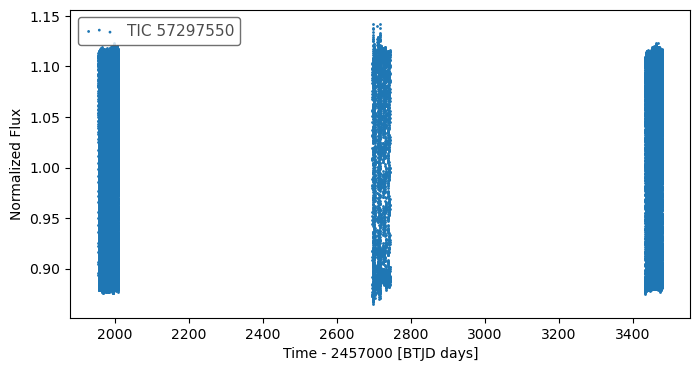

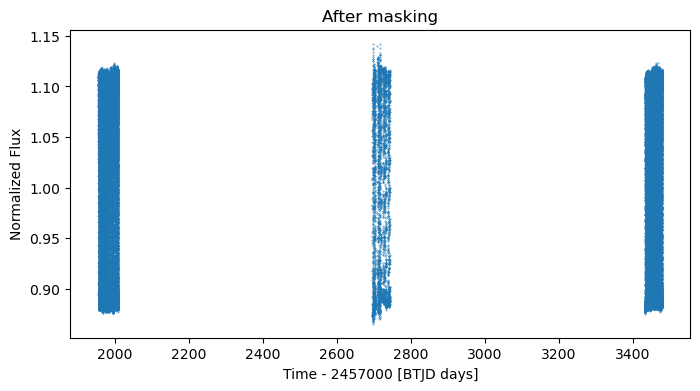

In [18]:
%matplotlib inline
# %matplotlib widget

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

# mask = time < 0 #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data  
mask = flux < 0.85    # remove occassional outliers

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [ ]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,            
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [ ]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

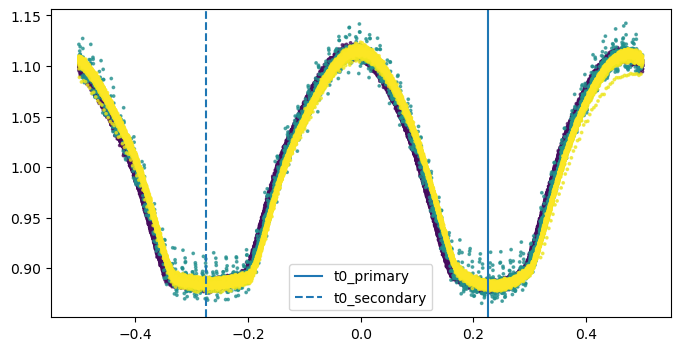

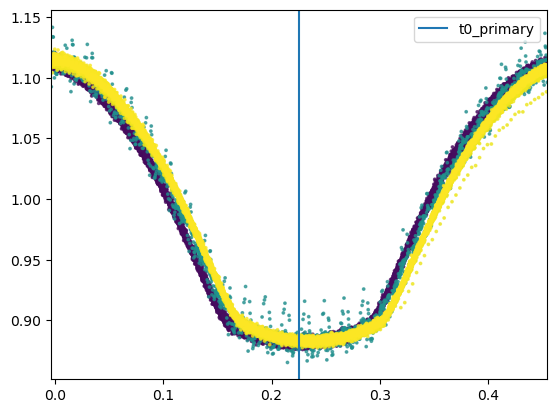

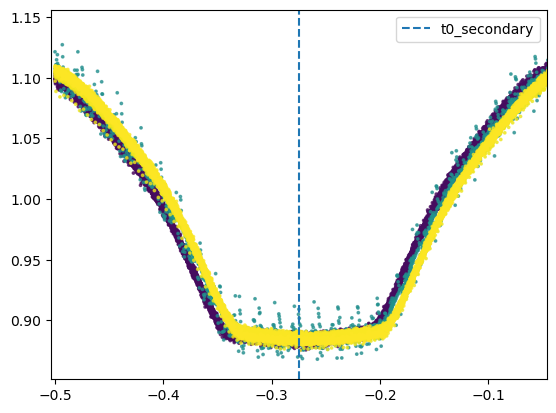

In [43]:
%matplotlib inline
# %matplotlib widget

from astropy.time import Time

# define the orbital period and the t0 


# Using the period / epoch from the 2025 paper
period = 0.38222952 

# from the paper, the phase is off by phase ~0.05
# t0_primary_hjd = 2453410.3724
# t0_primary_bjd = 2453410.373136  # conversion at https://astroutils.astronomy.osu.edu/time/hjd2bjd.html
# t0_primary = Time(t0_primary_bjd, format="jd", scale="tdb").to_value("btjd")  # in BTJD

t0_secondary = 1955.9662  # ignored the paper. MCMC 's t0_primary it should have been the secondary 
t0_primary = t0_secondary + period / 2


# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
if t0_secondary is not None:
    t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

duration_hr_primary = 3.5
duration_hr_secondary = duration_hr_primary

# t0_for_plotting = 0  # keep 0 for plotting purposes
t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.45  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.xlim(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.6 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.6 * duration_hr_primary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.xlim(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.6 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.6 * duration_hr_secondary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

### Detrend (optional)

- detrended flux is in `flux_detrended`, and won't be used in subsequent work by default

In [ ]:
# show data to visualize what's changed in each step below
data  

In [ ]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

In [ ]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

In [ ]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1, label="flux_detrended")
plt.legend()
plt.show()

plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.xlim(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.6 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.6 * duration_hr_primary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.xlim(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.6 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.6 * duration_hr_secondary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

<span style="background-color: rgba(255, 0, 0, 0.6);"> NOTE: </span> The zoom windows below for the eclipses are made **smaller**, an attempt to reduce the complications of EW variability outside the minima (and some assymetery)

### Now that the data is ready we can start 

In [59]:
# define the midpoints of the primary and secondary eclipses and the window width
# from importlib import reload
# reload(etv_functions)

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
# use an even shorter window, larger window makes fitting the minima (T2 and T3) less accurate
window_width_p = 0.8 * duration_hr_primary / 24 / period   # it seems to be difficult to bit model the flat bottom and the curves outside, focus on the overall shape for now
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p / 2) & (data['phase'] < midpoint_p + window_width_p / 2) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)

    window_width_s = 0.7 * duration_hr_secondary / 24 / period  
    # window_width_s = 0.22
    print("window_width_s (phase):", window_width_s)
    
    data_secondary = data[(data['phase'] > midpoint_s - window_width_s / 2) & (data['phase'] < midpoint_s + window_width_s / 2) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [1.067, -0.1838, midpoint_p, 0.0737, 2.146]  # clipped LC 0.8x duration
start_vals_s = [1.017, -0.1306, midpoint_s, 0.0604, 3.951]  # clipped LC 0.7x duration
# start_vals = [1.117, -0.2338, midpoint_p, 0.085, 1.9]
# start_vals_s = [1.117, -0.2306, midpoint_s, 0.10, 1.8]

# -- -- -- -- -- -- -- -- --
# etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess_interactive(data_primary, ph_binned, flux_binned, err_binned, "midpoint_p", *start_vals)
if t0_secondary is not None:
    # etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)
    etv_functions.plot_initial_guess_interactive(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, "midpoint_s", *start_vals_s)

print("Start params for  fitting period with MCMC on df_primary:")
print(f"[{start_vals[0]}, {start_vals[1]}, t0_primary, {start_vals[3]}, {start_vals[4]}, {period}],");

Primary:   1956.15731476 0.22499999999981246
window_width_p (phase): 0.30522673043847237
Secondary: 1955.9662 -0.274999999999903
window_width_s (phase): 0.26707338913366324


Output(layout=Layout(padding='1em 0px'), outputs=({'output_type': 'display_data', 'data': {'text/plain': '<Fig…

Output(layout=Layout(padding='1em'), outputs=({'name': 'stdout', 'text': '[1.067, -0.1838, midpoint_p, 0.0737,…

Output(layout=Layout(padding='1em 0px'), outputs=({'output_type': 'display_data', 'data': {'text/plain': '<Fig…

Output(layout=Layout(padding='1em'), outputs=({'name': 'stdout', 'text': '[1.017, -0.1306, midpoint_s, 0.0604,…

Start params for  fitting period with MCMC on df_primary:
[1.067, -0.1838, t0_primary, 0.0737, 2.146, 0.38222952],


In [ ]:
if False: 
    # Export the data around primary eclipses, for period analysis outside of notebook
    data_primary[["time", "flux", "err"]].to_csv(f"tmp/data_primary_{ticid}.csv", index=False)

In [ ]:
# use MCMC to refine the period

use_mcmc_to_fit_period = False

from importlib import reload
reload(etv_functions)
reload(etvp)

if use_mcmc_to_fit_period:
    mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        [1.036, -0.151, t0_primary, 0.06669, 3.169, 0.38223054],
        nruns=1000, discard=600, 
        # nruns=20, discard=1, 
        pool=-2,
        plot_chains=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"])
    !$NOTIFY_CMD "Fitting of the period done"


### (Cont'd) Fit gloabl params of the global model with period fixed

100%|██████████████████████████████████████████████████████████| 2500/2500 [04:32<00:00,  9.17it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 125;
tau: [ 31.11198799  49.82270204  67.73548011  24.69223039 131.30271827]


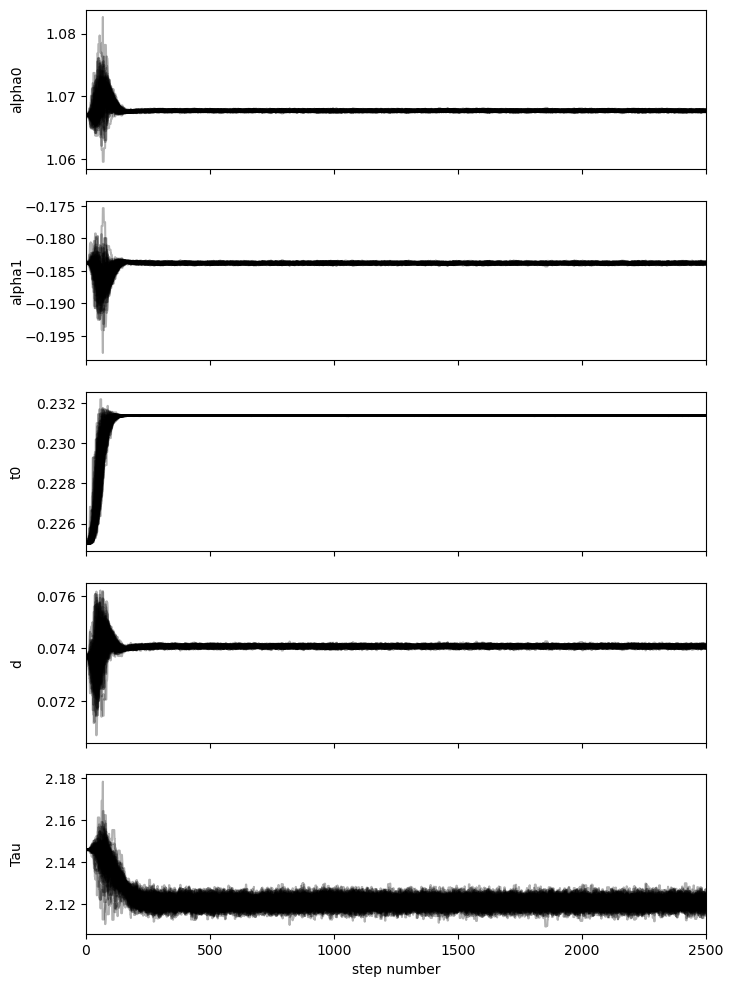

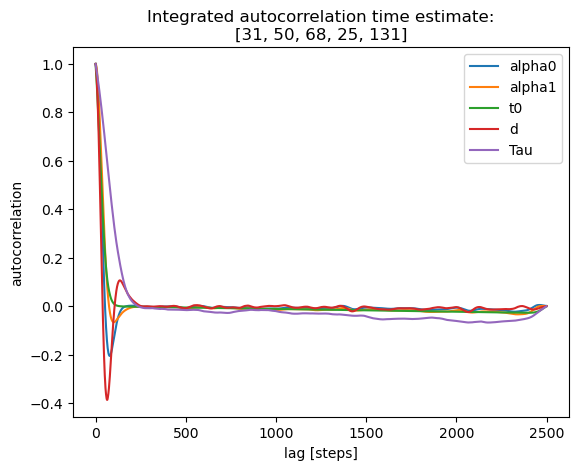

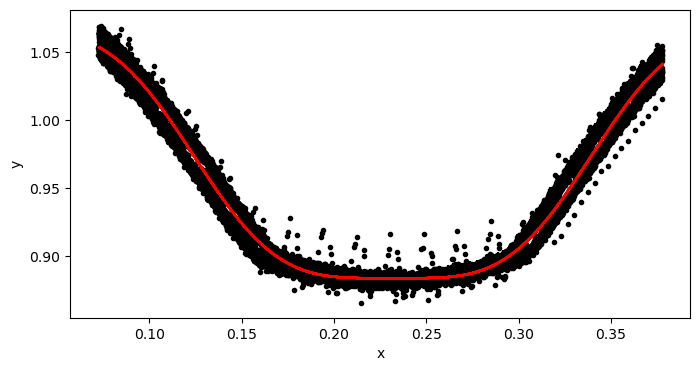

100%|██████████████████████████████████████████████████████████| 2500/2500 [04:29<00:00,  9.26it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 125;
tau: [157.42036732 161.98454659  58.69814154 169.13549997 174.8228319 ]


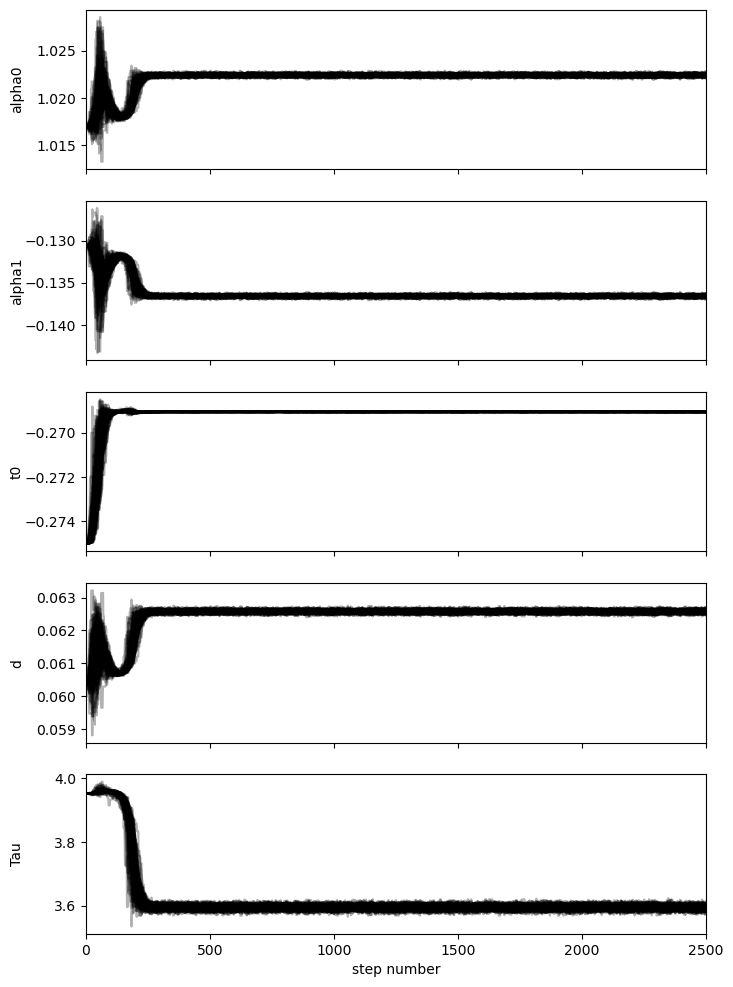

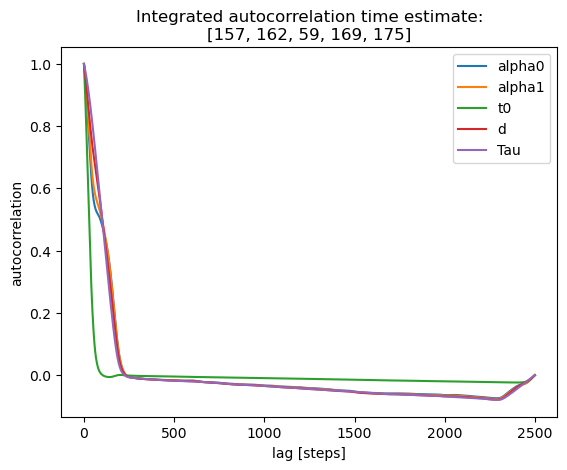

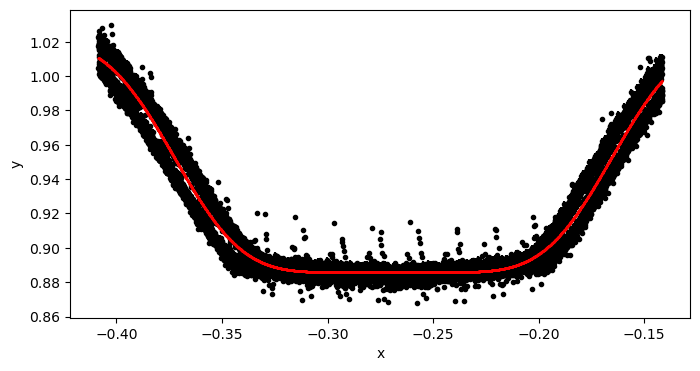

In [60]:
# run the initial model fit using MCMC for the primary and secondary eclipses 
run_init_fit = True

if run_init_fit:
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns=2500, pool=-2, autocorr_time_kwargs=dict(tol=20), plot_chains=True,  plot_autocorrelation=True, plot=True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns=2500, pool=-2, autocorr_time_kwargs=dict(tol=20), plot_chains=True,  plot_autocorrelation=True, plot=True)
    !$NOTIFY_CMD "Initial fit done"

In [ ]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")

    # # clipped LC: Dx1.2, nruns=1000
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.1096616688864176, -0.2283868470740496, 0.23148232023094428, 0.09131618881700126, 1.5236481902466137
    # mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0972373936571587, -0.2152054589904281, -0.26942077482832305, 0.09349431559058899, 1.657427964151701
    # # clipped LC: Dx1.2,  nruns=2500
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.10966227112884, -0.22838765289012558, 0.23148233189777004, 0.09131549538165237, 1.5237079298937943
    # mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.097237467452321, -0.2152047826060582, -0.26942113588630645, 0.09349475475383831, 1.6573902809419878

    # clipped LC: Dx0.8/0.7 nruns=2500
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.067708253737462, -0.1838006450698242, 0.23137123963057815, 0.07407790395465891, 2.1209656810579
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0223868386703832, -0.1365918419658833, -0.26906387428459666, 0.06257488262540162, 3.5941992629189614

    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])

    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])    

In [61]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.067708253737462, -0.1838006450698242, 0.23137123963057815, 0.07407790395465891, 2.1209656810579
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0223868386703832, -0.1365918419658833, -0.26906387428459666, 0.06257488262540162, 3.5941992629189614


3986

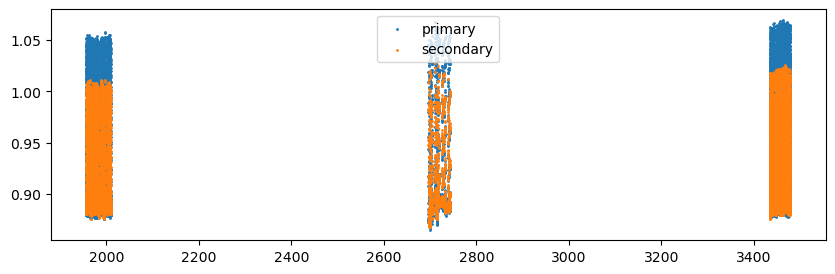

In [62]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

1956.15731476 0.38222952 1956.15731476


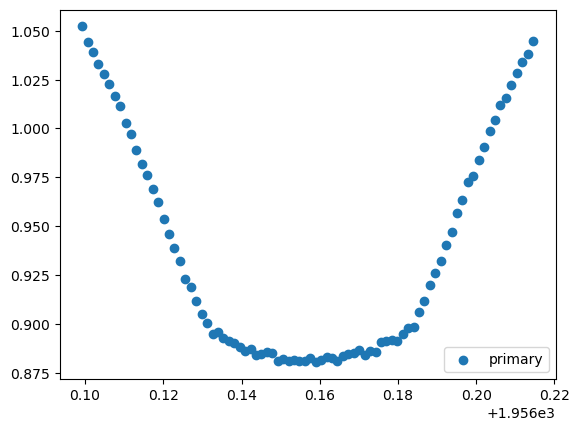

1956.15731476 0.38222952 1956.53954428


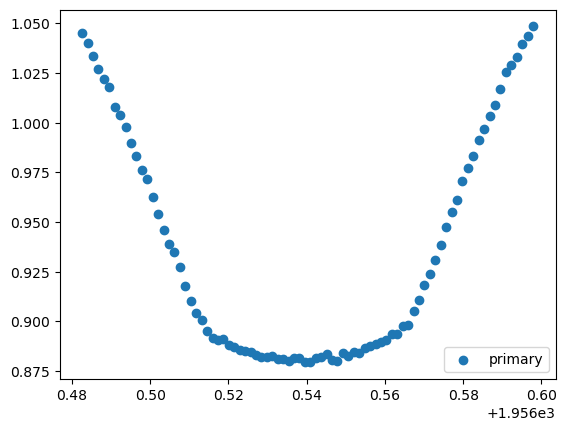

1956.15731476 0.38222952 1956.9217738


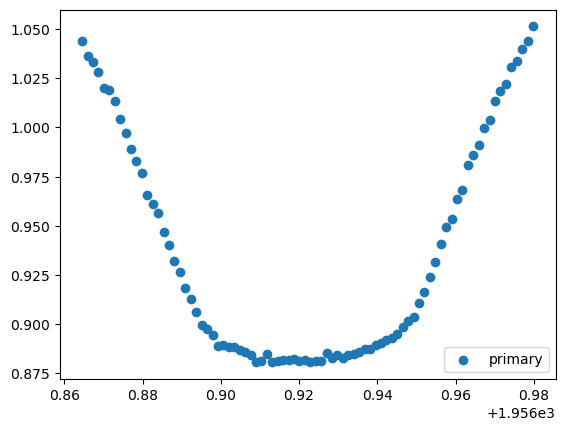

1955.9662 0.38222952 1955.9662


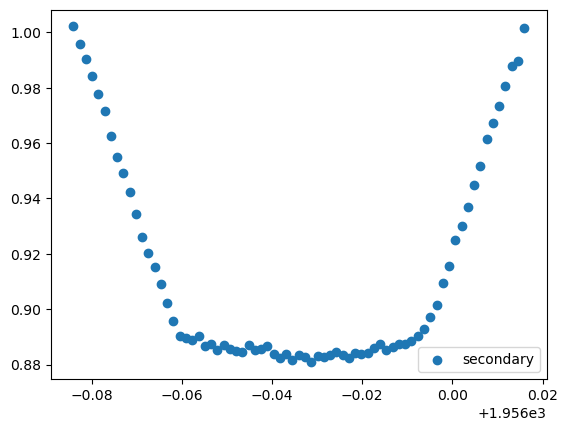

1955.9662 0.38222952 1956.34842952


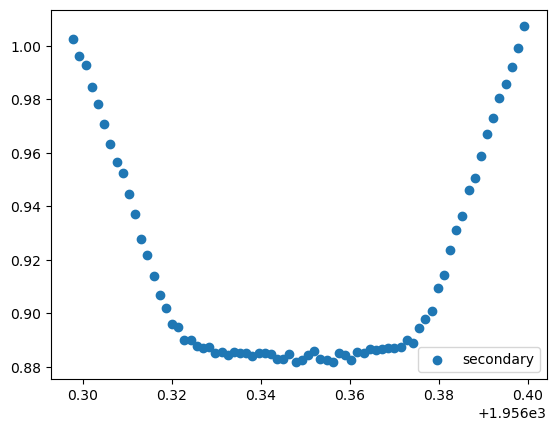

1955.9662 0.38222952 1956.73065904


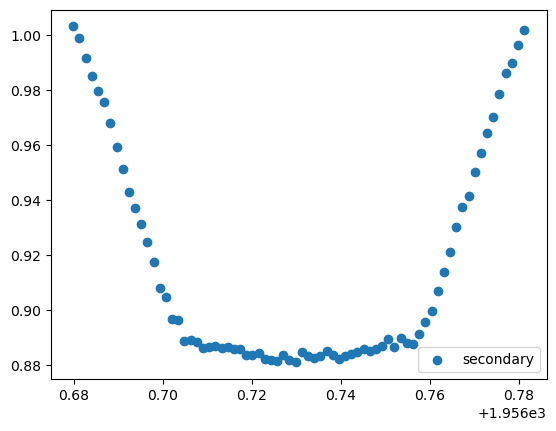

In [63]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

if t0_secondary is not None:
    for i in tr_index[0:3]:        
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux) 
        yerr = np.array(data_secondary.err)
        
        print (t0_secondary, period, transit_time)
        
        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
        
        x = np.array(x[mask])
        y = np.array(y[mask]) 
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

### Fit Indiividual Eclipses

In [65]:
# Provide a warning if the expected number of data points per clipped LC is smaller than the default minimum `min_number_data` (20)
longest_cadence = np.max(sr.exptime)
est_number_data_primary   = int(duration_hr_primary * 0.8 / longest_cadence.to(u.hr).value)
print(f"Expected num of data points of a clipped LC in longest cadence ({longest_cadence}) for primary: {est_number_data_primary}")
if est_number_data_primary < 20:
    display(HTML("<span style='background-color: rgba(255, 0, 0, 0.7); padding-left: 1ch; padding-right: 1ch;'>WARN:</span> num of data points for a clipped LC (primary) < 20"))

if t0_secondary is not None:
    est_number_data_secondary = int(duration_hr_secondary * 0.7 / longest_cadence.to(u.hr).value)
    print(f"Expected num of data points of a clipped LC in longest cadence ({longest_cadence}) for secondary:  {est_number_data_secondary}")
    if est_number_data_secondary < 20:
        display(HTML("<span style='background-color: rgba(255, 0, 0, 0.7); padding-left: 1ch; padding-right: 1ch;'>WARN:</span> num of data points for a clipped LC (secondary) < 20"))

Expected num of data points of a clipped LC in longest cadence (600.0 s) for primary: 16


Expected num of data points of a clipped LC in longest cadence (600.0 s) for secondary:  14


Fitting individual primary eclipses...
Creating new manifest file
1956.15731476 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.20it/s]


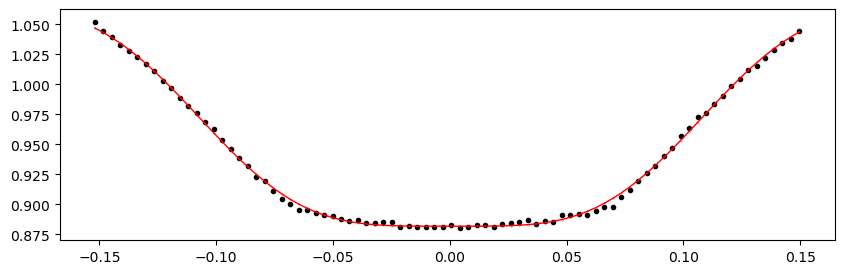

1956.53954428 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.95it/s]


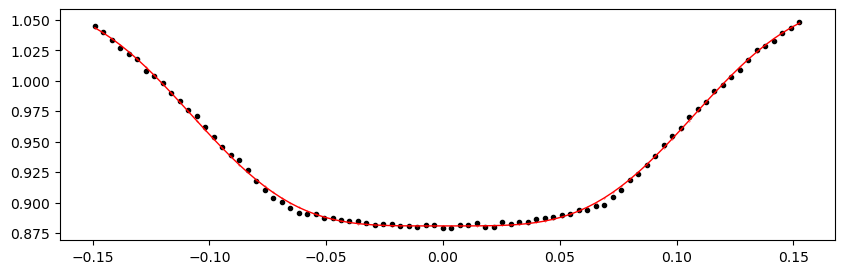

1956.9217738 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.77it/s]


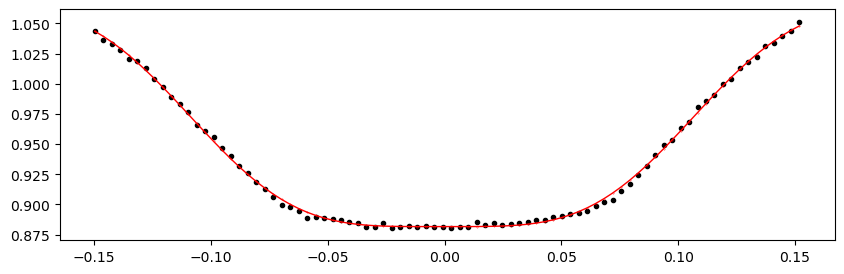

1957.30400332 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.09it/s]


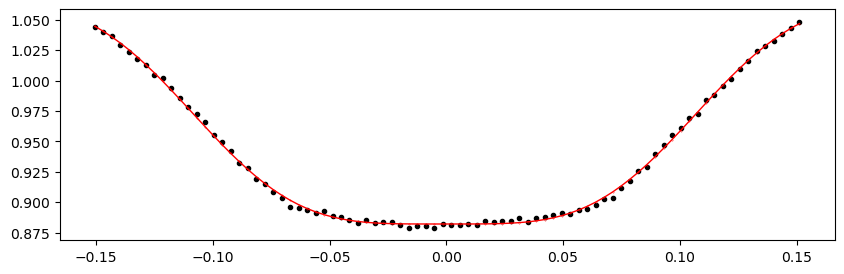

1957.68623284 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.16it/s]


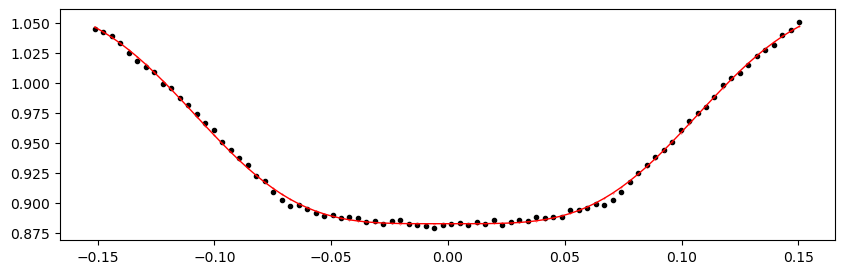

1958.06846236 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.01it/s]


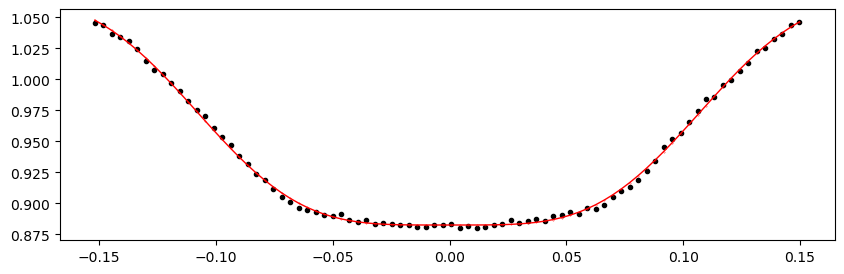

1958.45069188 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.77it/s]


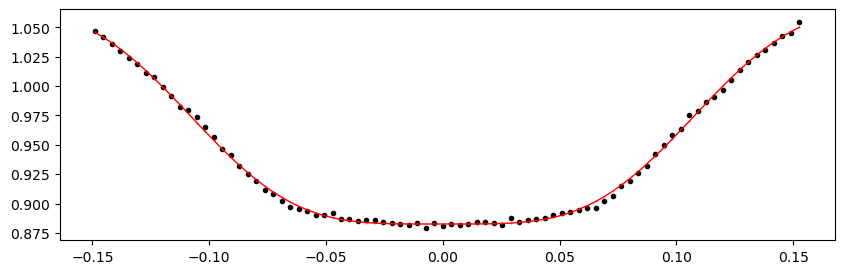

1958.8329214 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.84it/s]


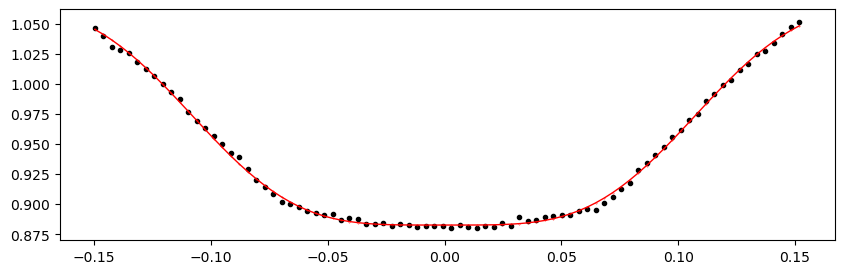

1959.21515092 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 311.00it/s]


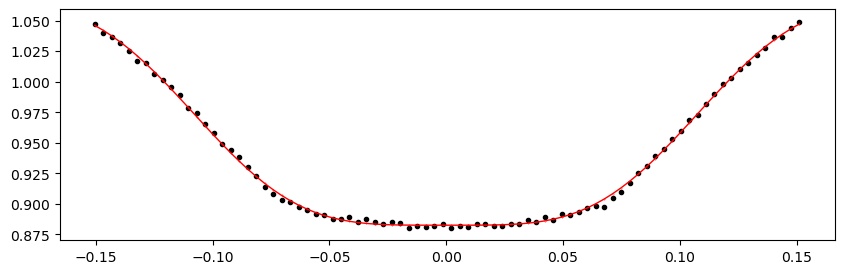

1959.59738044 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.28it/s]


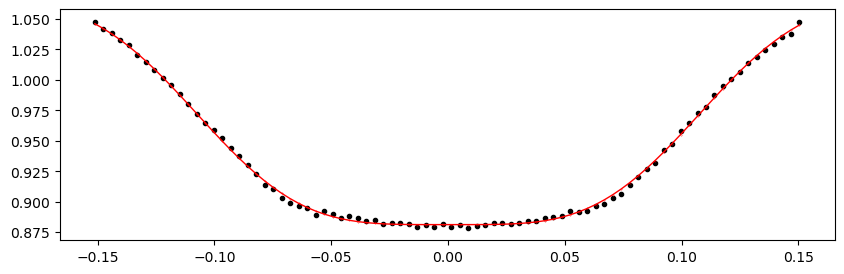

1959.97960996 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.28it/s]


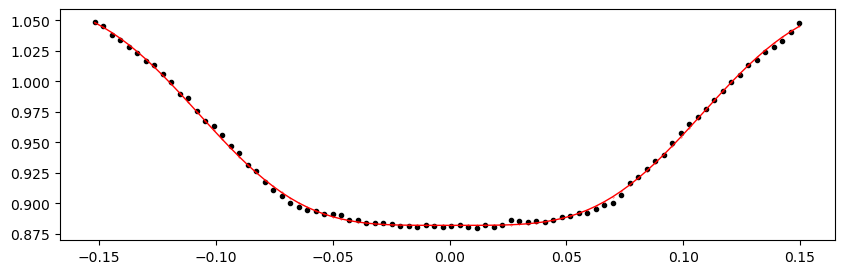

1960.36183948 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.34it/s]


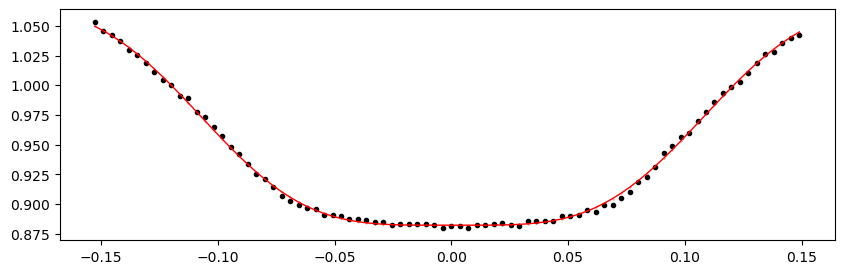

1960.7440689999999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.04it/s]


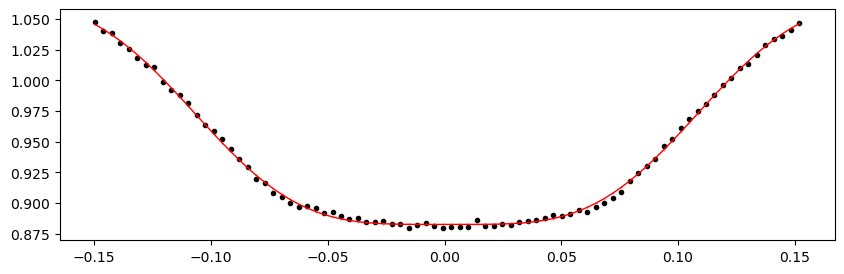

1961.1262985199999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.12it/s]


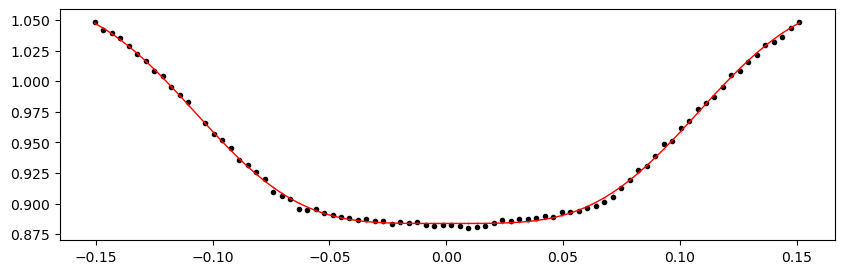

1961.5085280399999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 333.21it/s]


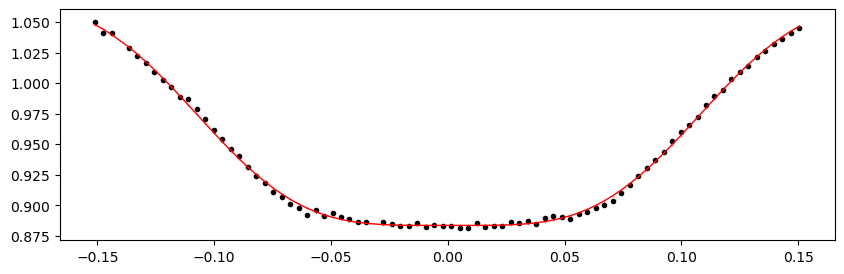

1961.8907575599999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.86it/s]


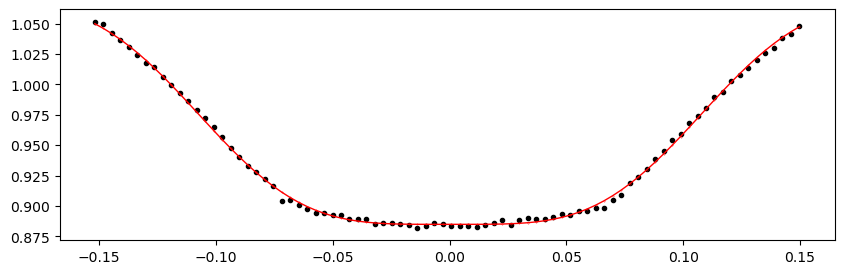

1962.27298708 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.74it/s]


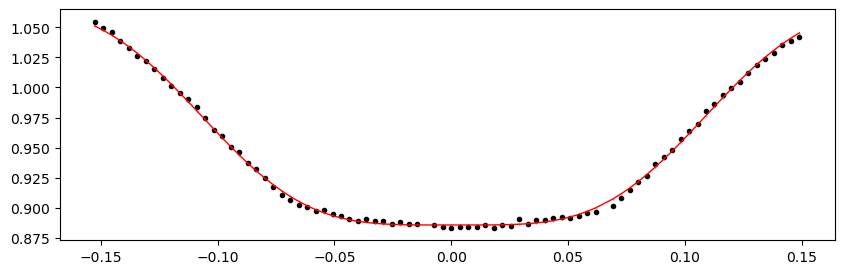

1962.6552166 1.067708253737462 -0.1838006450698242 0


100%|██████████████████████████████████████████████████████| 10000/10000 [2:15:50<00:00,  1.23it/s]


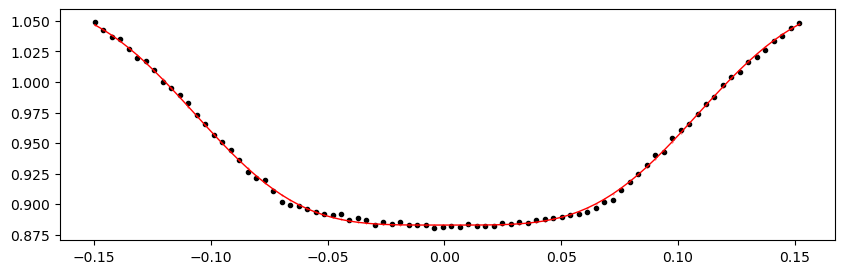

1963.03744612 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 245.53it/s]


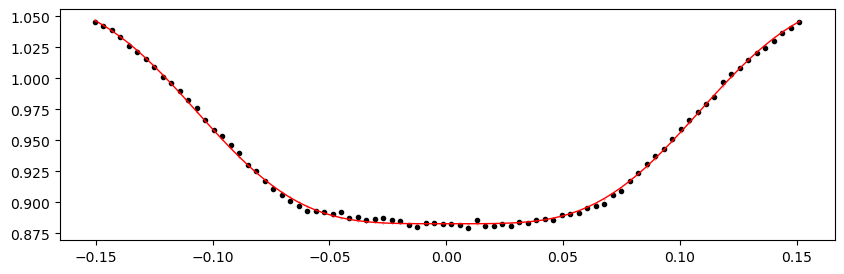

1963.41967564 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.89it/s]


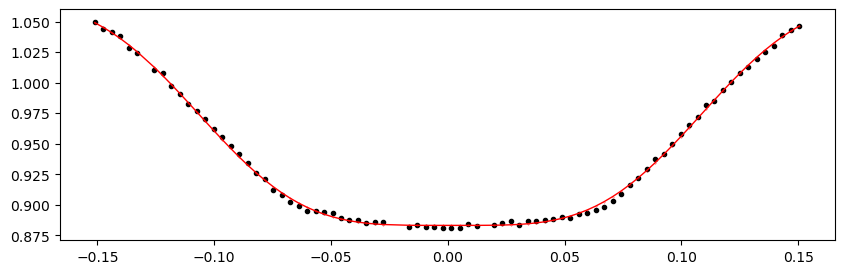

1963.80190516 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.64it/s]


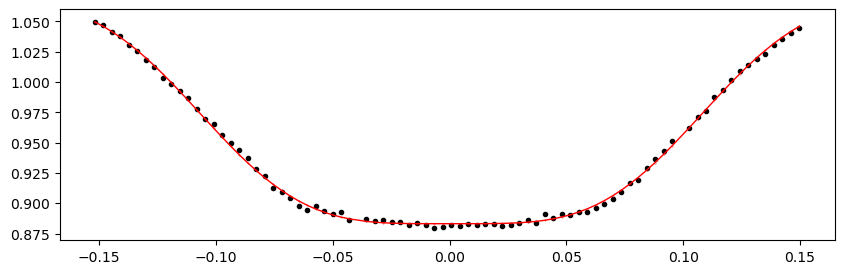

1964.18413468 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.37it/s]


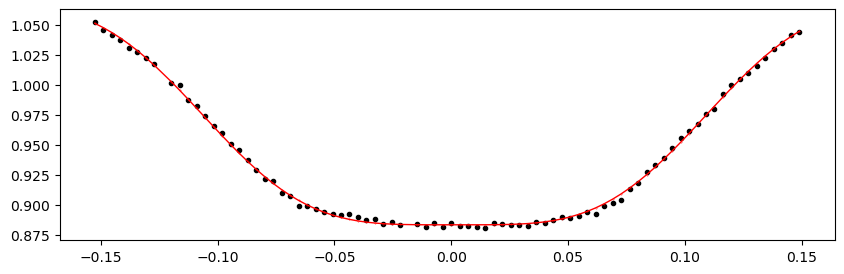

1964.5663642 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.09it/s]


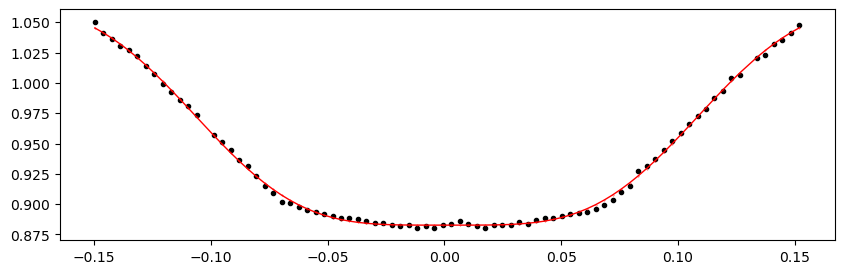

1964.94859372 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.57it/s]


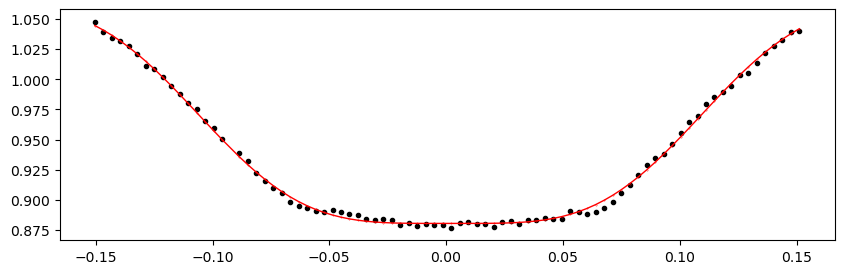

1965.33082324 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.59it/s]


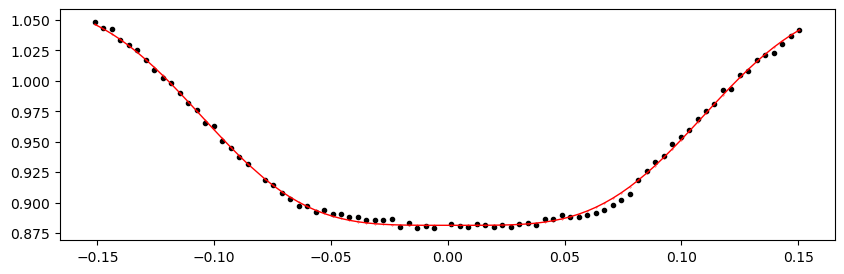

1965.71305276 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.93it/s]


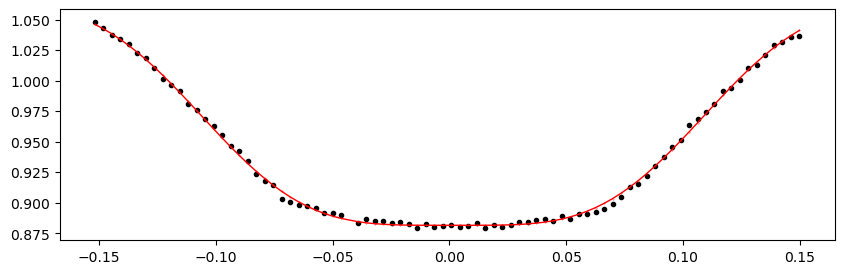

1966.09528228 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.73it/s]


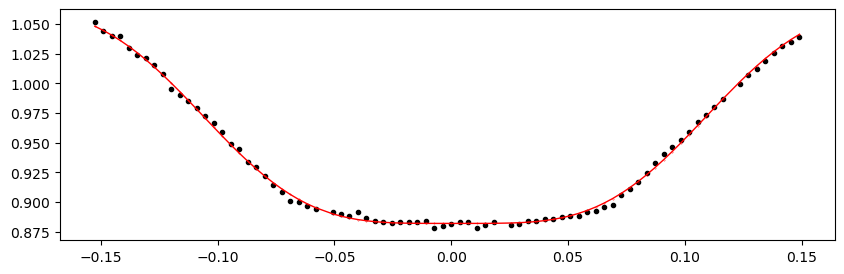

1966.4775118 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 312.11it/s]


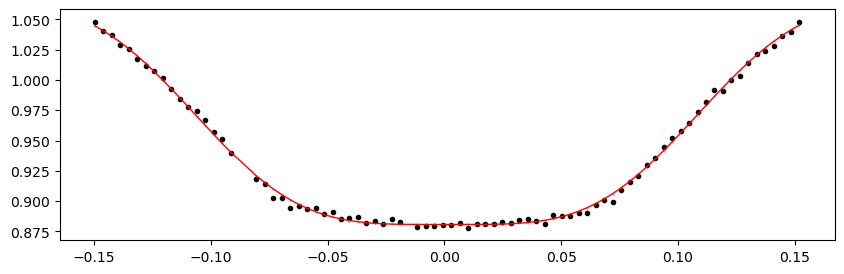

1966.85974132 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.27it/s]


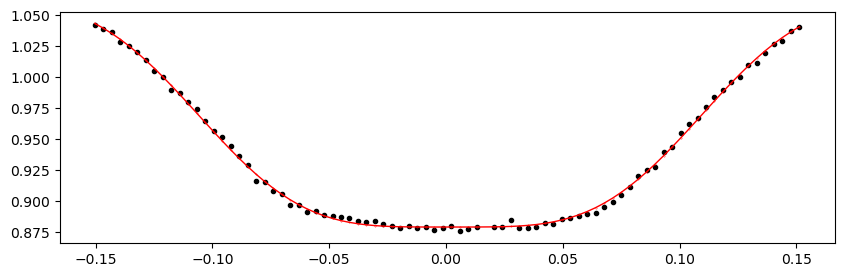

1967.24197084 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.85it/s]


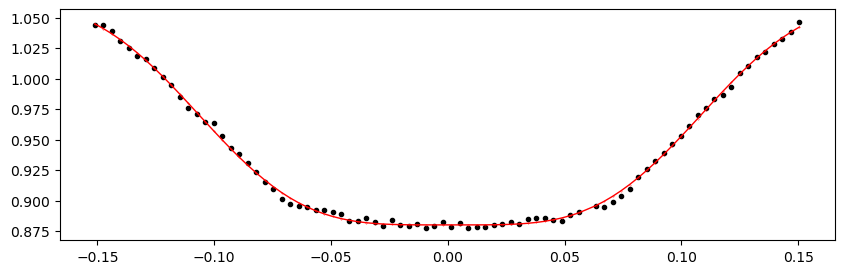

1967.62420036 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.83it/s]


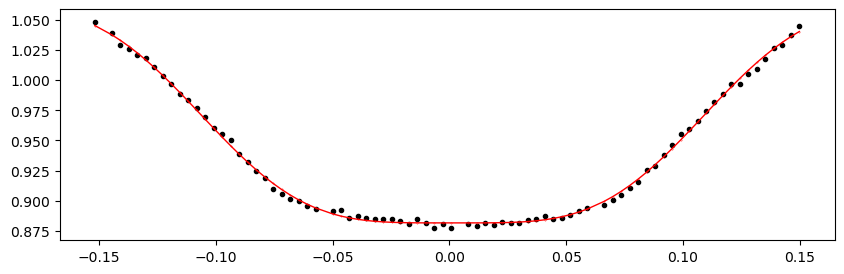

1968.00642988 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.20it/s]


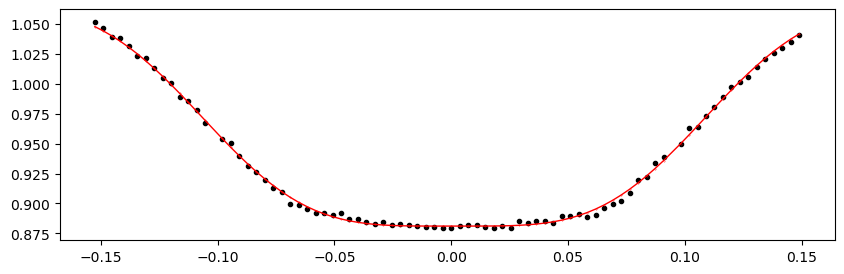

Time 1968.3886594 does not have enough data points: 14
1969.5353479599999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.71it/s]


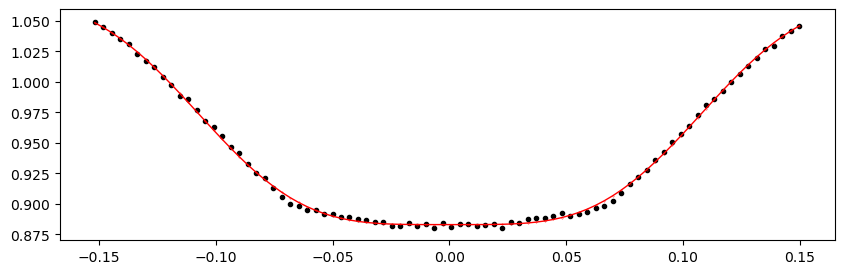

1969.9175774799999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.54it/s]


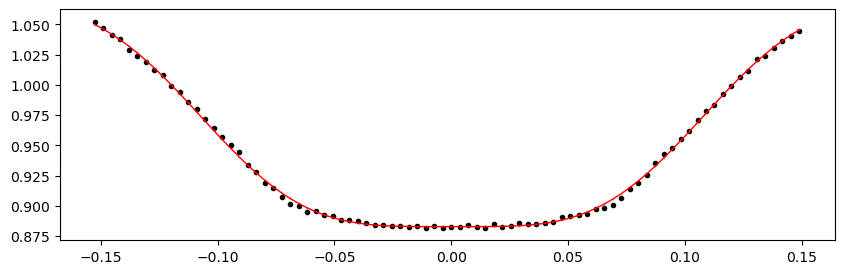

1970.2998069999999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.75it/s]


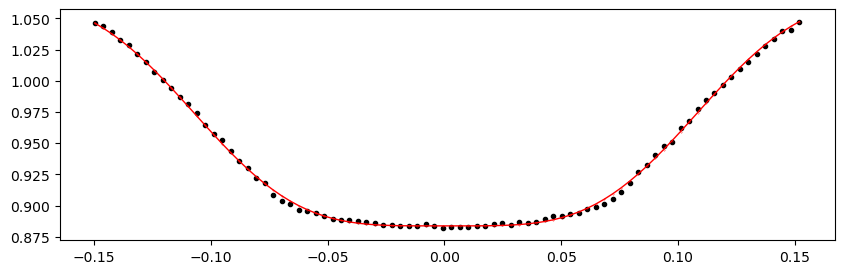

1970.6820365199999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 291.67it/s]


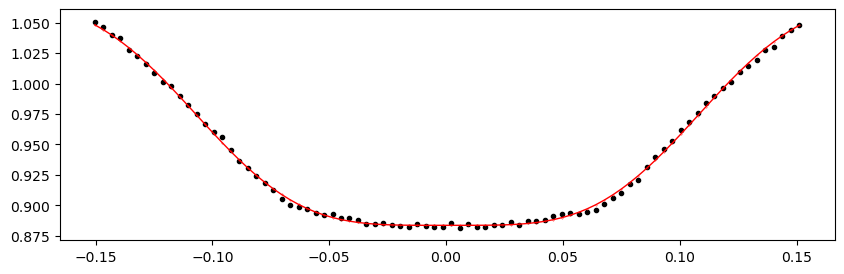

1971.06426604 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.83it/s]


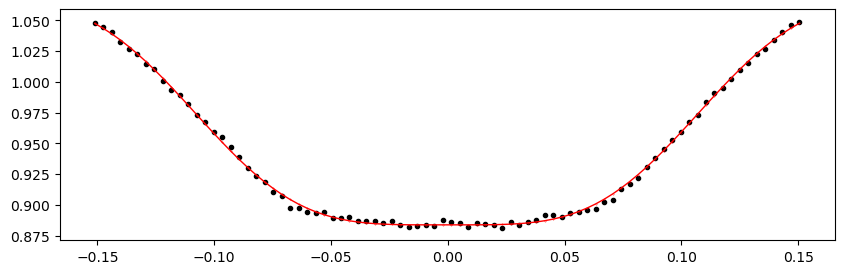

1971.44649556 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.41it/s]


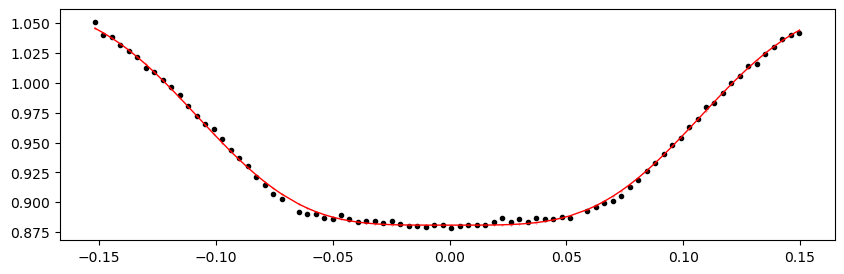

1971.82872508 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.44it/s]


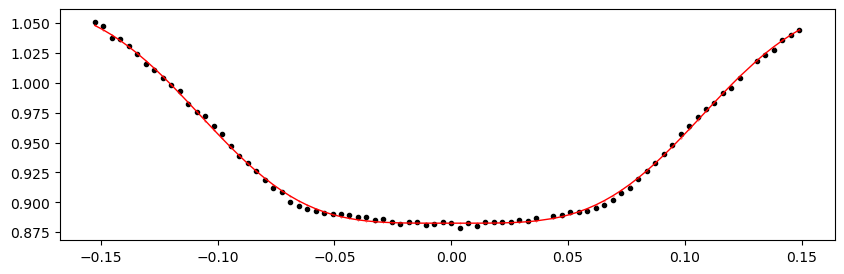

1972.2109546 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.53it/s]


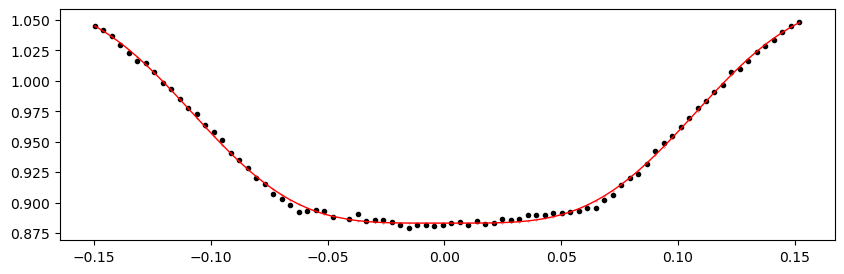

1972.59318412 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.33it/s]


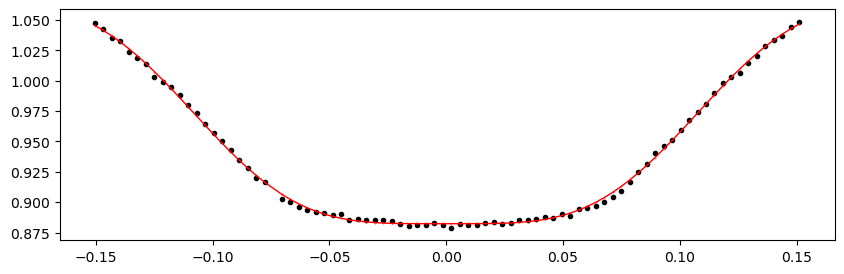

1972.97541364 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.69it/s]


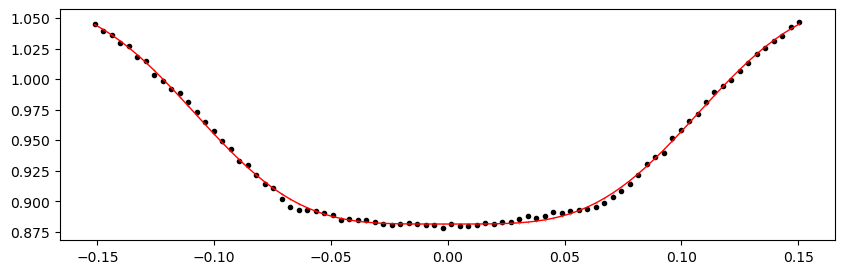

1973.35764316 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.80it/s]


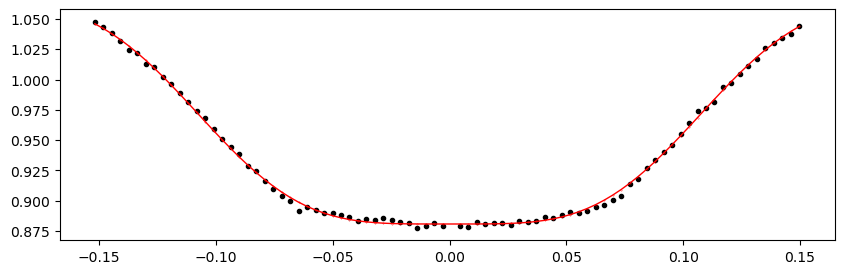

1973.73987268 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.55it/s]


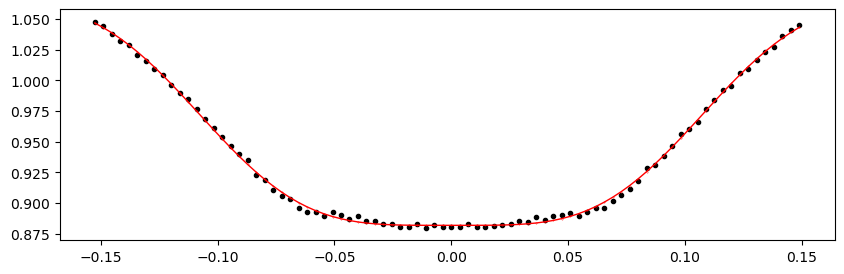

1974.1221022 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.24it/s]


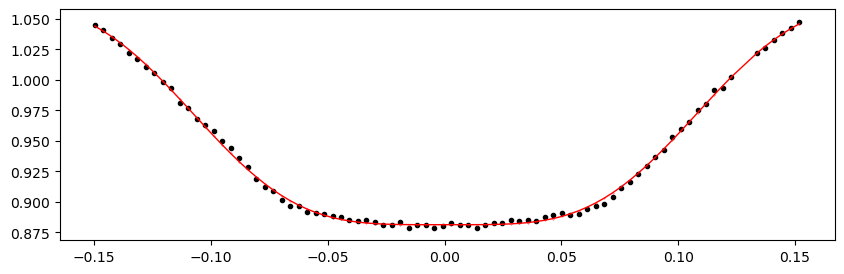

1974.50433172 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.83it/s]


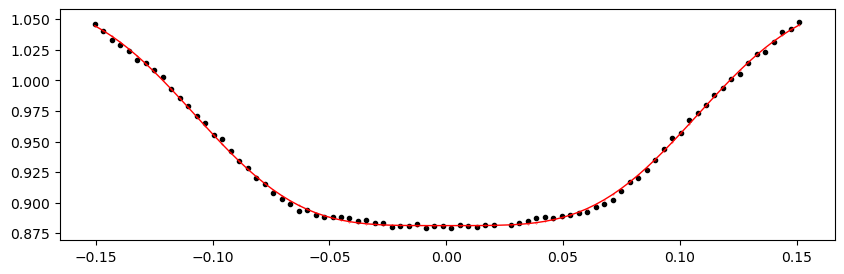

1974.88656124 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.76it/s]


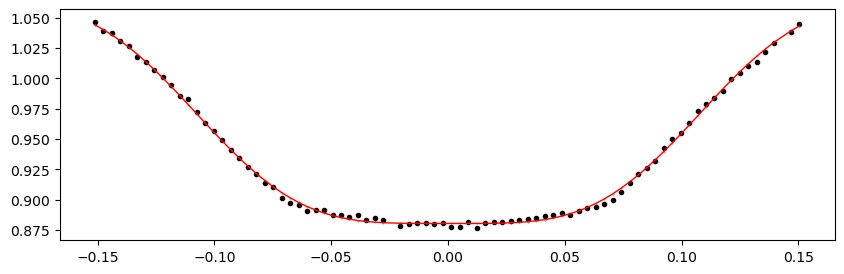

1975.26879076 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.69it/s]


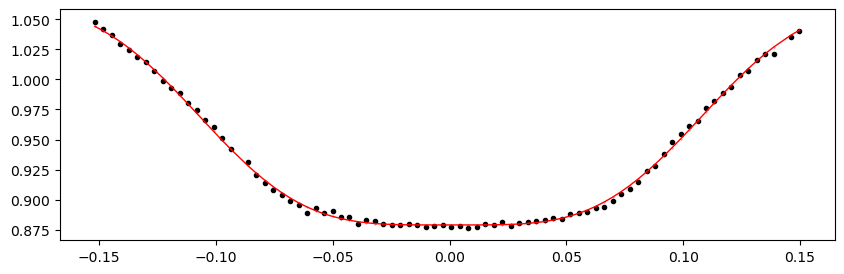

1975.65102028 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.31it/s]


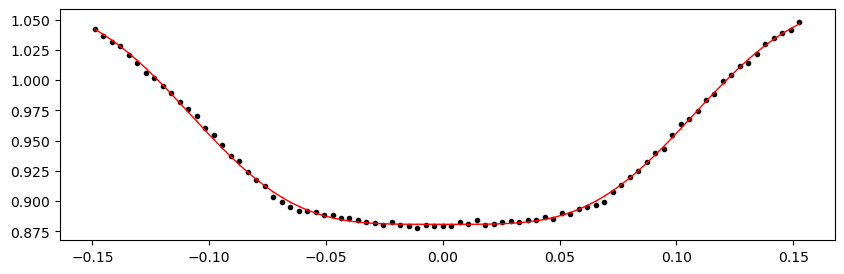

1976.0332498 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.21it/s]


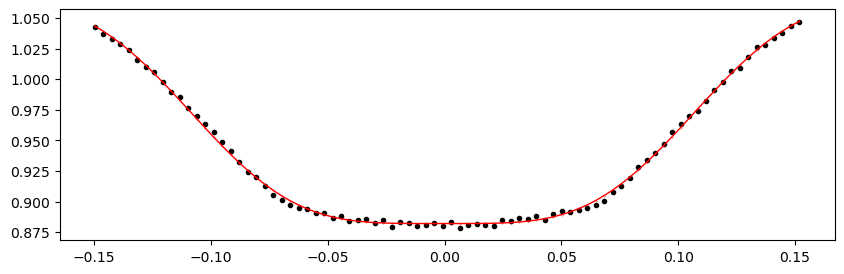

1976.41547932 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.17it/s]


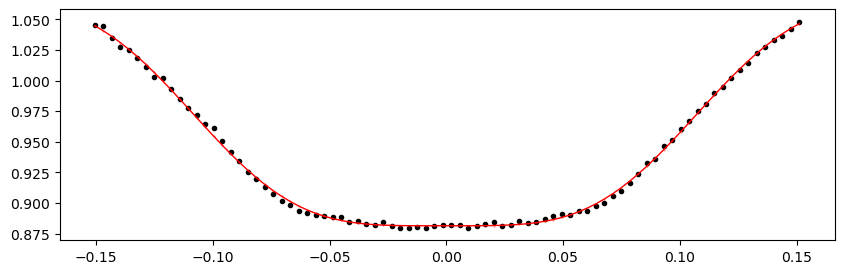

1976.79770884 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.61it/s]


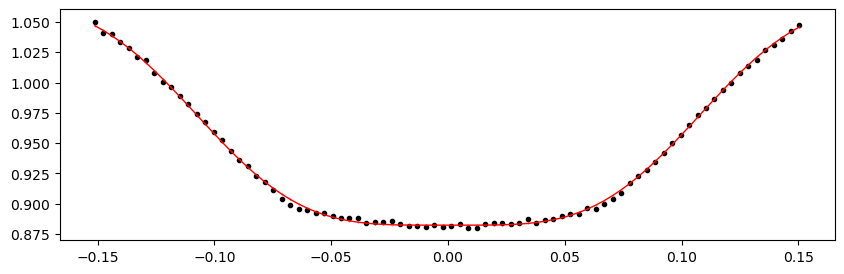

1977.17993836 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.46it/s]


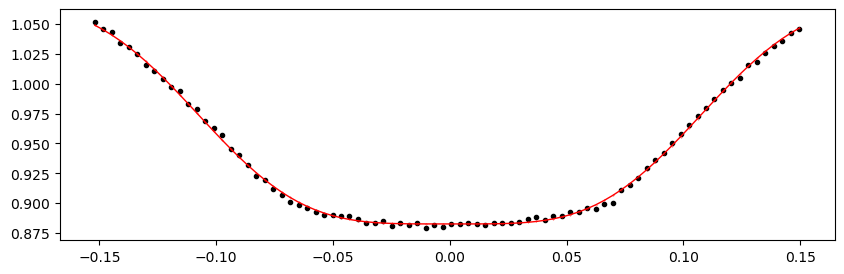

1977.56216788 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.64it/s]


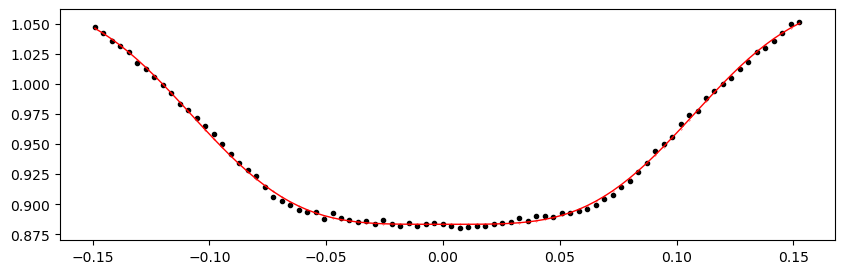

1977.9443974 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.21it/s]


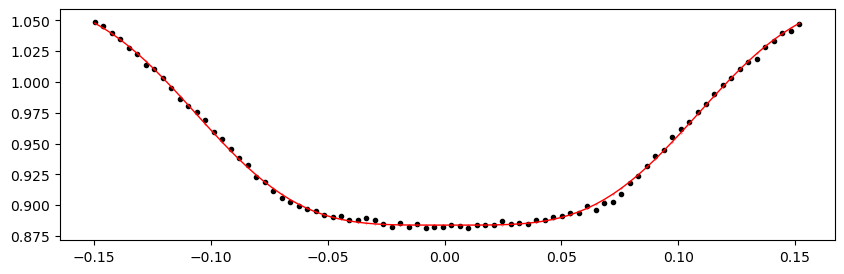

1978.3266269199999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.75it/s]


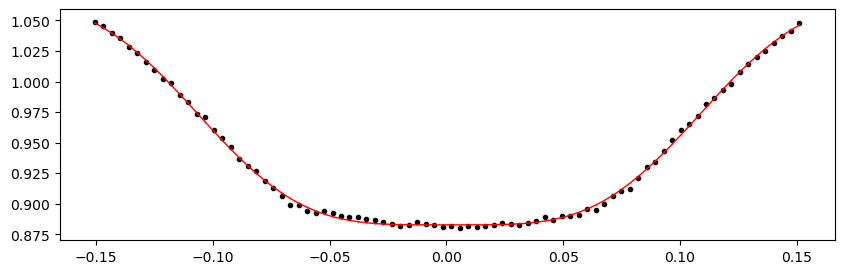

1978.7088564399999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.96it/s]


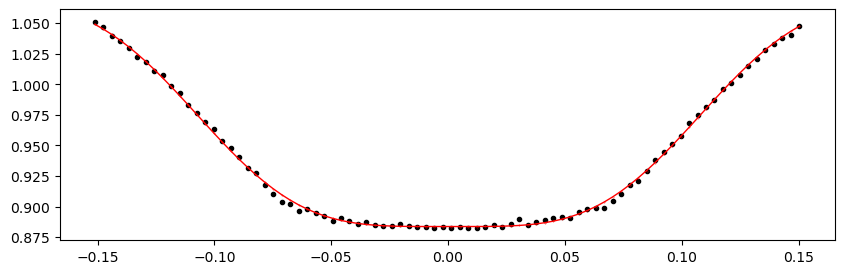

1979.0910859599999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.22it/s]


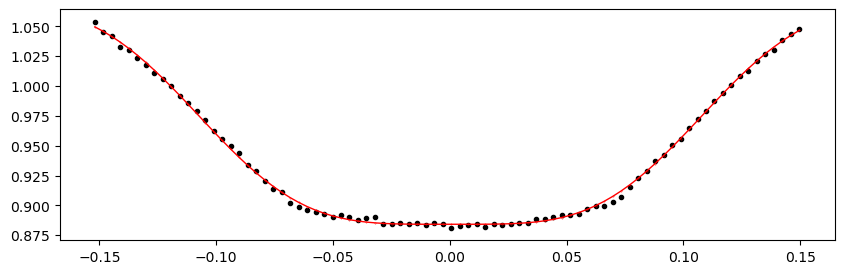

1979.4733154799999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.80it/s]


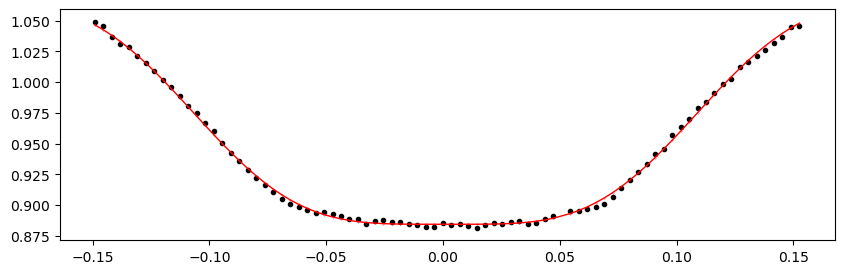

1979.855545 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.95it/s]


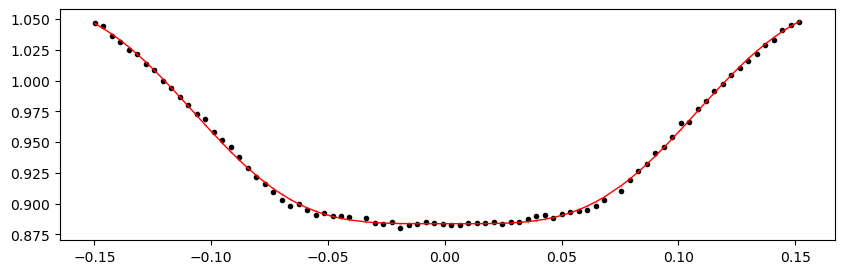

1980.23777452 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.22it/s]


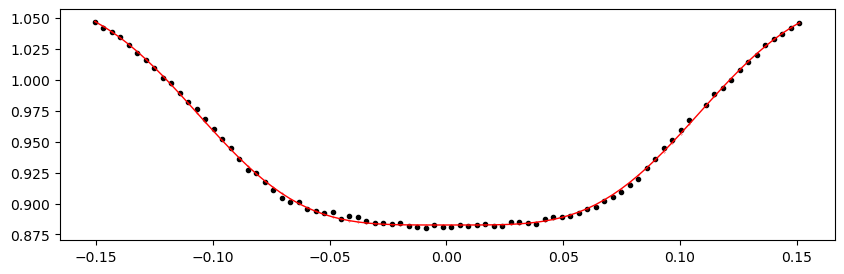

1980.62000404 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.89it/s]


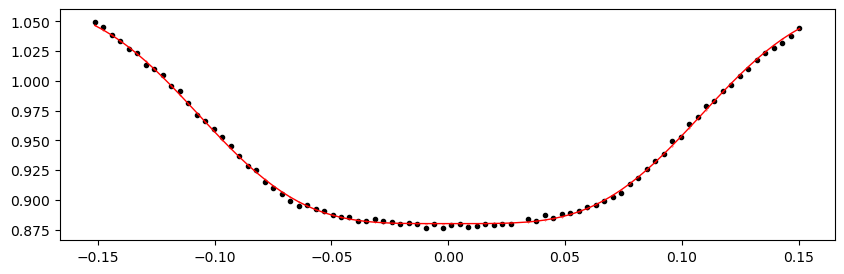

1981.00223356 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.96it/s]


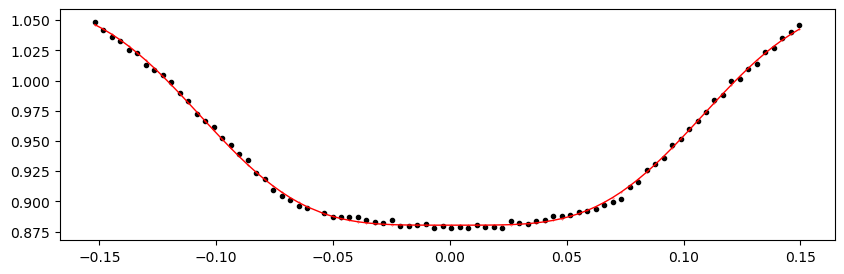

1981.38446308 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.16it/s]


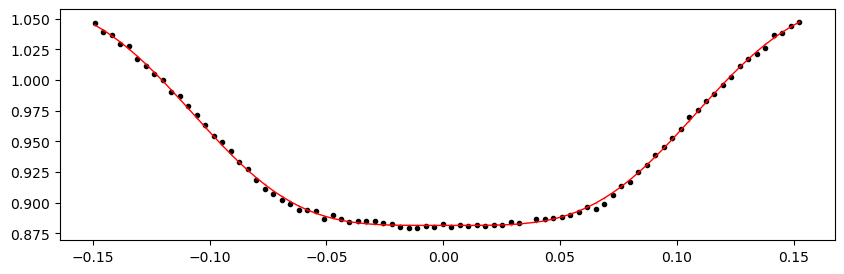

1981.7666926 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.43it/s]


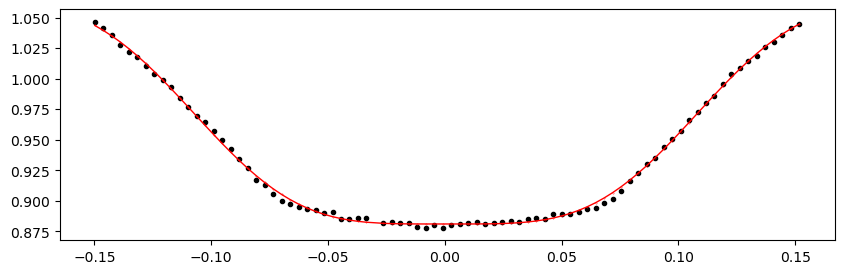

1982.14892212 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.11it/s]


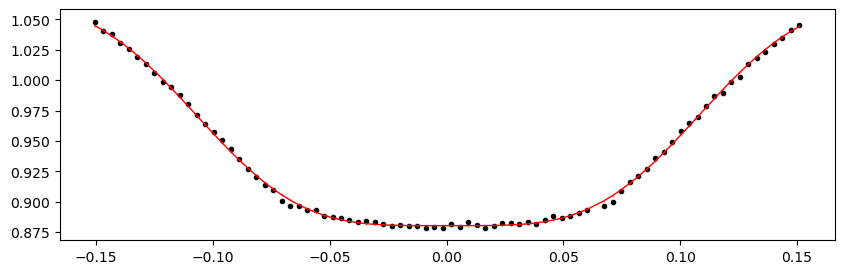

1983.6778402 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.95it/s]


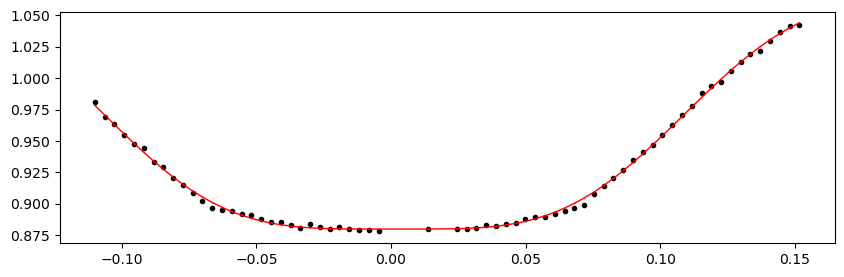

1984.06006972 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.54it/s]


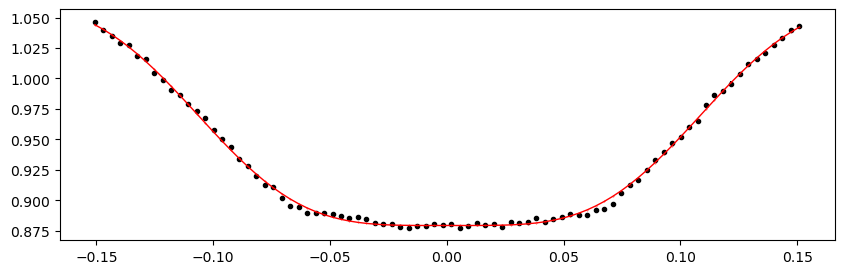

1984.44229924 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.67it/s]


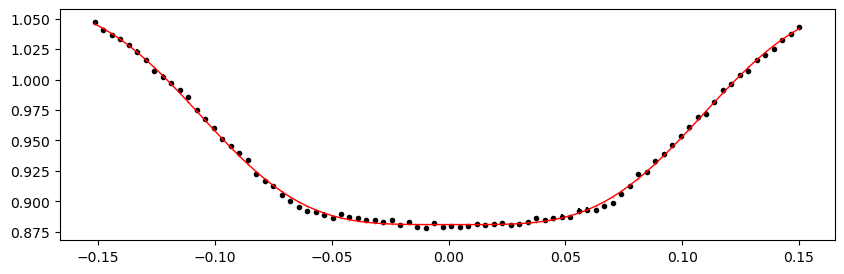

1988.2645944399999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 357.00it/s]


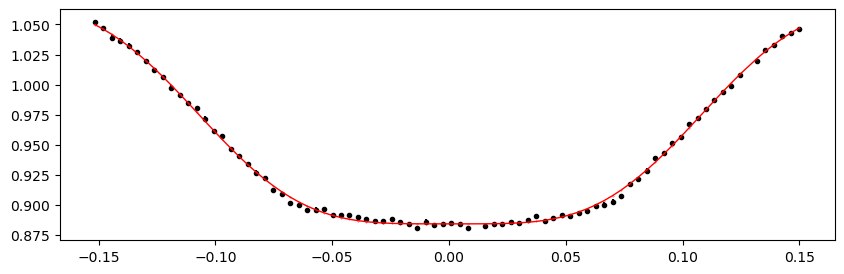

1988.64682396 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.02it/s]


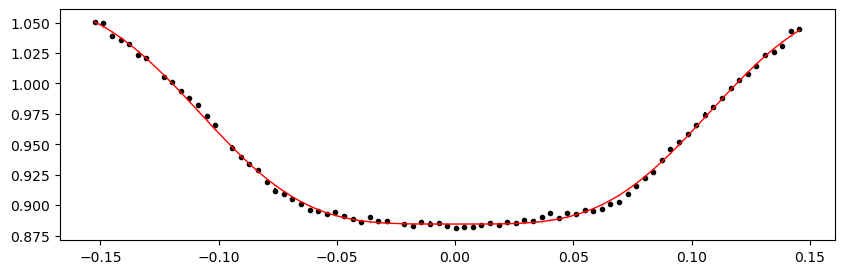

1989.02905348 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.80it/s]


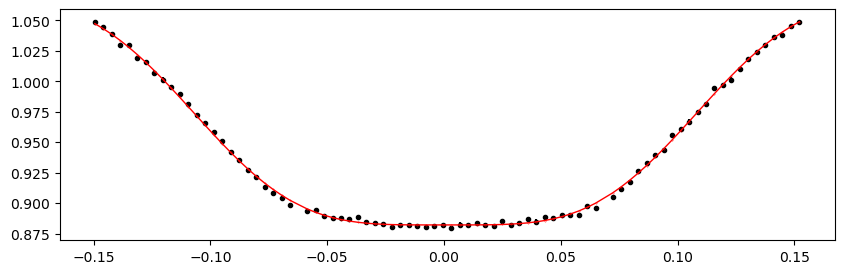

1989.411283 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.40it/s]


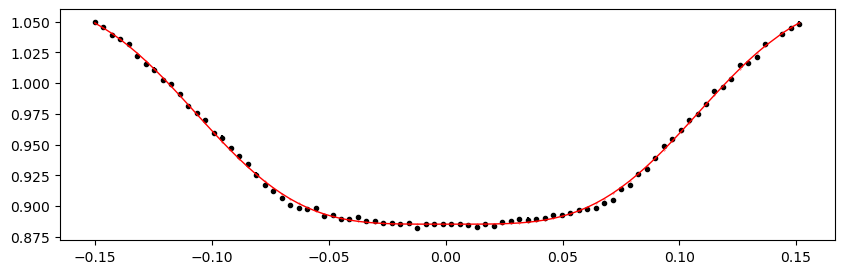

1989.79351252 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.20it/s]


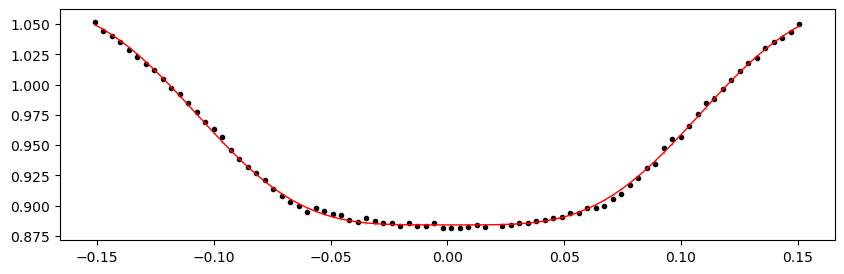

1990.17574204 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.67it/s]


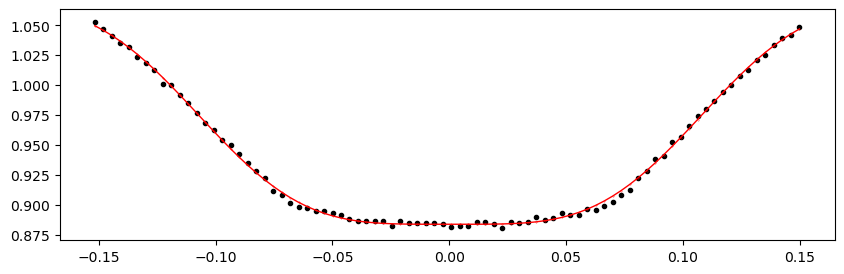

1990.55797156 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.24it/s]


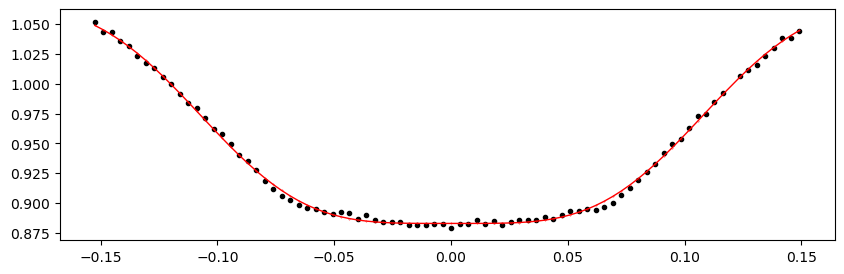

1990.94020108 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.17it/s]


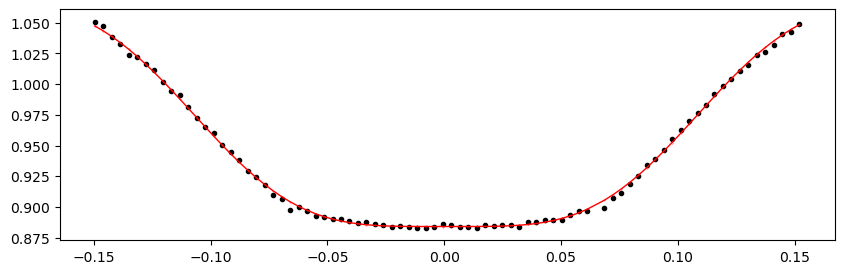

1991.3224306 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.97it/s]


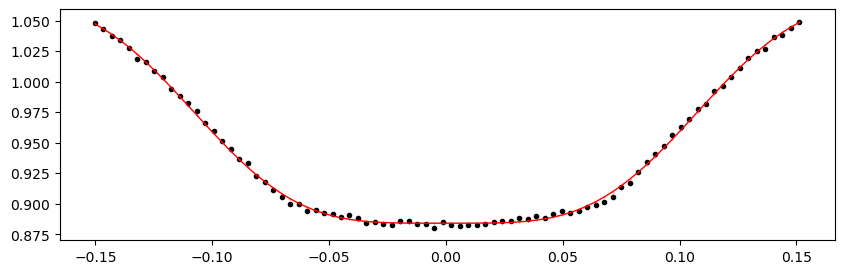

1991.70466012 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.14it/s]


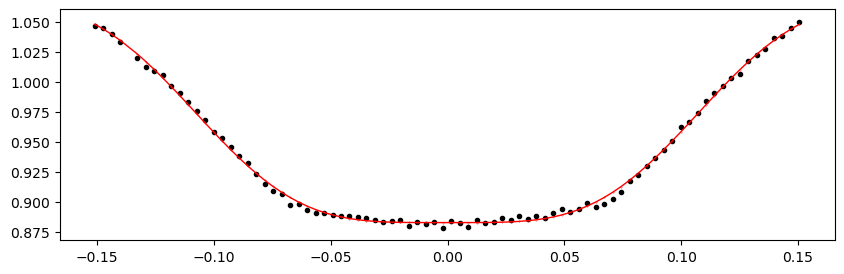

1992.08688964 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.22it/s]


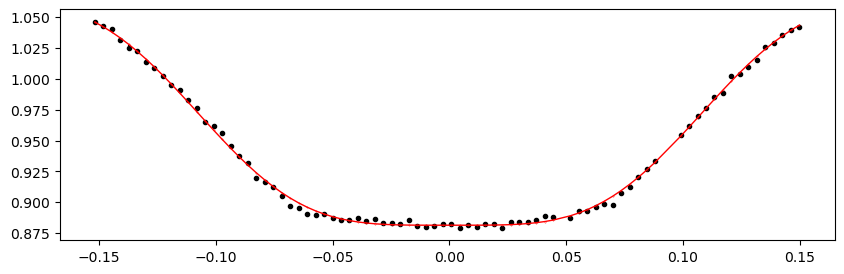

1992.46911916 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.75it/s]


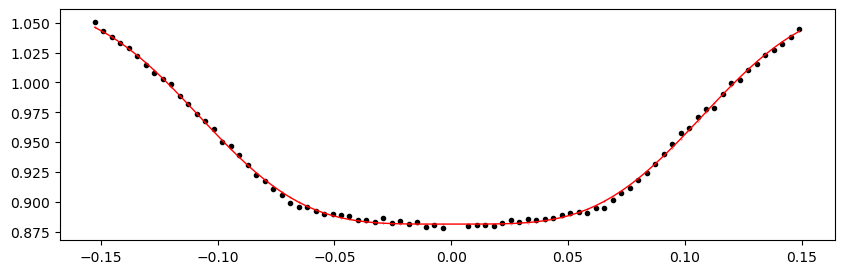

1992.85134868 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.66it/s]


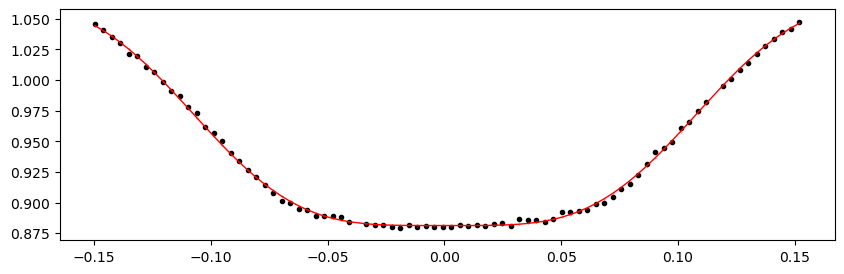

1993.2335782 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.53it/s]


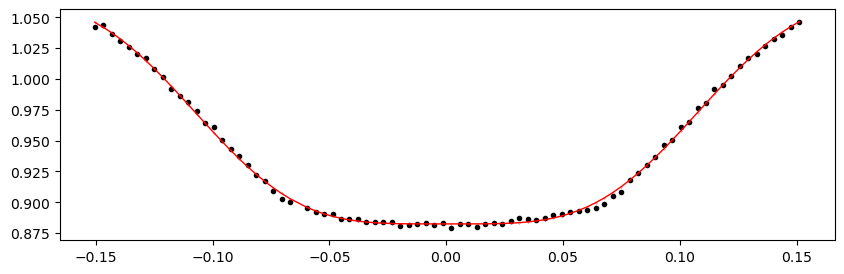

1993.61580772 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.73it/s]


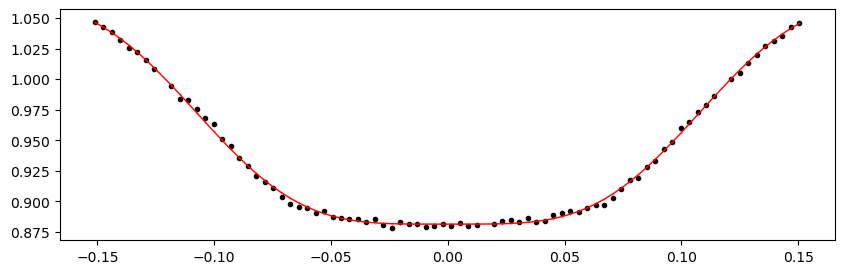

1993.99803724 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.93it/s]


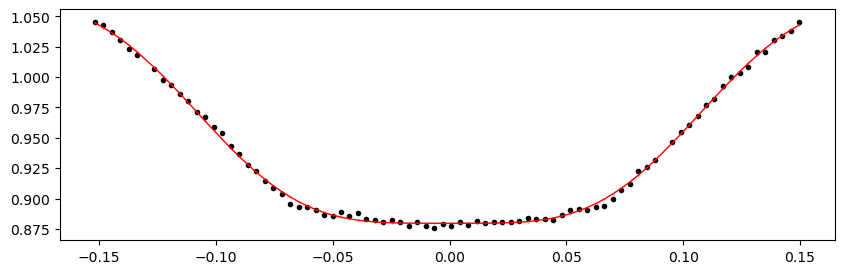

1994.38026676 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.03it/s]


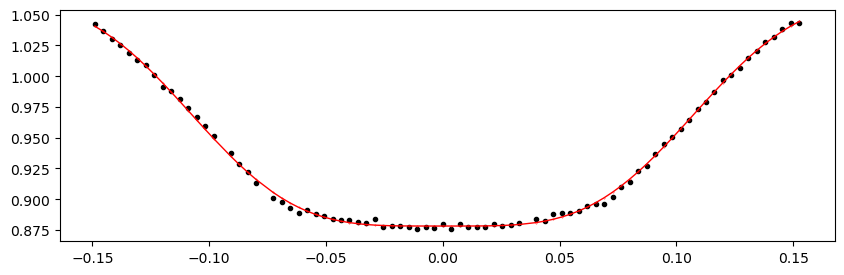

1994.76249628 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.78it/s]


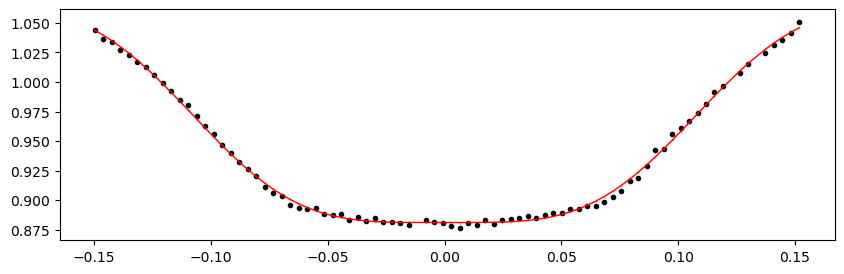

1995.1447258 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.73it/s]


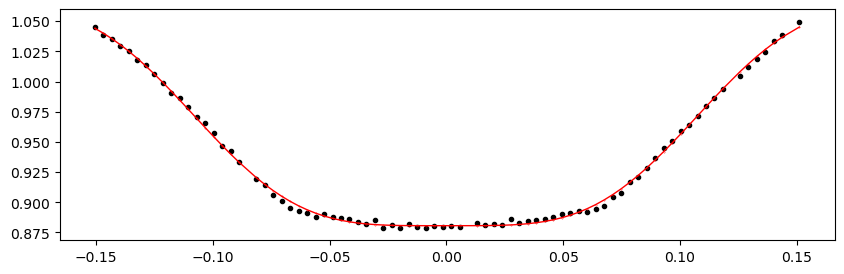

1995.52695532 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.84it/s]


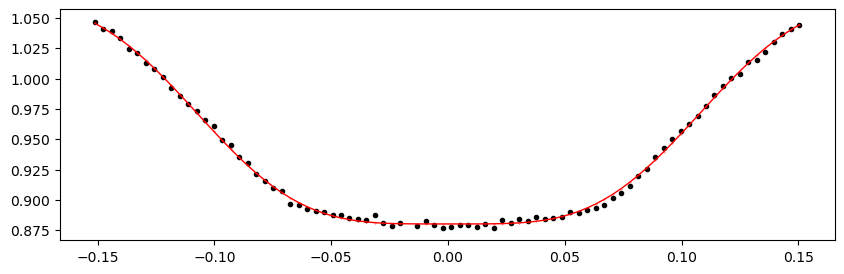

1997.0558733999999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.09it/s]


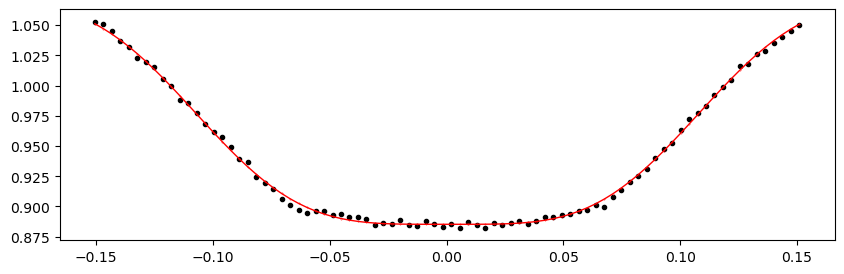

1997.43810292 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.75it/s]


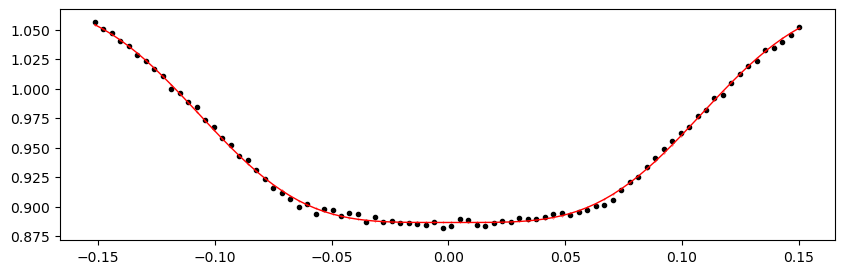

1997.82033244 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.28it/s]


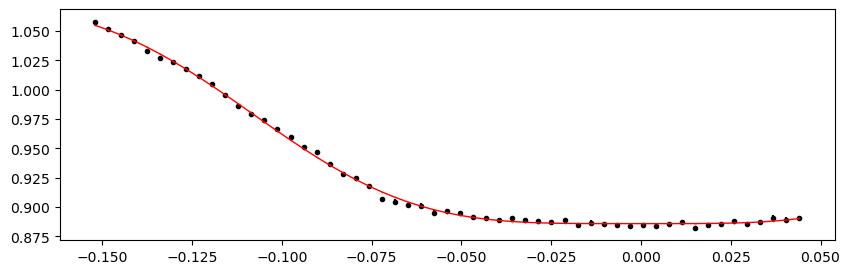

2001.26039812 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.63it/s]


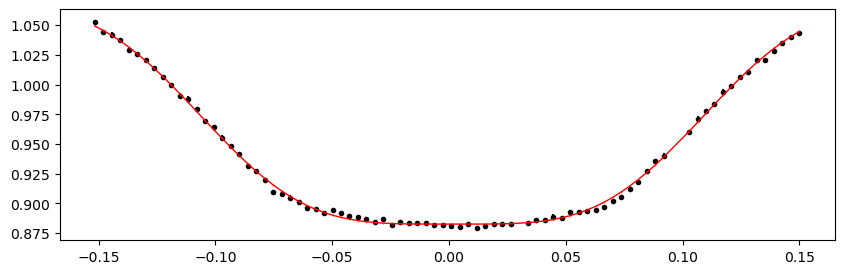

2001.64262764 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.74it/s]


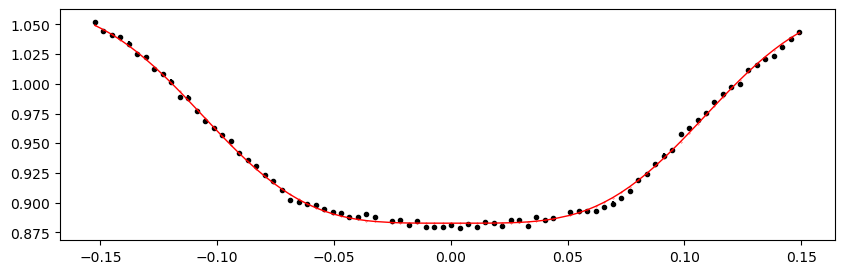

2002.02485716 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.18it/s]


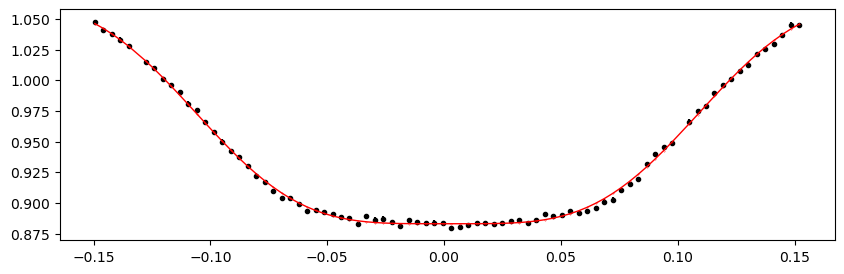

2002.40708668 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.84it/s]


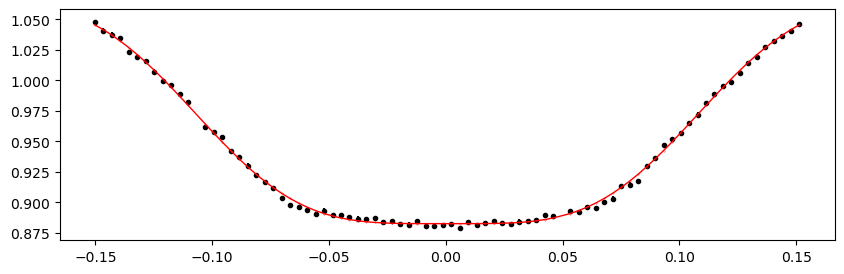

2002.7893162 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.18it/s]


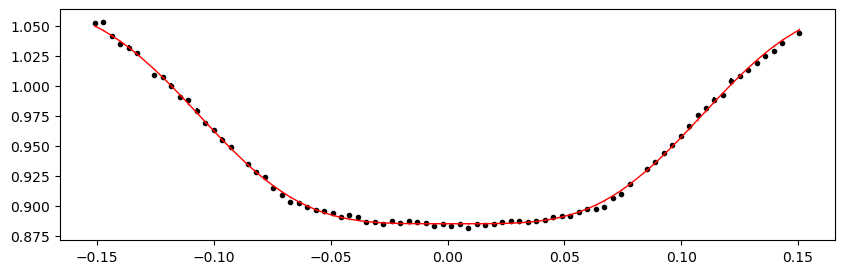

2003.17154572 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.96it/s]


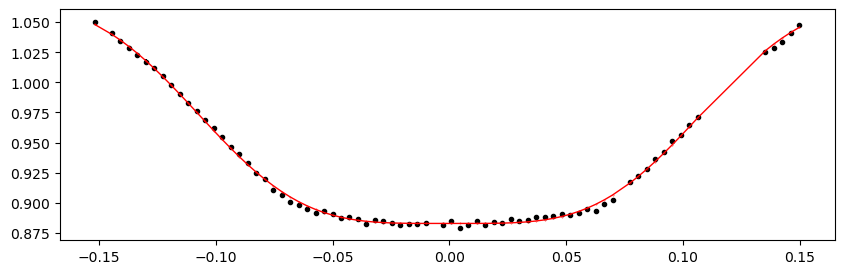

2003.55377524 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.11it/s]


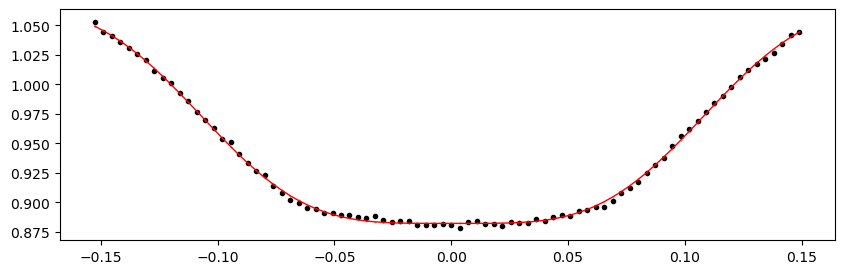

2003.93600476 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.22it/s]


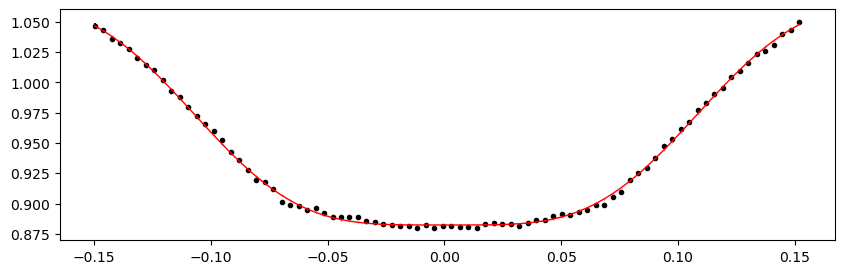

2004.31823428 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.66it/s]


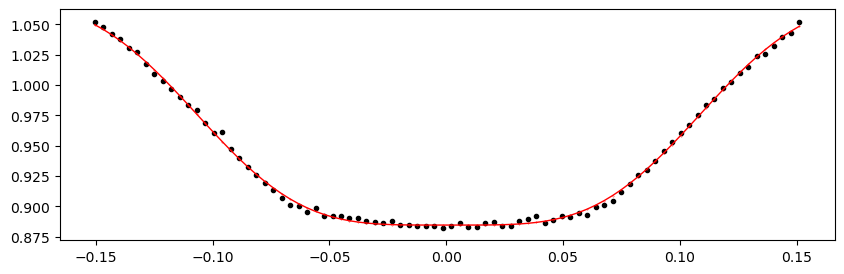

2004.7004637999999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.86it/s]


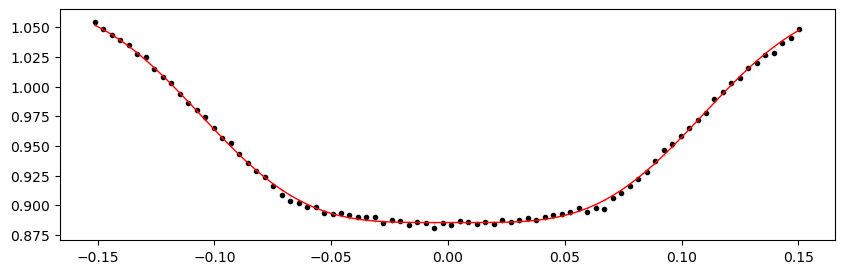

2005.0826933199999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.94it/s]


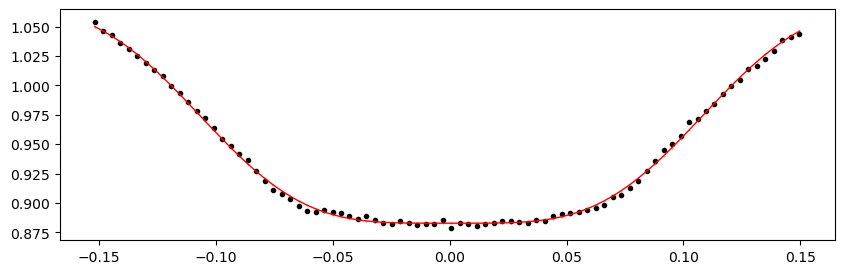

2005.4649228399999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.61it/s]


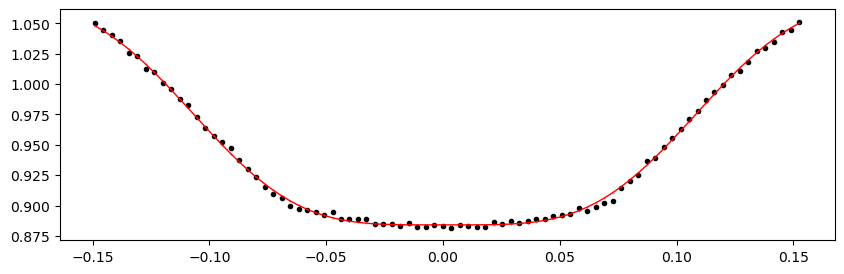

2005.8471523599999 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.19it/s]


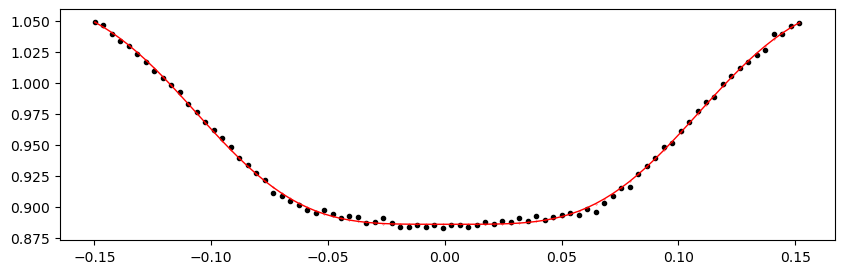

2006.22938188 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.14it/s]


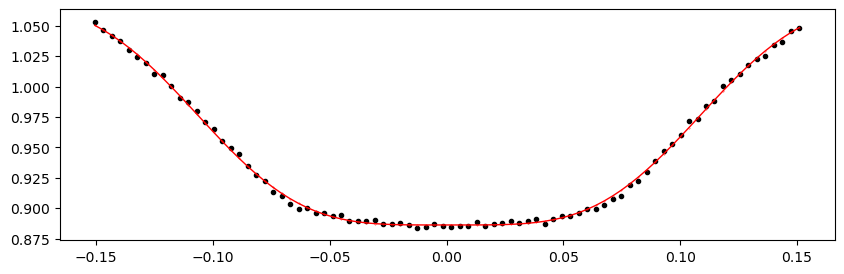

2006.6116114 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.72it/s]


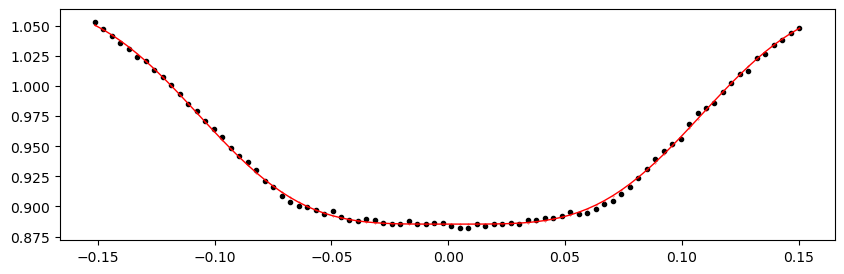

2006.99384092 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.31it/s]


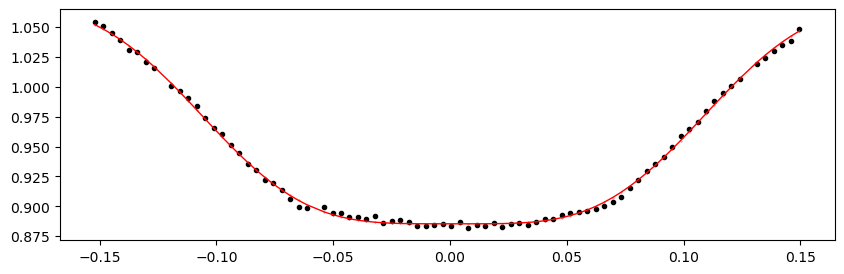

2007.37607044 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.62it/s]


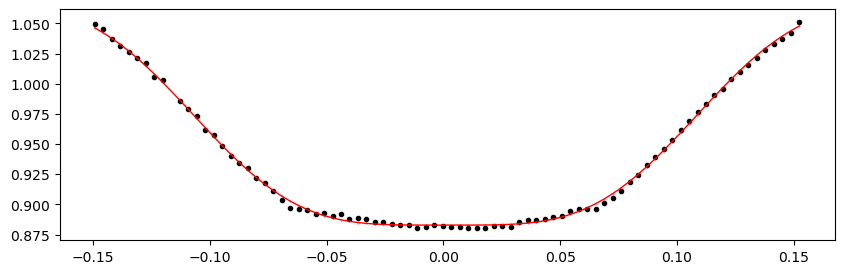

2007.75829996 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.93it/s]


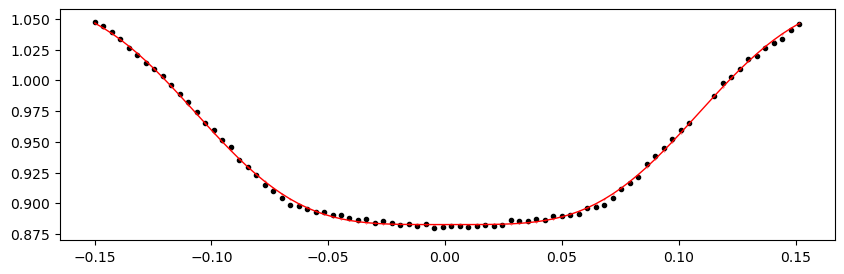

2008.14052948 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.98it/s]


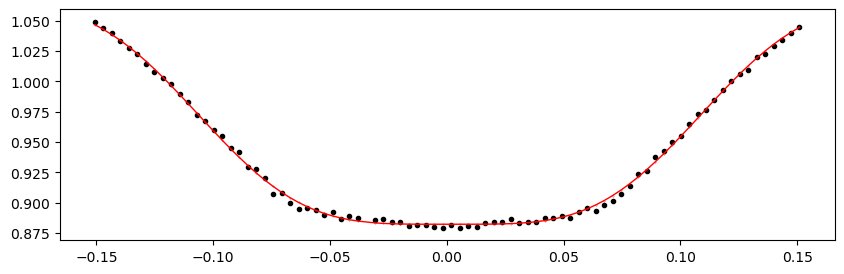

2008.522759 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.63it/s]


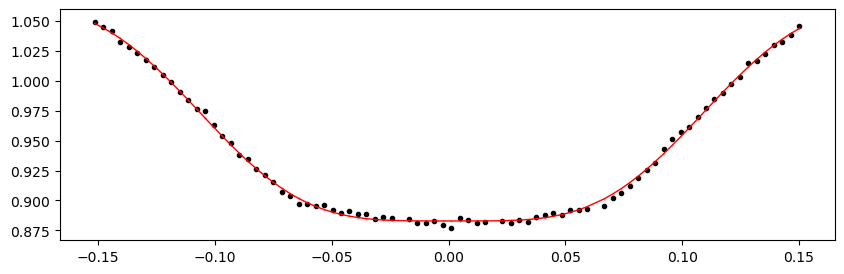

2008.90498852 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.36it/s]


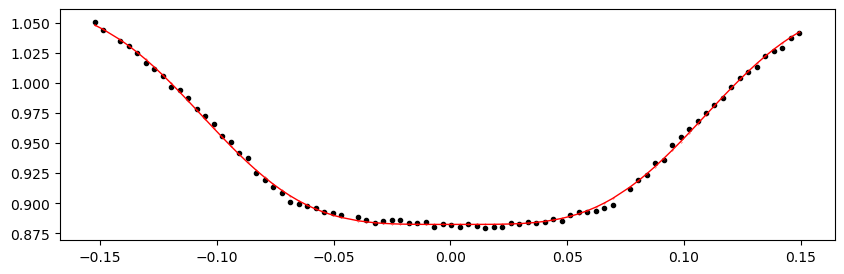

2009.28721804 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.00it/s]


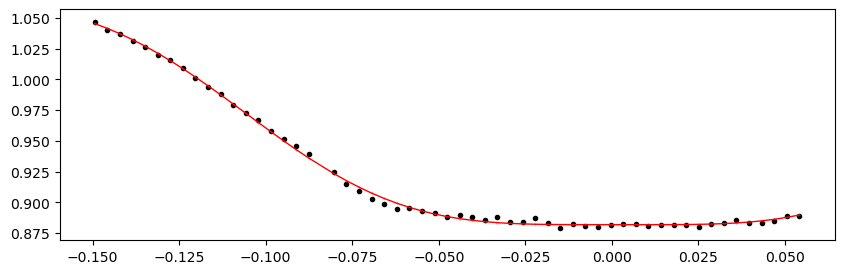

2696.535895 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.76it/s]


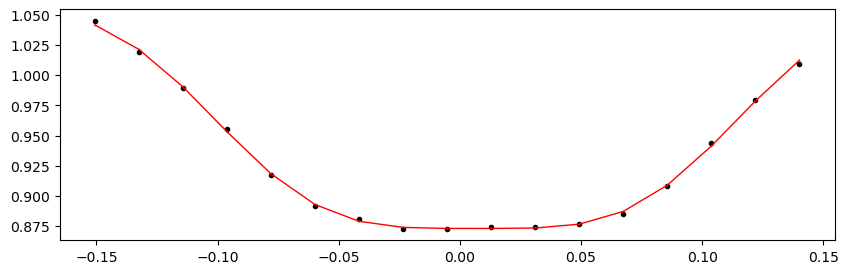

Time 2696.9181245199998 does not have enough data points: 7
2697.30035404 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.42it/s]


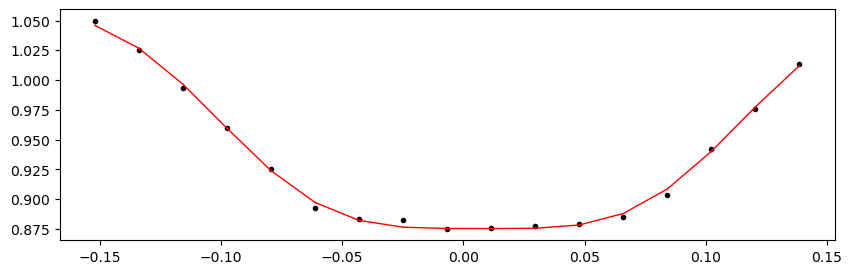

2697.68258356 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.02it/s]


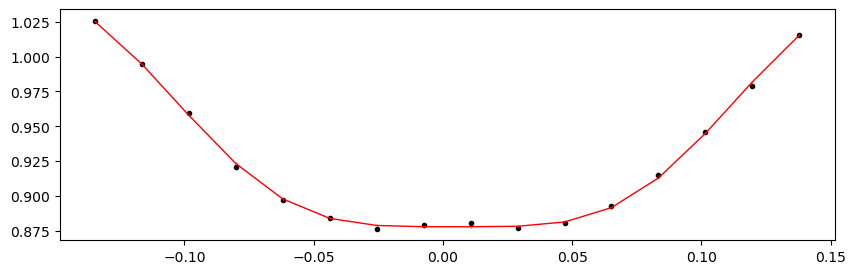

2698.06481308 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.41it/s]


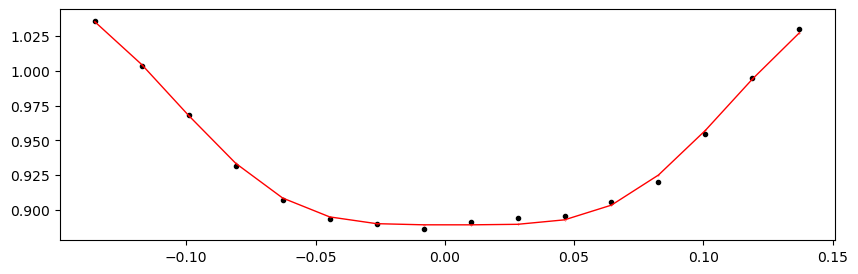

2698.4470426 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.67it/s]


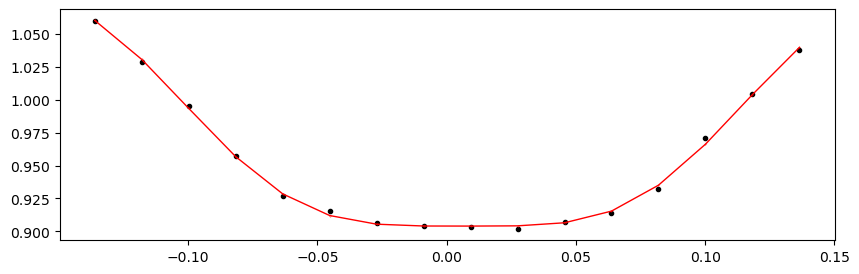

2698.82927212 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.58it/s]


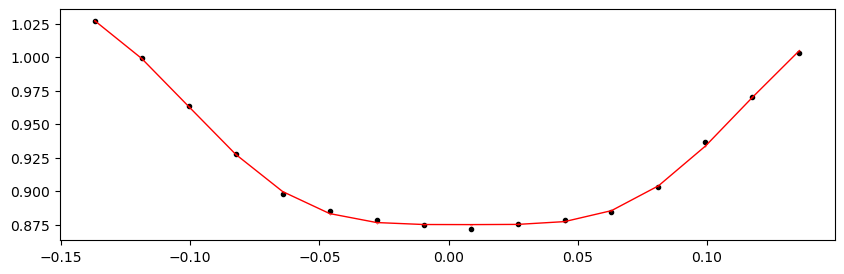

2699.21150164 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.38it/s]


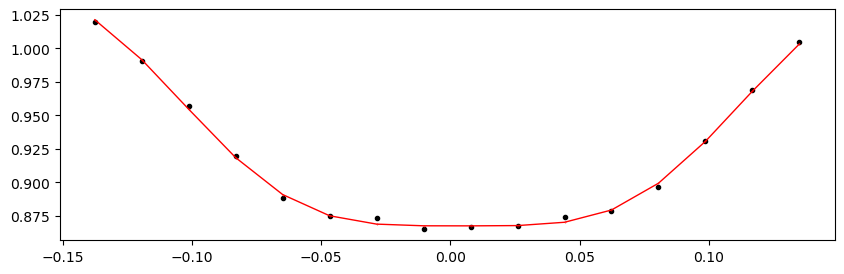

2699.59373116 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.23it/s]


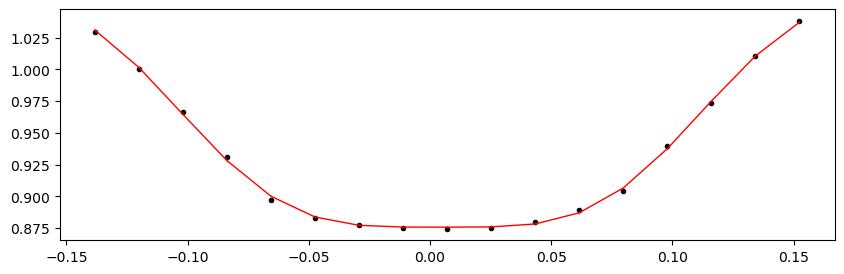

2699.97596068 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.13it/s]


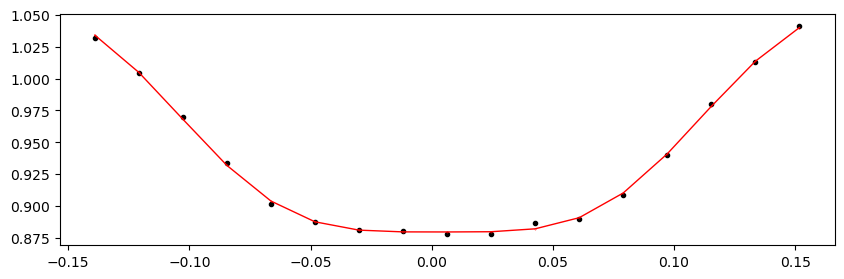

2700.3581902 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.10it/s]


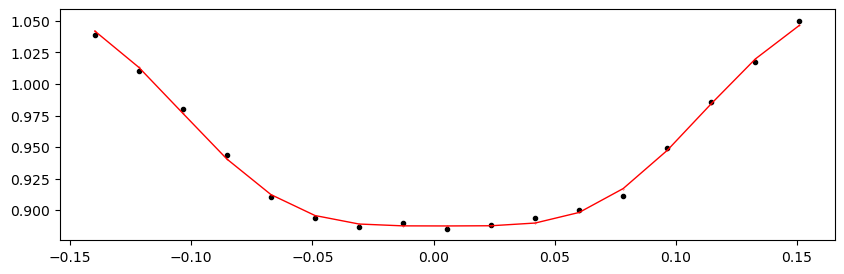

2700.74041972 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.20it/s]


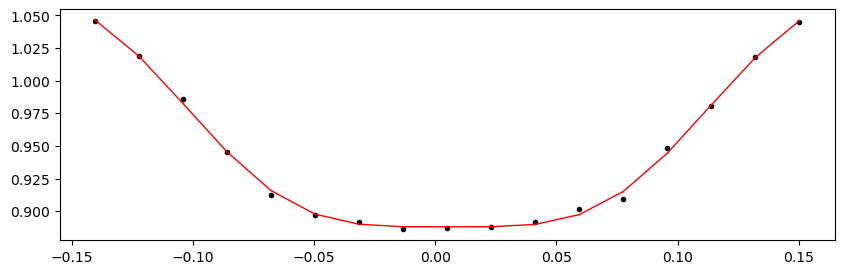

2701.12264924 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.36it/s]


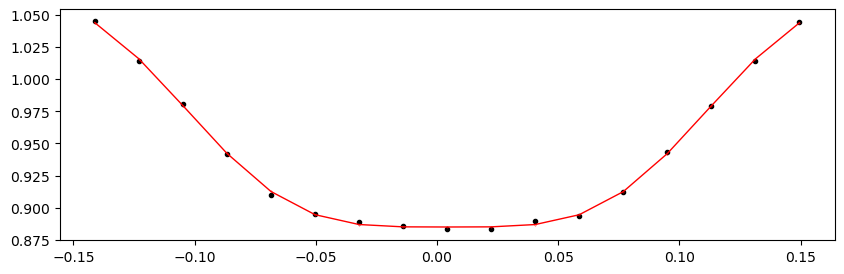

2701.50487876 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.54it/s]


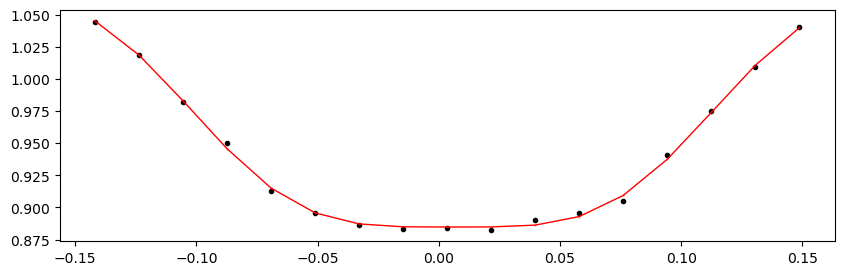

2701.8871082799997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.63it/s]


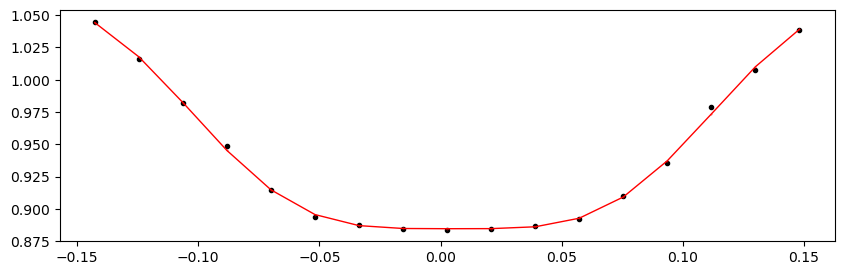

2702.2693378 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.08it/s]


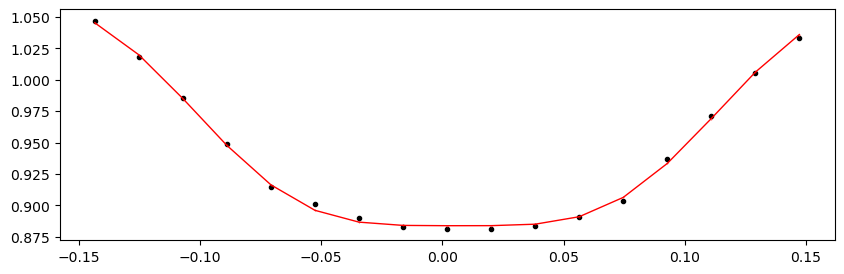

2702.65156732 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.27it/s]


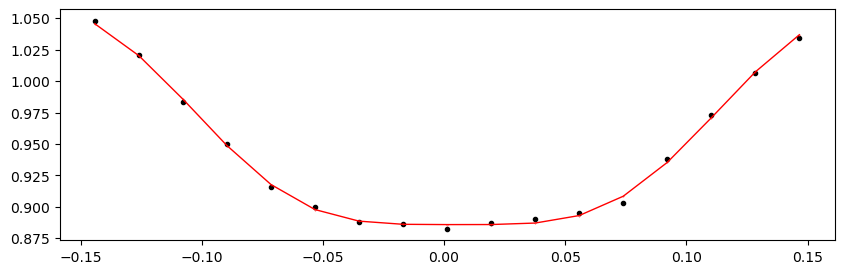

2703.03379684 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.14it/s]


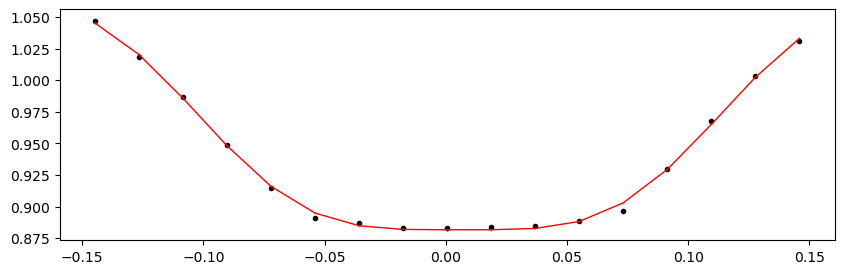

2703.4160263599997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.48it/s]


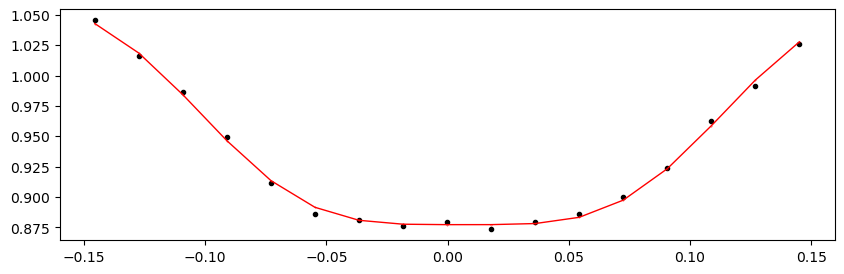

2703.79825588 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.63it/s]


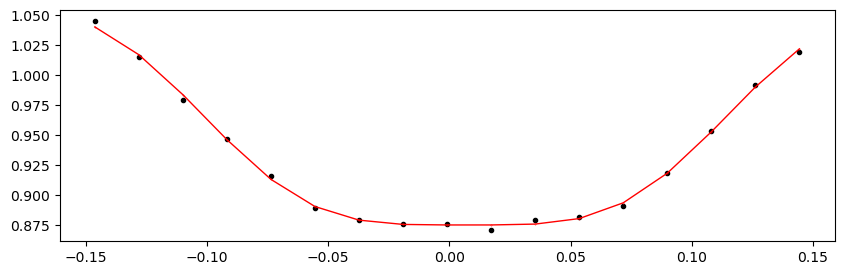

2704.1804854 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.52it/s]


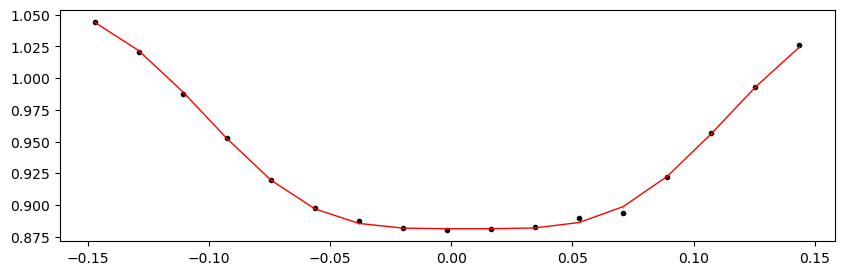

2704.56271492 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.08it/s]


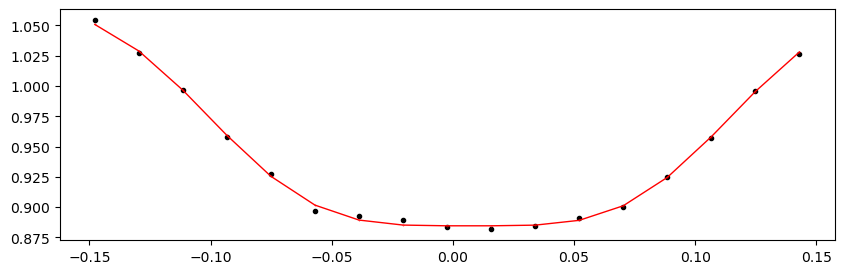

Time 2709.9139282 does not have enough data points: 8
2710.29615772 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.96it/s]


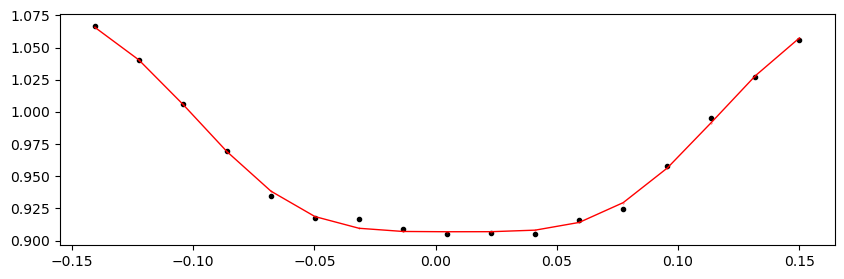

2710.67838724 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.63it/s]


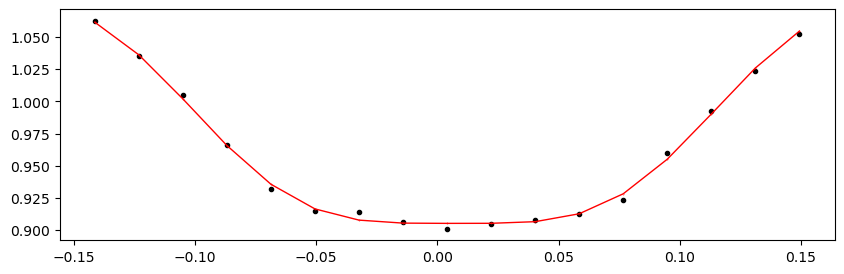

2711.06061676 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.58it/s]


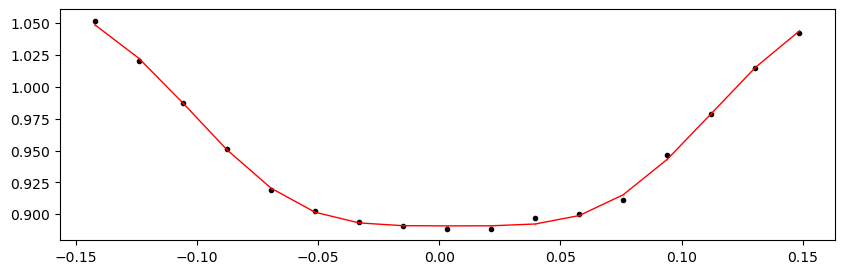

2711.4428462799997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.18it/s]


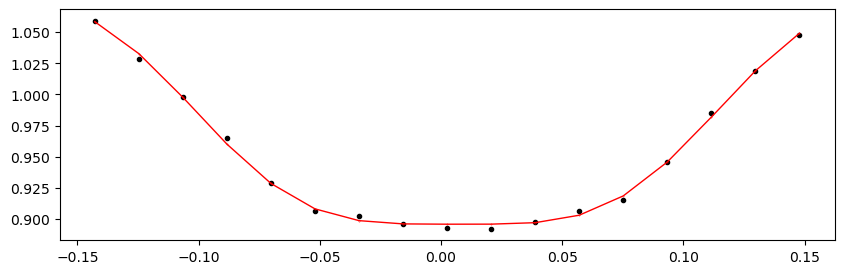

2711.8250758 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.96it/s]


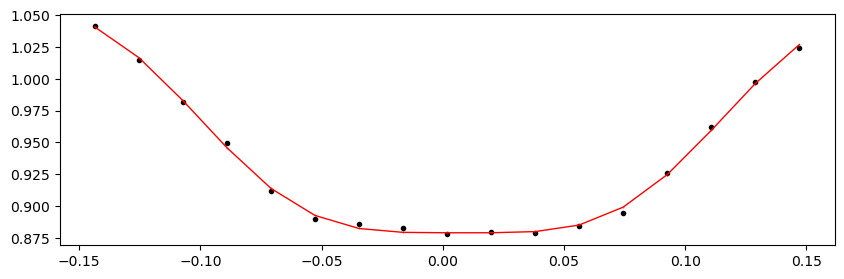

2712.20730532 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.23it/s]


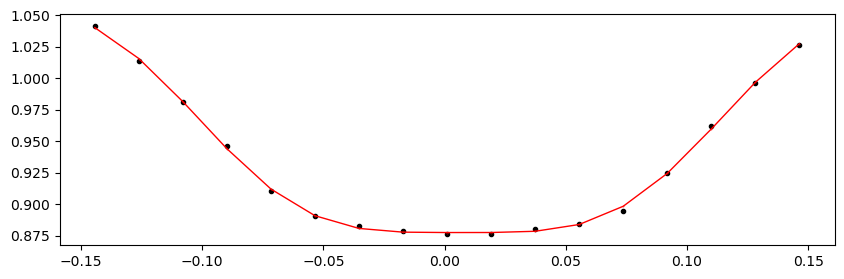

2712.58953484 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.79it/s]


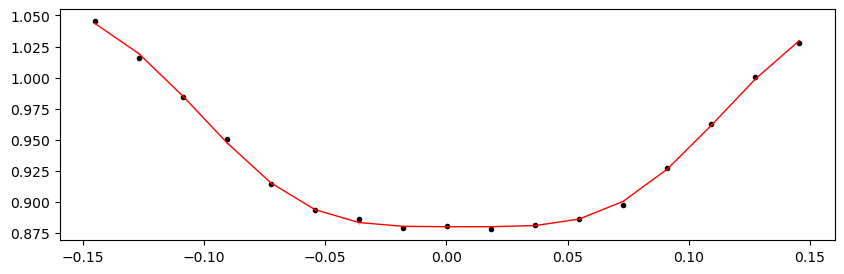

2712.9717643599997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.35it/s]


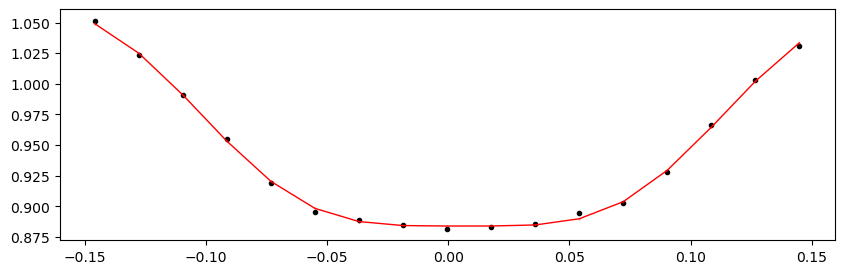

2713.35399388 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.67it/s]


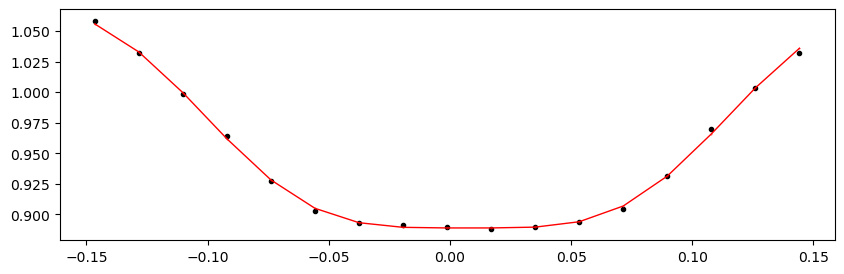

2713.7362234 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.28it/s]


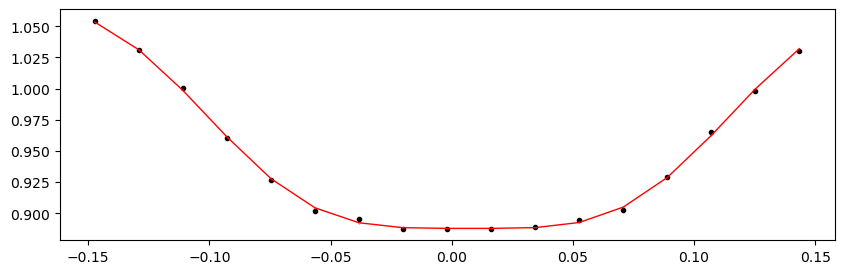

2714.11845292 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.19it/s]


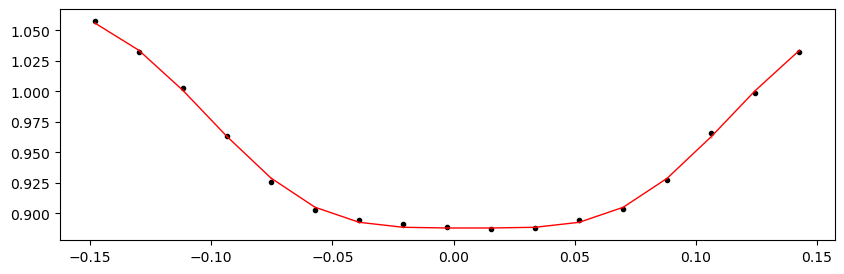

2714.5006824399998 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.82it/s]


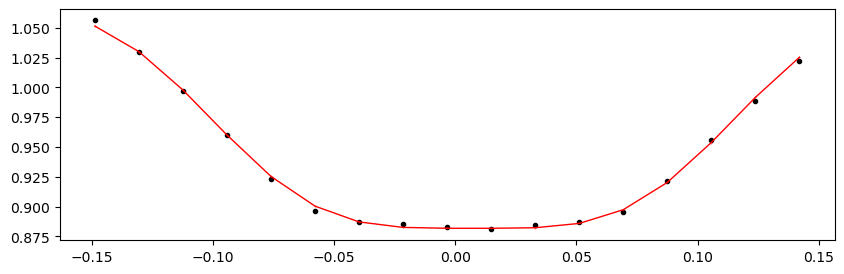

2714.88291196 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.82it/s]


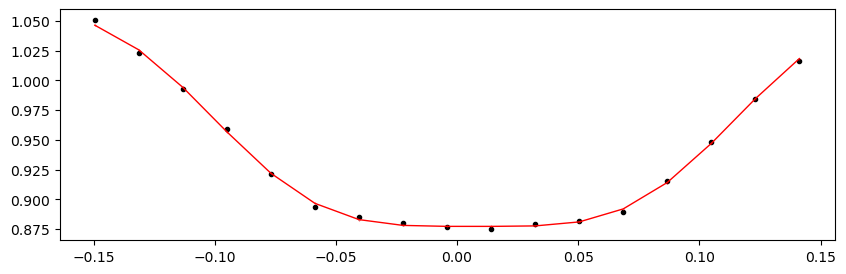

2715.26514148 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.55it/s]


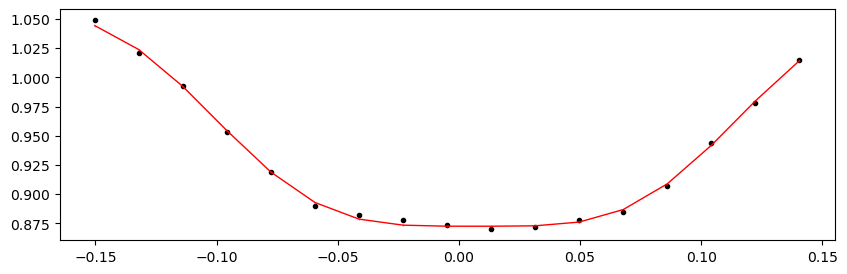

2715.647371 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.19it/s]


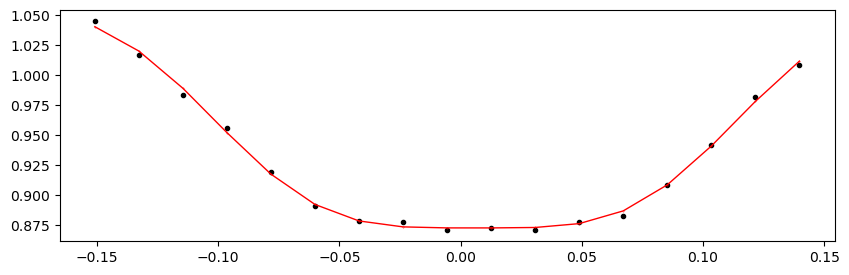

2716.02960052 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.48it/s]


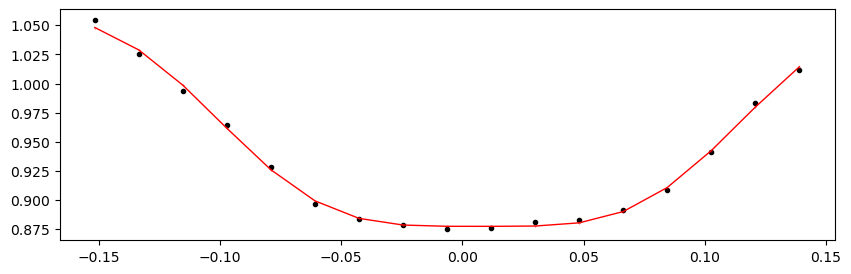

2716.41183004 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.58it/s]


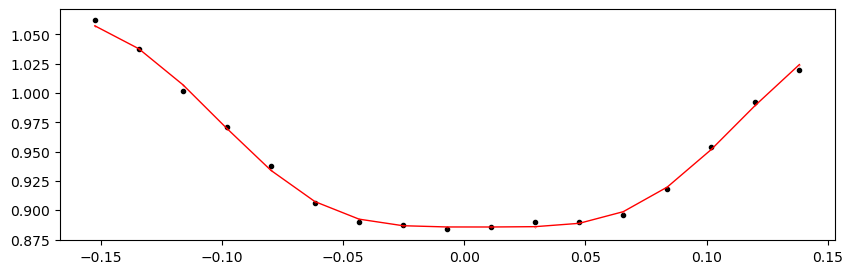

2716.79405956 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.99it/s]


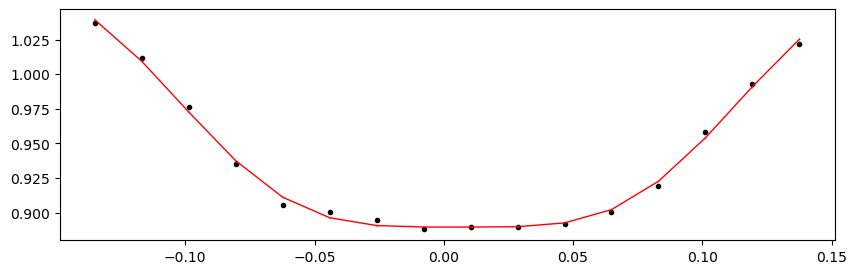

2717.17628908 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.60it/s]


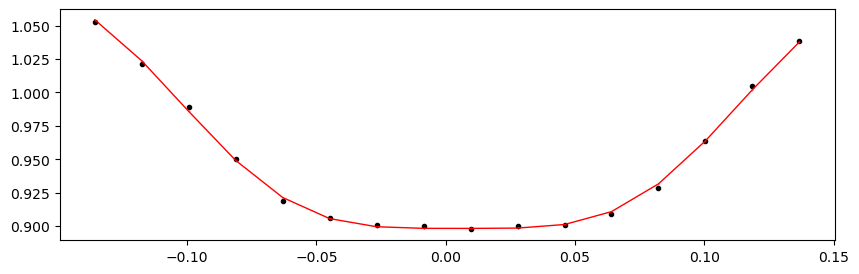

Time 2717.5585186 does not have enough data points: 5
2718.70520716 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.88it/s]


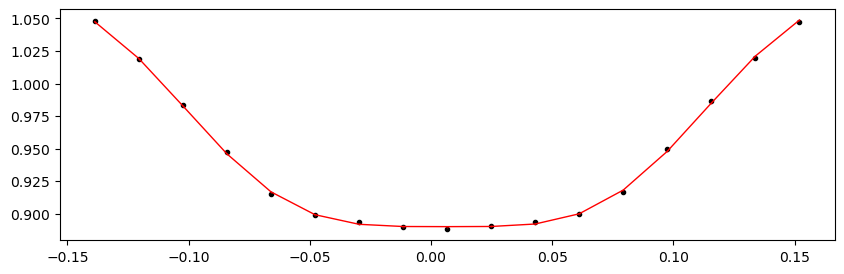

2719.08743668 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.96it/s]


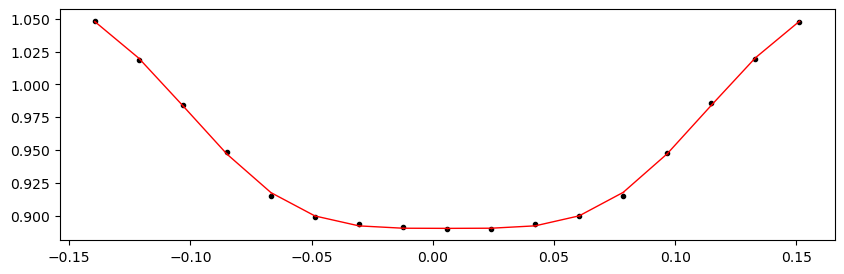

2719.4696661999997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.20it/s]


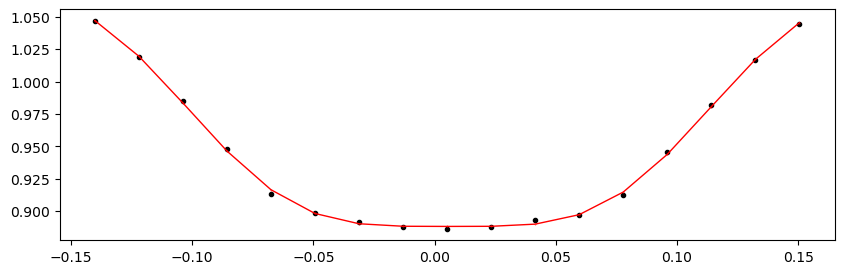

2719.85189572 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.08it/s]


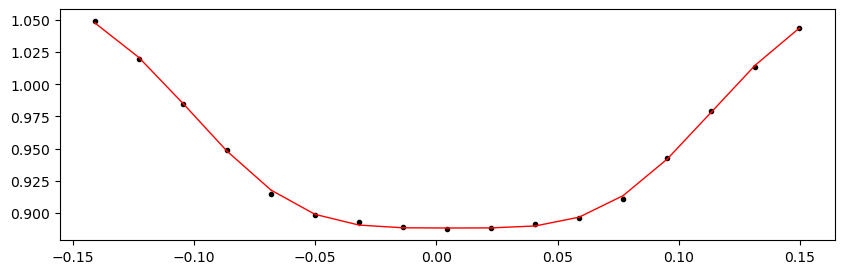

Time 2720.23412524 does not have enough data points: 15
Time 2720.61635476 does not have enough data points: 7
2725.58533852 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.87it/s]


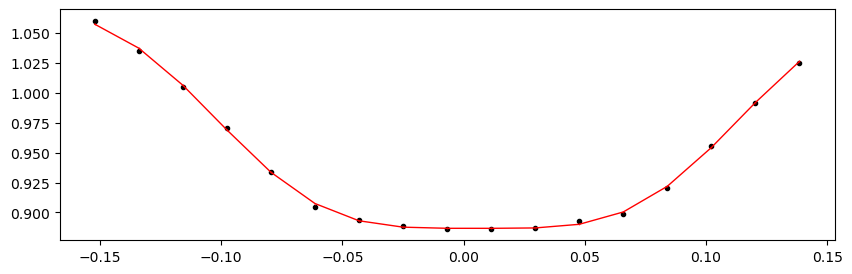

2725.96756804 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.30it/s]


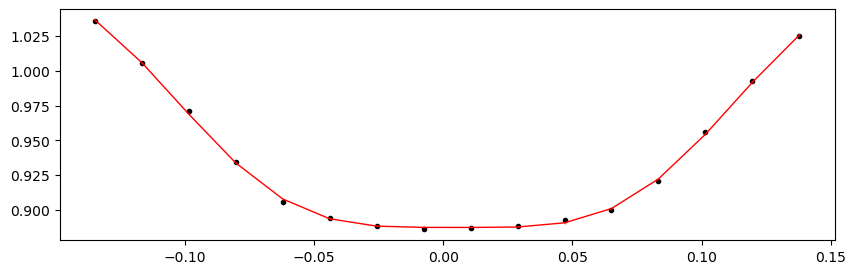

2726.34979756 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.89it/s]


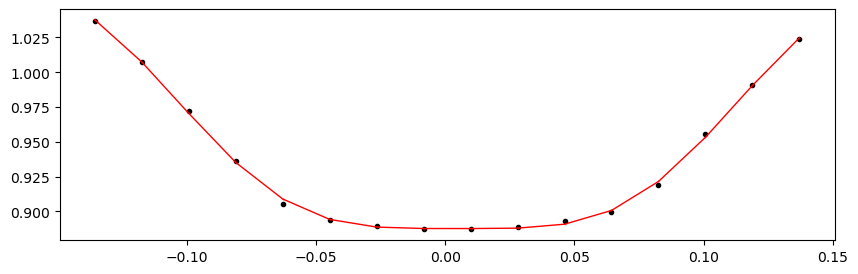

2726.73202708 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.85it/s]


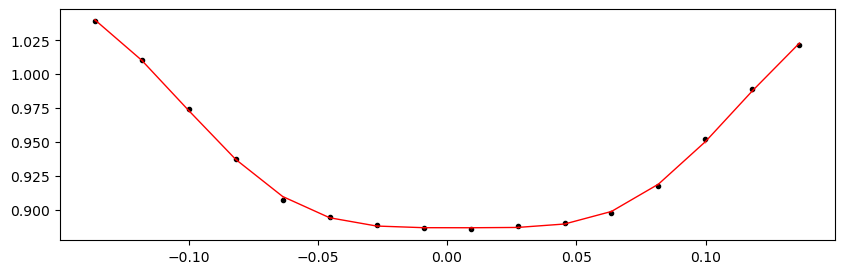

2727.1142566 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.18it/s]


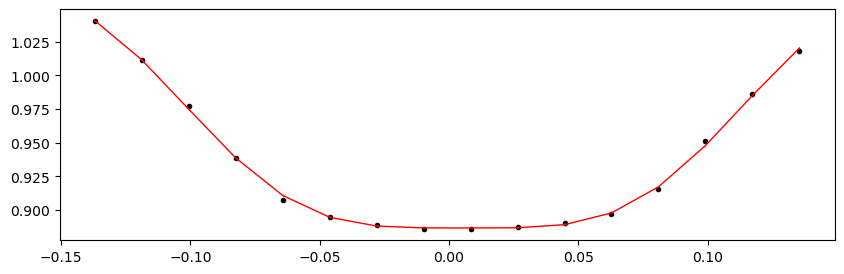

2727.49648612 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.81it/s]


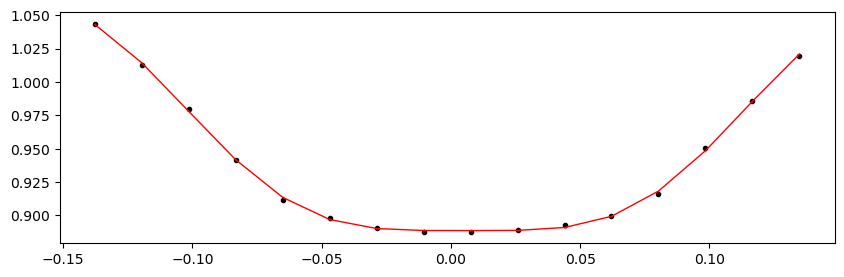

2727.87871564 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.40it/s]


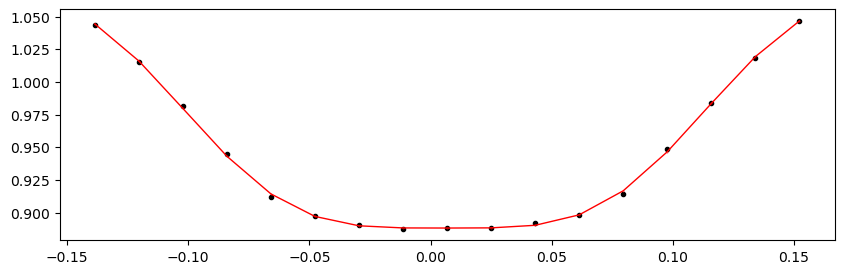

2728.26094516 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.78it/s]


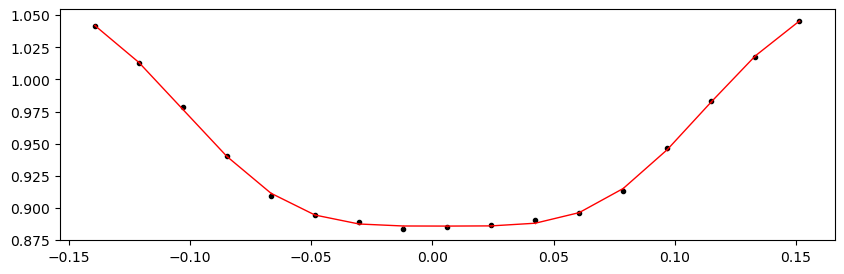

2728.64317468 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.37it/s]


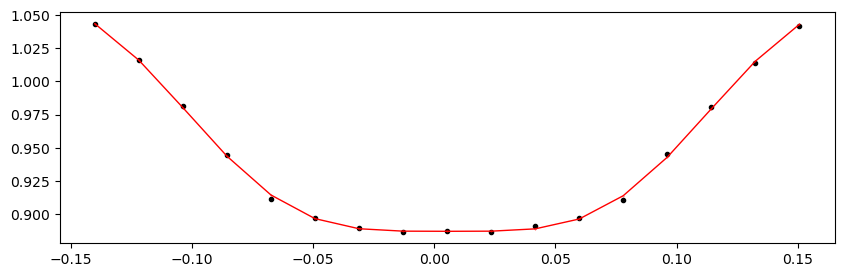

2729.0254041999997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.04it/s]


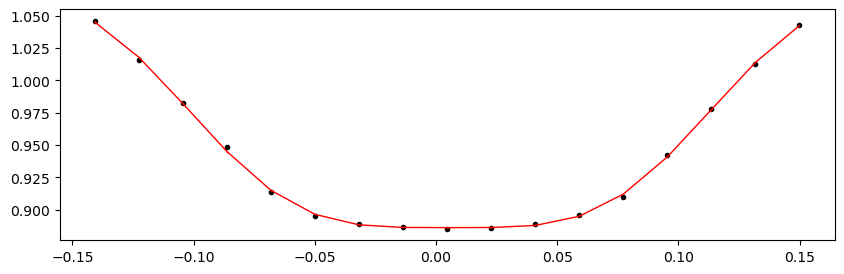

2729.40763372 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.31it/s]


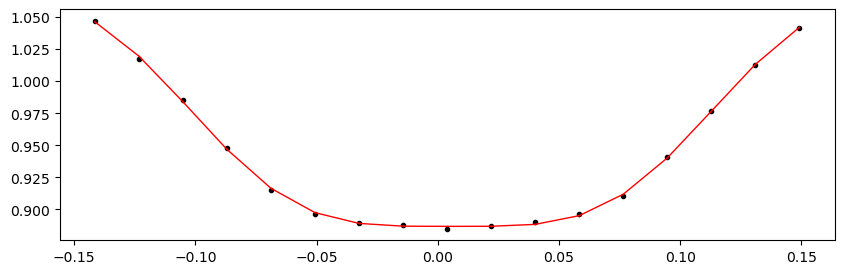

2729.78986324 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.20it/s]


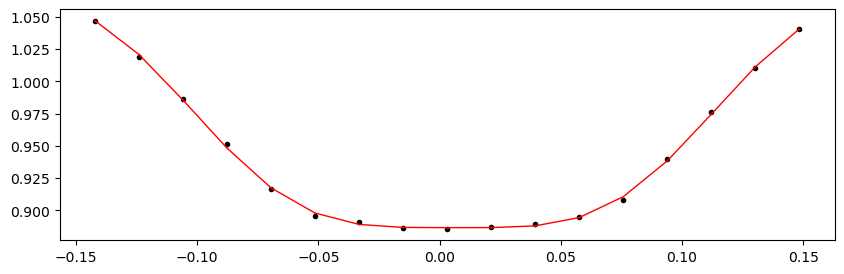

2730.17209276 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.28it/s]


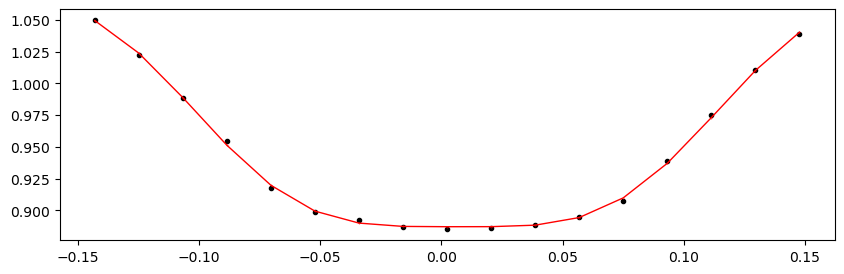

2731.70101084 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.14it/s]


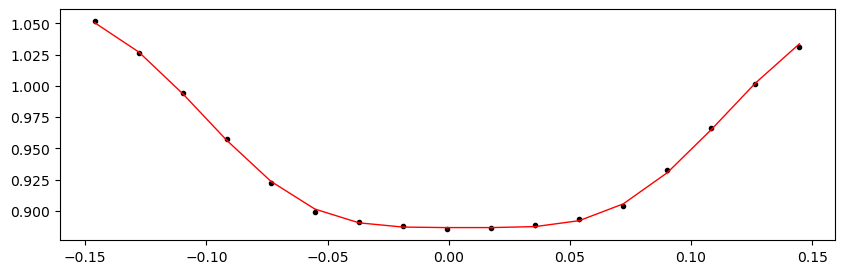

2732.0832403599998 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.40it/s]


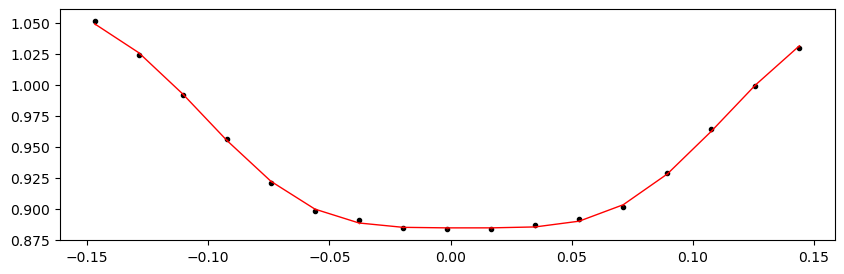

2732.46546988 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.82it/s]


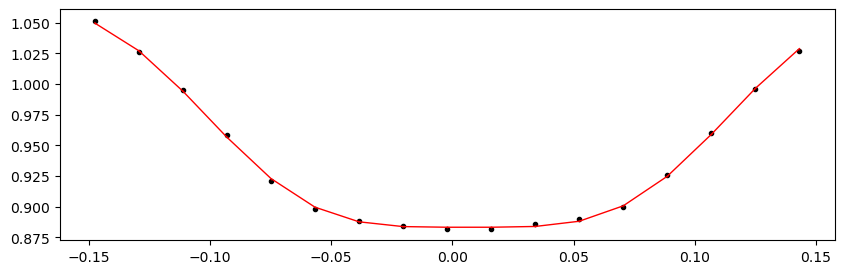

2732.8476994 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.31it/s]


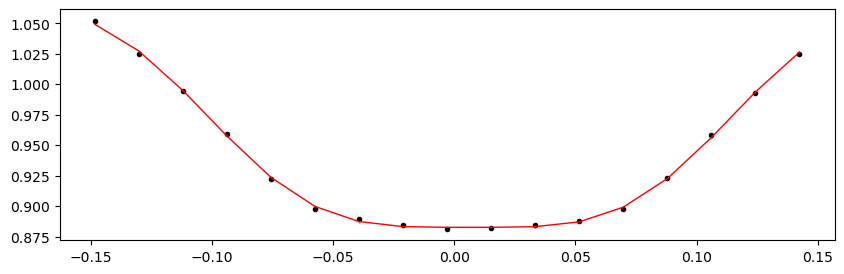

2733.22992892 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.12it/s]


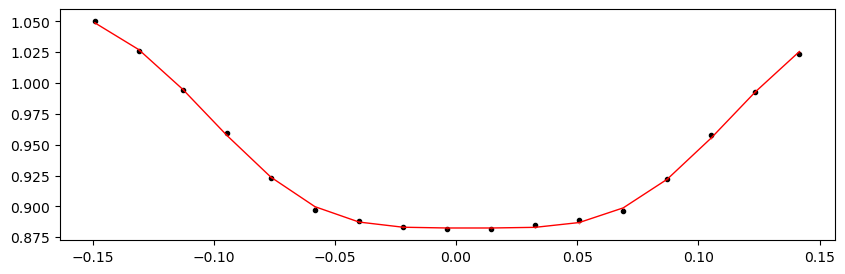

Time 2733.61215844 does not have enough data points: 10
Time 2738.19891268 does not have enough data points: 3
2738.5811421999997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.91it/s]


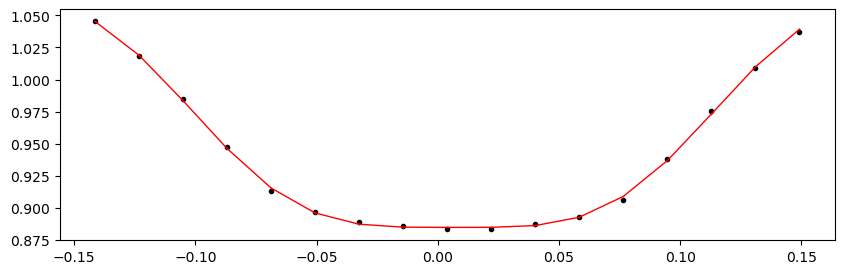

2738.96337172 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.02it/s]


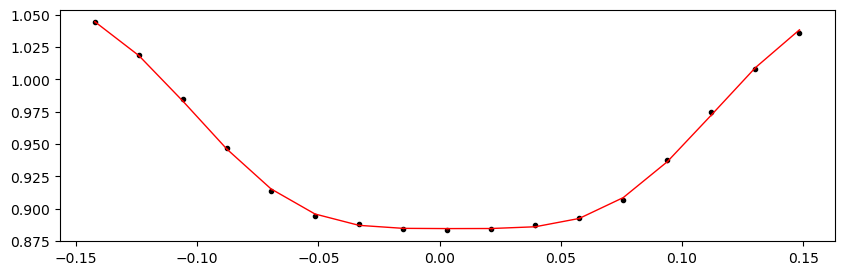

2739.34560124 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.80it/s]


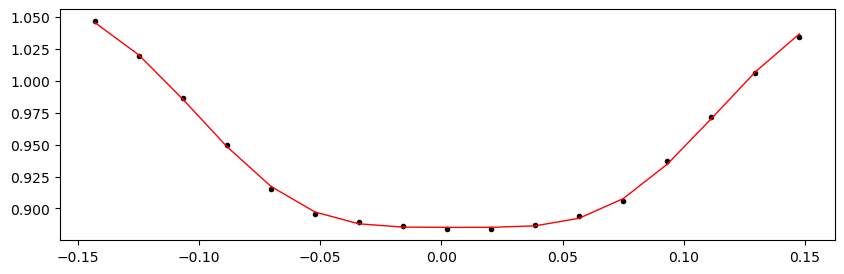

2739.72783076 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.57it/s]


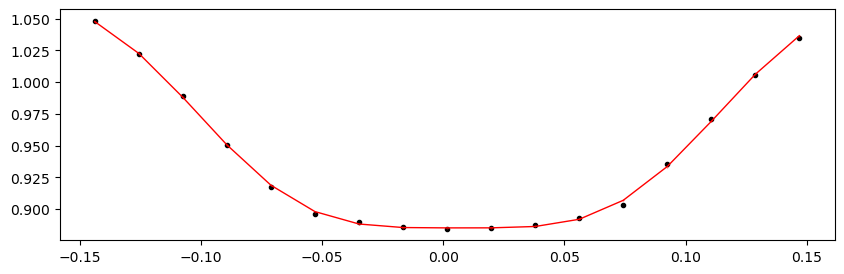

2740.1100602799997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.23it/s]


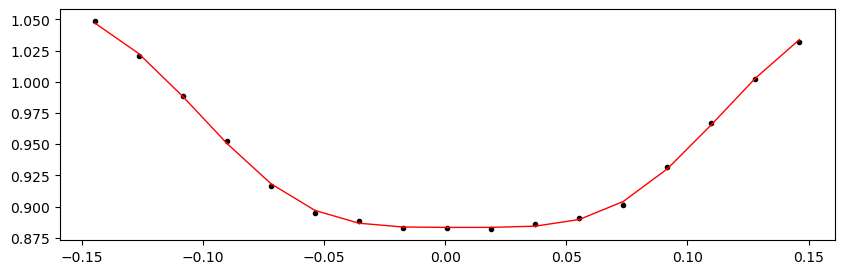

2740.4922898 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.86it/s]


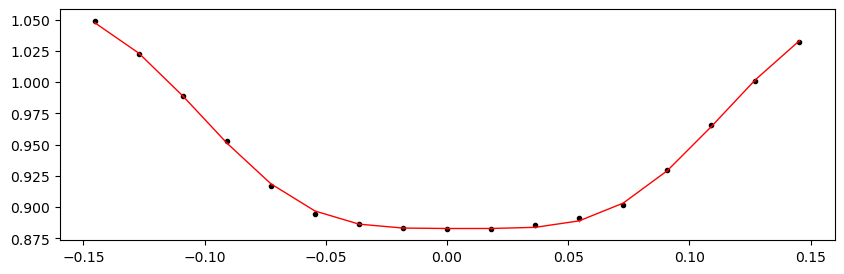

2740.87451932 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.35it/s]


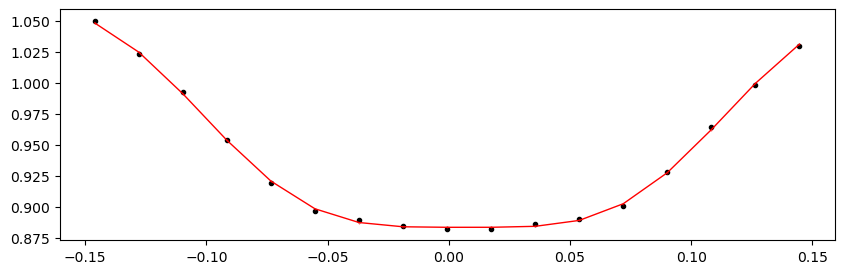

2741.25674884 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.69it/s]


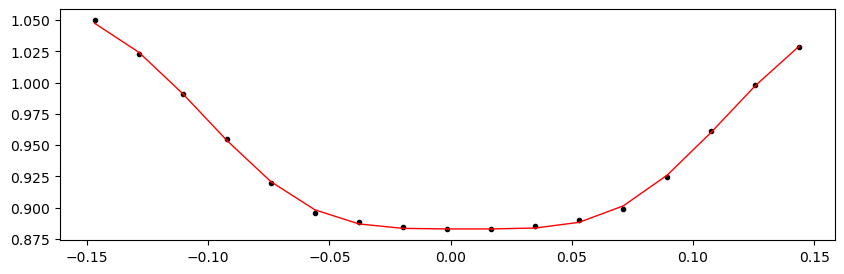

2741.63897836 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.29it/s]


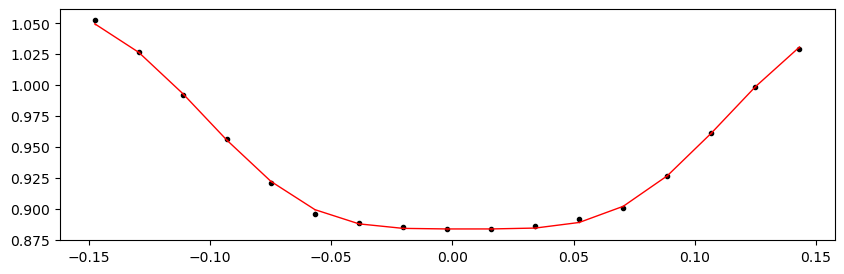

2742.02120788 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.52it/s]


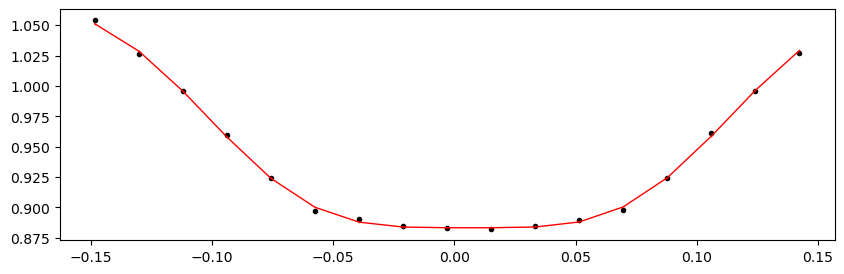

2742.4034374 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.47it/s]


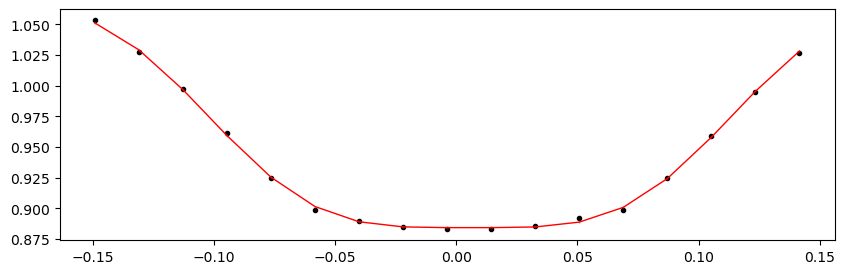

2742.78566692 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.37it/s]


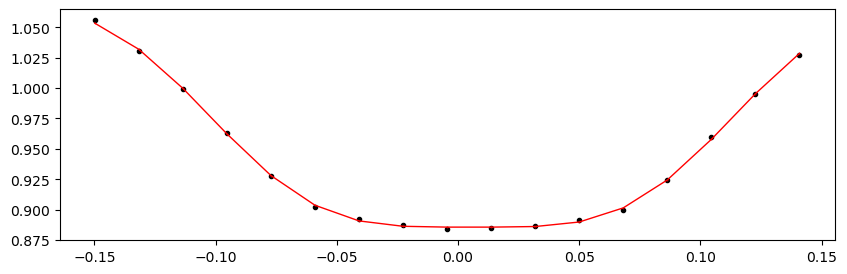

3434.2388686 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.71it/s]


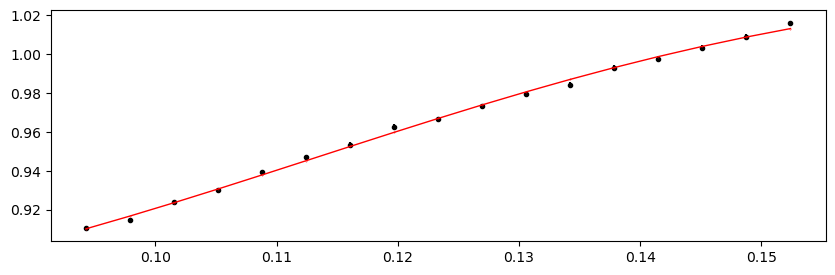

3434.62109812 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.56it/s]


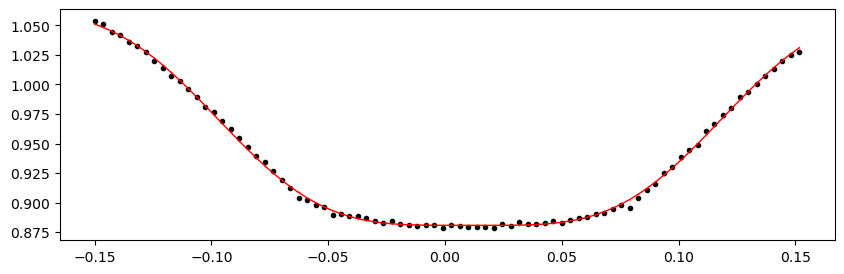

3435.00332764 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.50it/s]


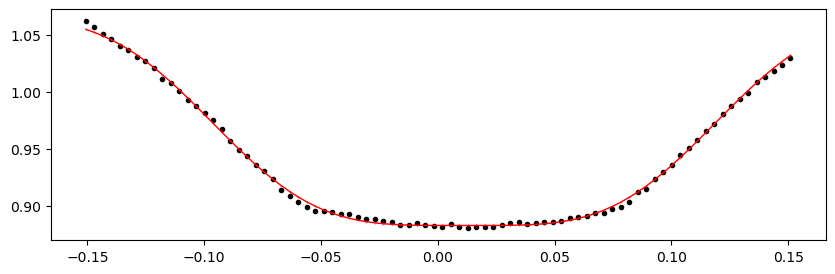

3435.3855571599997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.83it/s]


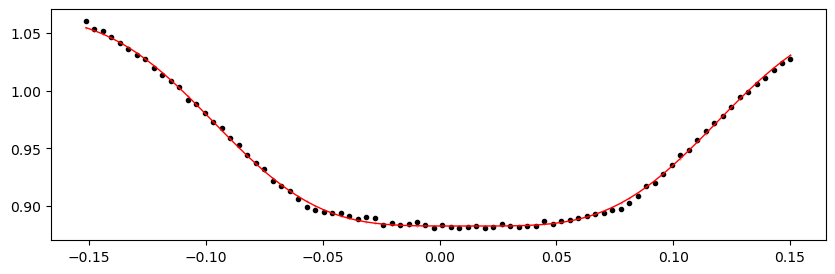

3435.76778668 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.10it/s]


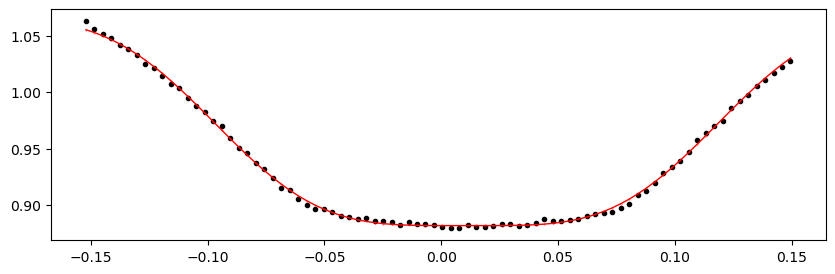

3436.1500162 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.32it/s]


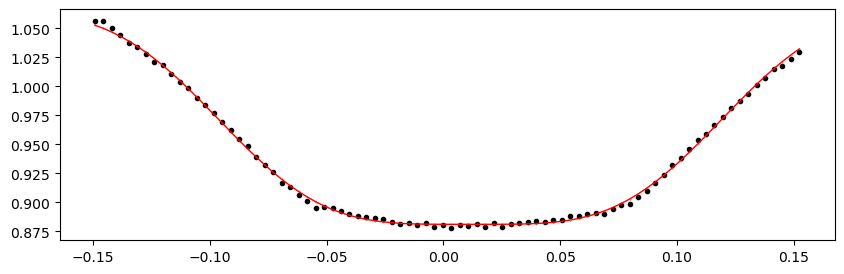

3436.53224572 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.39it/s]


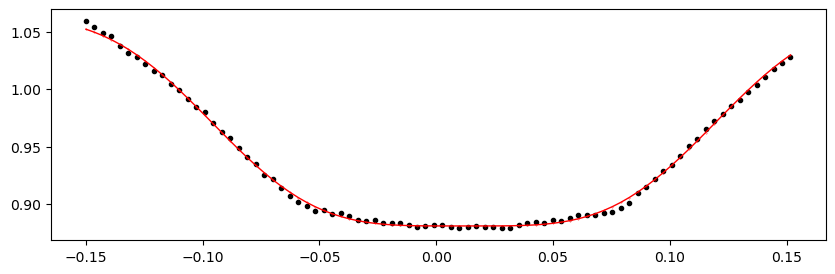

3436.91447524 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.94it/s]


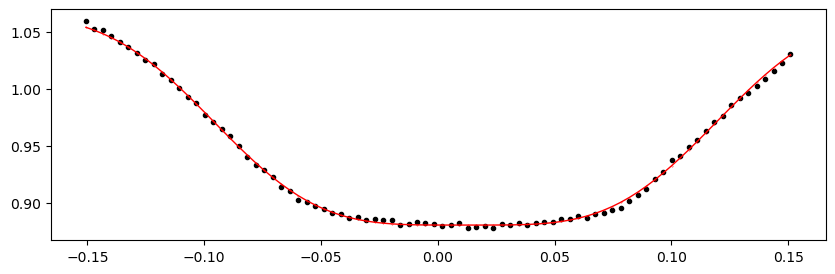

3437.29670476 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.63it/s]


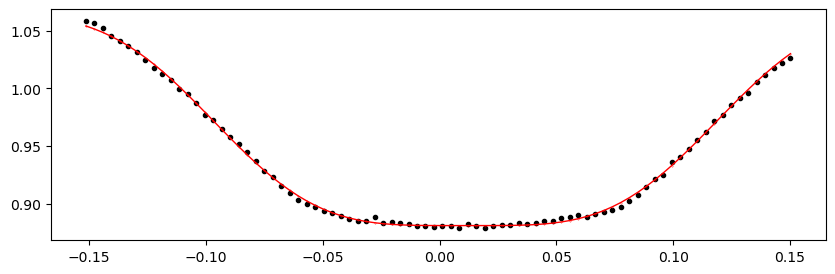

3437.6789342800002 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.53it/s]


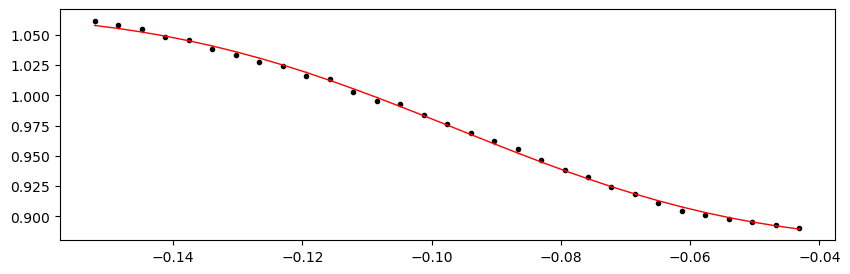

3438.0611638 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.25it/s]


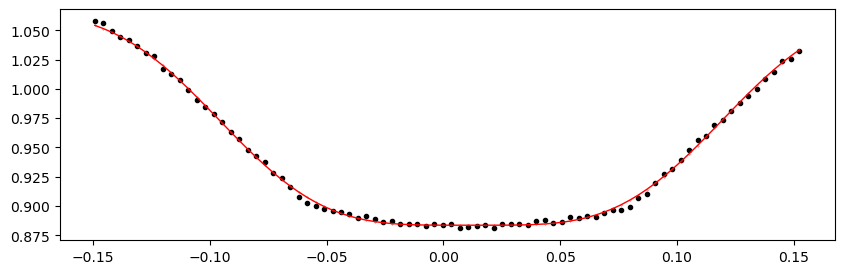

3438.44339332 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.23it/s]


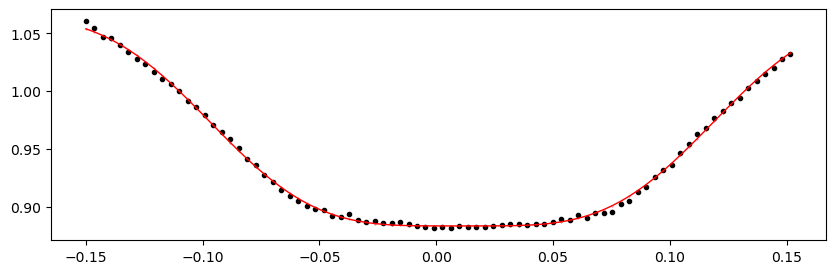

3438.8256228399996 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.22it/s]


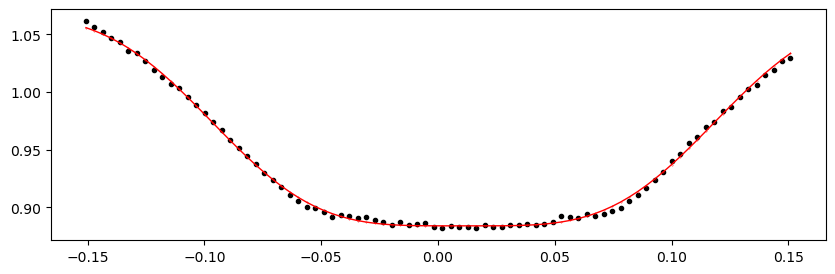

3439.20785236 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.73it/s]


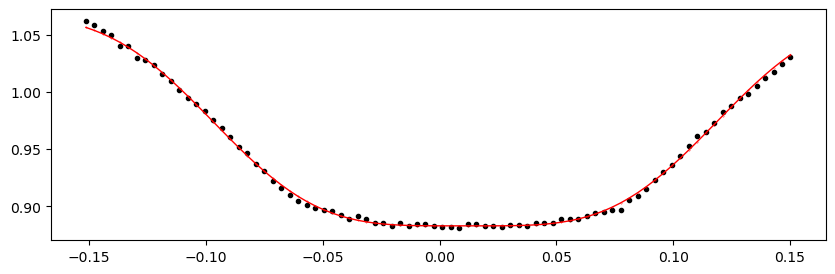

3439.59008188 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 316.28it/s]


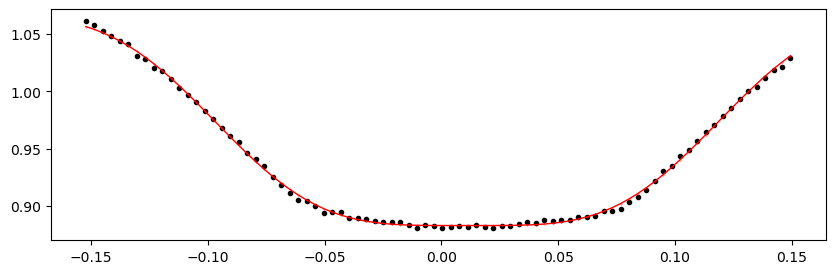

3439.9723114 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.56it/s]


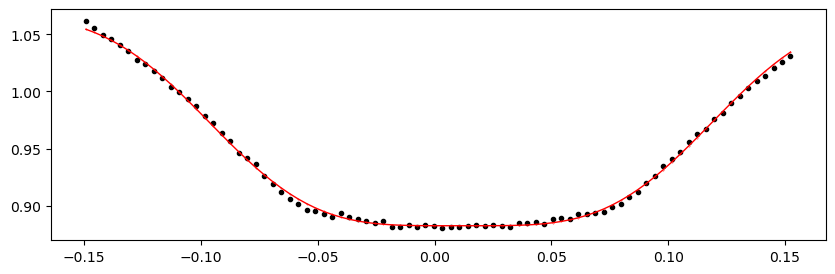

3440.3545409199996 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.65it/s]


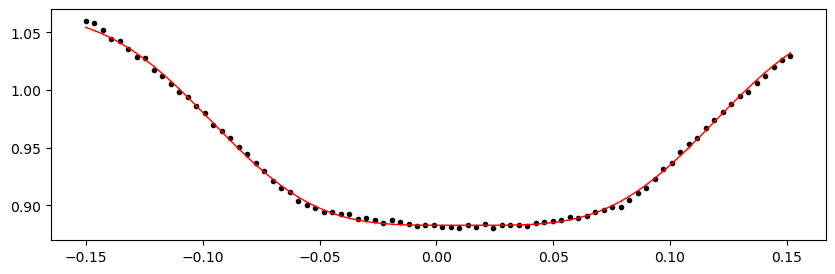

3440.73677044 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.69it/s]


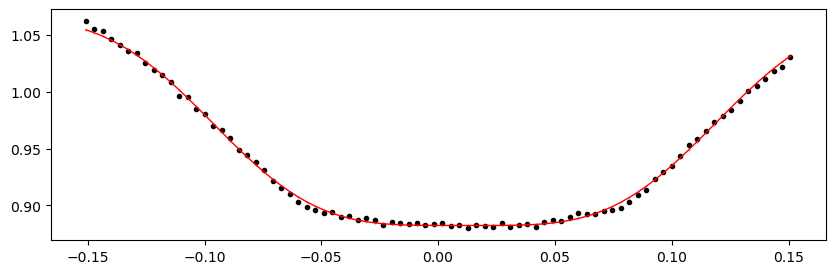

3441.11899996 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.74it/s]


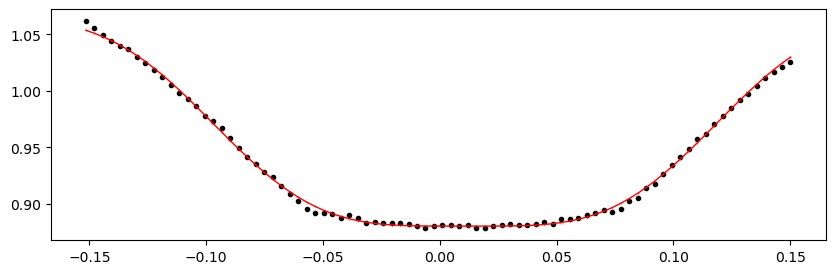

3441.50122948 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.27it/s]


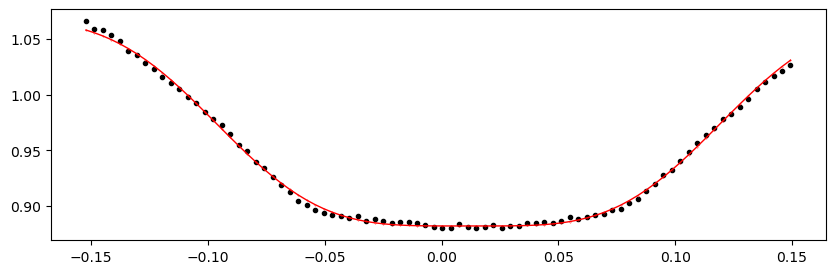

3441.8834589999997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.47it/s]


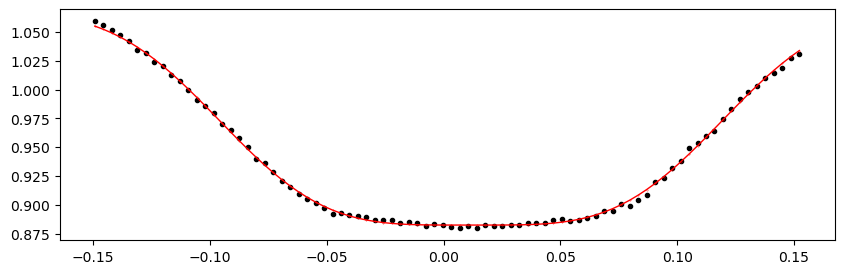

3442.26568852 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.10it/s]


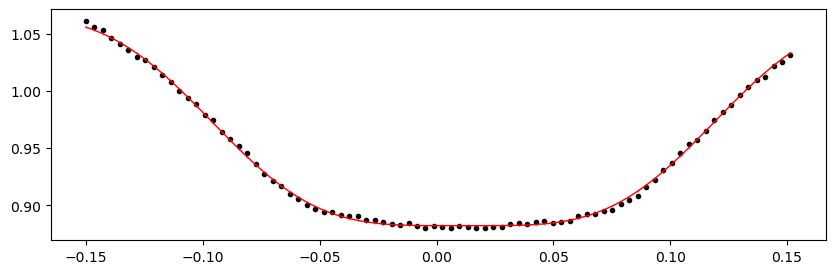

3442.64791804 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.40it/s]


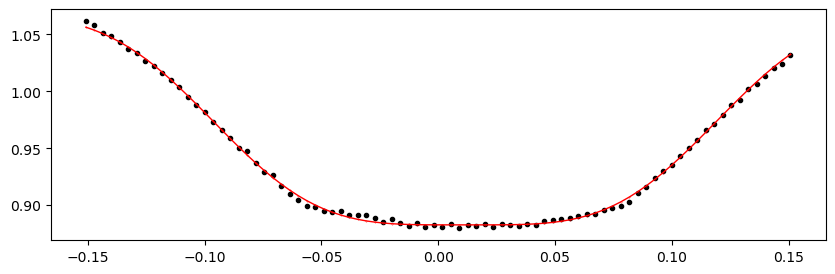

3443.03014756 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.30it/s]


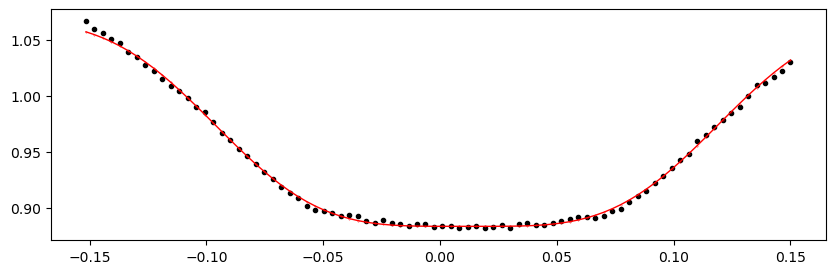

3443.4123770799997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.11it/s]


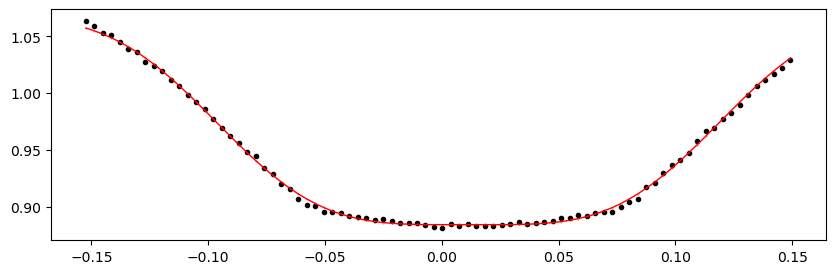

3443.7946066 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.57it/s]


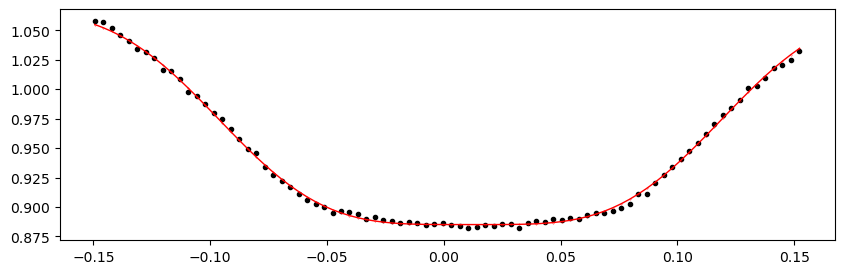

3444.17683612 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.10it/s]


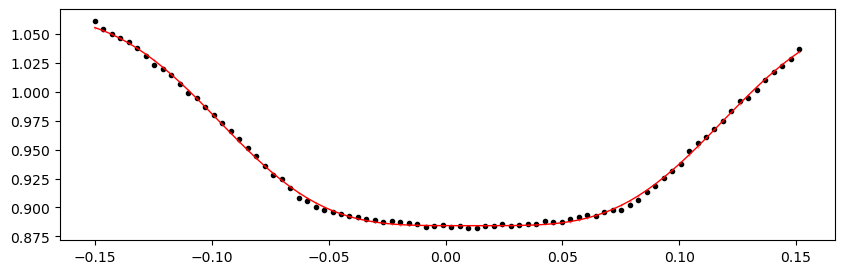

3444.55906564 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.64it/s]


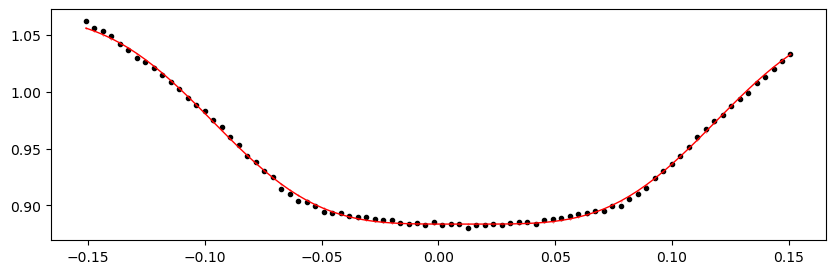

Time 3447.23467228 does not have enough data points: 11
3447.6169018 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.75it/s]


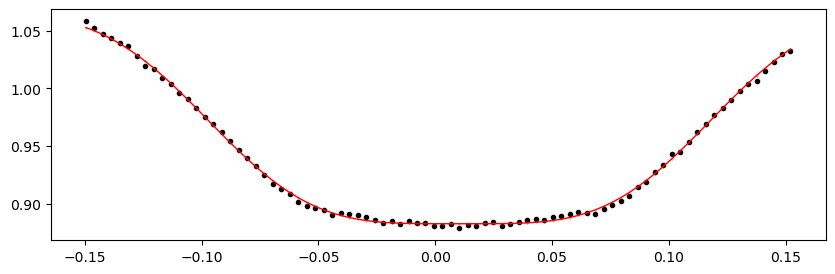

3447.99913132 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.55it/s]


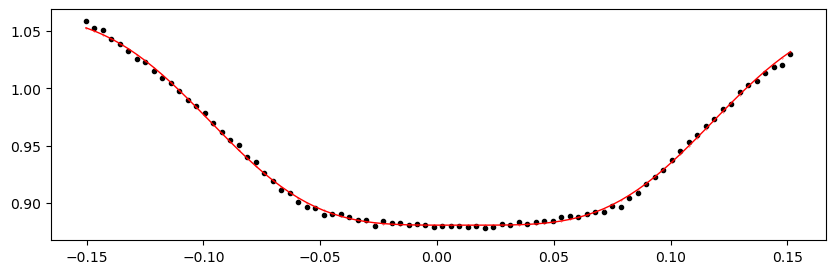

3448.3813608399996 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.22it/s]


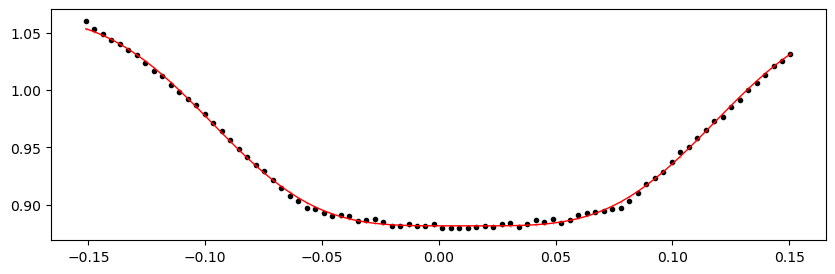

3448.76359036 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.91it/s]


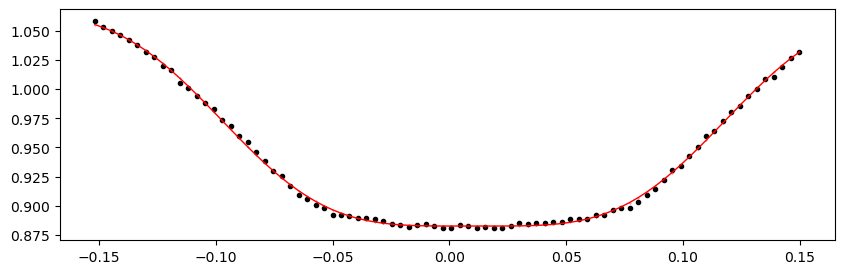

3449.14581988 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.03it/s]


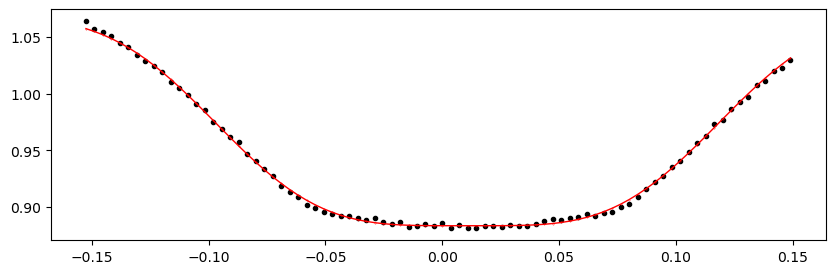

3449.5280494 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.65it/s]


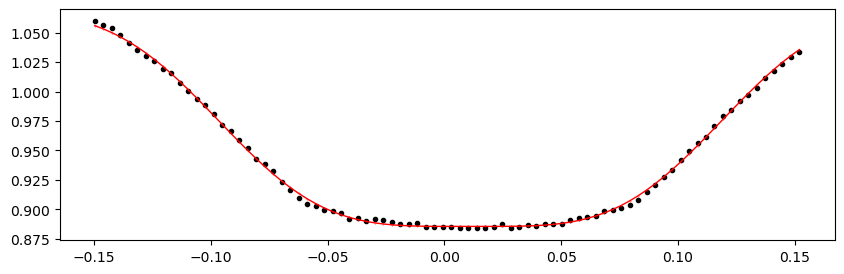

3449.9102789199997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.19it/s]


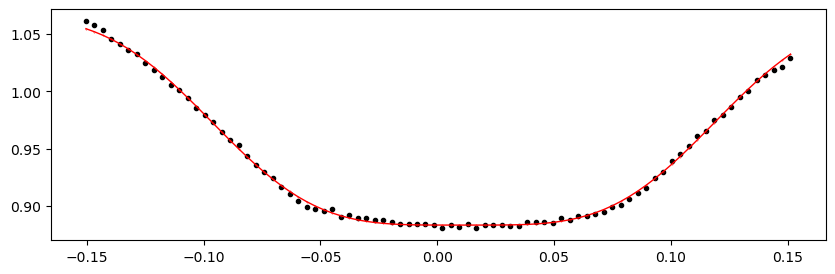

3450.29250844 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.28it/s]


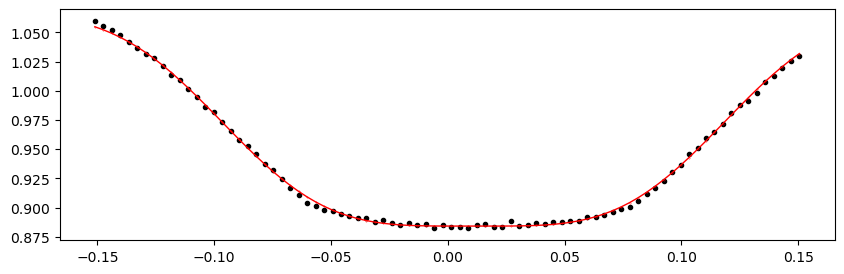

3450.67473796 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.65it/s]


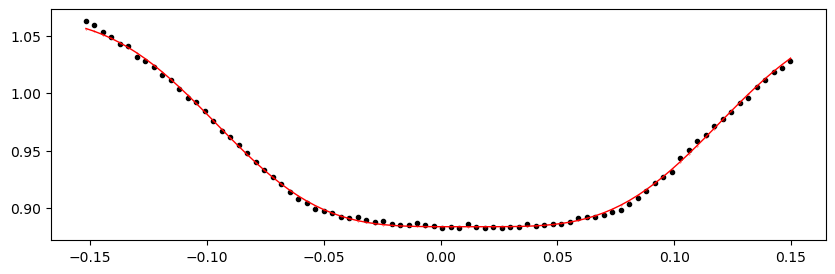

3451.05696748 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.94it/s]


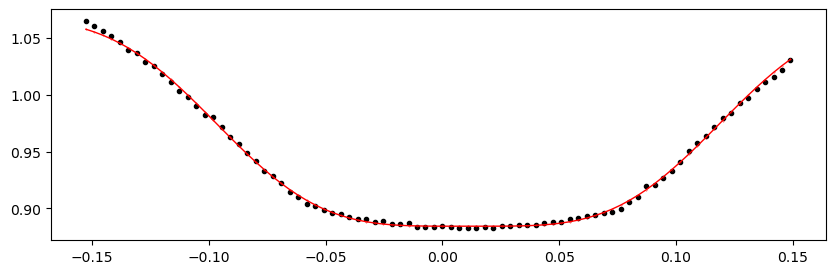

3451.4391969999997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.10it/s]


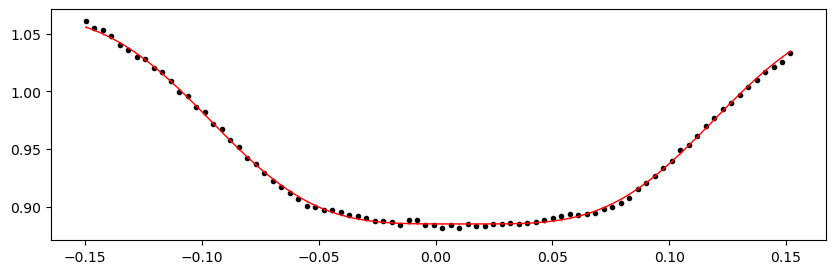

3451.82142652 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.58it/s]


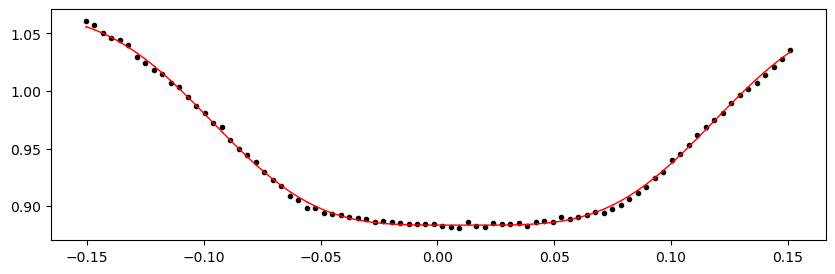

3452.20365604 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.08it/s]


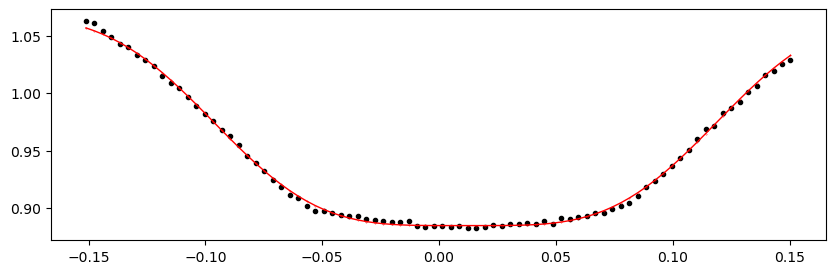

3452.58588556 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.12it/s]


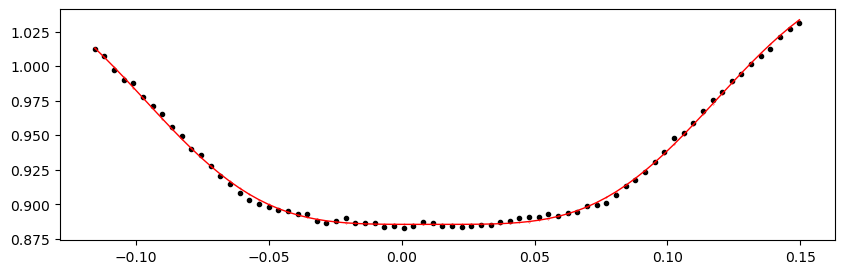

3452.9681150799997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.41it/s]


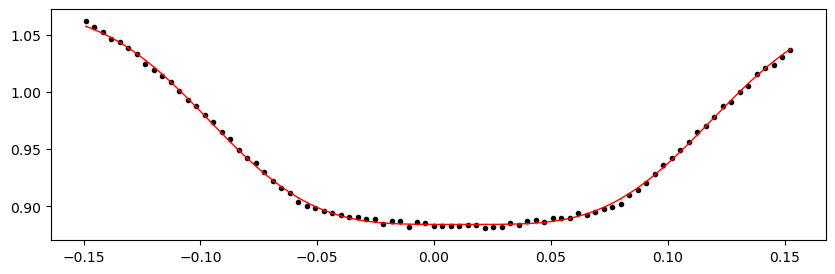

3453.3503446 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.78it/s]


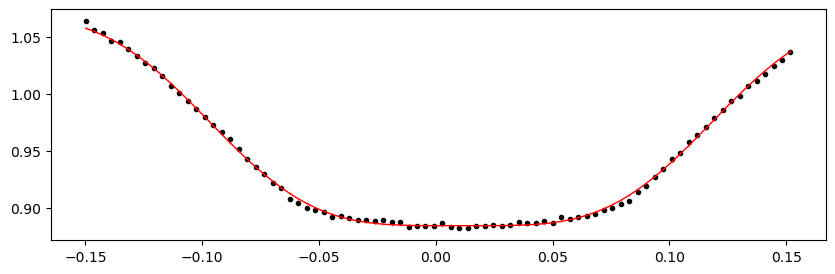

3453.73257412 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.27it/s]


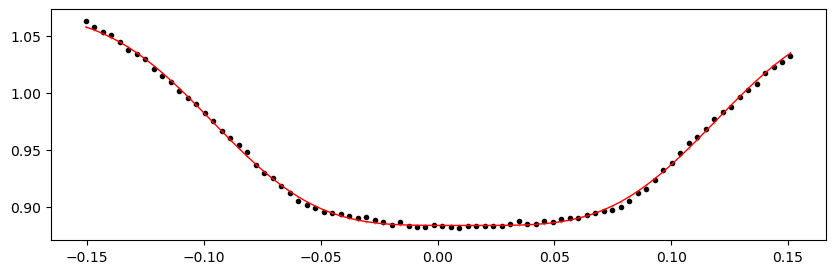

3454.11480364 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.35it/s]


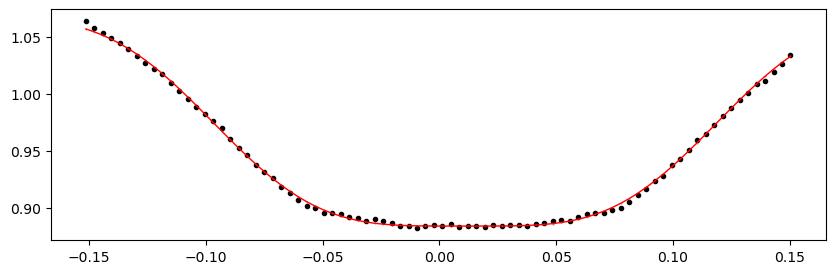

3454.49703316 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.40it/s]


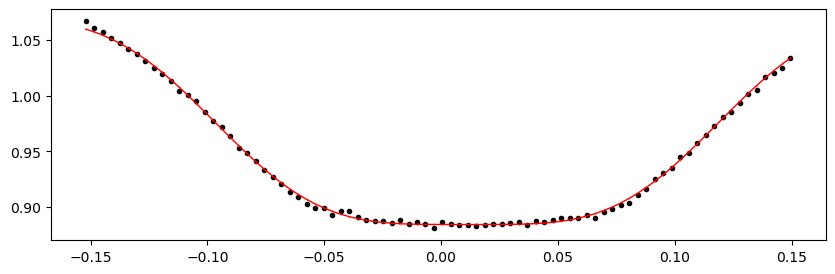

3454.87926268 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.50it/s]


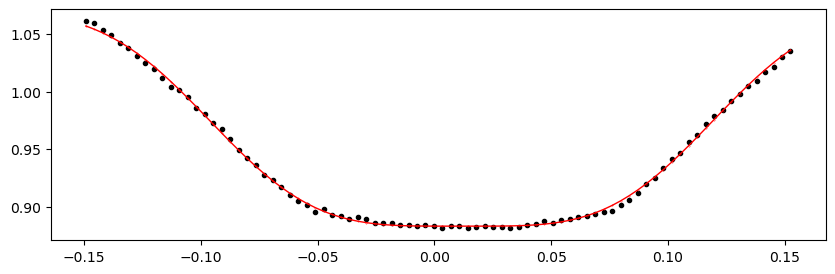

3455.2614922000002 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.26it/s]


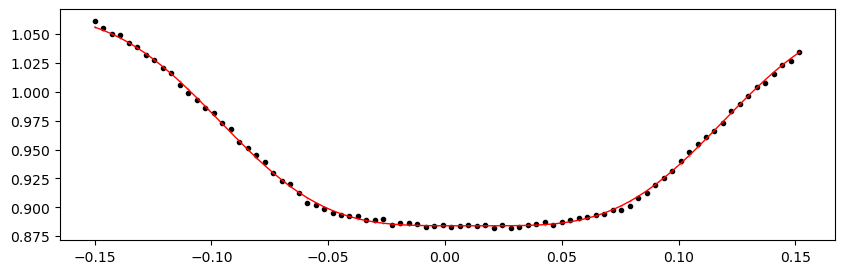

3455.64372172 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.35it/s]


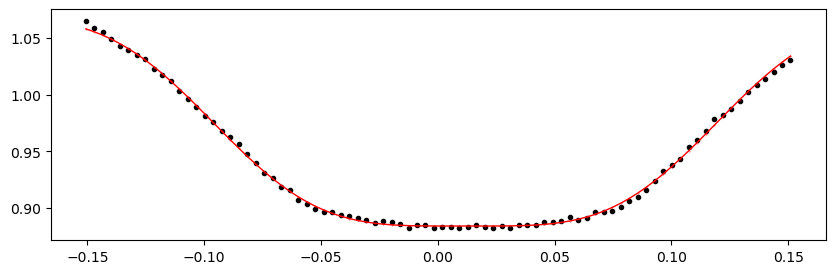

3456.02595124 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.20it/s]


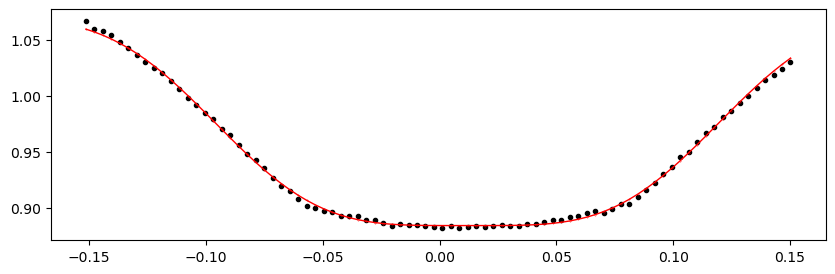

3456.4081807599996 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.13it/s]


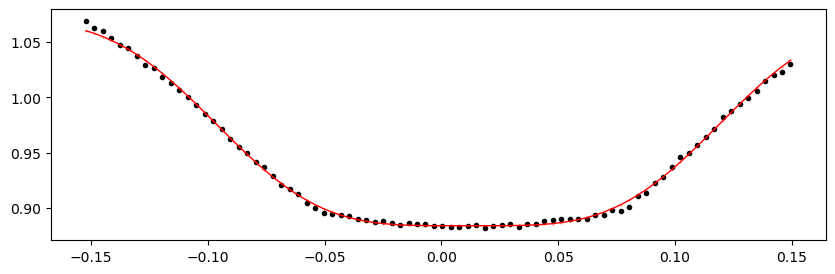

3456.79041028 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.51it/s]


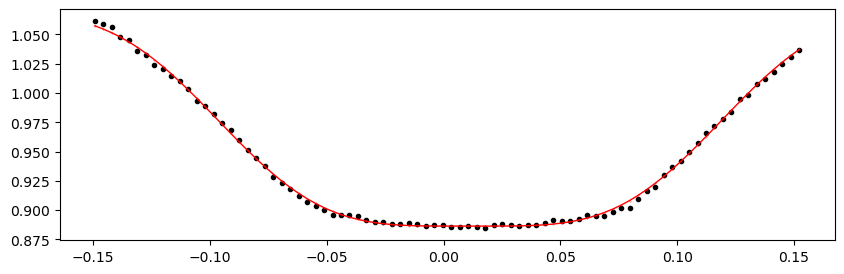

3457.1726398 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.37it/s]


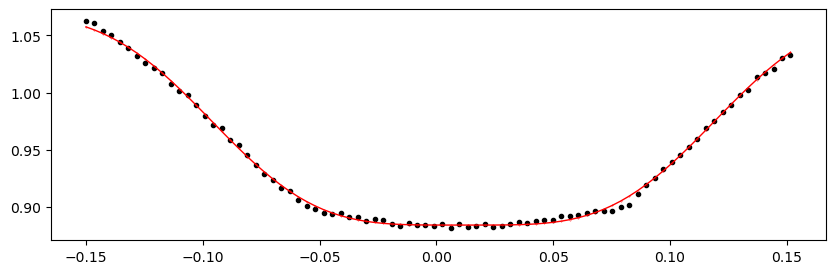

3457.55486932 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.85it/s]


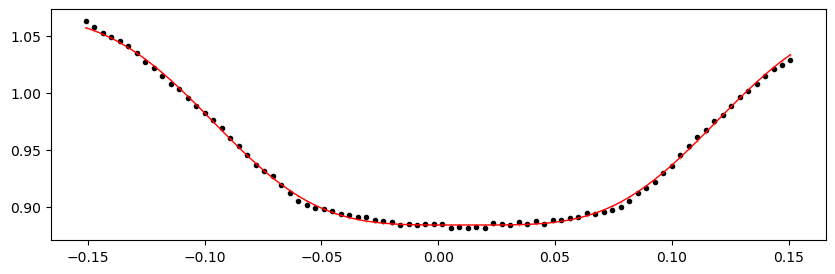

3457.9370988399996 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.96it/s]


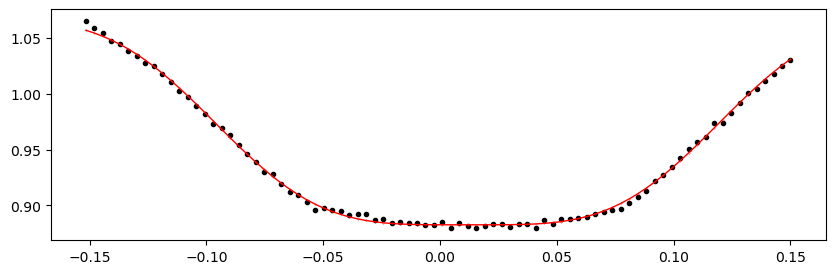

3458.31932836 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.26it/s]


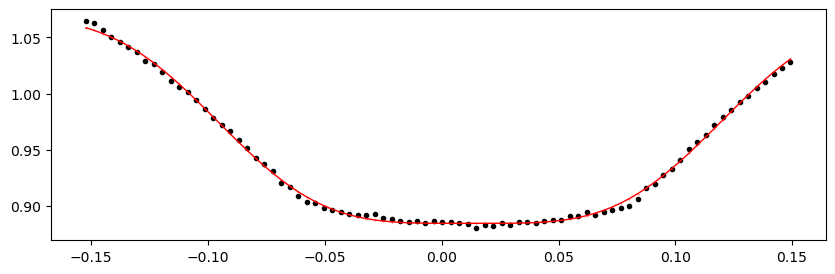

3458.70155788 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.24it/s]


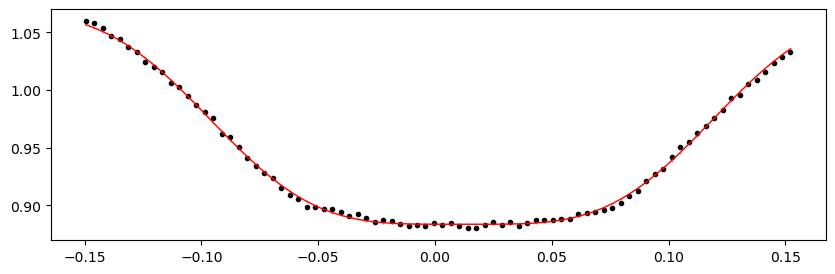

3459.0837874 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.96it/s]


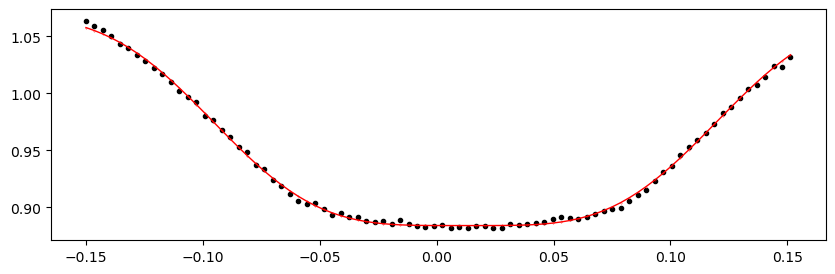

3459.4660169199997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.06it/s]


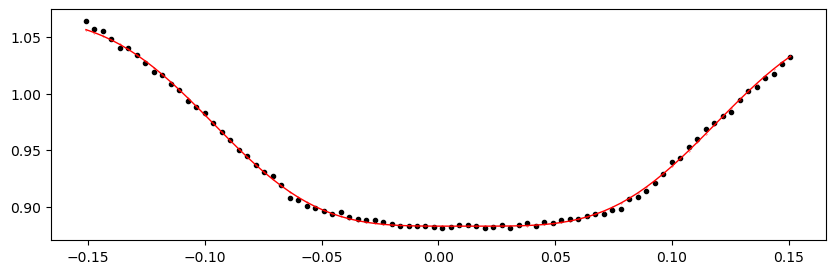

3459.84824644 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.46it/s]


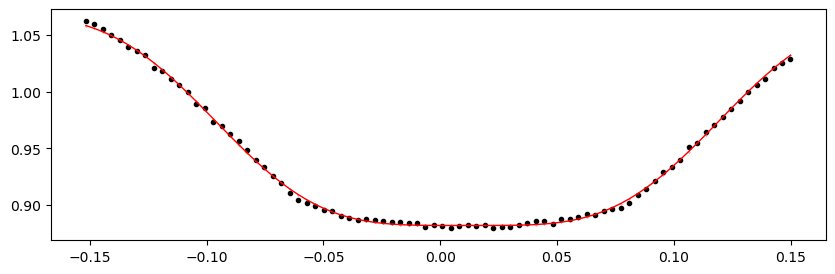

3460.23047596 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.35it/s]


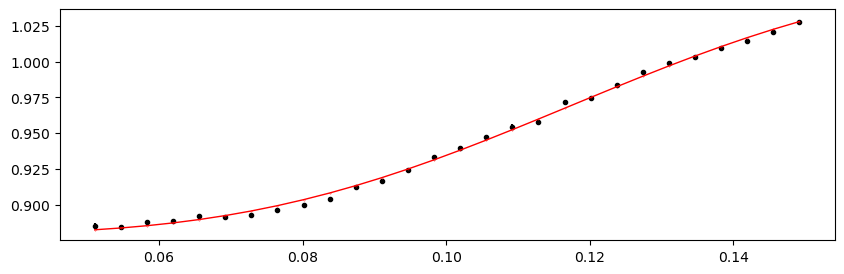

3462.14162356 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.40it/s]


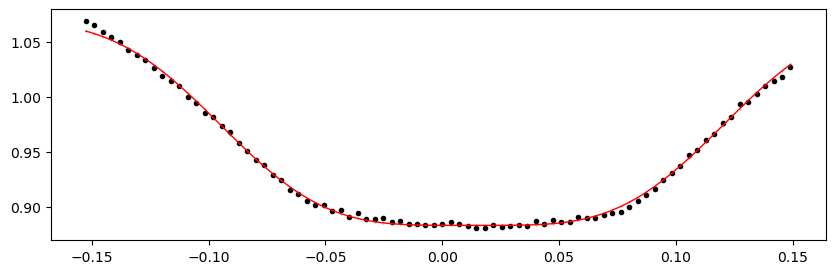

3462.5238530799998 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.80it/s]


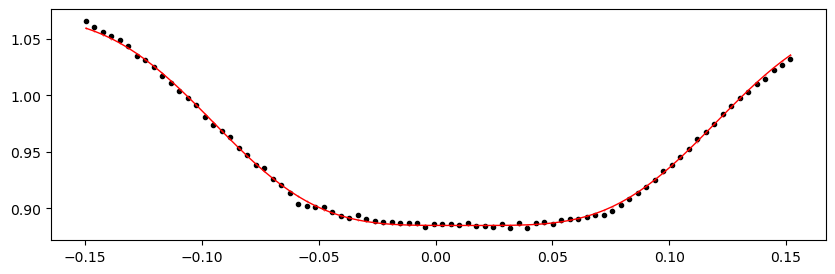

3462.9060826 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.19it/s]


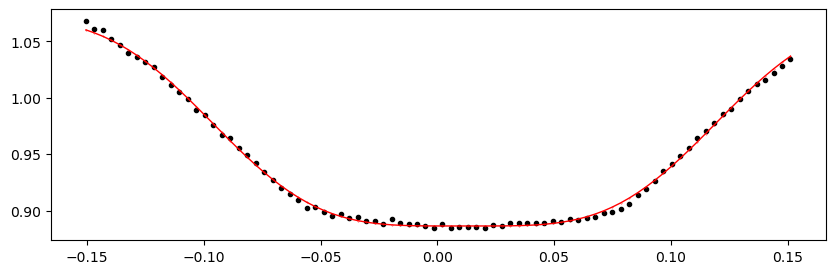

3463.2883121200002 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.00it/s]


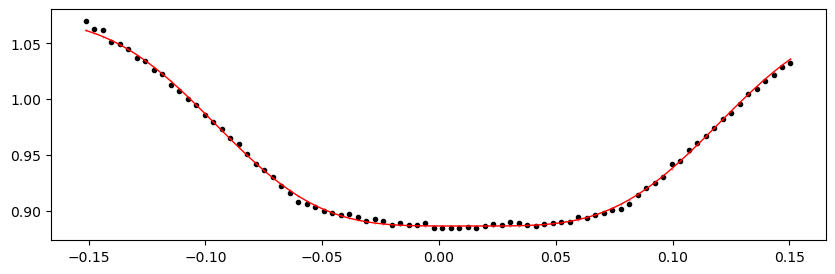

3463.67054164 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.13it/s]


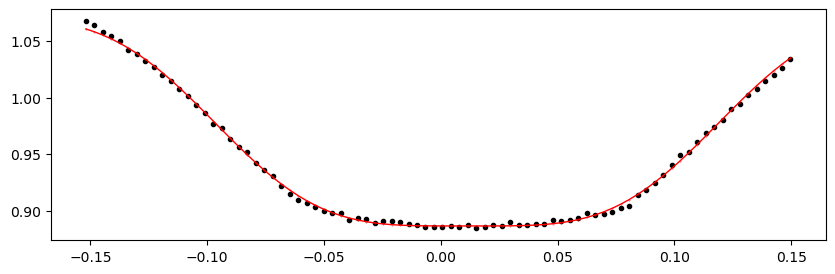

3464.05277116 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.74it/s]


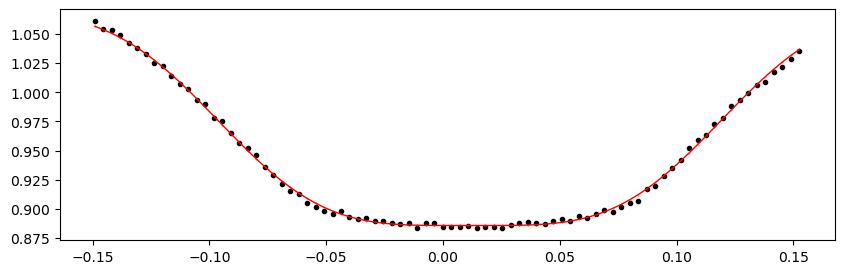

3464.43500068 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.49it/s]


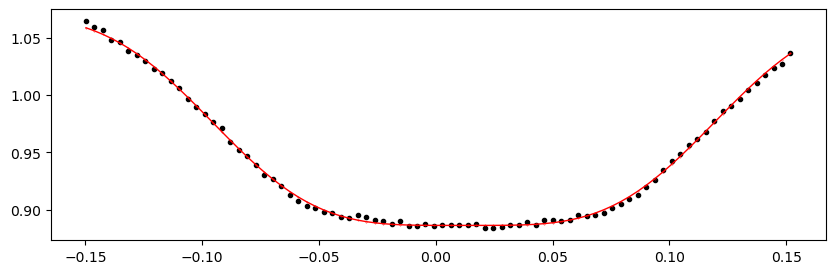

3464.8172302 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.86it/s]


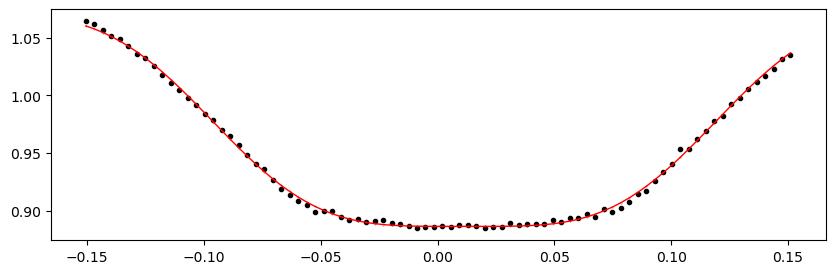

3465.19945972 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.27it/s]


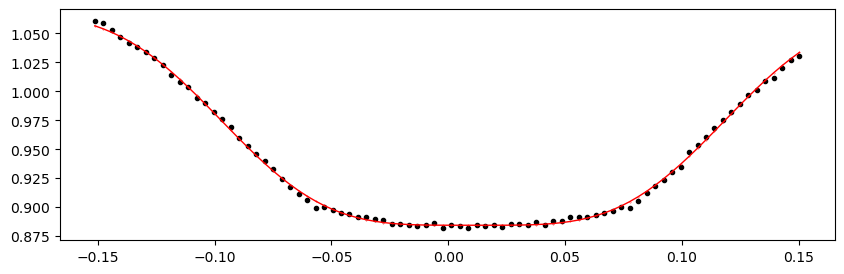

3465.58168924 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.41it/s]


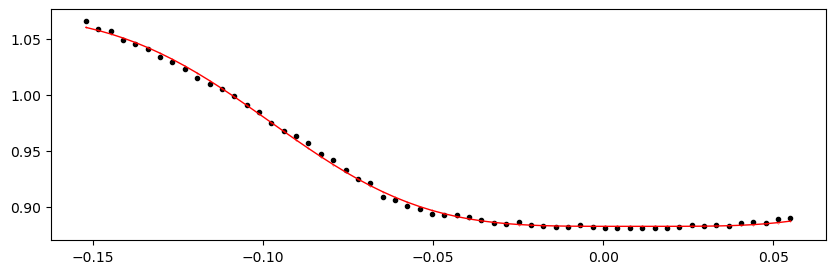

3465.9639187599996 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.83it/s]


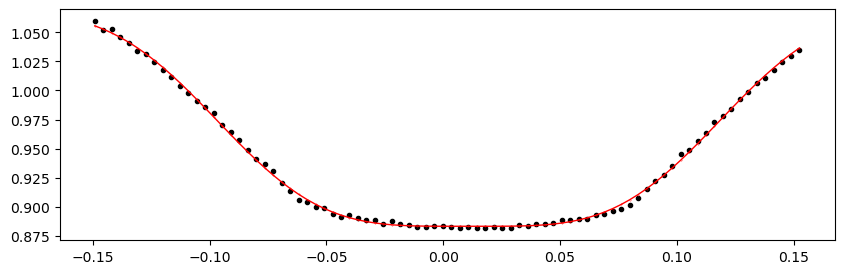

3466.34614828 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.22it/s]


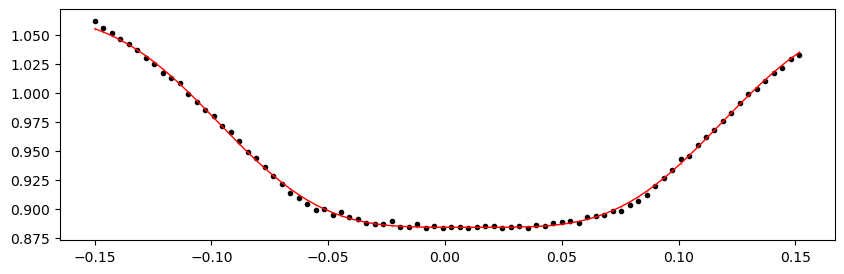

3466.7283778 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.65it/s]


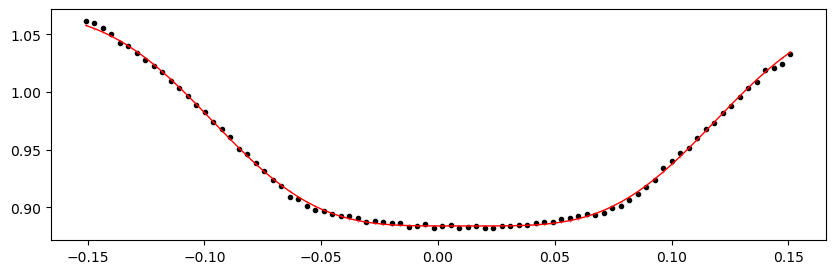

3467.11060732 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.70it/s]


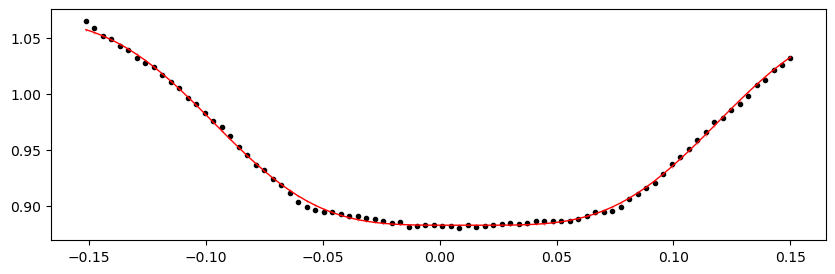

3467.4928368399997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.09it/s]


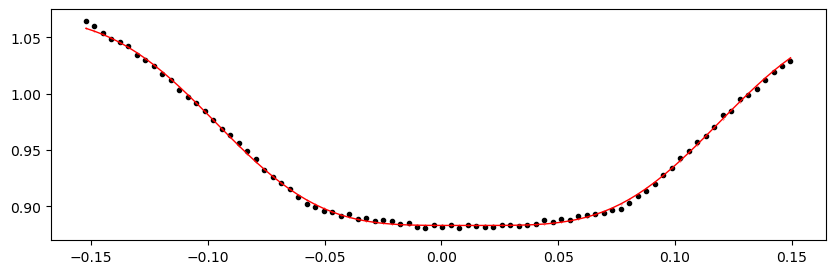

3467.87506636 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.94it/s]


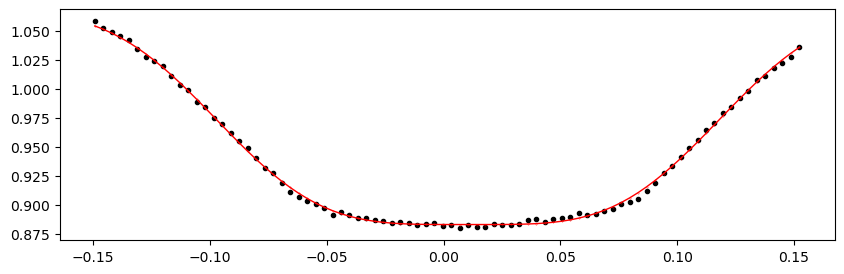

3468.25729588 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.28it/s]


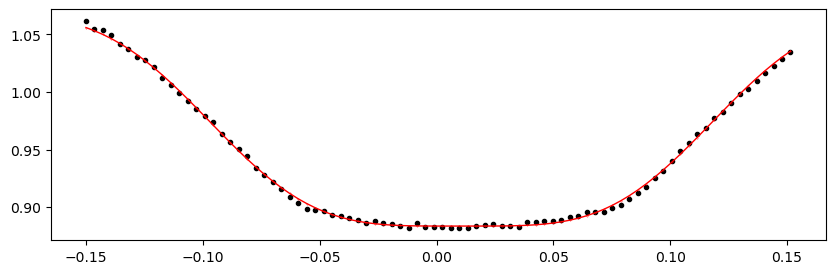

3468.6395254 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.59it/s]


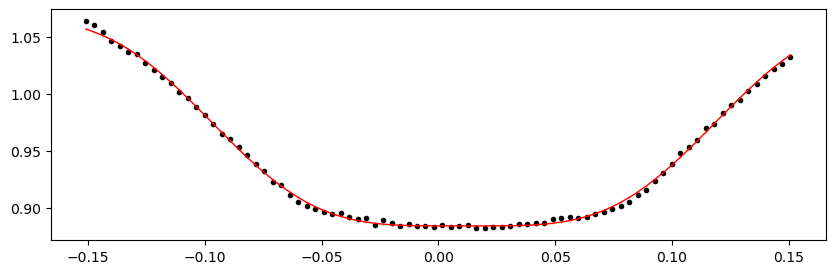

3469.0217549199997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.15it/s]


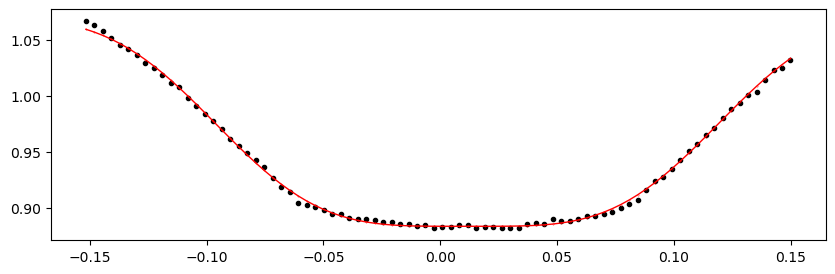

3469.40398444 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.72it/s]


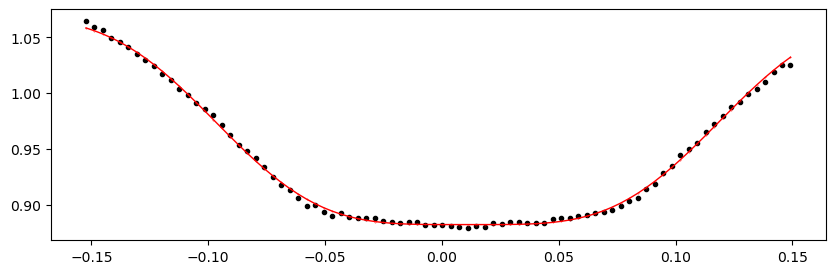

3469.78621396 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.05it/s]


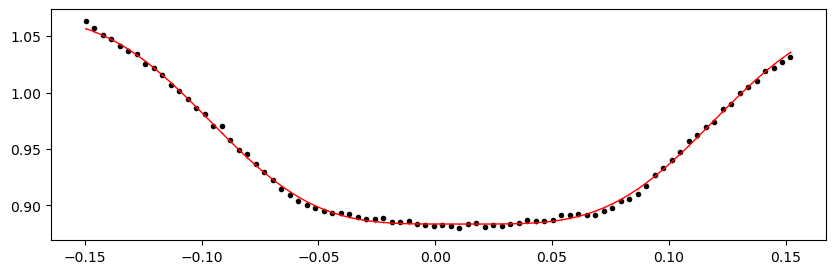

3470.16844348 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 324.69it/s]


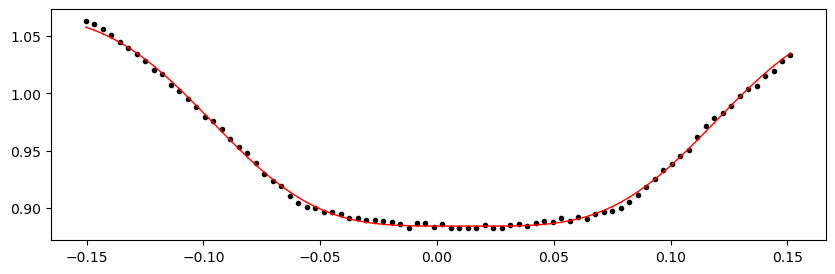

3470.5506729999997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.53it/s]


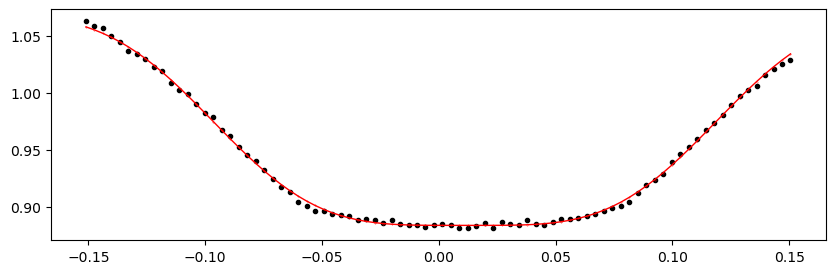

3470.93290252 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.64it/s]


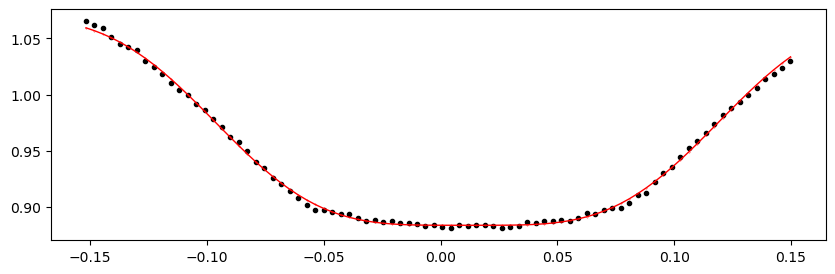

3471.31513204 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.45it/s]


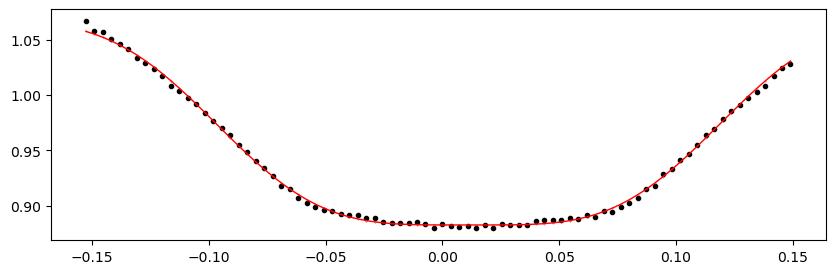

3471.69736156 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.05it/s]


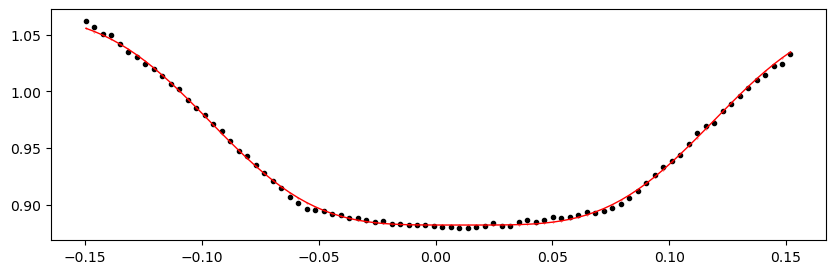

3472.07959108 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.65it/s]


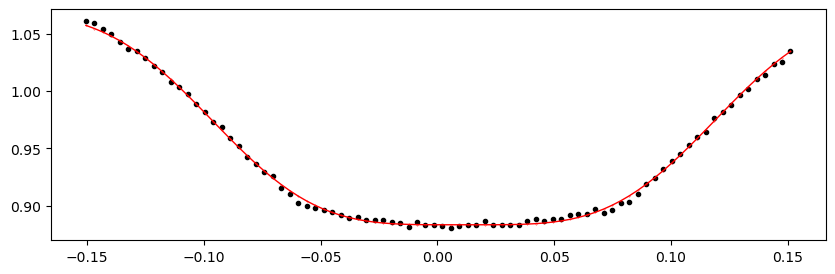

3472.4618206 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.12it/s]


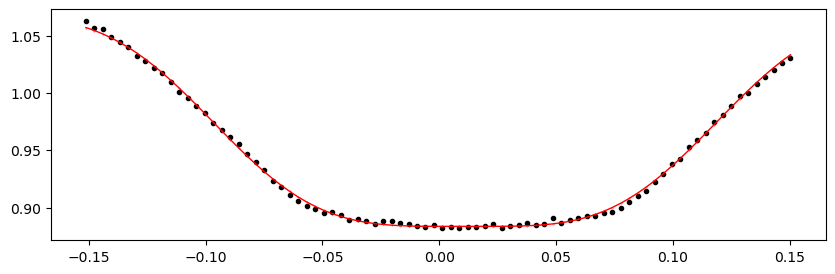

3472.8440501200002 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.22it/s]


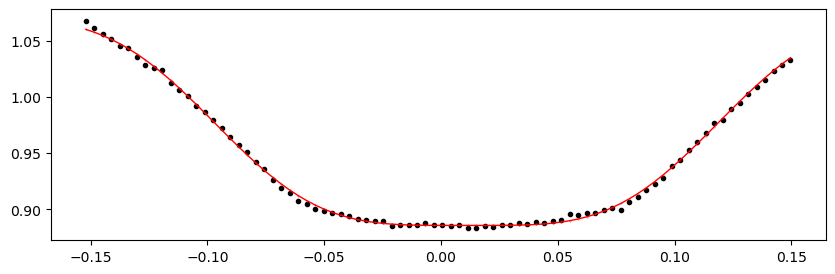

3473.60850916 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.23it/s]


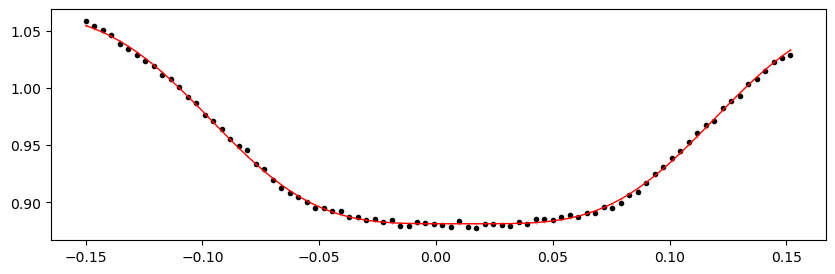

3473.9907386799996 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.43it/s]


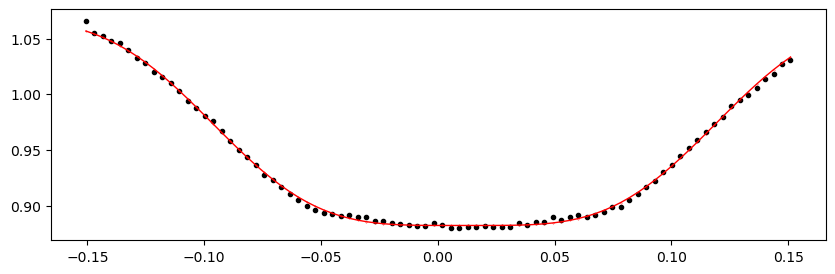

3474.3729682 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.89it/s]


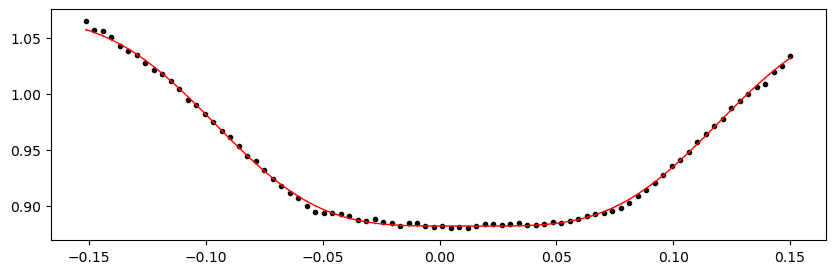

3474.75519772 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.10it/s]


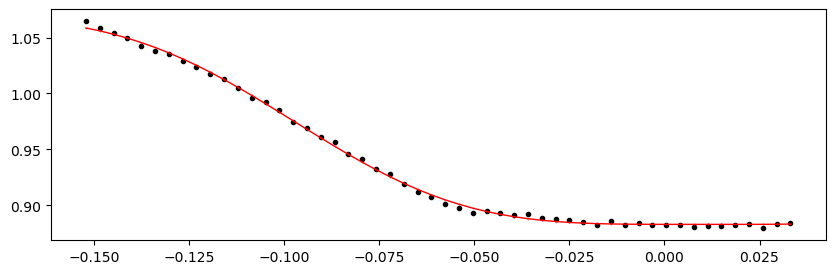

3476.2841158 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.12it/s]


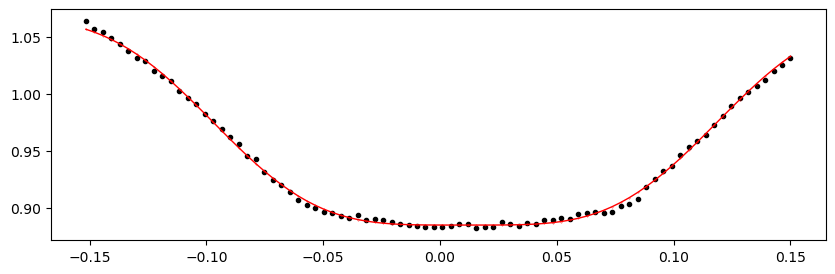

3476.66634532 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 323.53it/s]


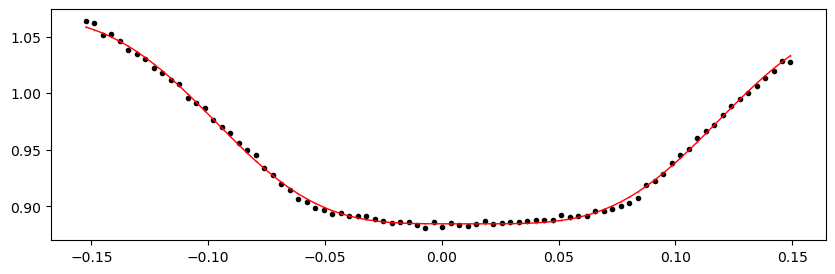

3477.0485748399997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.55it/s]


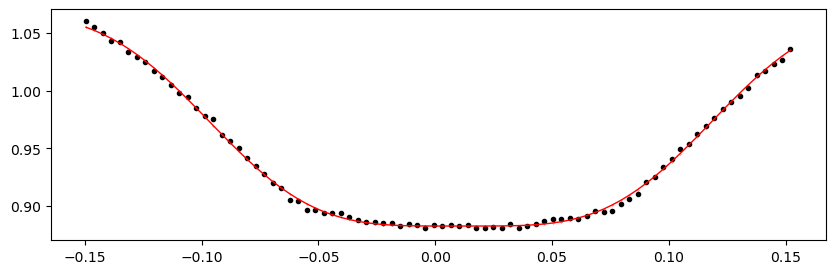

3477.43080436 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.55it/s]


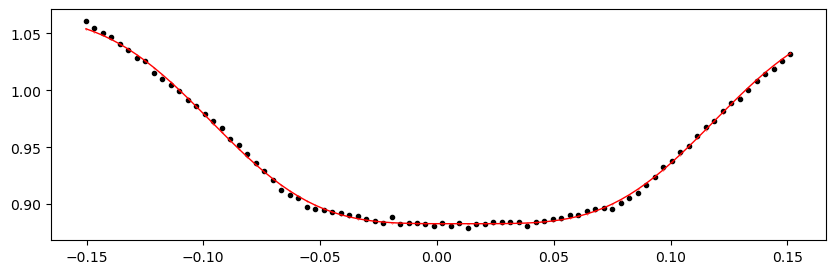

3477.81303388 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.65it/s]


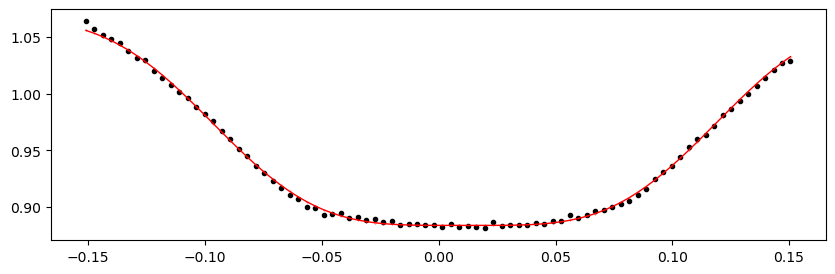

3478.1952634 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 314.03it/s]


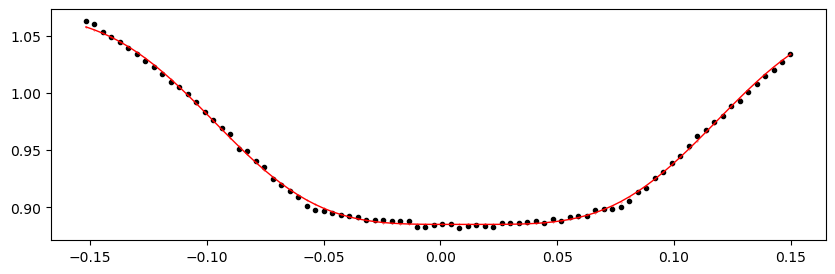

3478.5774929199997 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.03it/s]


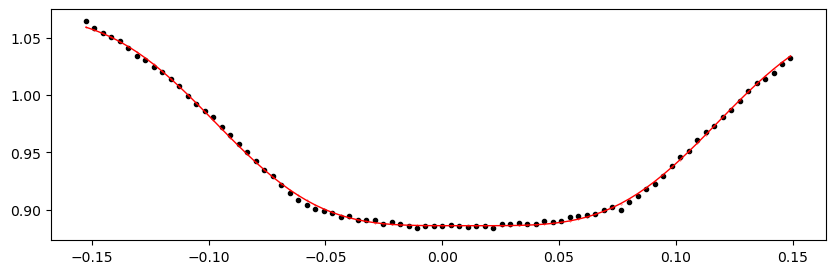

3478.95972244 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.99it/s]


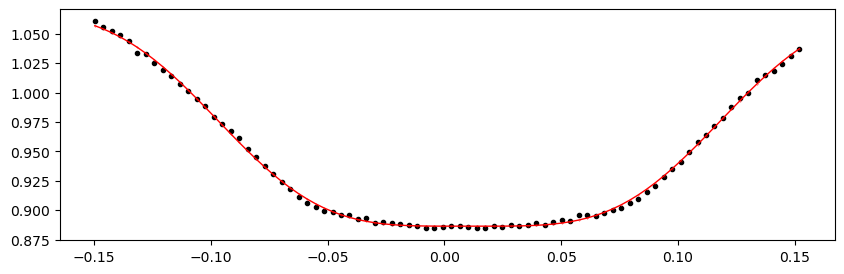

3479.34195196 1.067708253737462 -0.1838006450698242 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.56it/s]


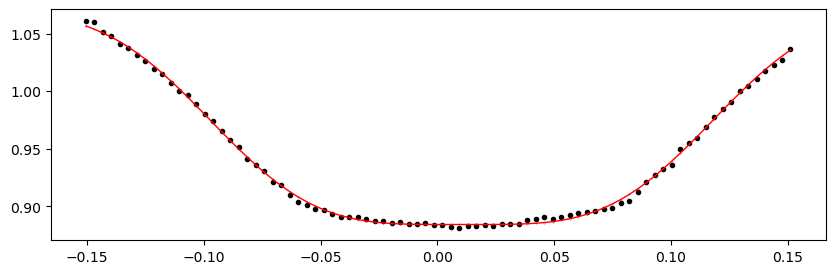

Time 3479.72418148 does not have enough data points: 8


In [68]:
%matplotlib inline

# from importlib import reload
# reload(etv_functions)

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path,
                                   min_number_data=15,  # accomodate TESS-SPOC 10-min cadence data
                              )
!$NOTIFY_CMD "Individual primary eclipses fit done"


Fitting individual secondary eclipses...
Creating new manifest file
1955.9662 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.34it/s]


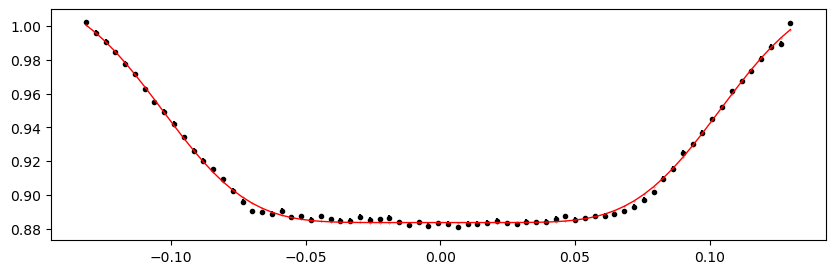

1956.34842952 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.69it/s]


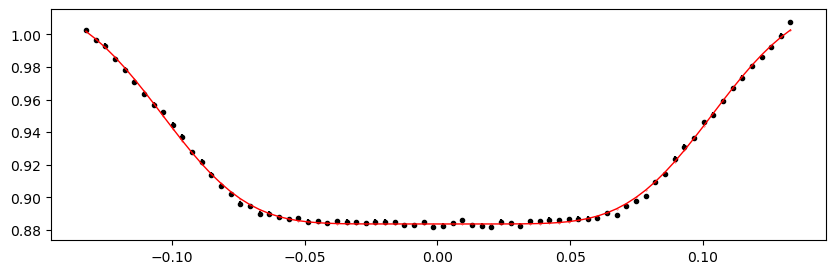

1956.73065904 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.56it/s]


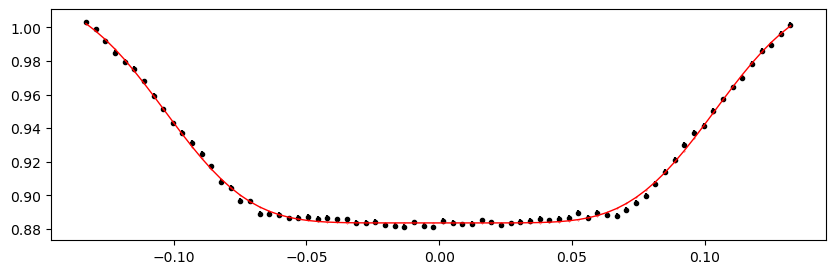

1957.11288856 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.21it/s]


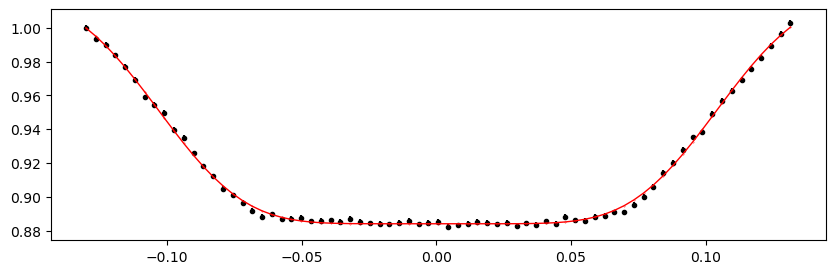

1957.49511808 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 357.01it/s]


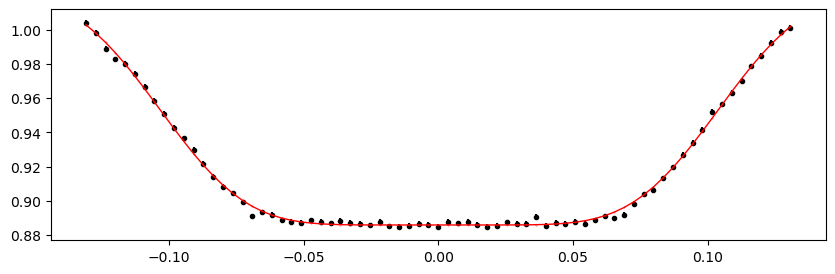

1957.8773476000001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.55it/s]


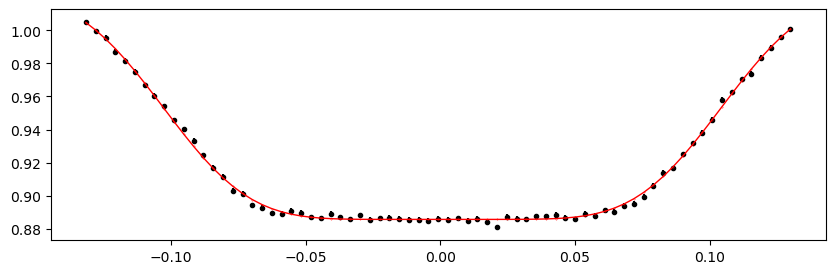

1958.2595771200001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.94it/s]


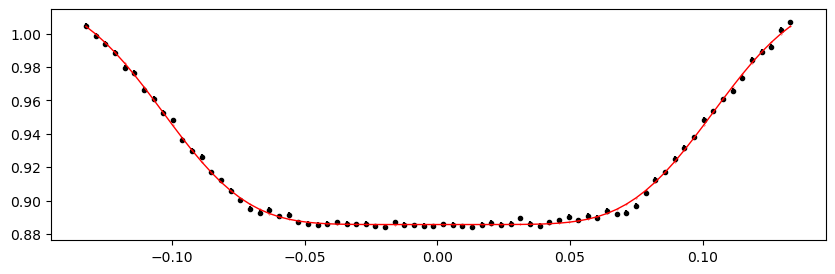

1958.6418066400001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.83it/s]


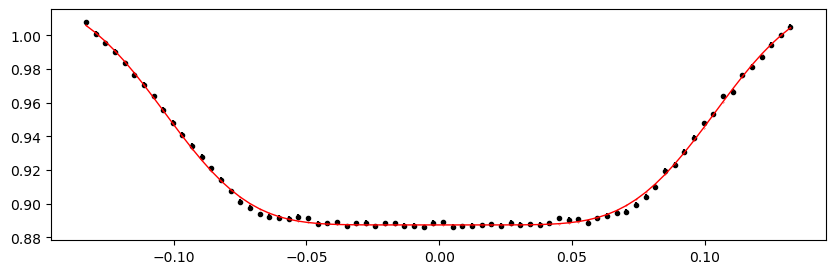

1959.0240361600002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.38it/s]


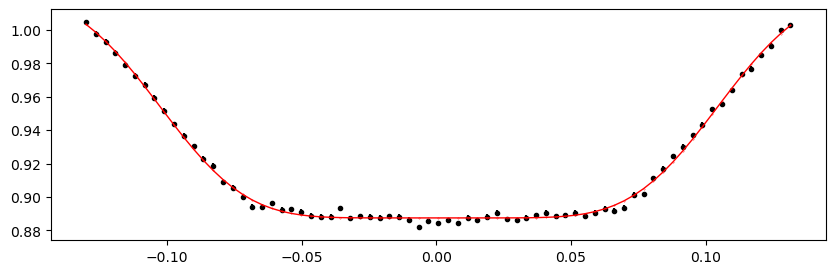

1959.4062656800002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.18it/s]


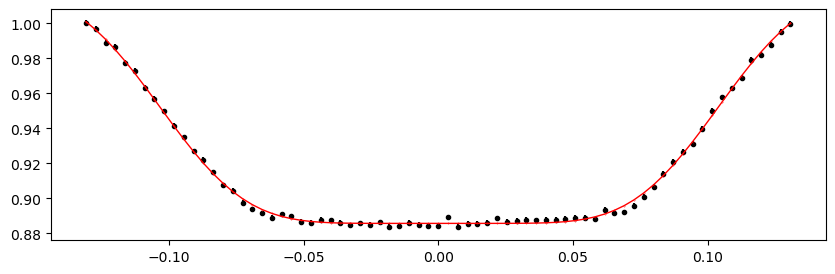

1959.7884952000002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.60it/s]


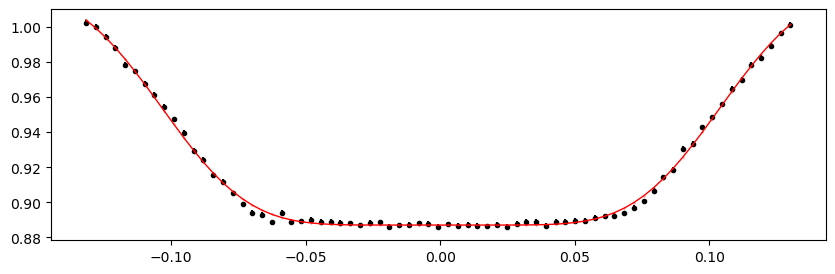

1960.1707247200002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.32it/s]


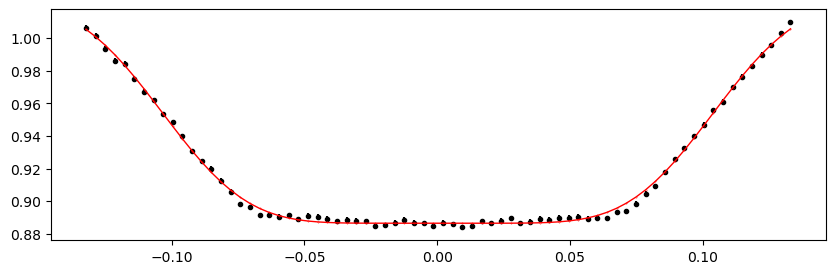

1960.55295424 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.71it/s]


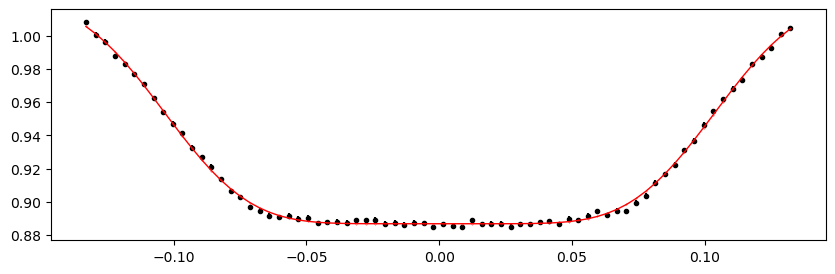

1960.93518376 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.09it/s]


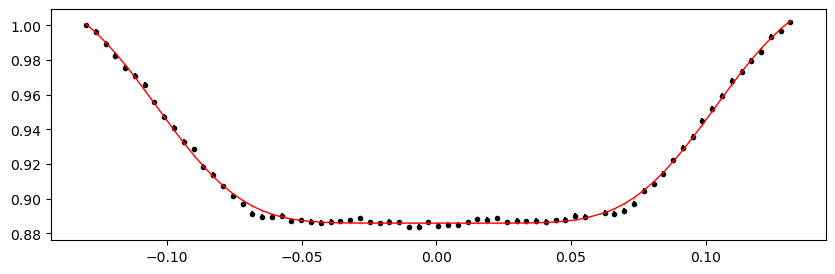

1961.31741328 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.45it/s]


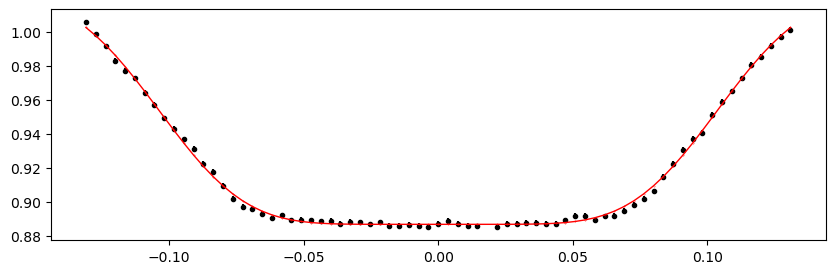

1961.6996428 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.57it/s]


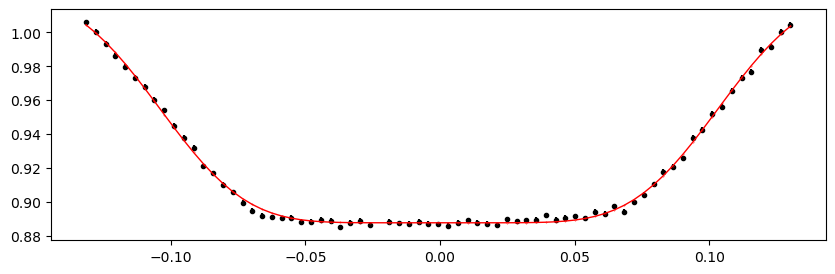

1962.08187232 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.18it/s]


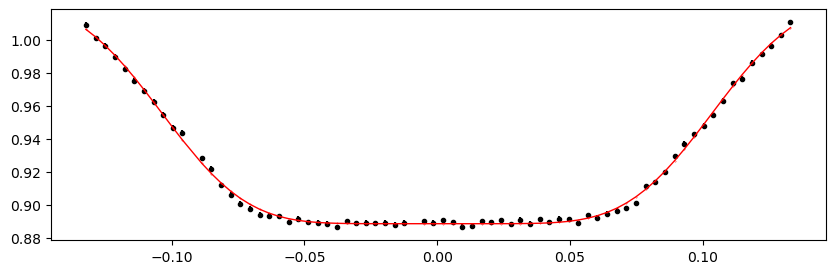

1962.46410184 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.75it/s]


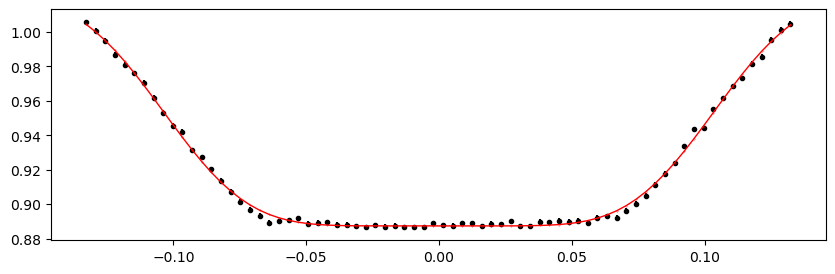

1962.84633136 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.25it/s]


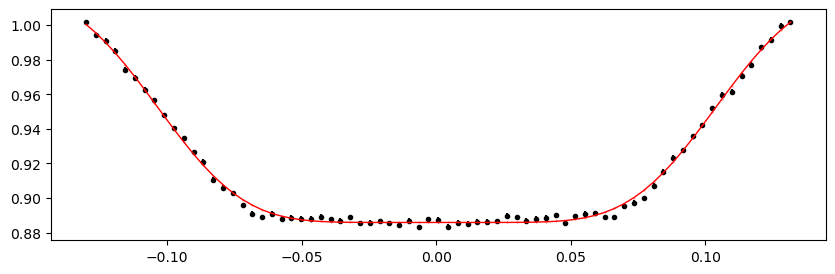

1963.22856088 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.21it/s]


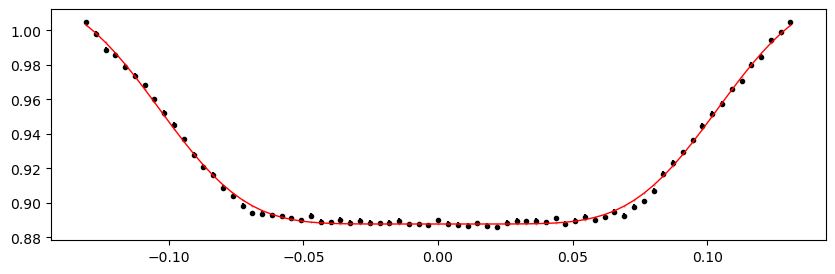

1963.6107904 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.43it/s]


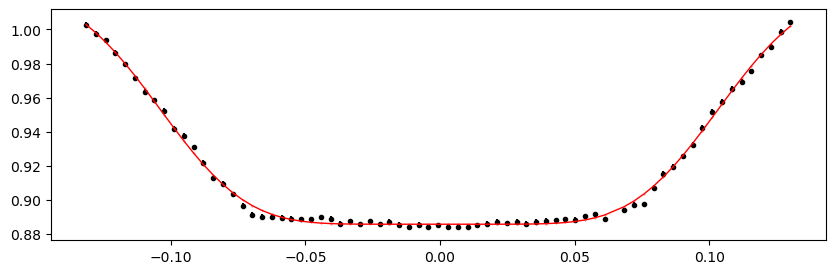

1963.99301992 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.03it/s]


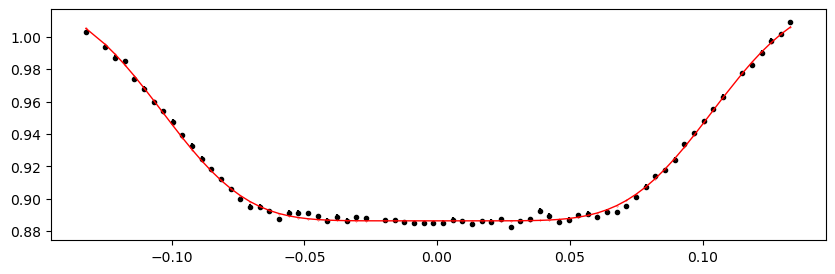

1964.37524944 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.33it/s]


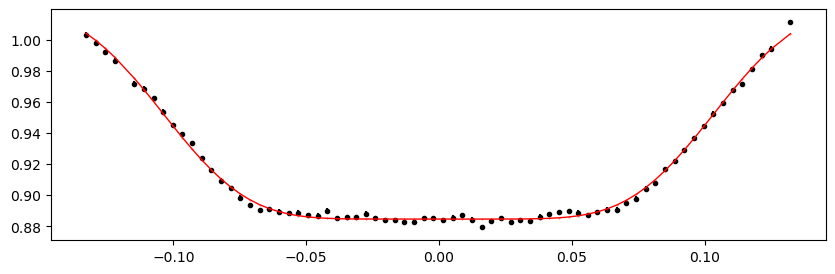

1964.75747896 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.73it/s]


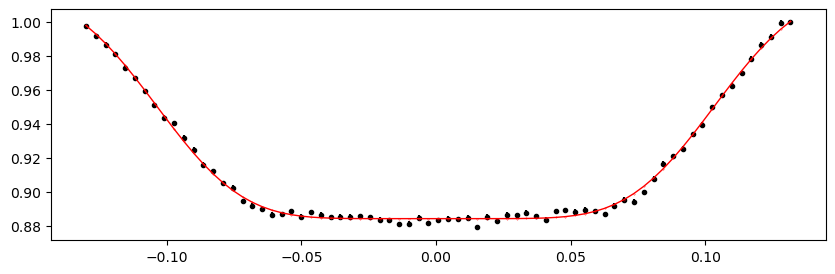

1965.13970848 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 357.12it/s]


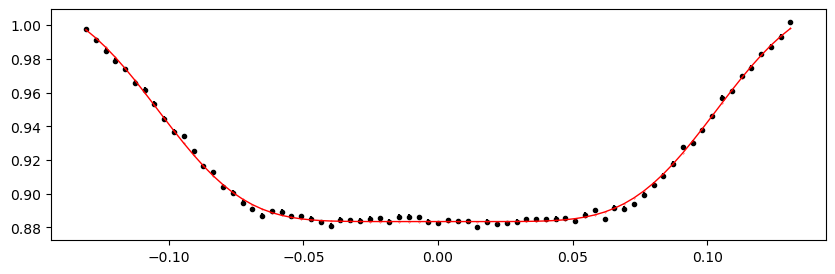

1965.521938 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.74it/s]


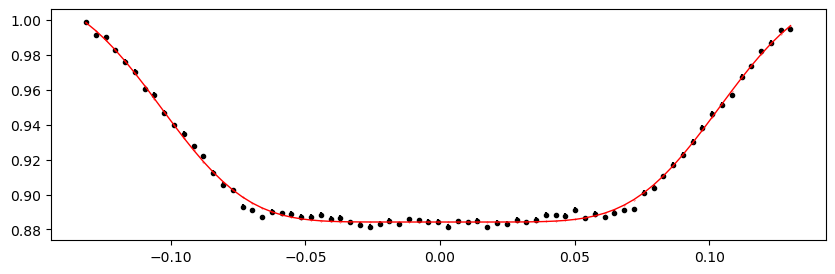

1965.90416752 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.10it/s]


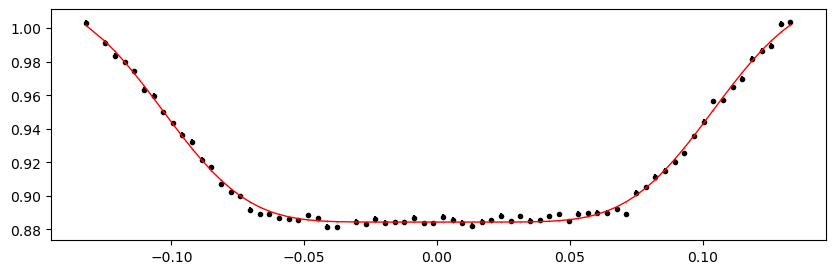

1966.28639704 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.84it/s]


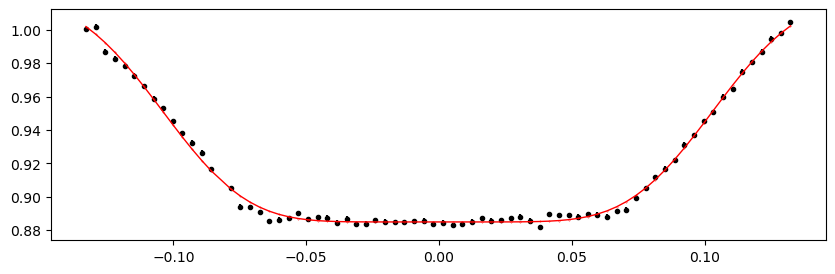

1966.6686265600001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.09it/s]


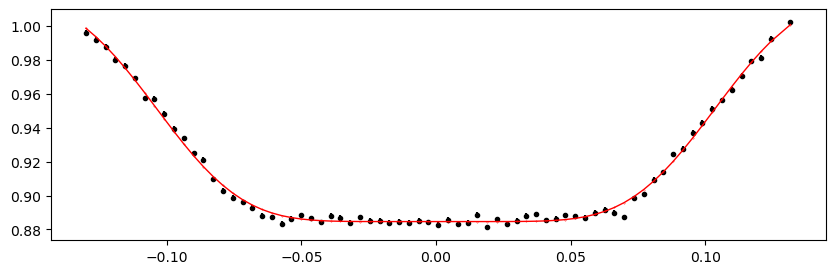

1967.0508560800001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.07it/s]


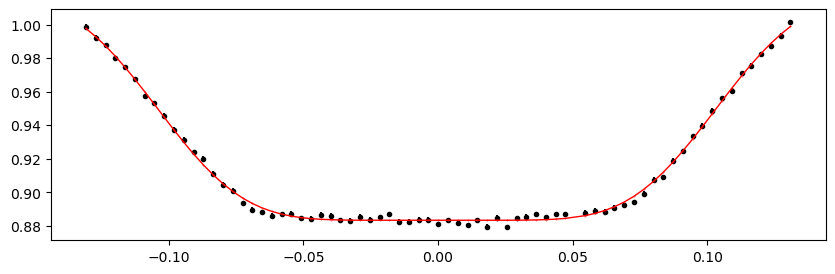

1967.4330856000001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.23it/s]


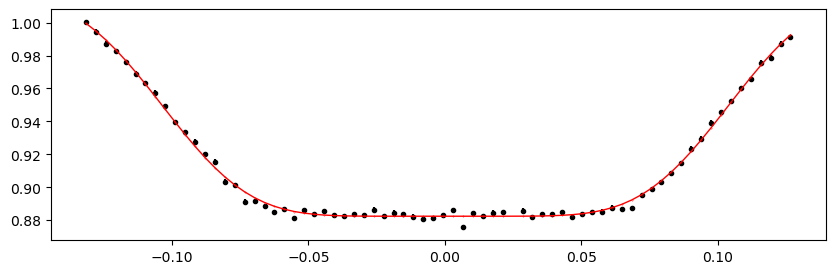

1967.8153151200002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.84it/s]


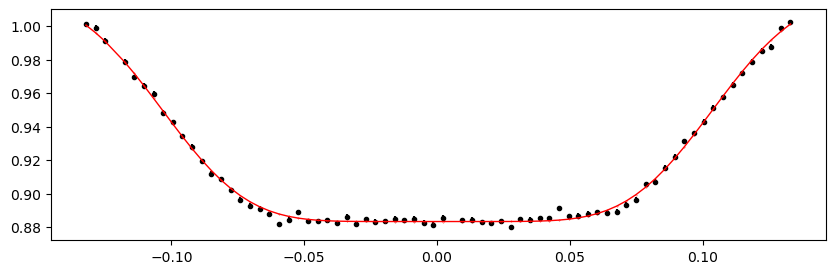

1968.1975446400002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.28it/s]


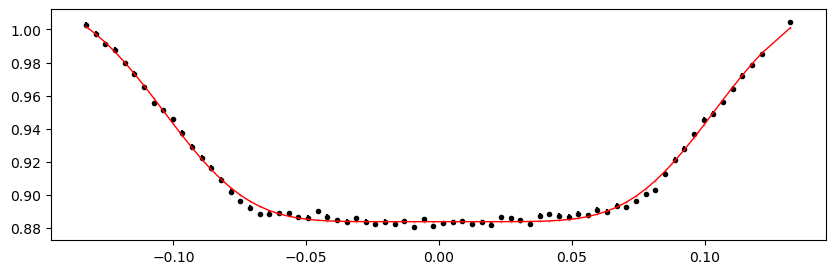

1969.3442332 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.44it/s]


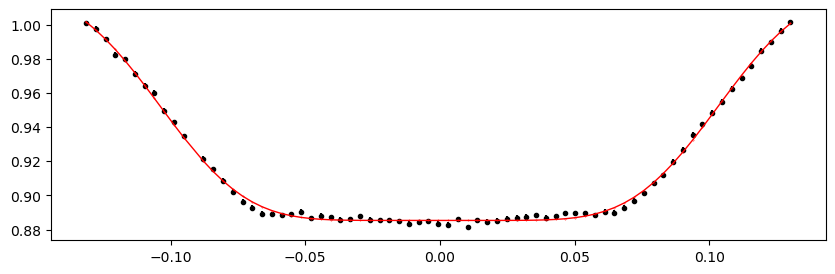

1969.72646272 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.15it/s]


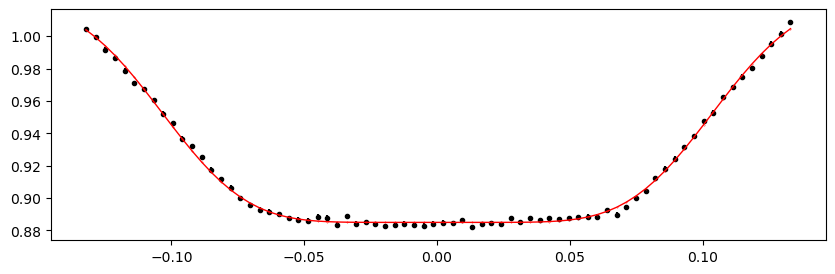

1970.10869224 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.87it/s]


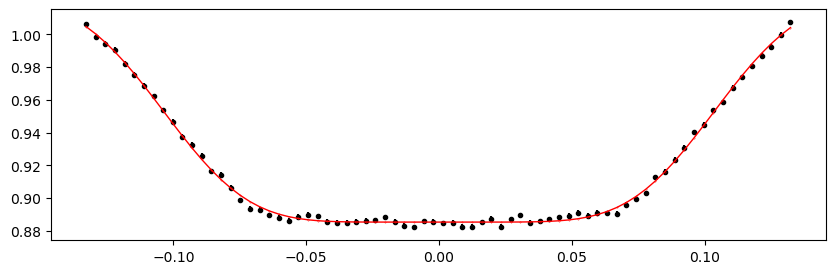

1970.49092176 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.40it/s]


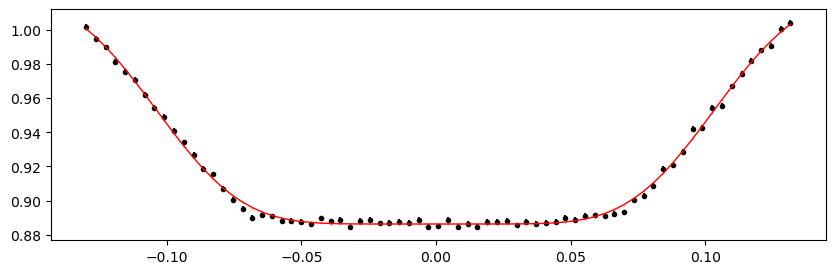

1970.87315128 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.35it/s]


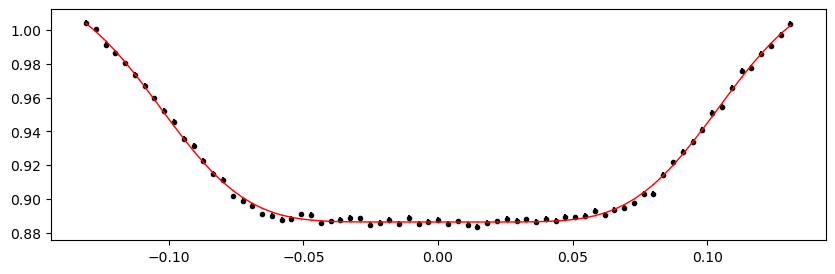

1971.2553808 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.15it/s]


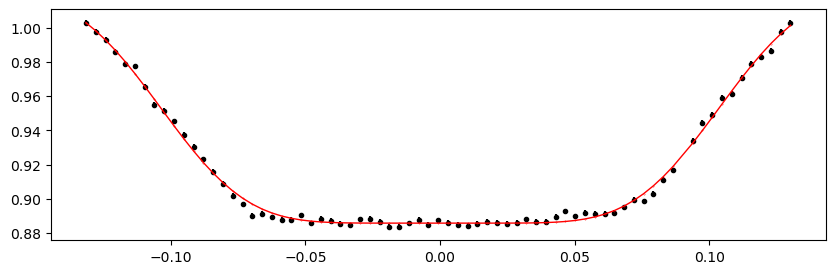

1971.63761032 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.43it/s]


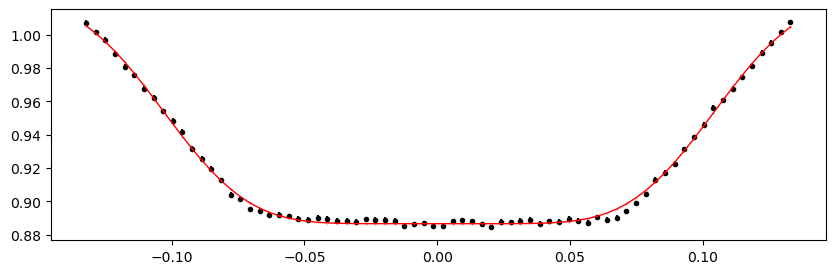

1972.01983984 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.56it/s]


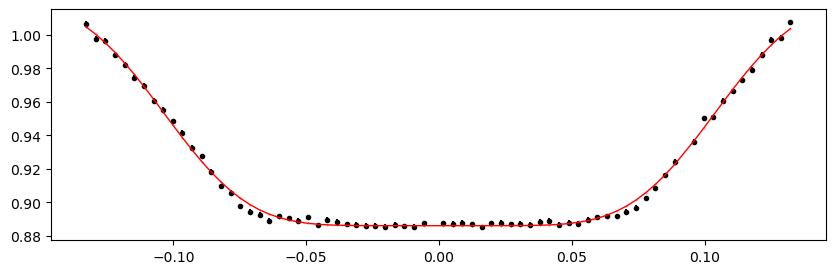

1972.40206936 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.26it/s]


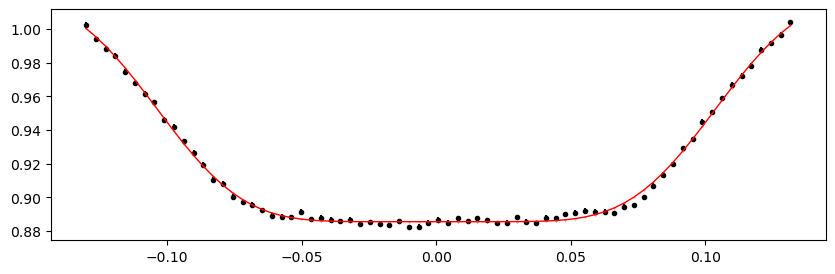

1972.78429888 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.68it/s]


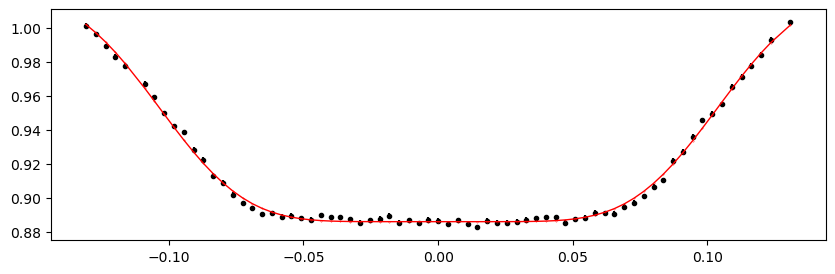

1973.1665284 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.23it/s]


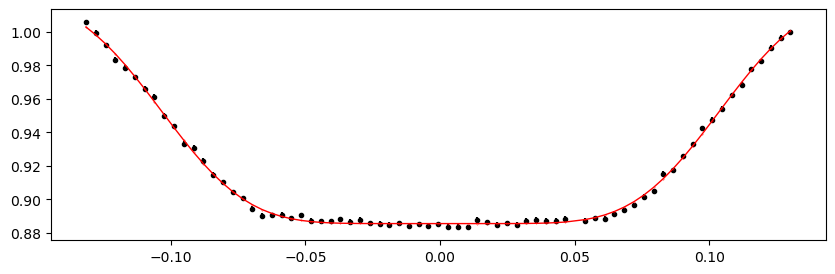

1973.54875792 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.45it/s]


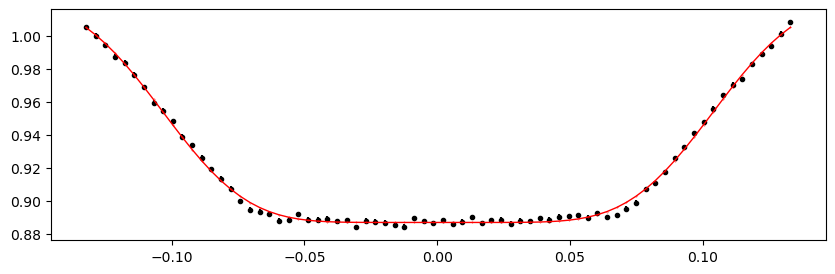

1973.93098744 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.78it/s]


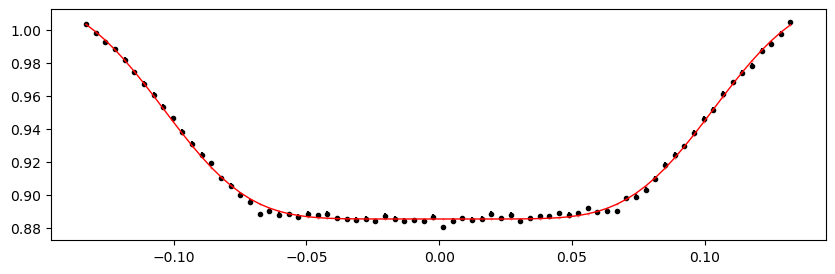

1974.31321696 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.90it/s]


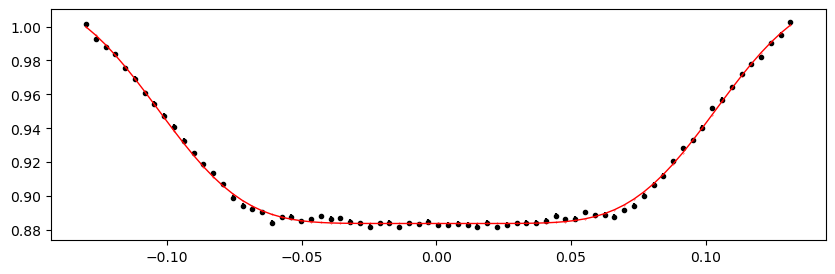

1974.69544648 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.04it/s]


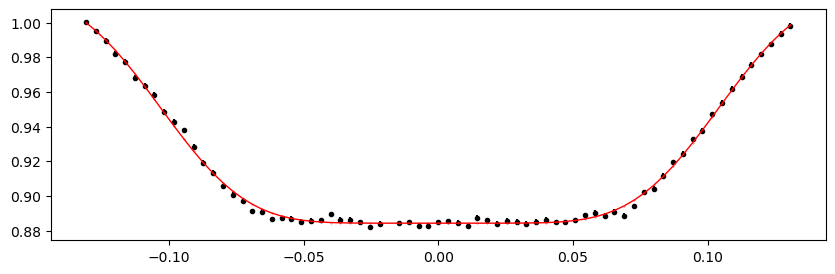

1975.077676 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.22it/s]


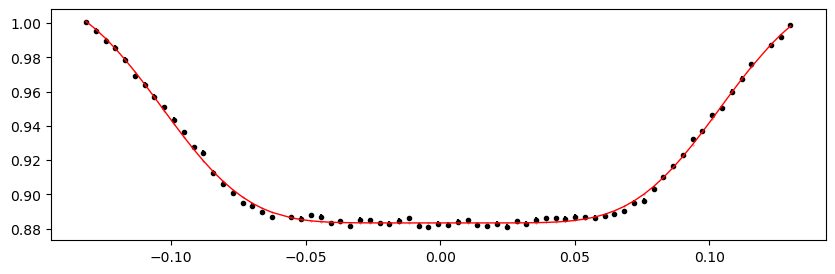

1975.4599055200001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.06it/s]


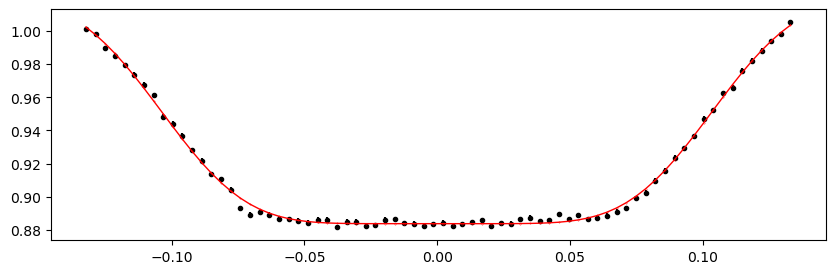

1975.8421350400001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.01it/s]


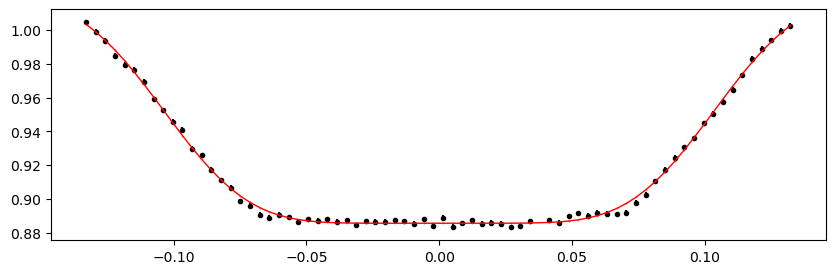

1976.2243645600001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.20it/s]


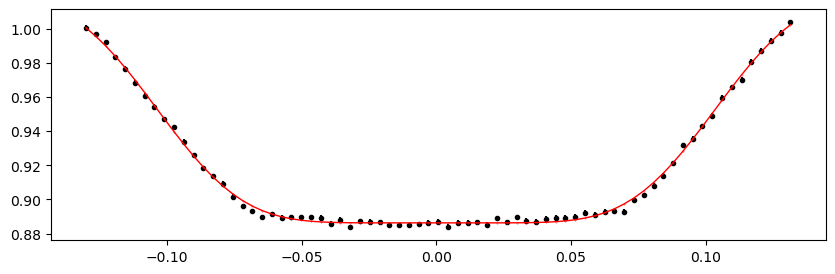

1976.6065940800001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.68it/s]


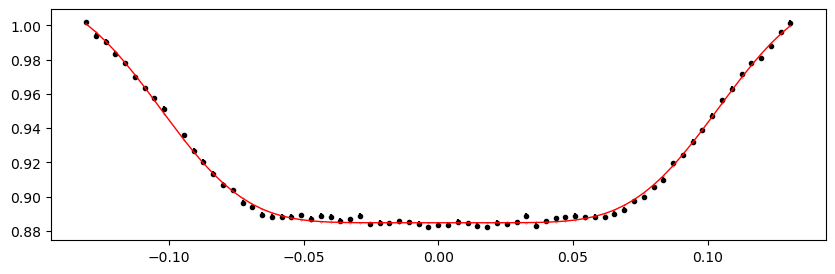

1976.9888236000002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.74it/s]


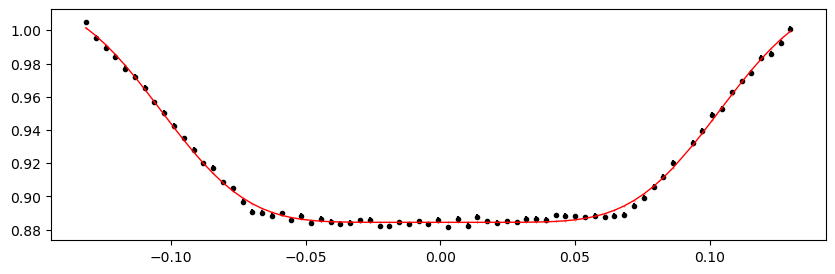

1977.3710531200002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.44it/s]


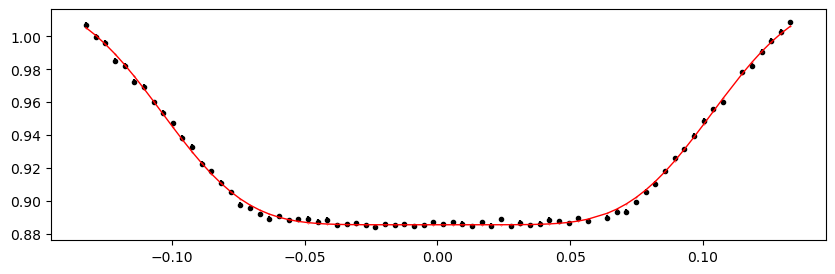

1977.7532826400002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.70it/s]


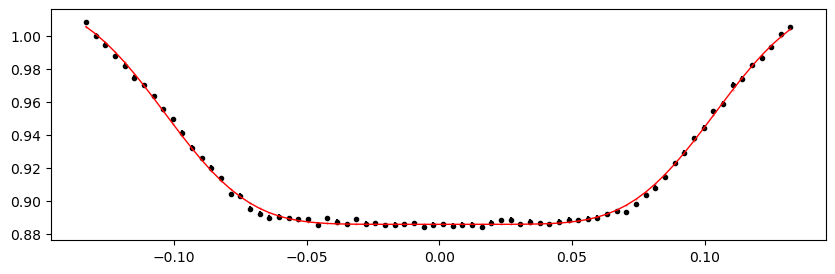

1978.13551216 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.49it/s]


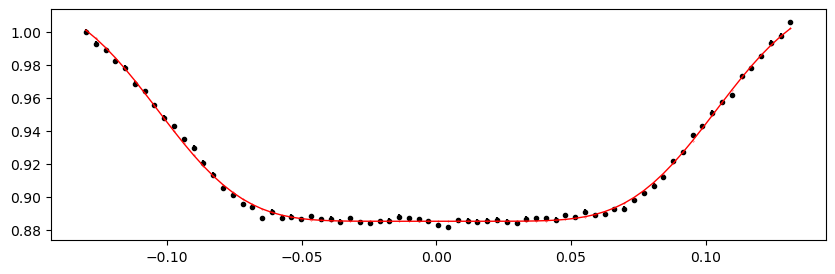

1978.51774168 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.07it/s]


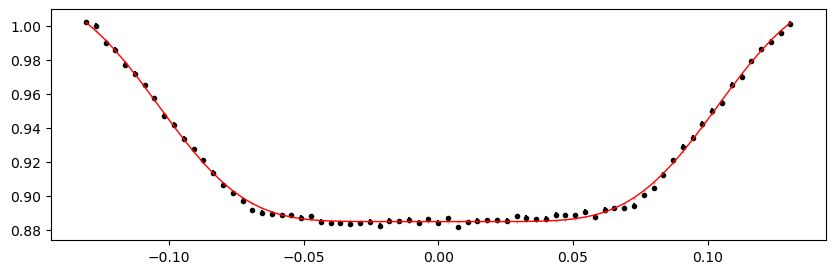

1978.8999712 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.01it/s]


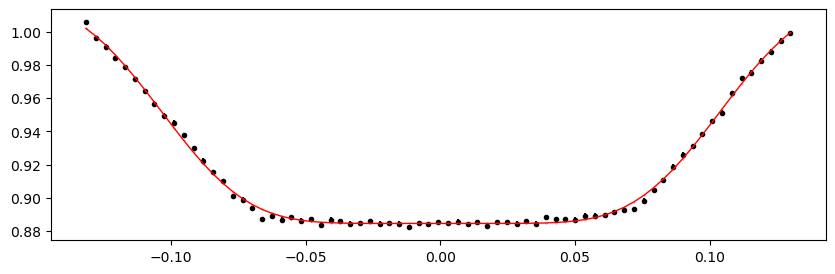

1979.28220072 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.86it/s]


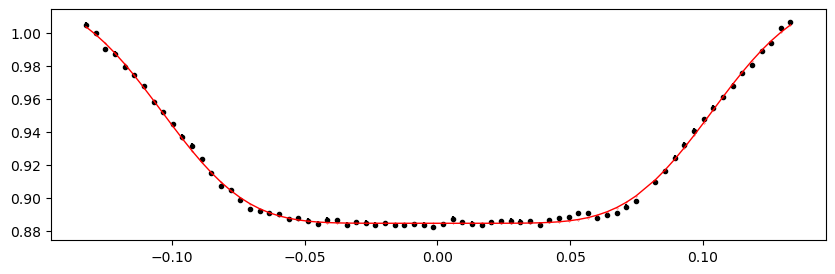

1979.66443024 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.42it/s]


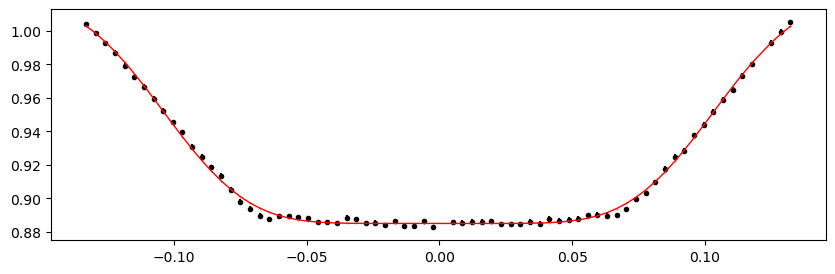

1980.04665976 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.22it/s]


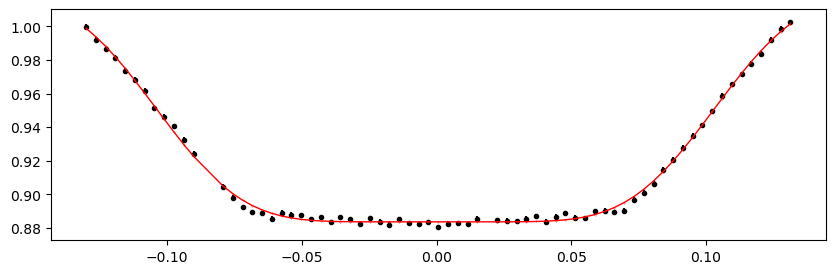

1980.42888928 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.52it/s]


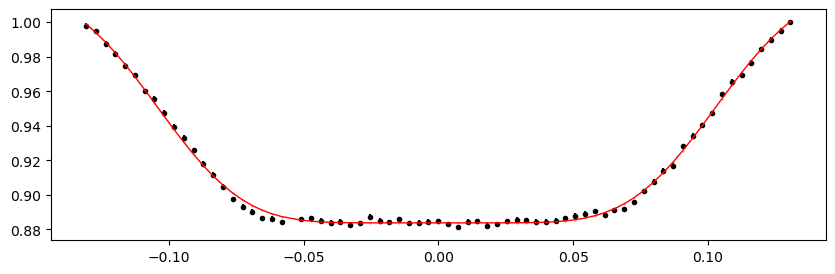

1980.8111188 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.66it/s]


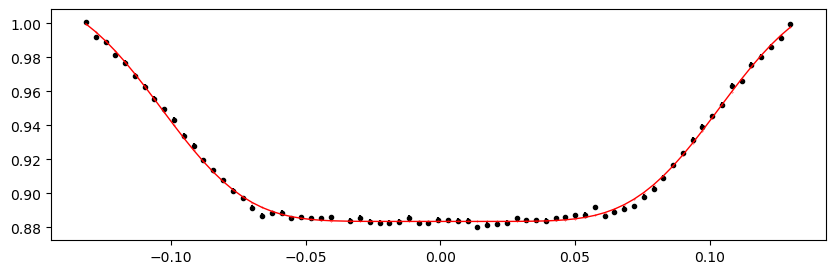

1981.19334832 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.46it/s]


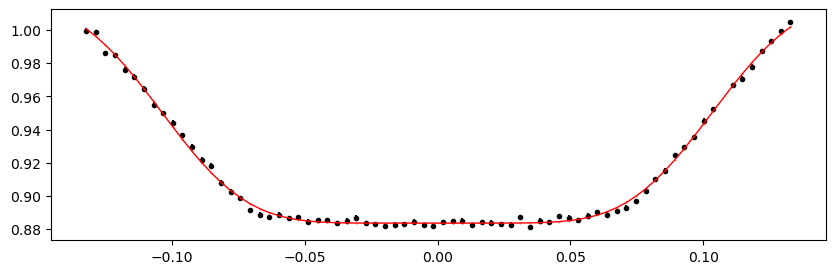

1981.57557784 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.52it/s]


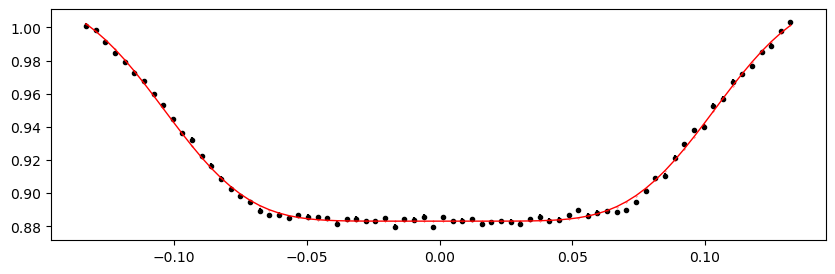

1981.95780736 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.15it/s]


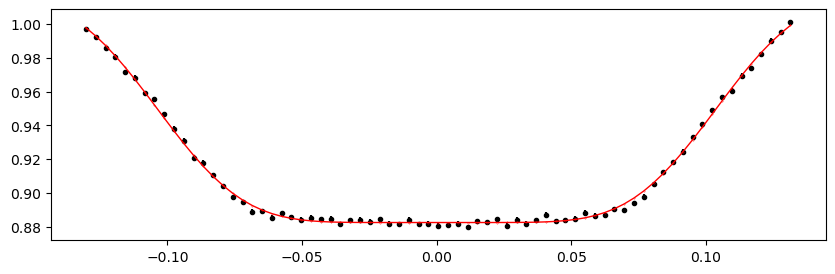

1983.86895496 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.84it/s]


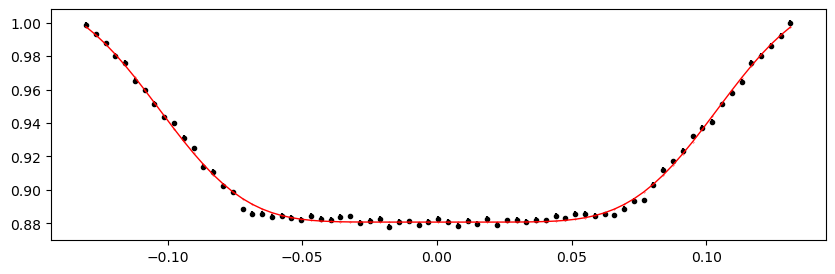

1984.2511844800001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.90it/s]


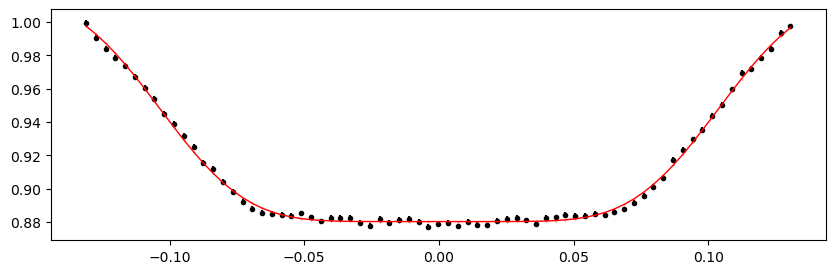

1984.6334140000001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.77it/s]


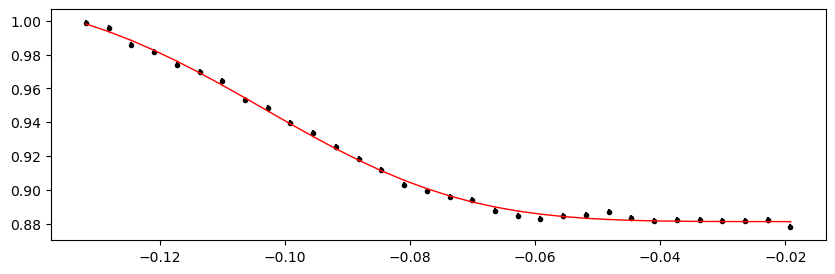

1988.07347968 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.84it/s]


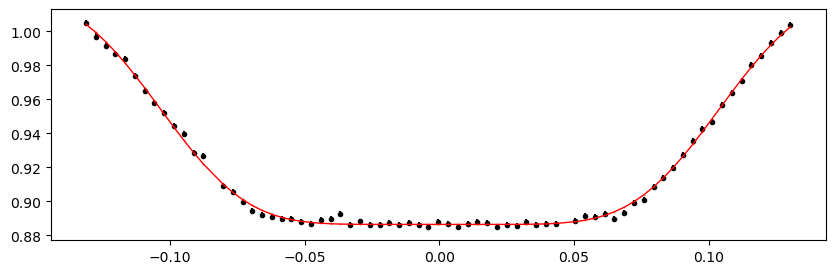

1988.4557092 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.64it/s]


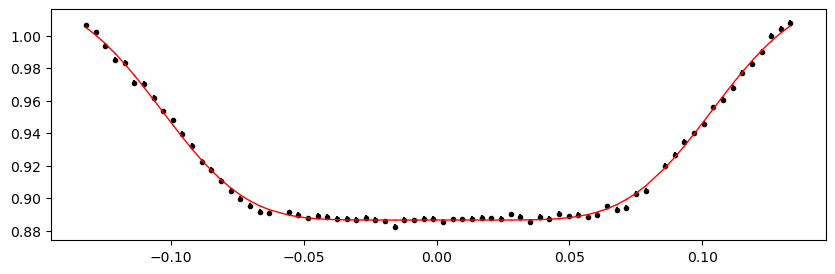

1988.83793872 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.47it/s]


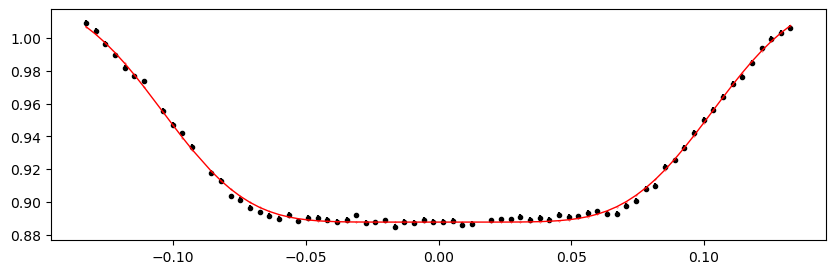

1989.22016824 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.33it/s]


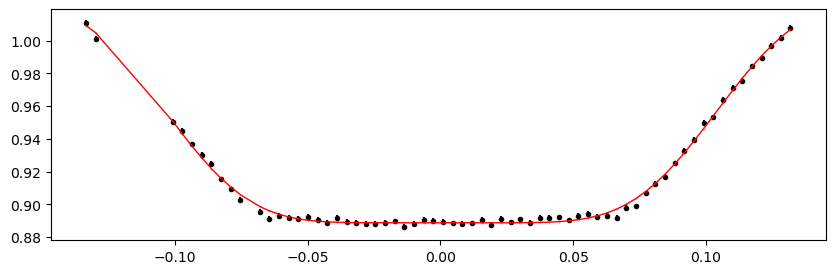

1989.60239776 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.04it/s]


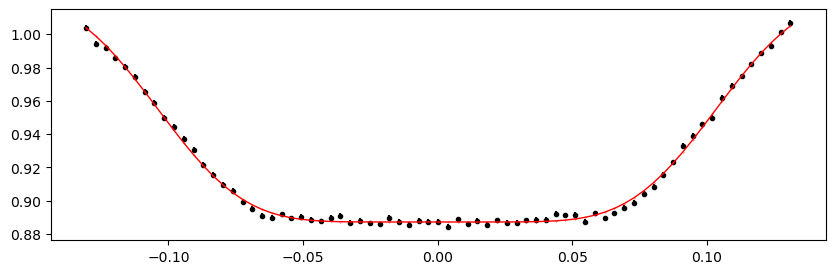

1989.98462728 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 323.18it/s]


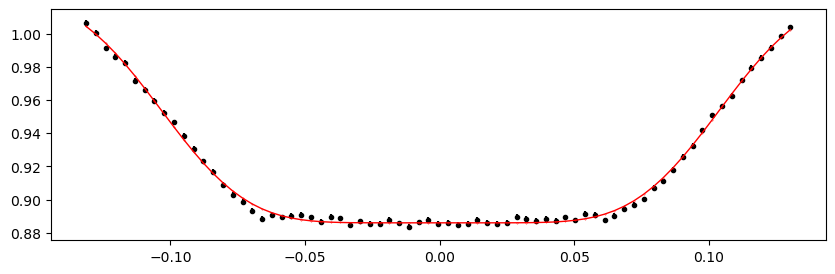

1990.3668568 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.00it/s]


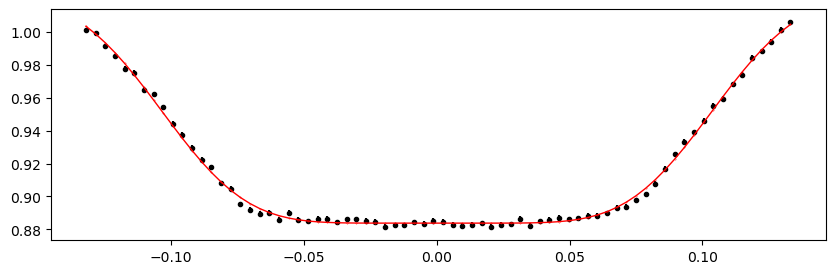

1990.74908632 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.11it/s]


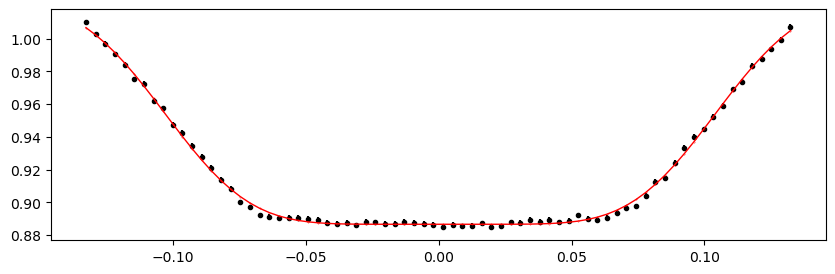

1991.13131584 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.63it/s]


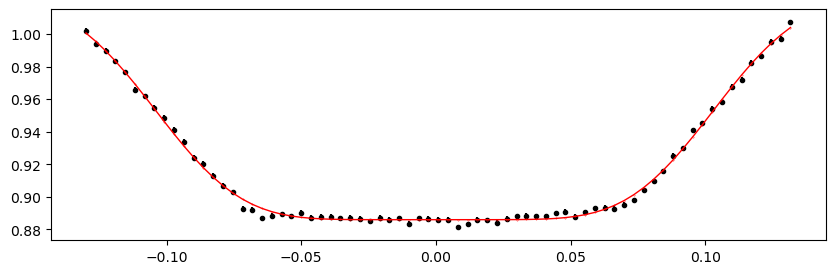

1991.51354536 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.47it/s]


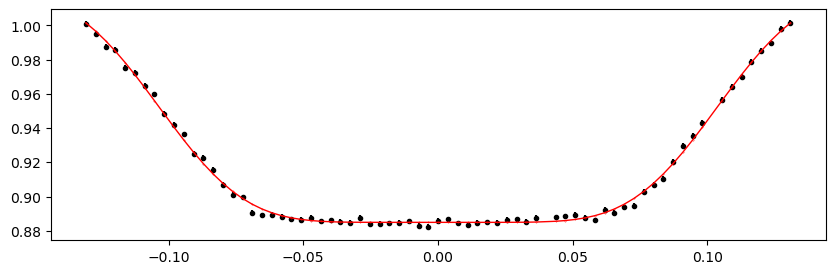

1991.89577488 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.51it/s]


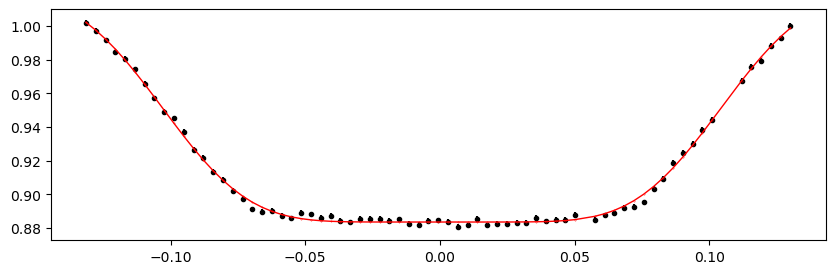

1992.2780044 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.05it/s]


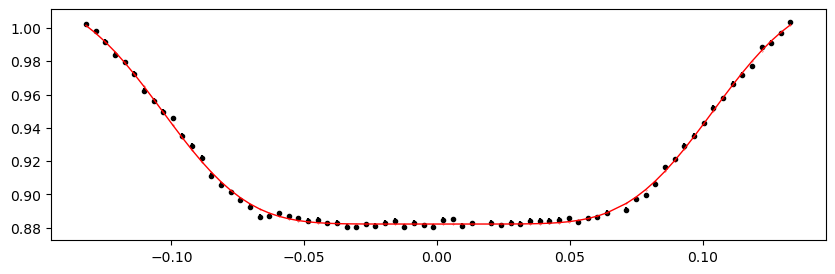

1992.66023392 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.54it/s]


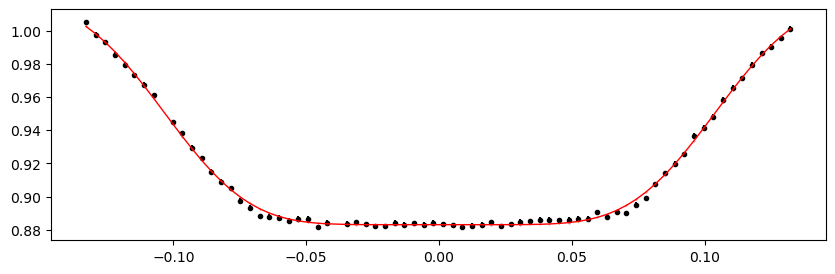

1993.0424634400001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.22it/s]


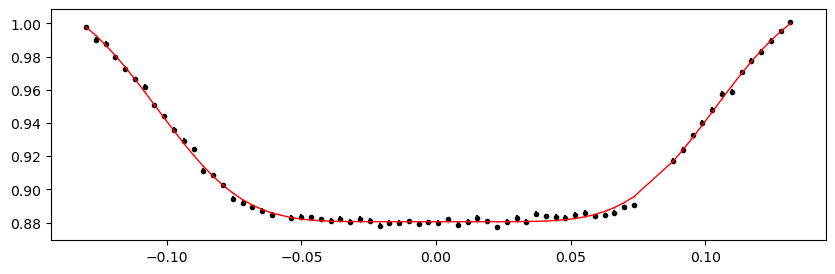

1993.4246929600001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.37it/s]


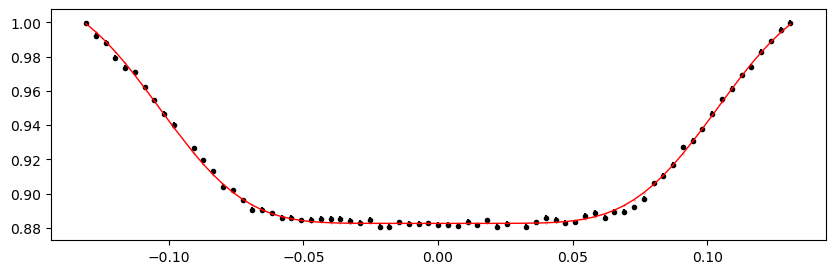

1993.8069224800001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.69it/s]


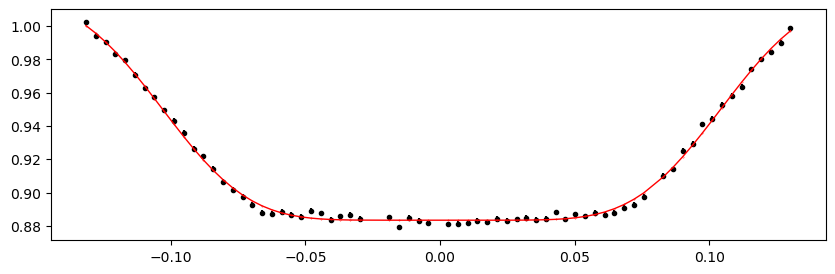

1994.1891520000001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.56it/s]


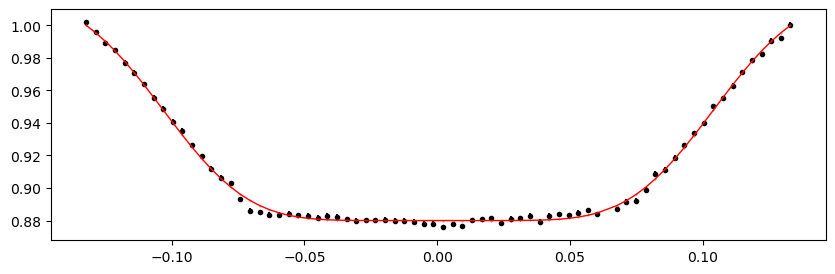

1994.5713815200002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.52it/s]


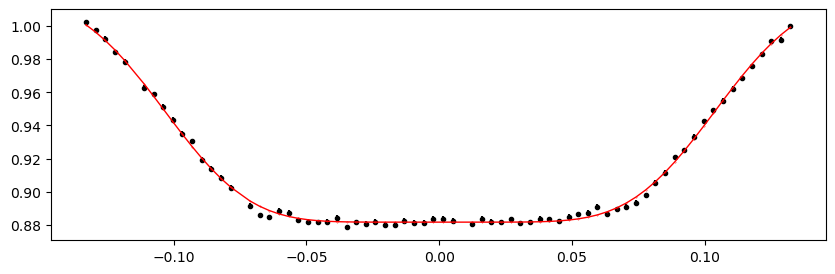

1994.9536110400002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.71it/s]


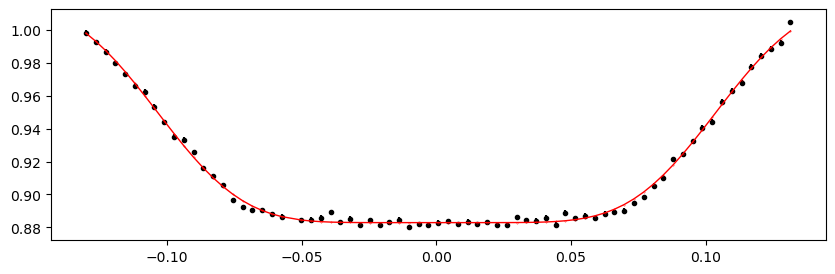

1995.3358405600002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.62it/s]


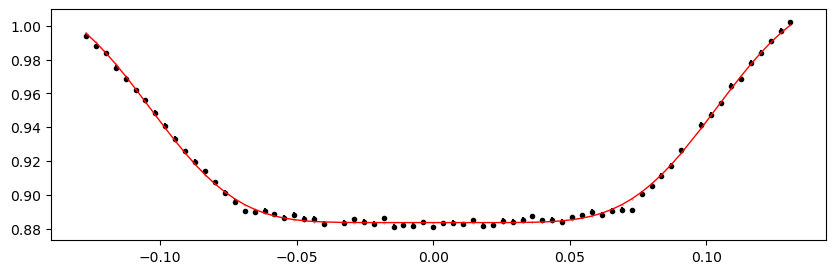

1997.24698816 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.64it/s]


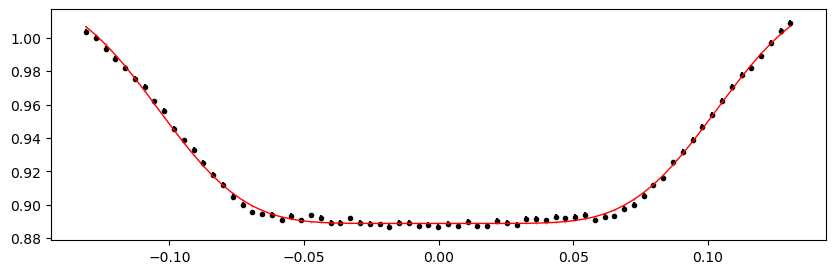

1997.62921768 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.99it/s]


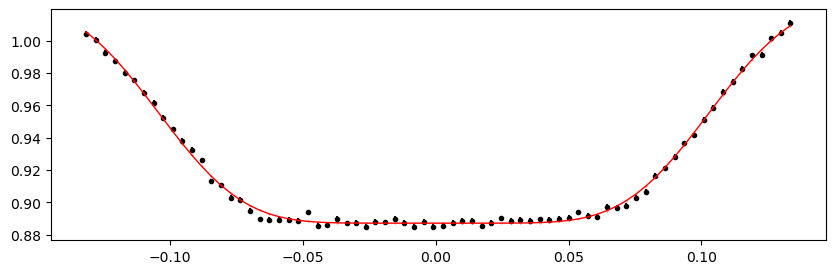

2001.45151288 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.73it/s]


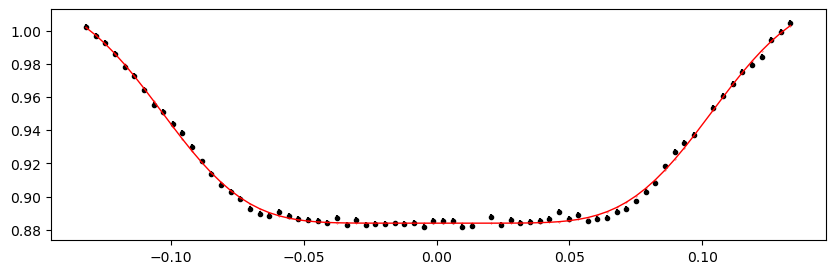

2001.8337424000001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.68it/s]


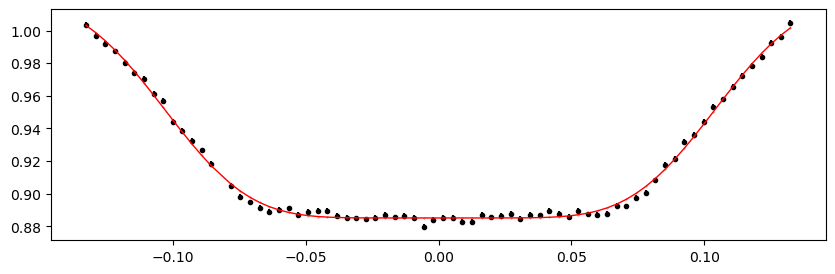

2002.2159719200001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.89it/s]


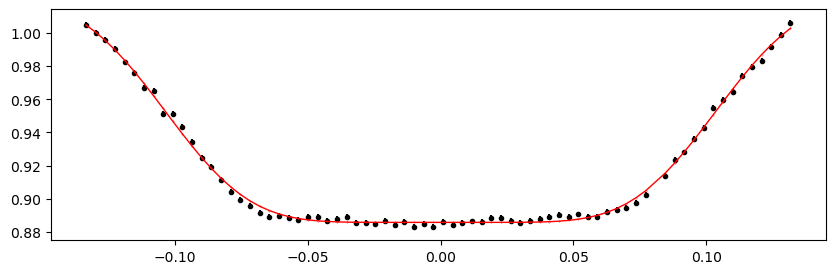

2002.5982014400001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.21it/s]


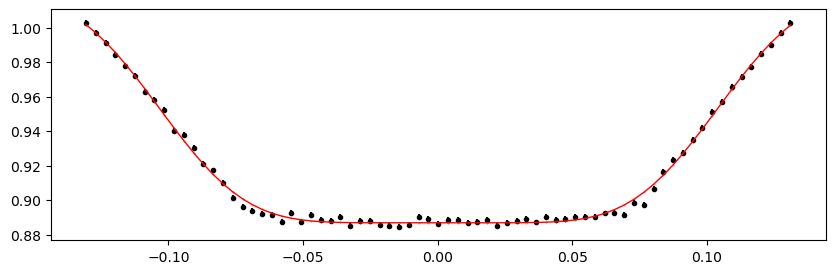

2002.9804309600001 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.31it/s]


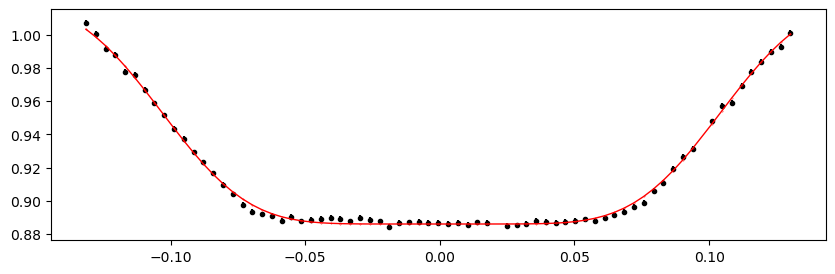

2003.3626604800002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.28it/s]


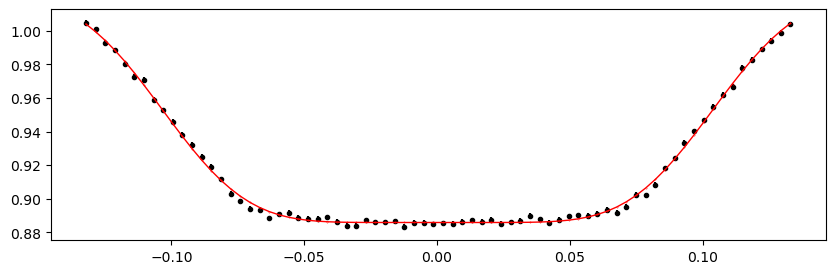

2003.7448900000002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.66it/s]


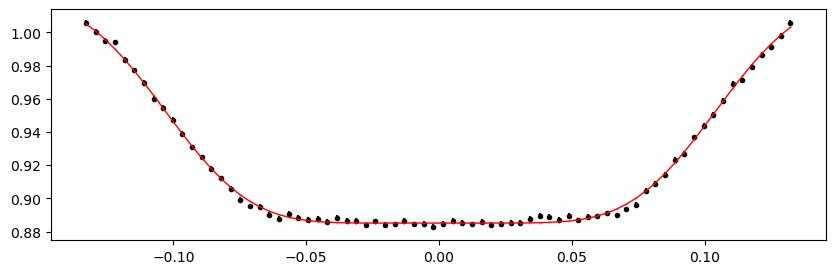

2004.1271195200002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.65it/s]


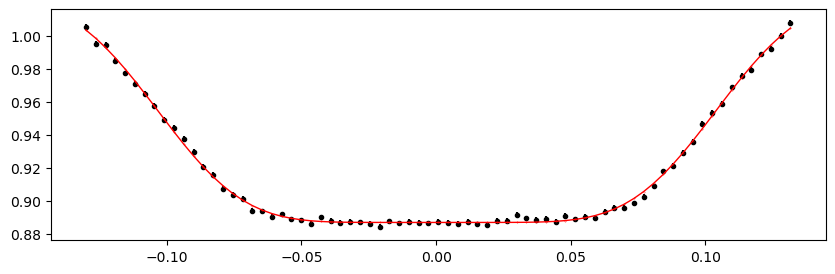

2004.50934904 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.35it/s]


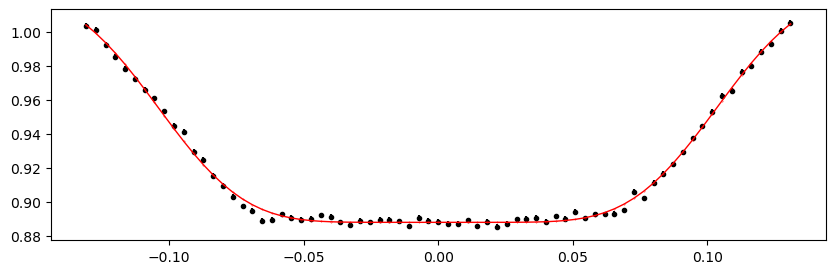

2004.89157856 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.62it/s]


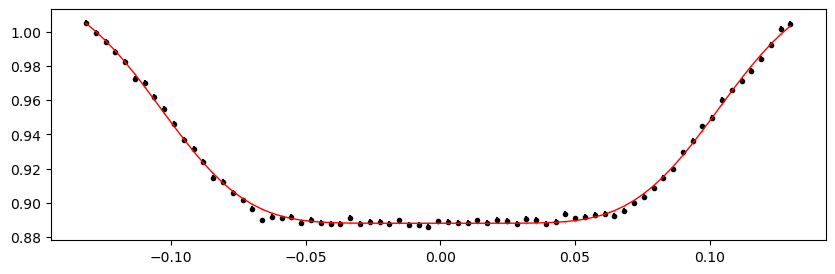

2005.27380808 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.13it/s]


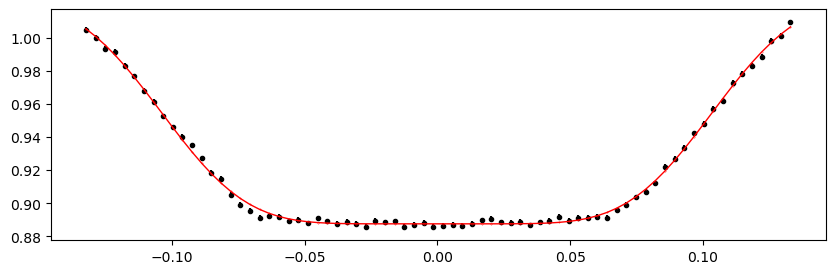

2005.6560376 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.61it/s]


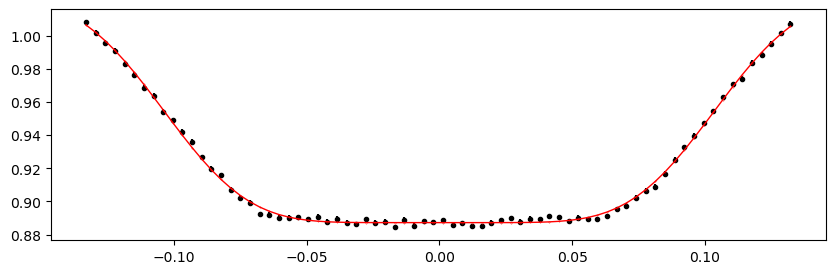

2006.03826712 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.66it/s]


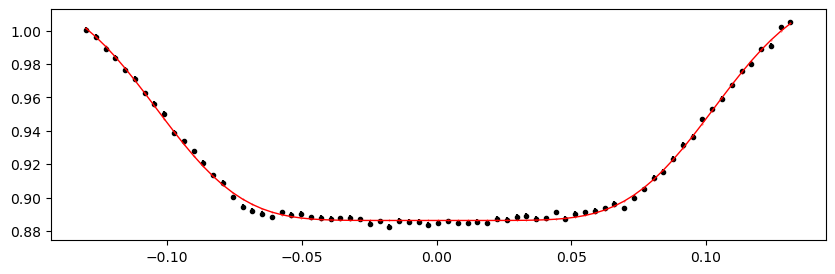

2006.42049664 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.66it/s]


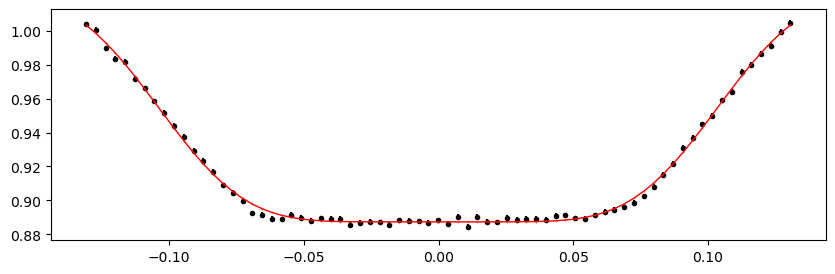

2006.80272616 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.42it/s]


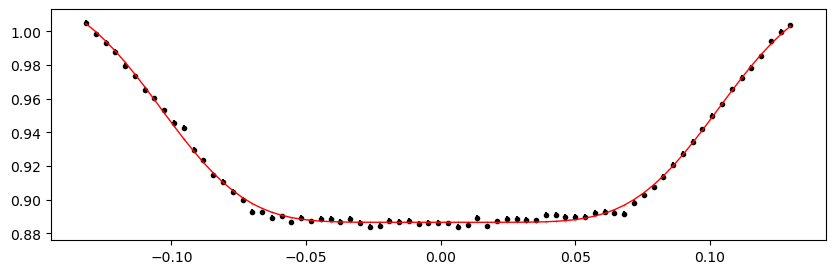

2007.18495568 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.17it/s]


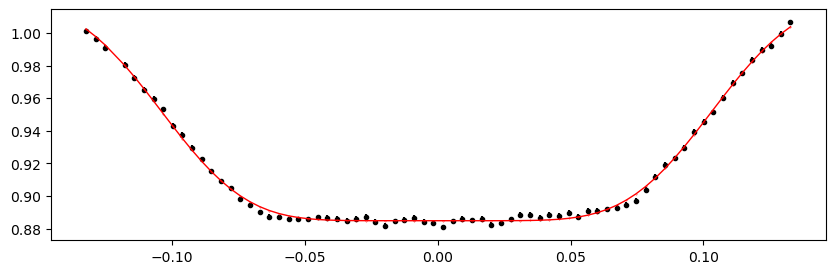

2007.5671852 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.32it/s]


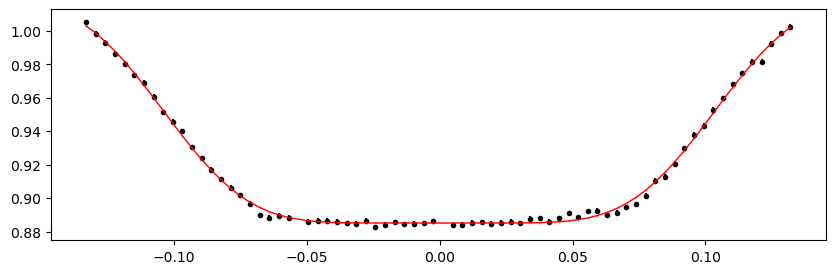

2007.94941472 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.36it/s]


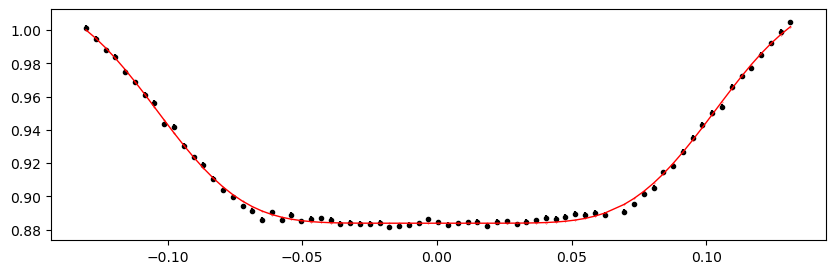

2008.33164424 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.86it/s]


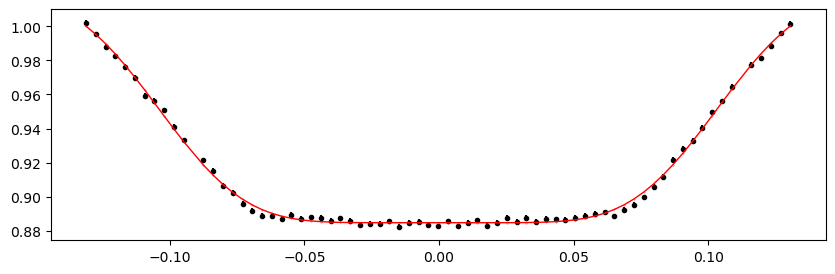

2008.71387376 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.84it/s]


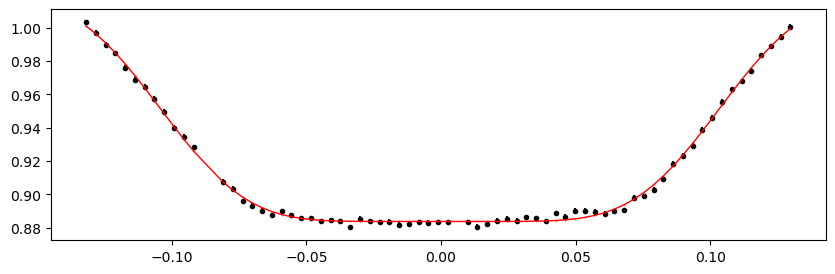

2009.09610328 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.52it/s]


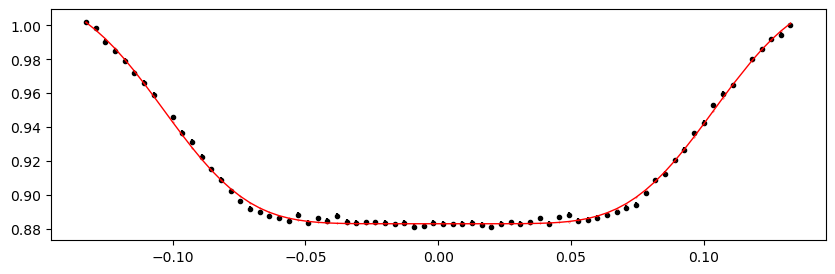

Time 2696.34478024 does not have enough data points: 3
2696.7270097600003 1.0223868386703832 -0.1365918419658833 0


100%|██████████████████████████████████████████████████████| 10000/10000 [1:15:25<00:00,  2.21it/s]


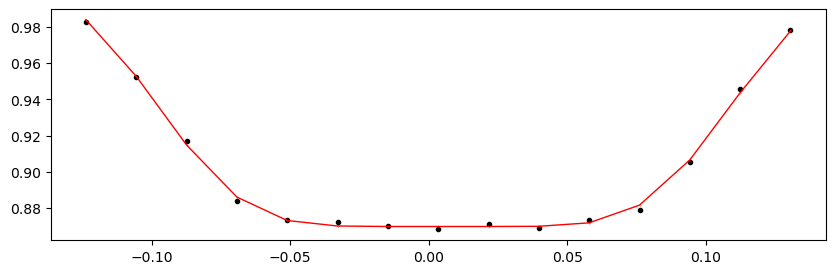

Time 2697.10923928 does not have enough data points: 2
2697.4914688 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 223.85it/s]


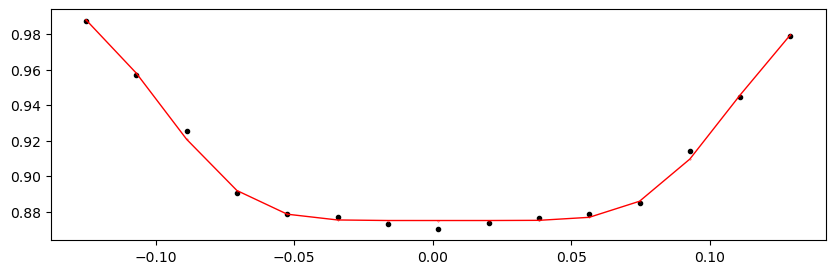

2697.87369832 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.24it/s]


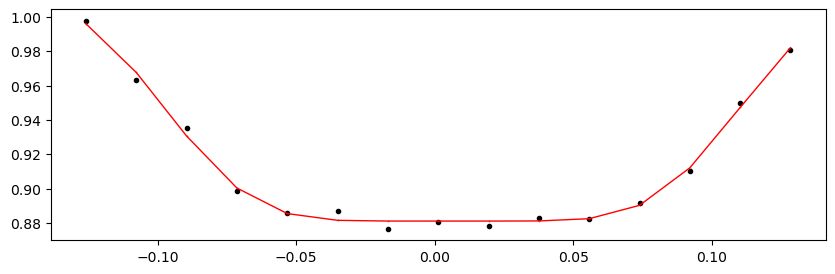

2698.25592784 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.73it/s]


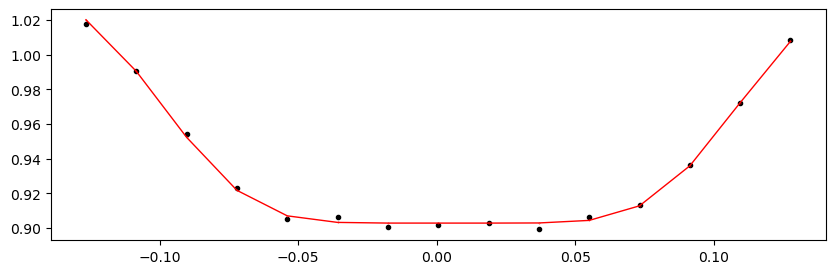

2698.63815736 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 313.66it/s]


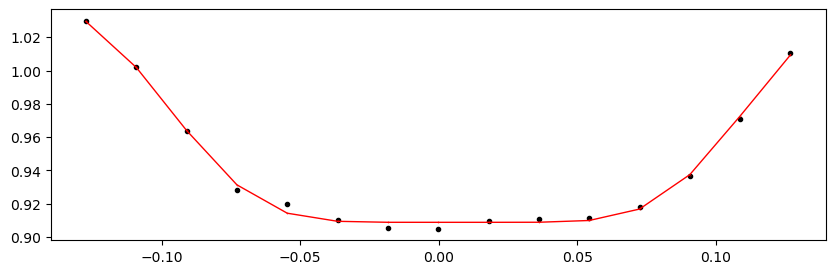

2699.02038688 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.38it/s]


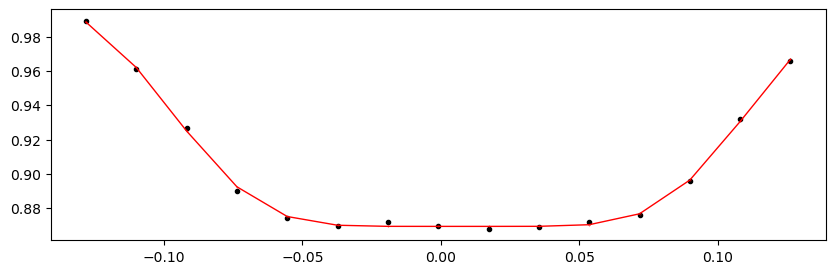

2699.4026164 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.77it/s]


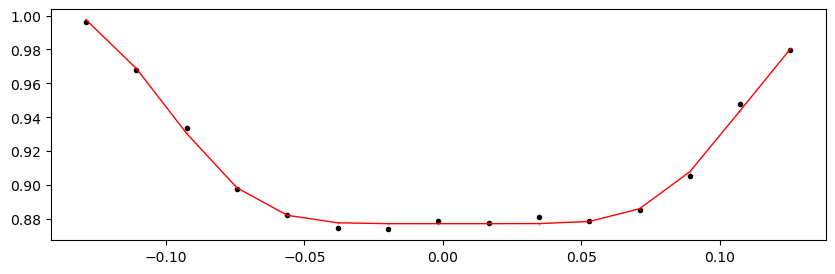

2699.78484592 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.80it/s]


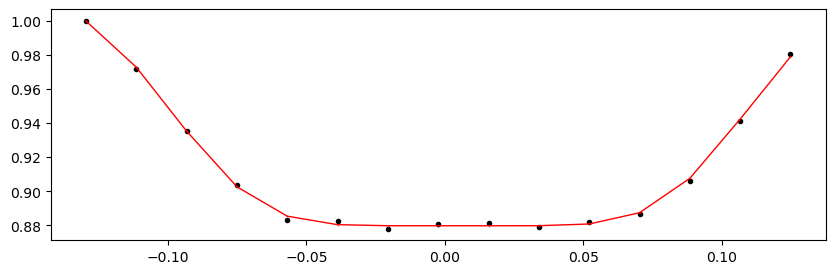

2700.16707544 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.61it/s]


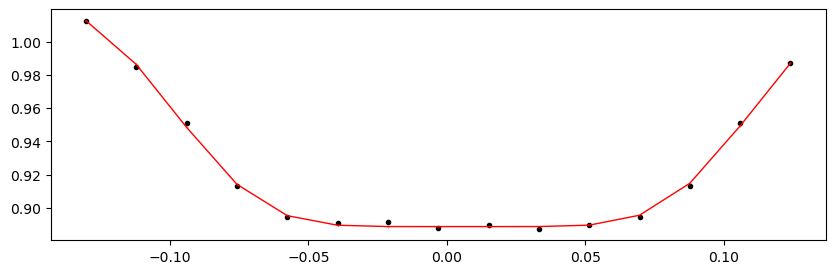

2700.54930496 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.06it/s]


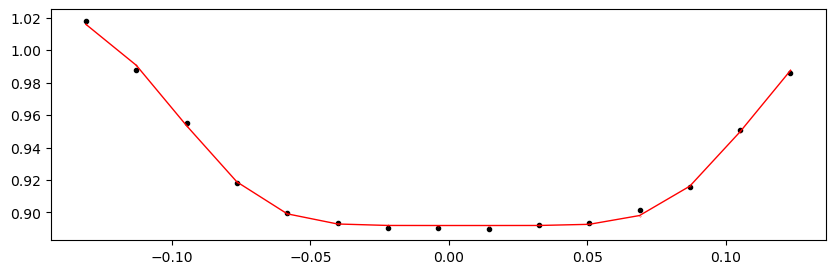

2700.93153448 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.81it/s]


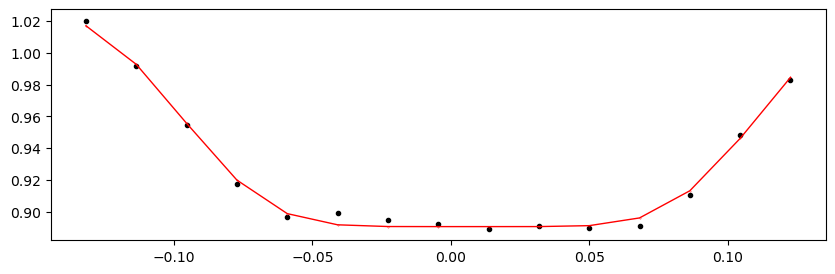

2701.313764 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.42it/s]


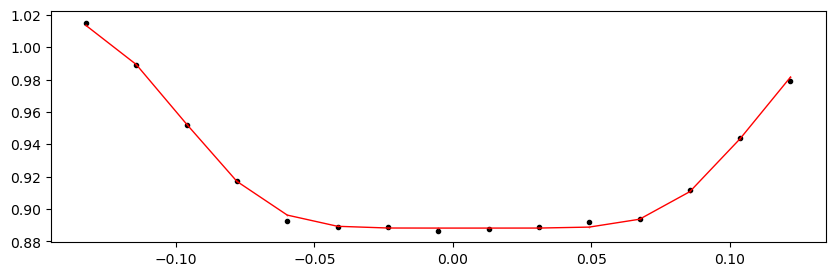

2701.6959935200002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.43it/s]


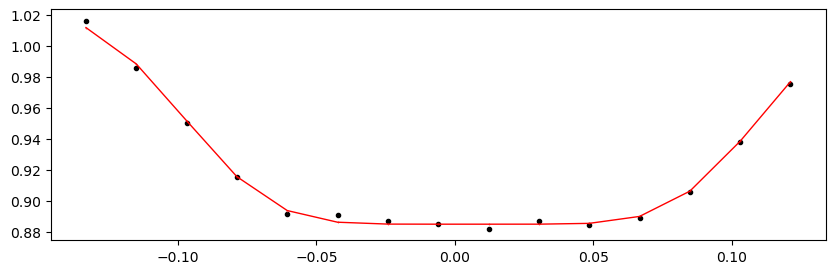

2702.07822304 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.80it/s]


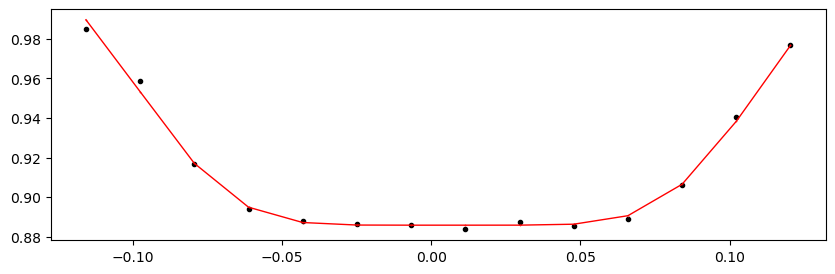

2702.46045256 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.67it/s]


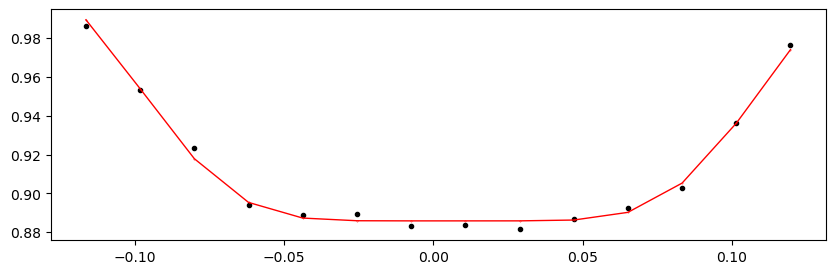

2702.84268208 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.09it/s]


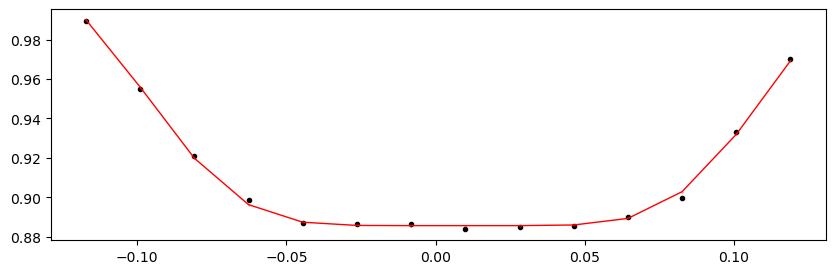

2703.2249116000003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.93it/s]


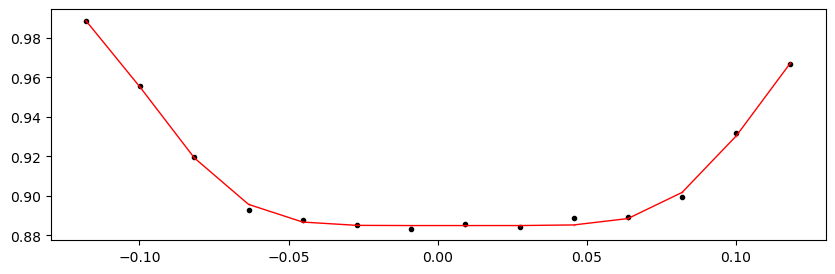

2703.60714112 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.93it/s]


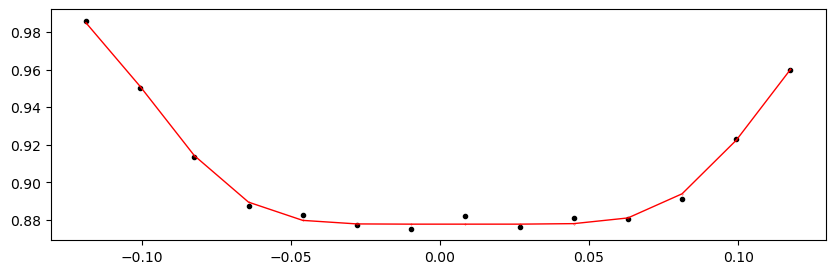

2703.98937064 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.57it/s]


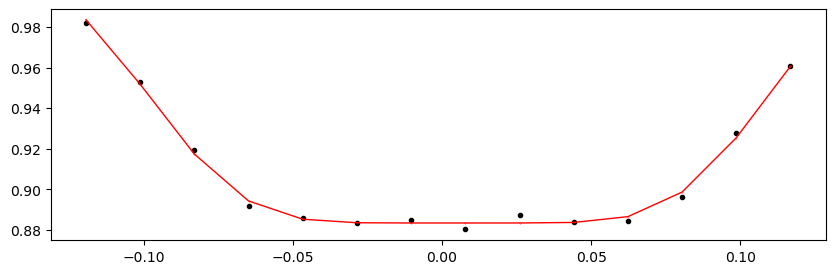

2704.37160016 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.27it/s]


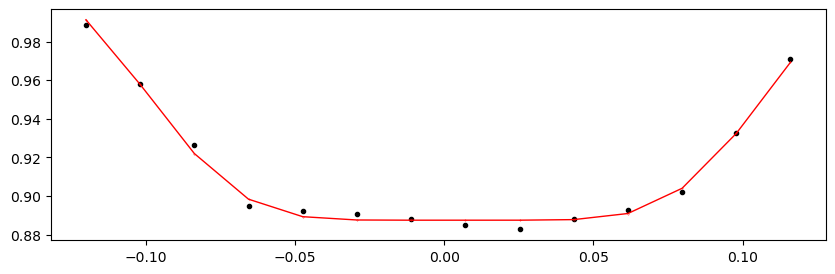

Time 2710.10504296 does not have enough data points: 9
2710.48727248 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.96it/s]


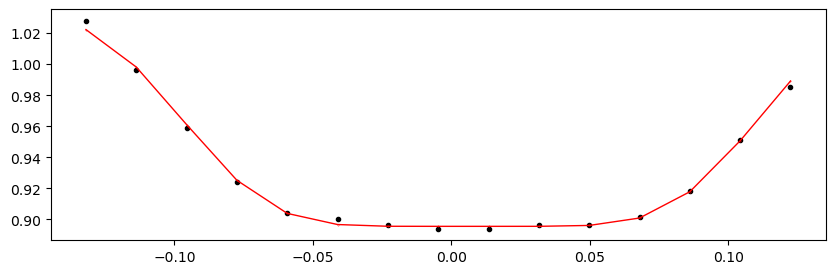

2710.869502 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.91it/s]


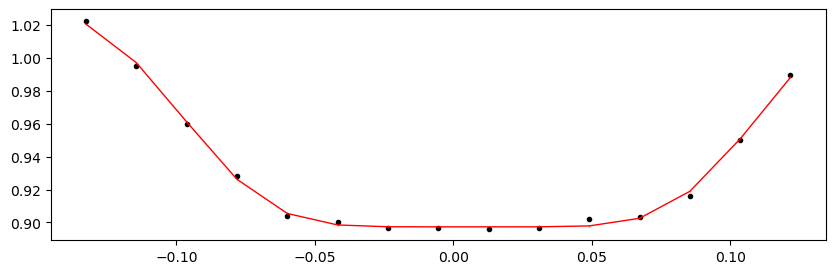

2711.2517315200002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.79it/s]


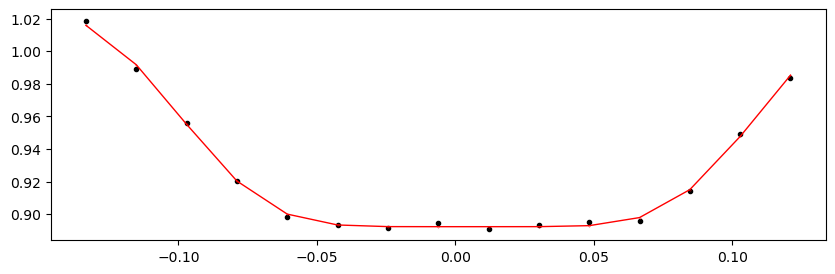

Time 2711.63396104 does not have enough data points: 12
2712.01619056 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.12it/s]


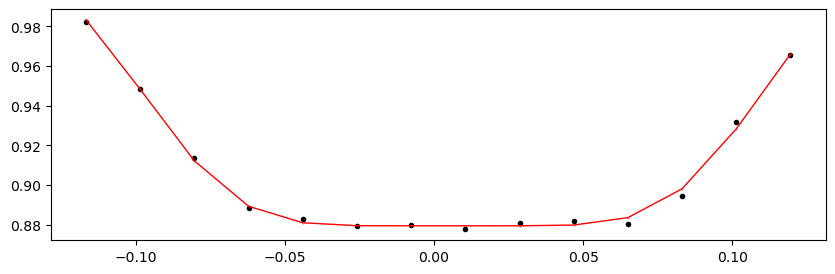

2712.39842008 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.08it/s]


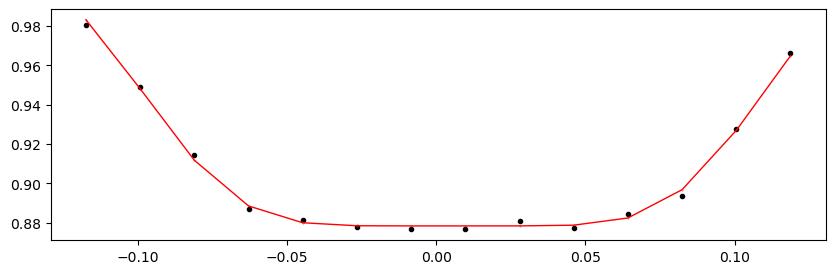

2712.7806496000003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.50it/s]


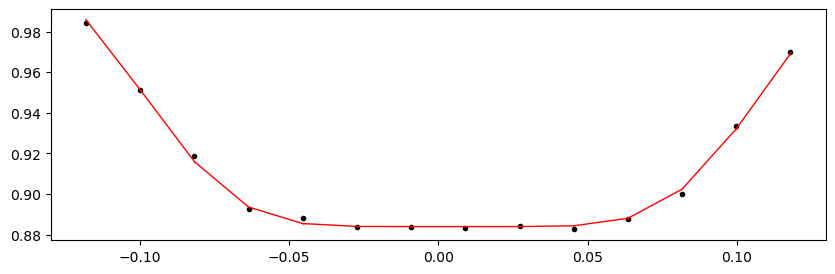

2713.16287912 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.19it/s]


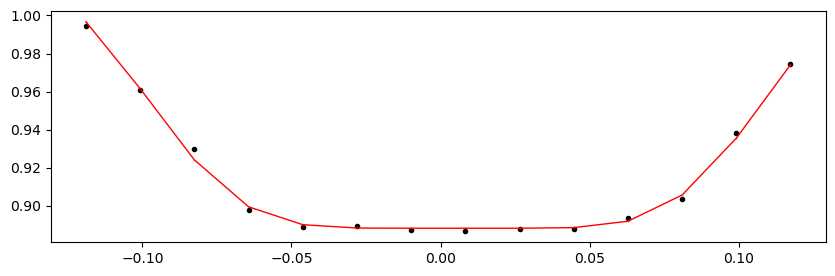

2713.54510864 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.54it/s]


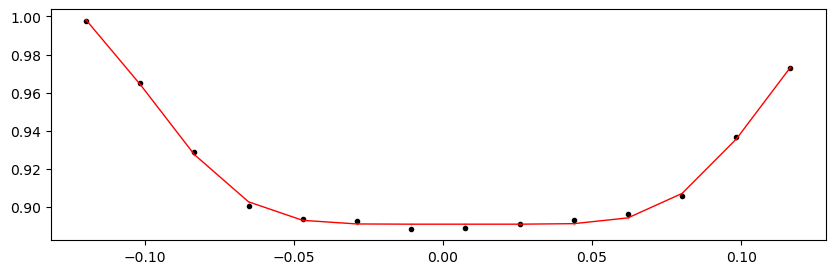

2713.92733816 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.17it/s]


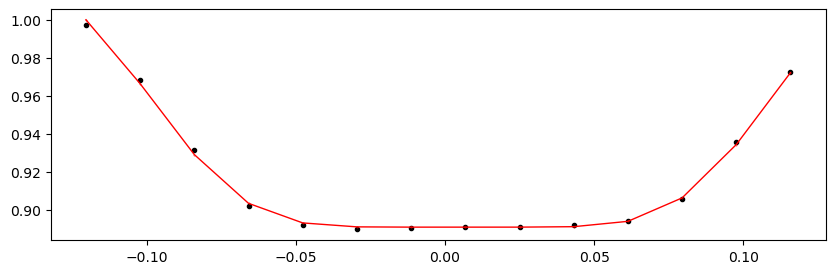

2714.3095676800003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.75it/s]


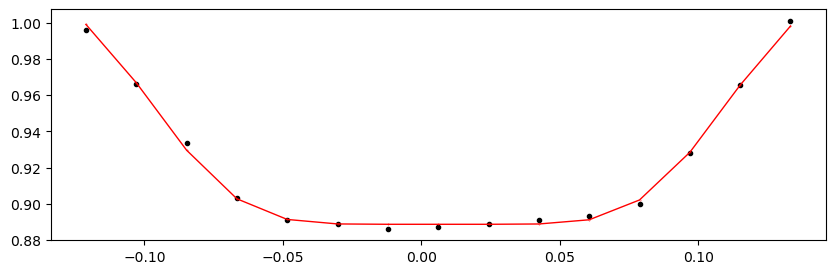

2714.6917972 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.15it/s]


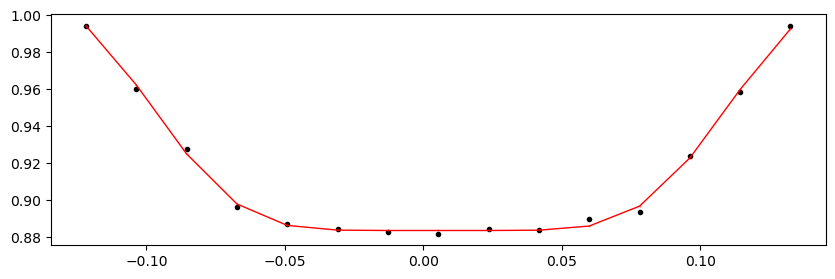

2715.07402672 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.37it/s]


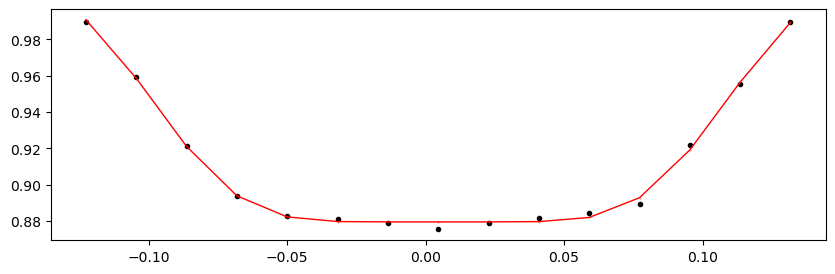

2715.45625624 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.10it/s]


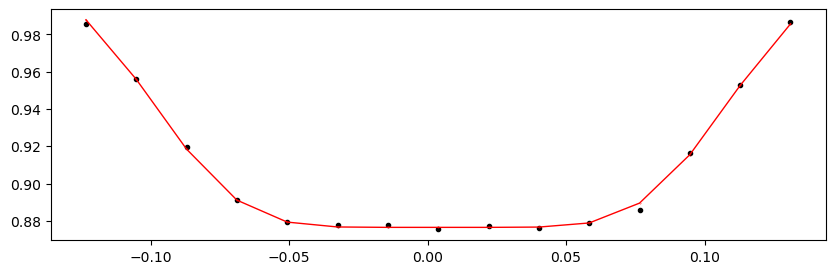

2715.83848576 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.28it/s]


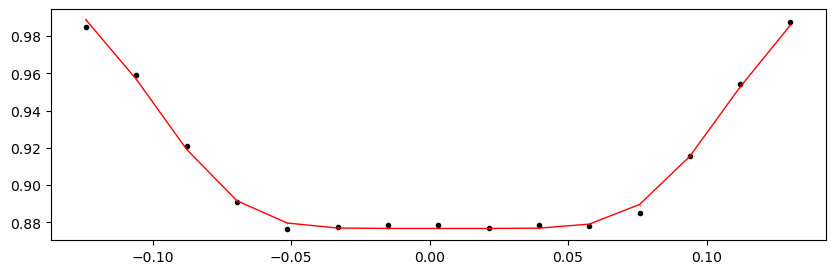

2716.22071528 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.61it/s]


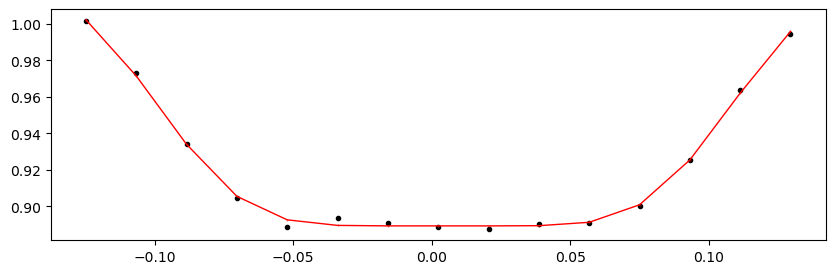

2716.6029448 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.63it/s]


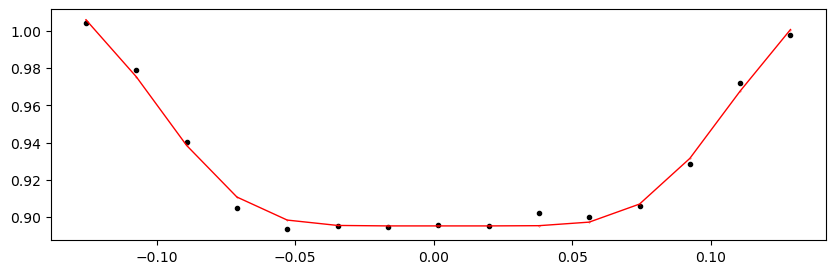

2716.98517432 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.89it/s]


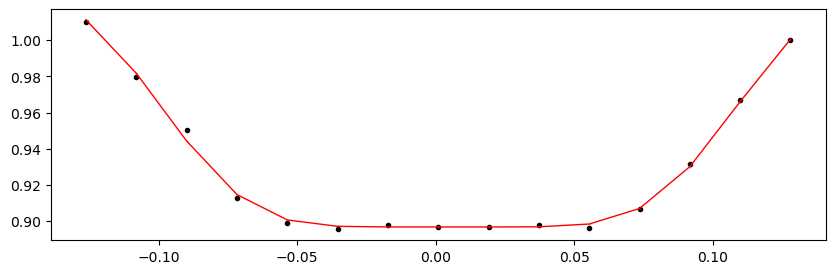

2717.36740384 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.09it/s]


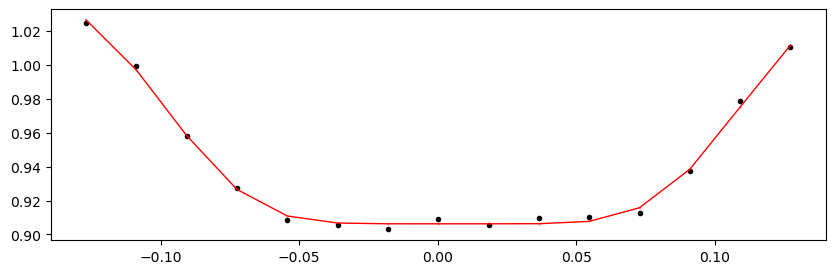

2718.89632192 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.17it/s]


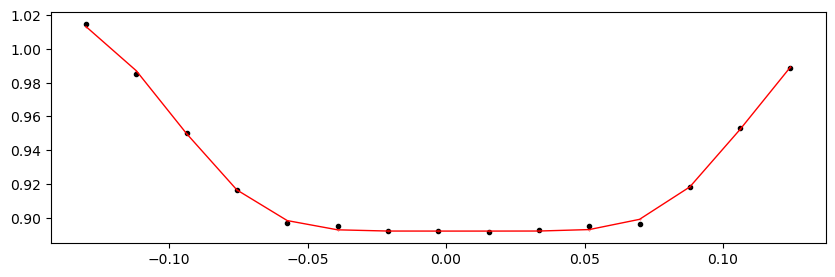

2719.2785514400002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.38it/s]


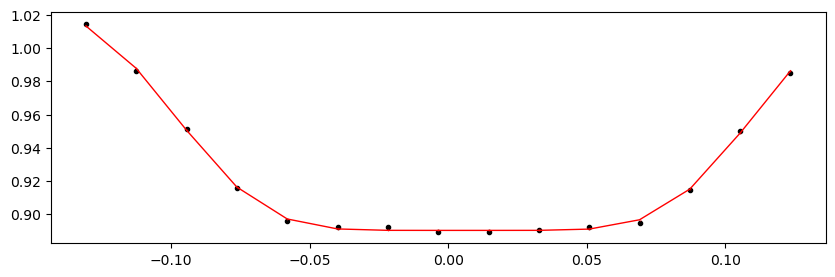

2719.66078096 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.17it/s]


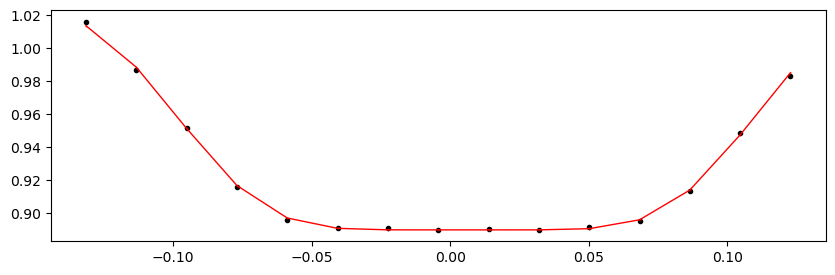

2720.04301048 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.69it/s]


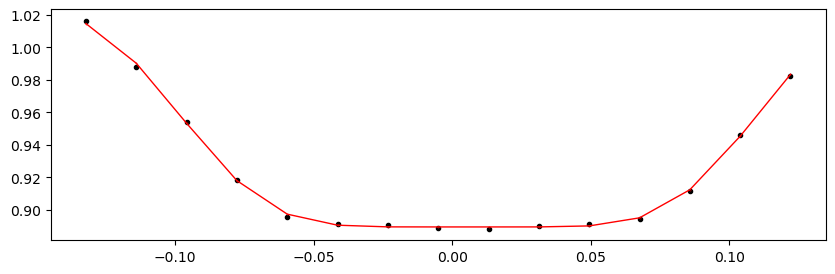

2720.42524 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.49it/s]


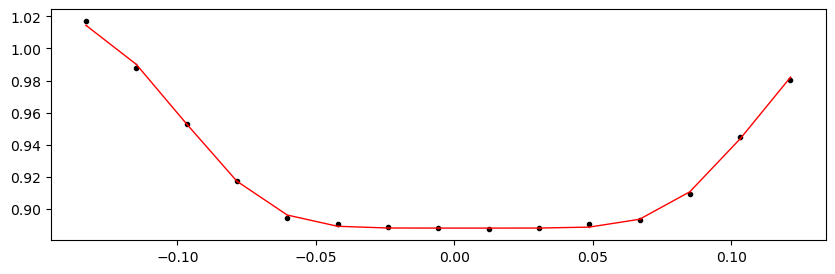

2725.39422376 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.52it/s]


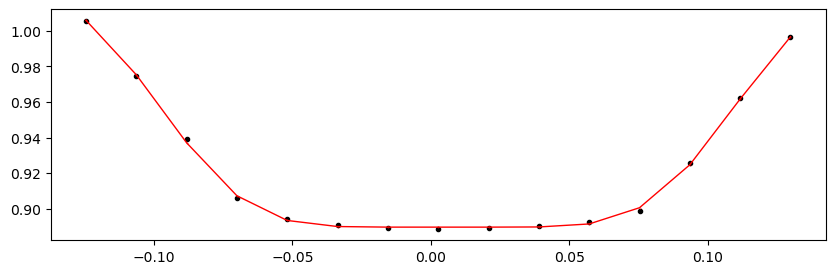

2725.77645328 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.10it/s]


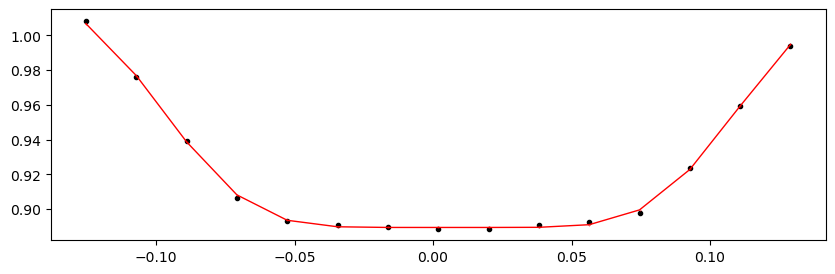

2726.1586828 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.33it/s]


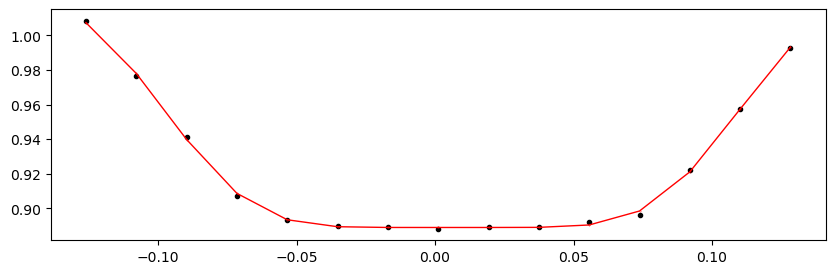

2726.54091232 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.08it/s]


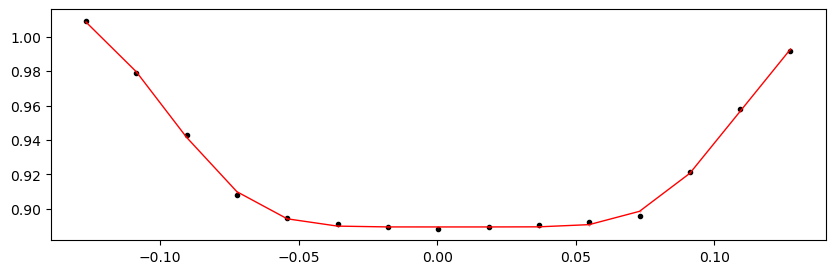

2726.92314184 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.51it/s]


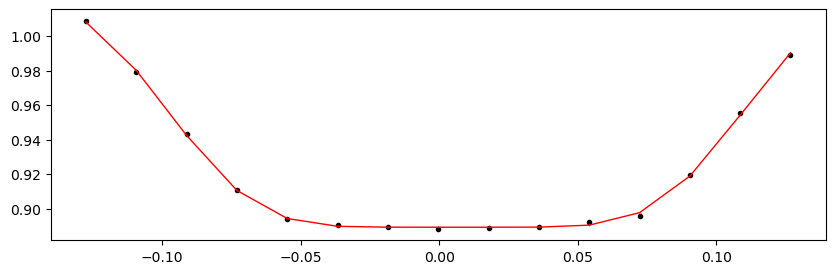

2727.30537136 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.50it/s]


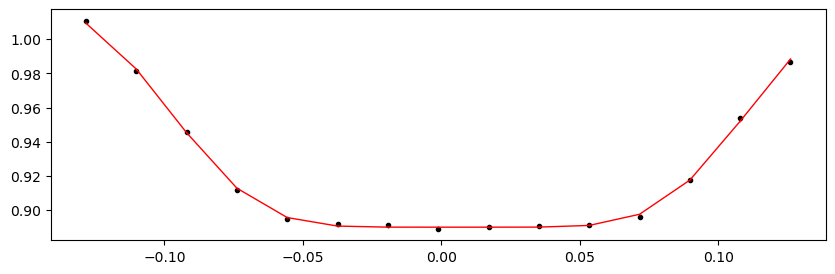

2727.68760088 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.16it/s]


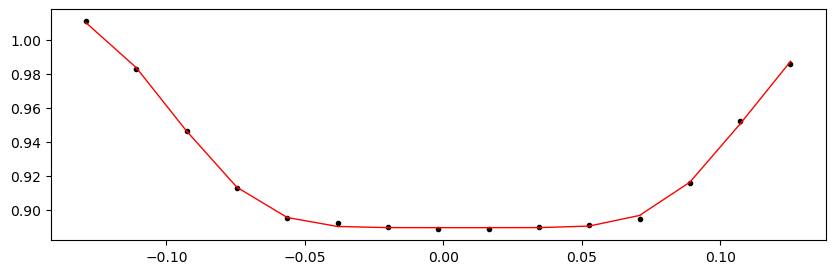

2728.0698304 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.68it/s]


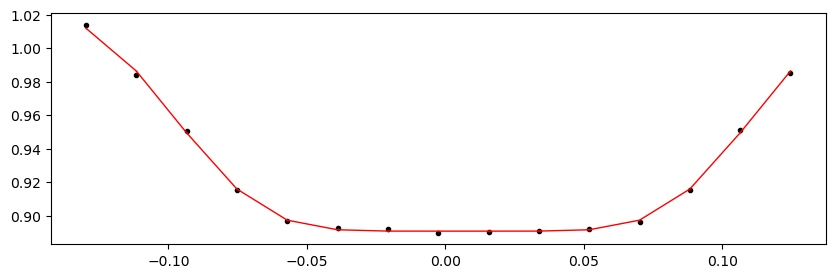

2728.45205992 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.10it/s]


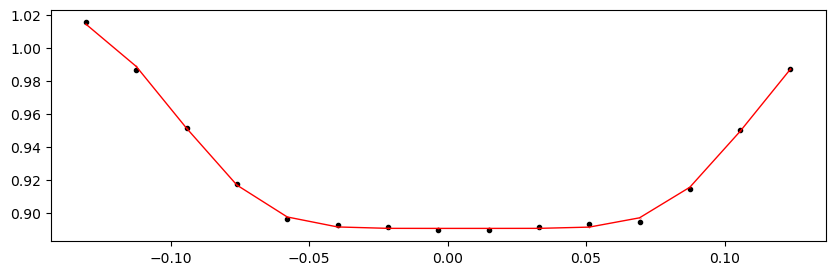

2728.8342894400002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.87it/s]


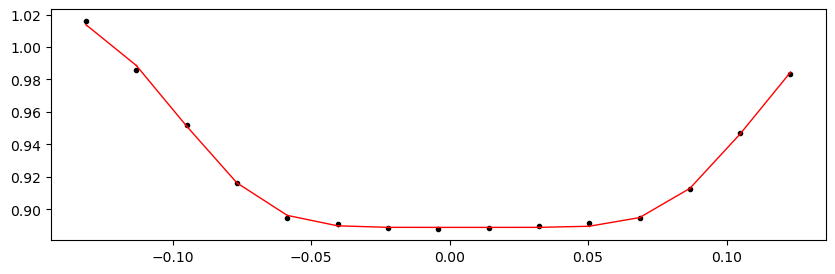

2729.21651896 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.23it/s]


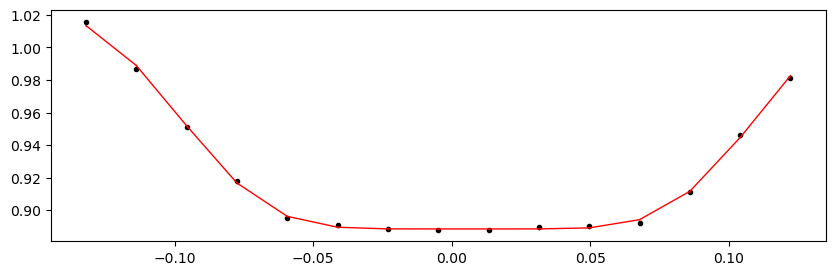

2729.59874848 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.32it/s]


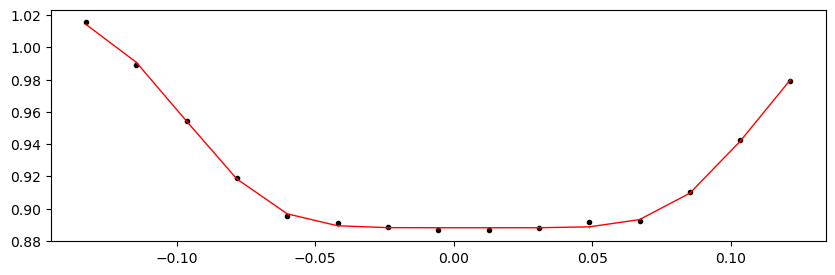

2729.980978 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.41it/s]


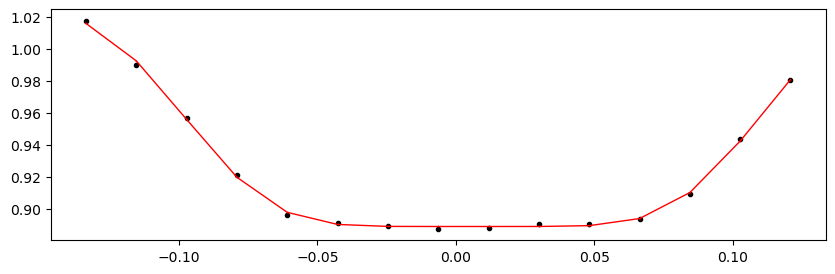

2731.50989608 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.94it/s]


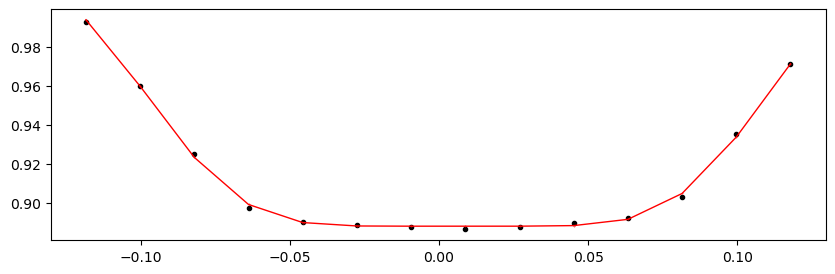

2731.8921256000003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.95it/s]


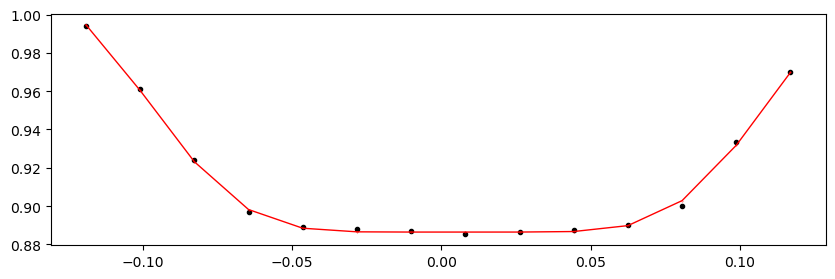

2732.27435512 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.75it/s]


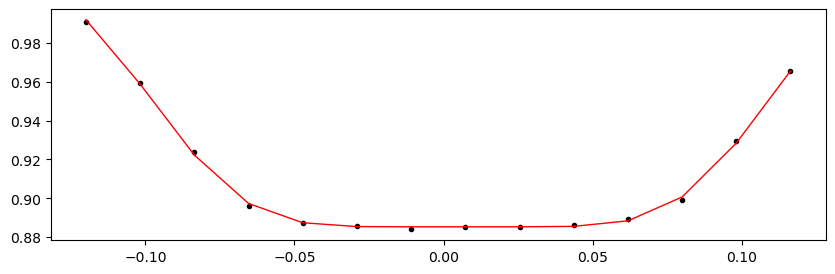

2732.65658464 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.53it/s]


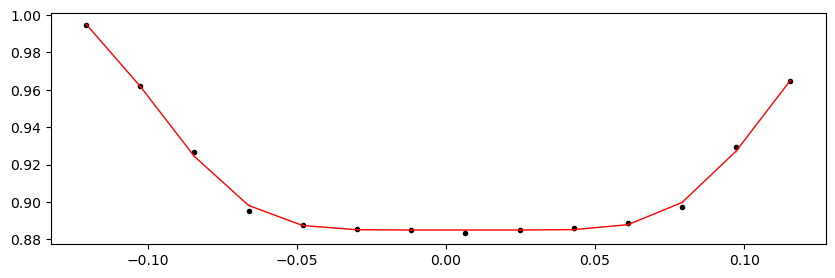

2733.03881416 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.56it/s]


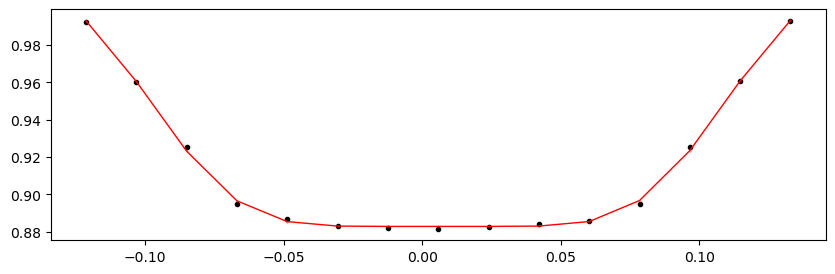

2733.42104368 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.87it/s]


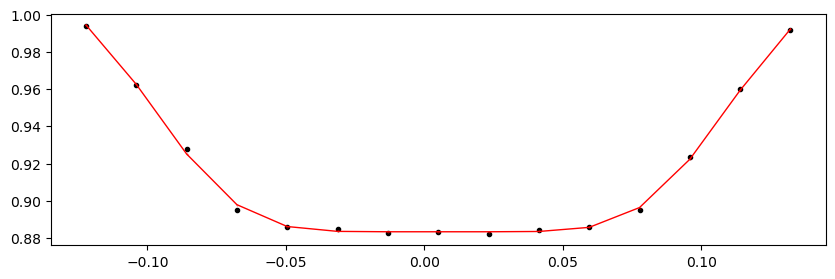

2738.3900274400003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.21it/s]


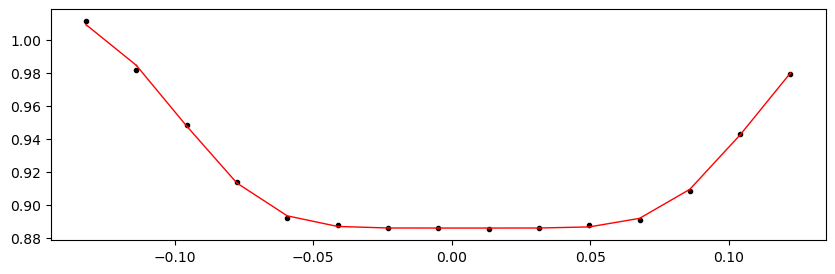

2738.77225696 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.48it/s]


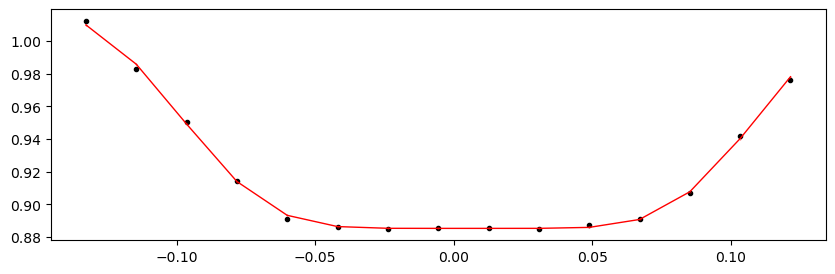

2739.15448648 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.41it/s]


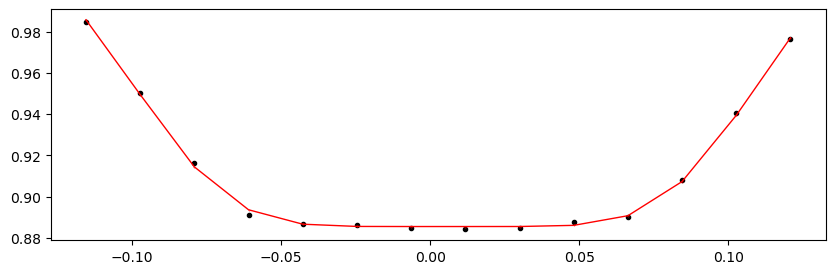

2739.536716 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.49it/s]


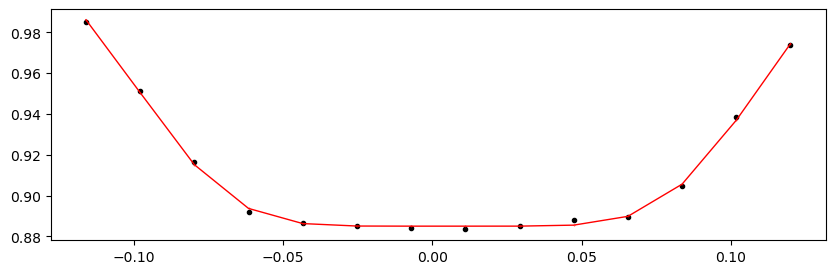

2739.9189455200003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.05it/s]


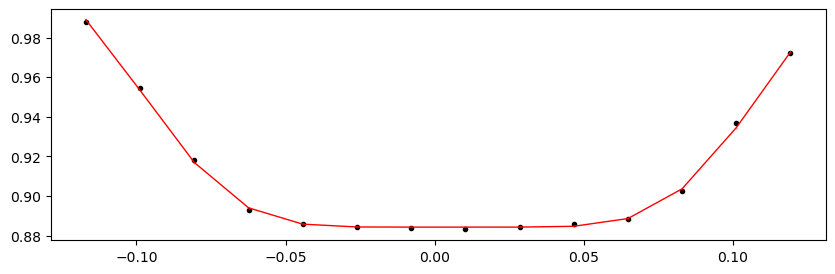

2740.30117504 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.30it/s]


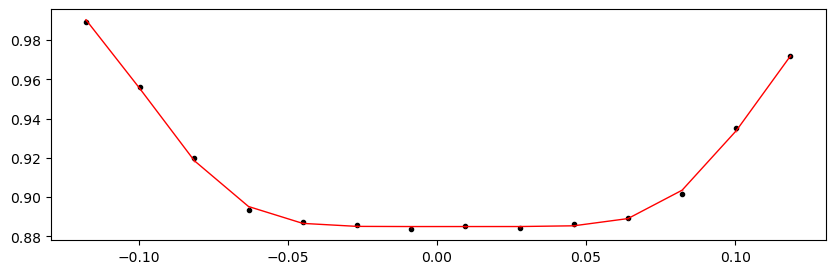

2740.68340456 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.41it/s]


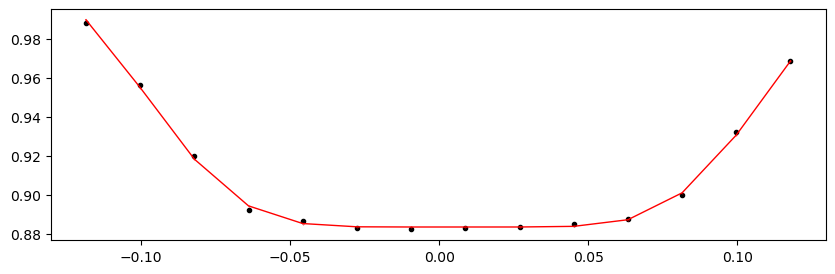

2741.06563408 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.94it/s]


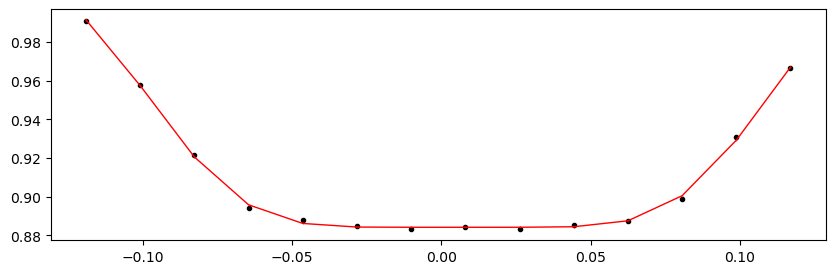

2741.4478636 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.82it/s]


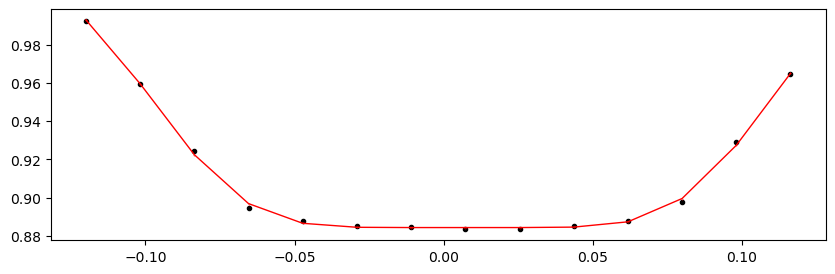

2741.83009312 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.22it/s]


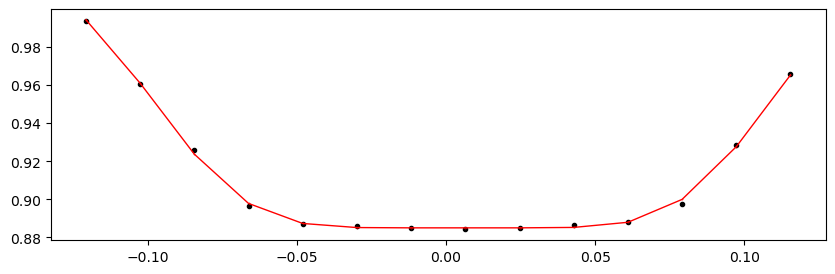

2742.21232264 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.88it/s]


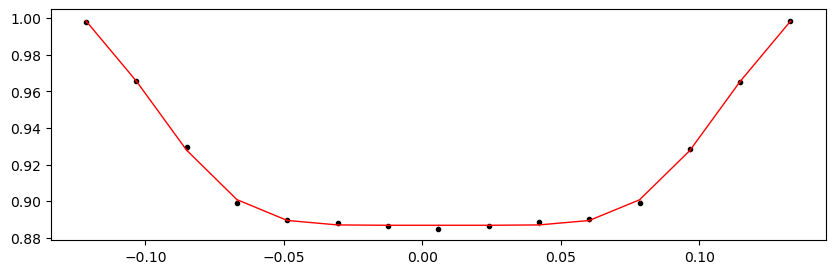

2742.59455216 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.60it/s]


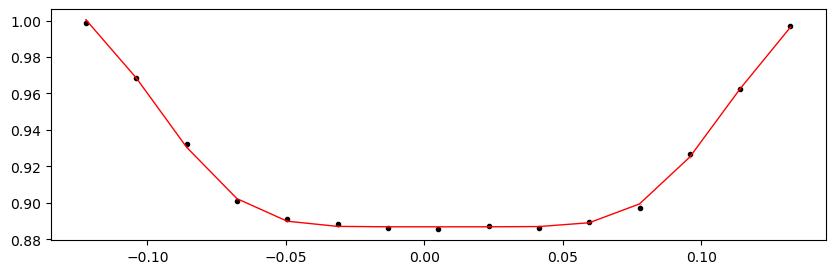

2742.97678168 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.76it/s]


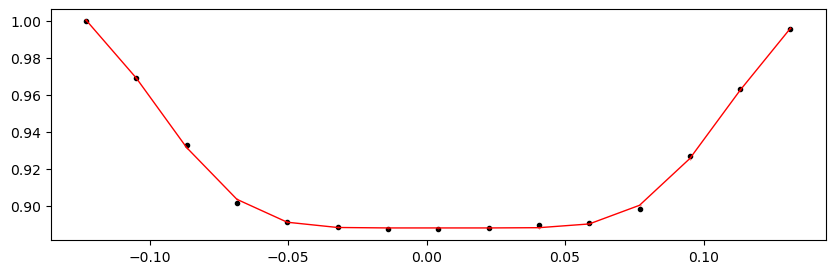

3434.42998336 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.81it/s]


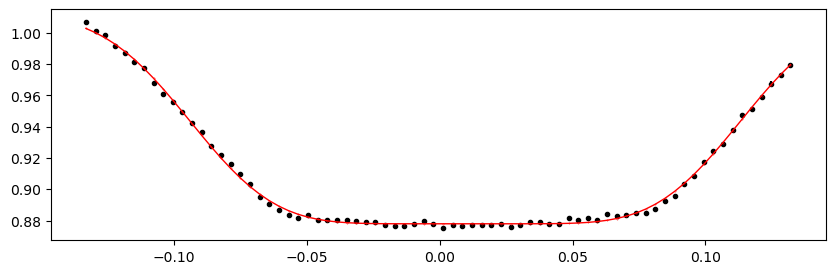

3434.81221288 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.08it/s]


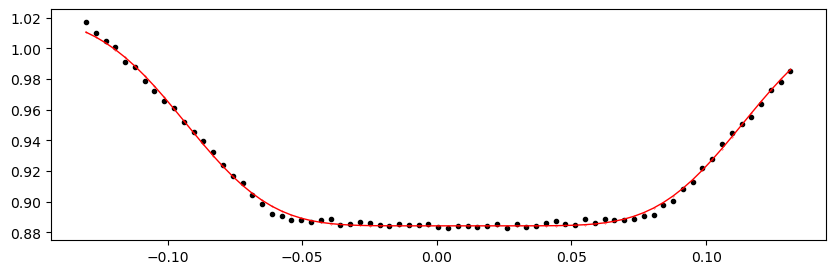

3435.1944424000003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.91it/s]


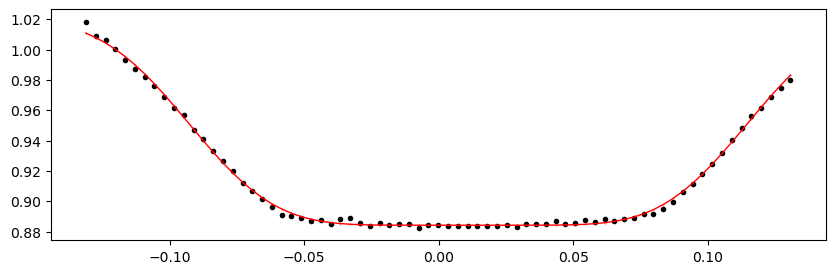

3435.57667192 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.74it/s]


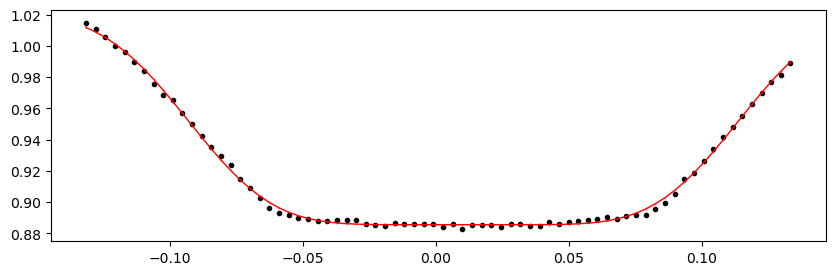

3435.95890144 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.31it/s]


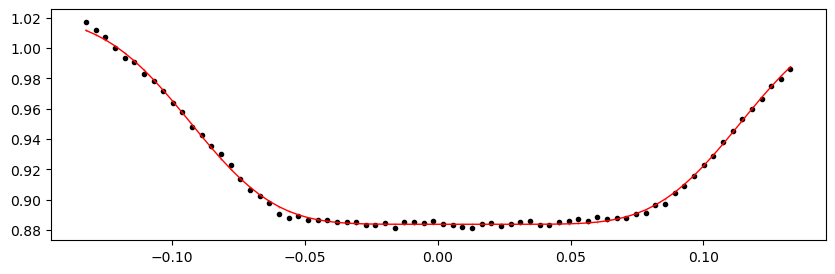

3436.34113096 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 310.18it/s]


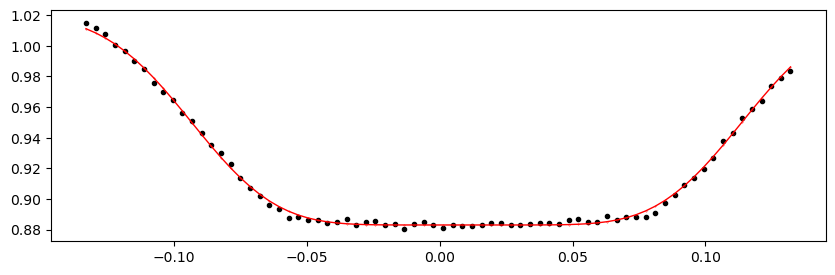

3436.7233604800003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.43it/s]


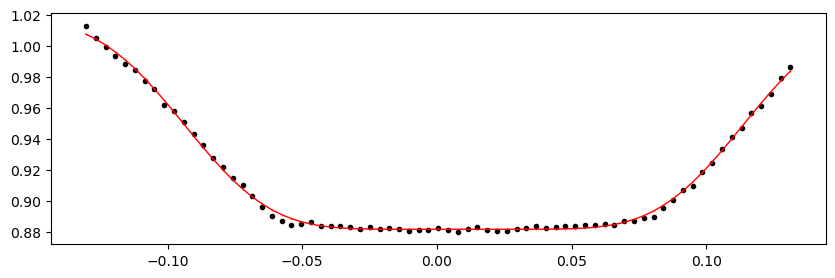

3437.10559 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 314.83it/s]


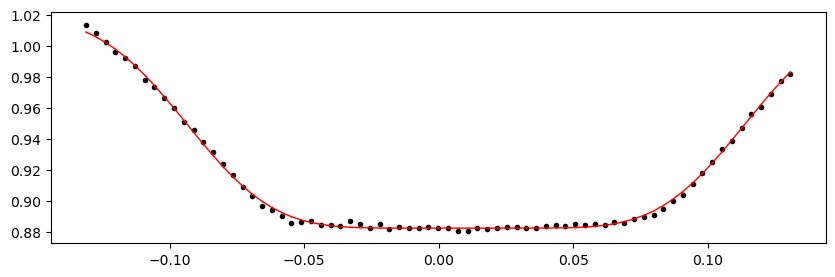

3437.48781952 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 306.41it/s]


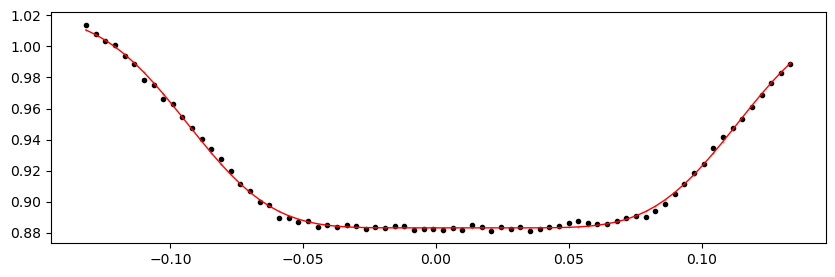

3437.87004904 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.31it/s]


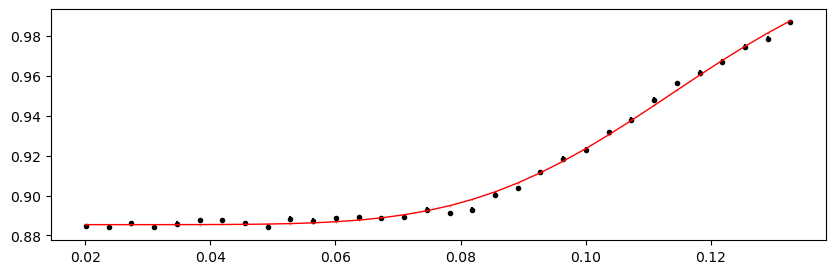

3438.25227856 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.61it/s]


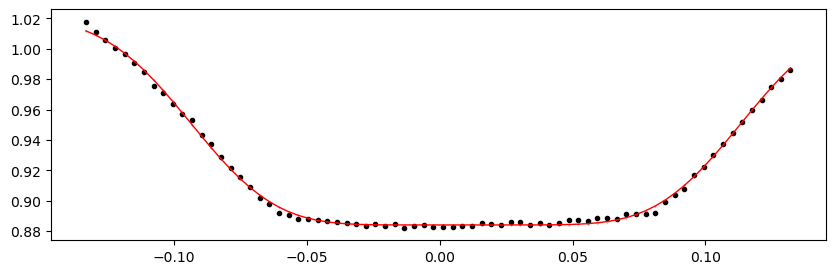

3438.63450808 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.66it/s]


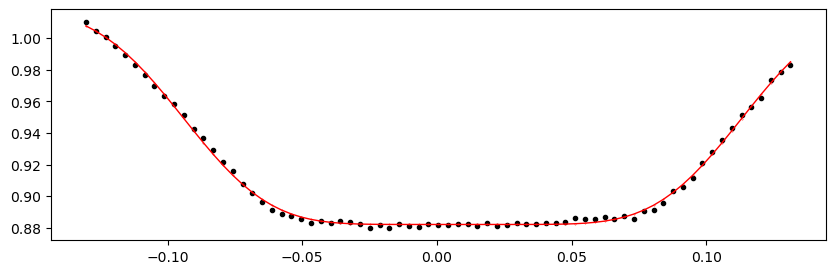

3439.0167376 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.33it/s]


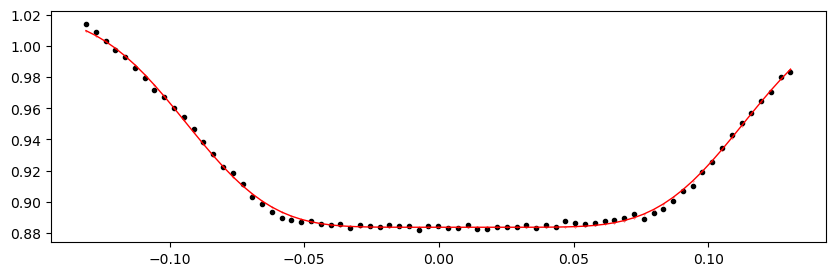

3439.3989671199997 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.59it/s]


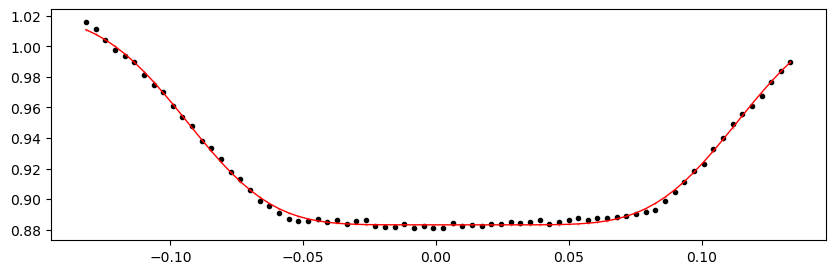

3439.78119664 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.77it/s]


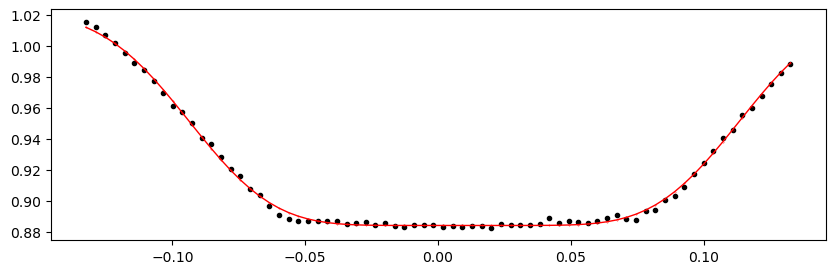

3440.16342616 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.56it/s]


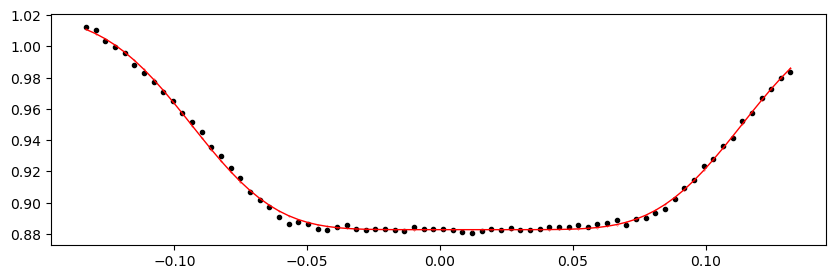

3440.54565568 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.02it/s]


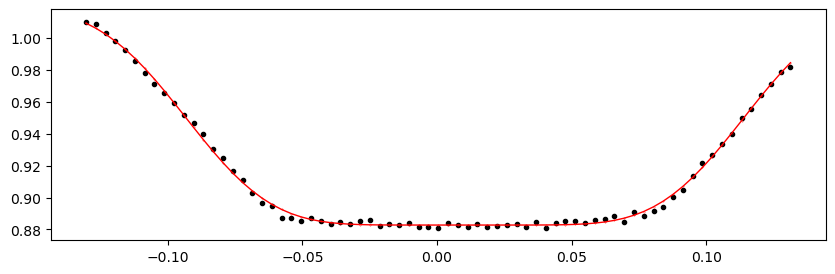

3440.9278851999998 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.81it/s]


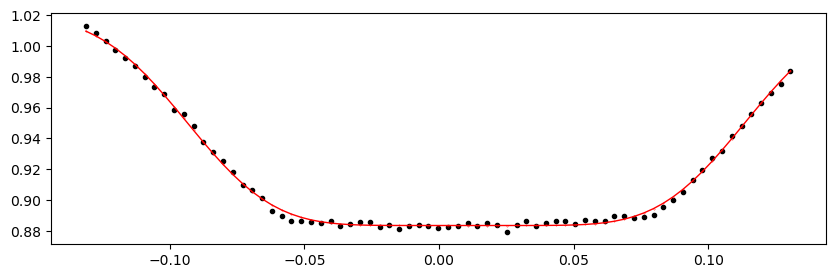

3441.31011472 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.36it/s]


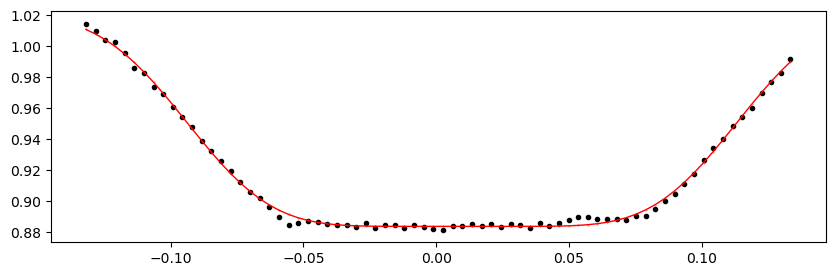

3441.6923442400002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.03it/s]


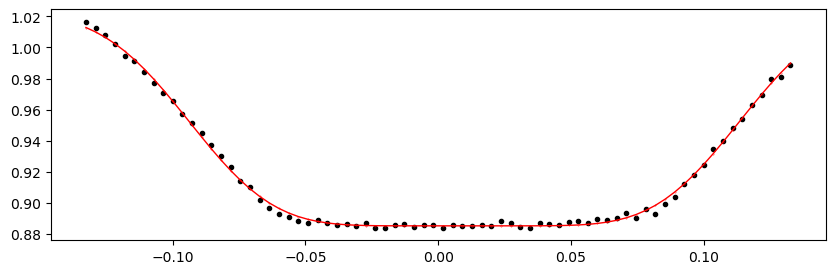

3442.07457376 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.27it/s]


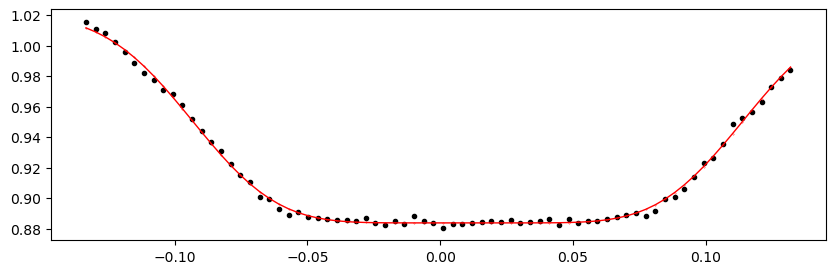

3442.45680328 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.50it/s]


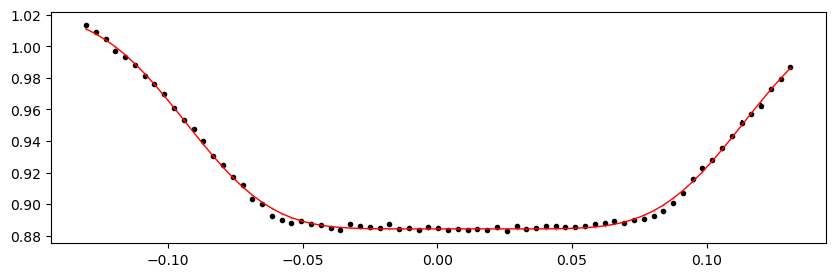

3442.8390328 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.29it/s]


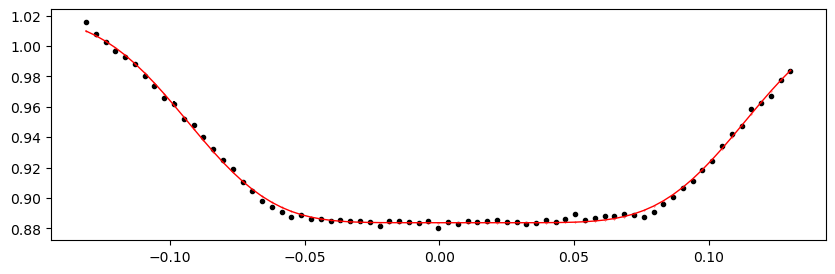

3443.2212623200003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.92it/s]


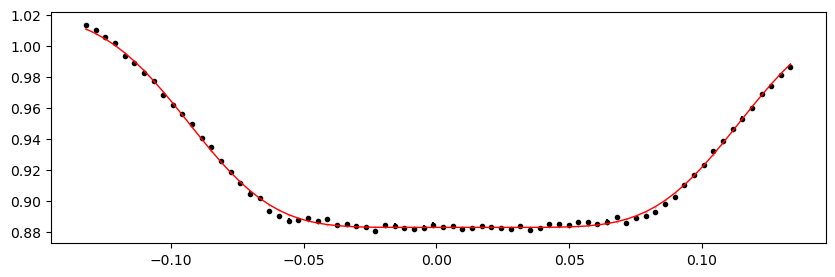

3443.60349184 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.96it/s]


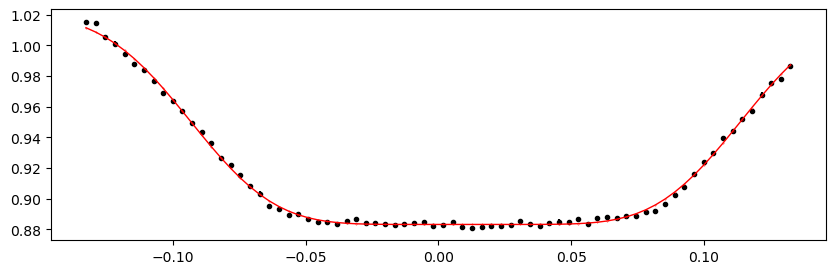

3443.98572136 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.26it/s]


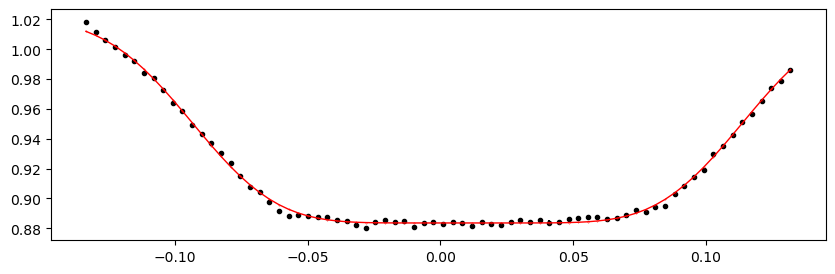

3444.36795088 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.72it/s]


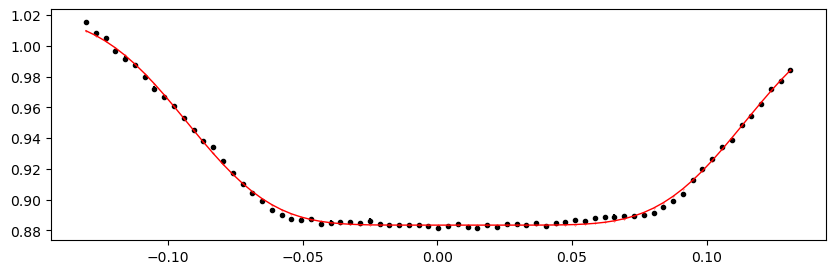

3444.7501804000003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.14it/s]


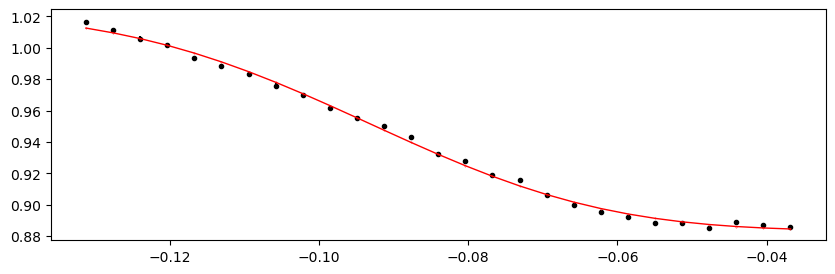

3447.4257870399997 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 299.70it/s]


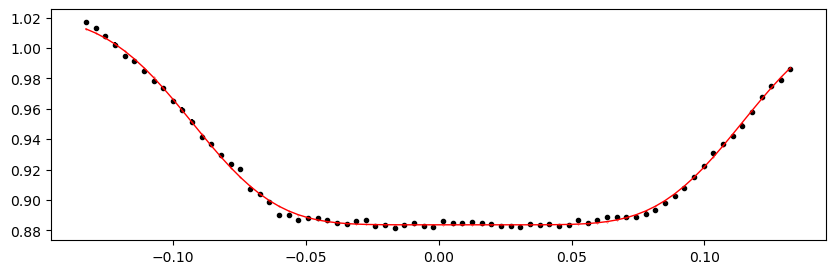

3447.80801656 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.06it/s]


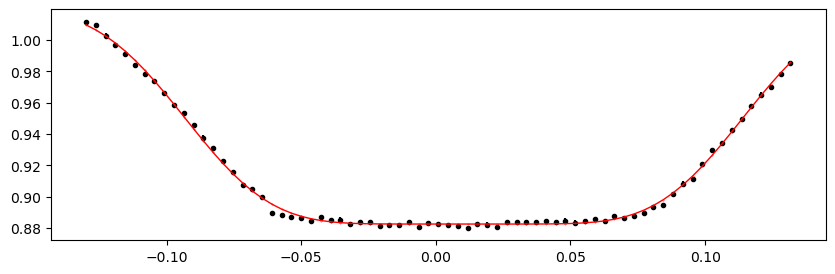

3448.19024608 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.36it/s]


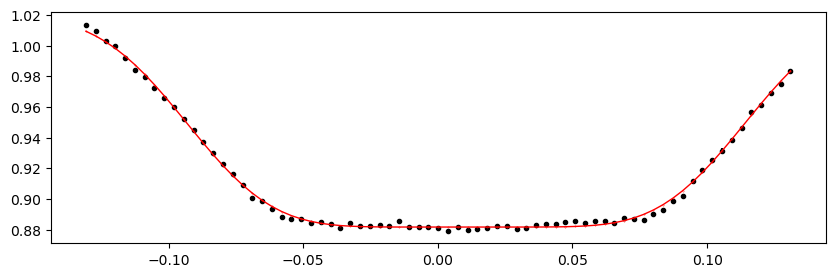

3448.5724756 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.59it/s]


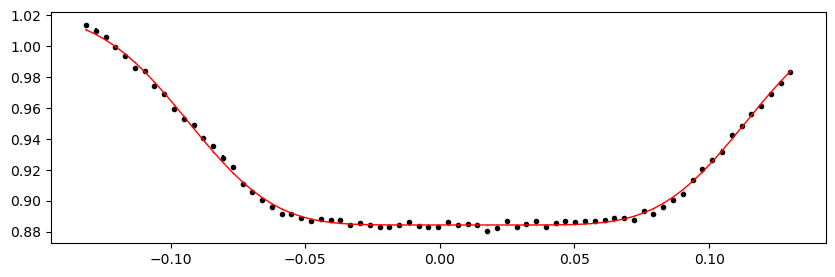

3448.9547051199997 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.35it/s]


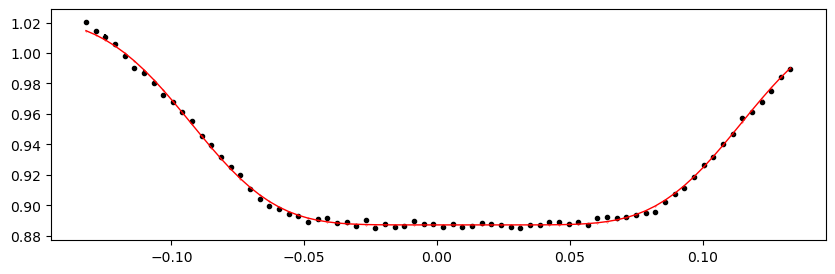

3449.33693464 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.90it/s]


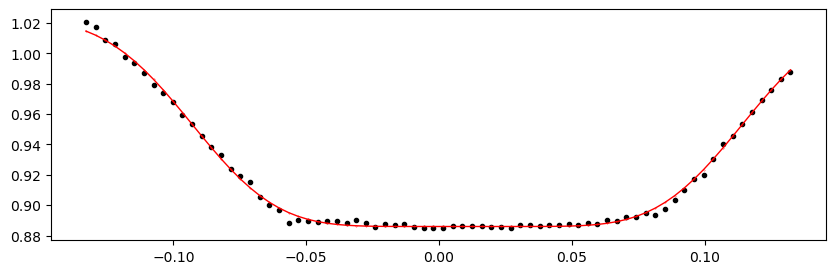

3449.71916416 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.76it/s]


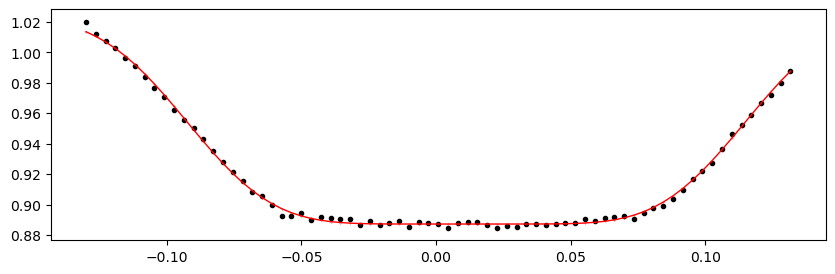

3450.10139368 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.74it/s]


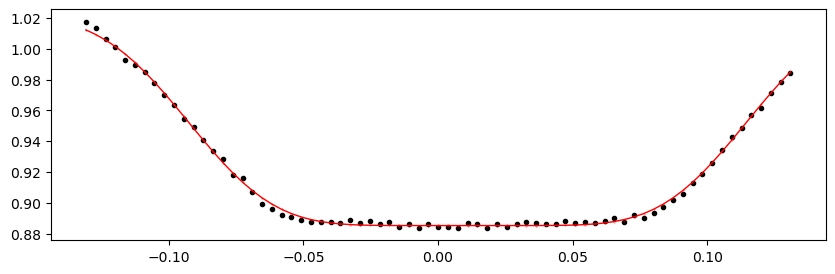

3450.4836232 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.21it/s]


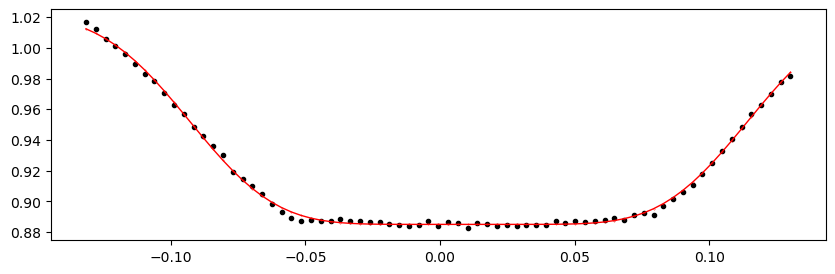

3450.86585272 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.59it/s]


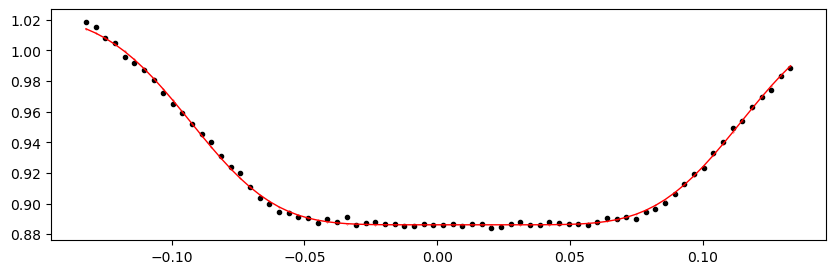

3451.2480822400003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.23it/s]


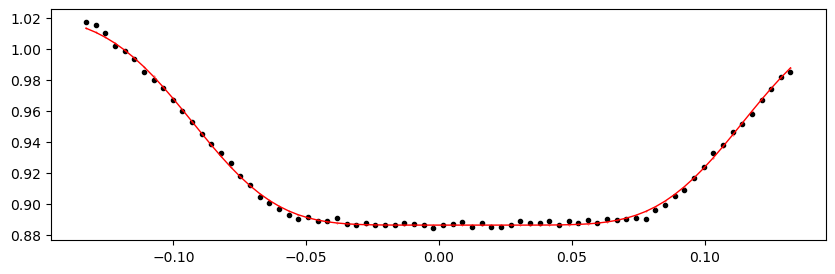

3451.63031176 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.44it/s]


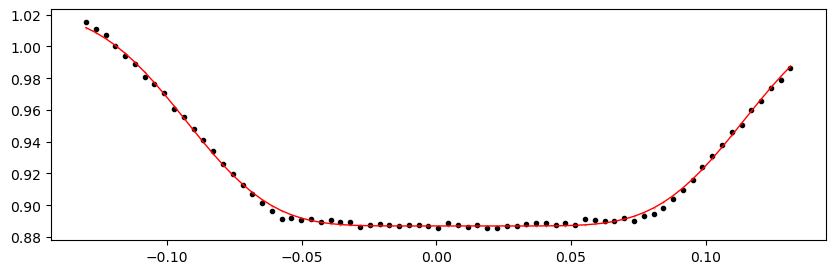

3452.01254128 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.29it/s]


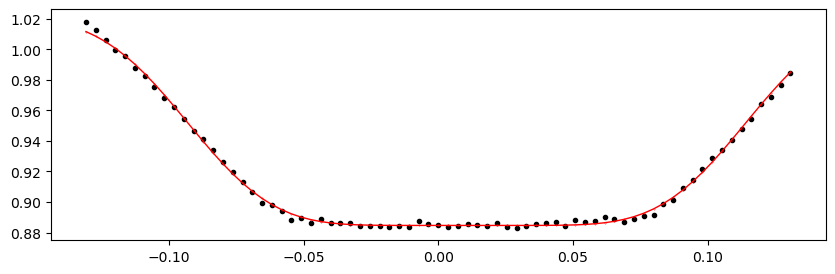

3452.7770003200003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.10it/s]


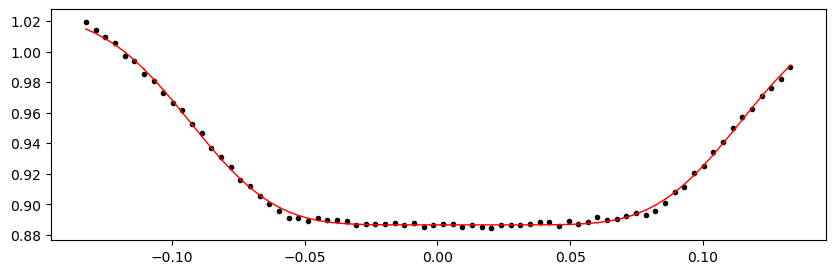

3453.15922984 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.66it/s]


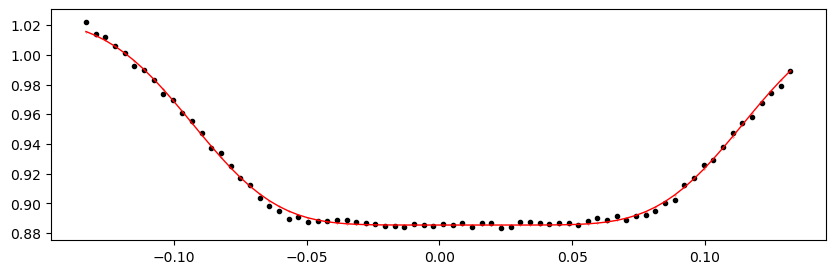

3453.54145936 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.62it/s]


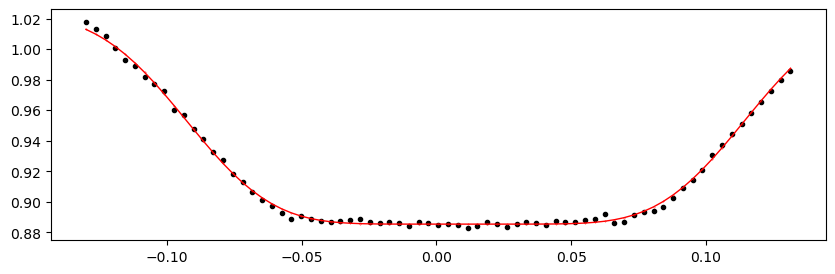

3453.92368888 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.01it/s]


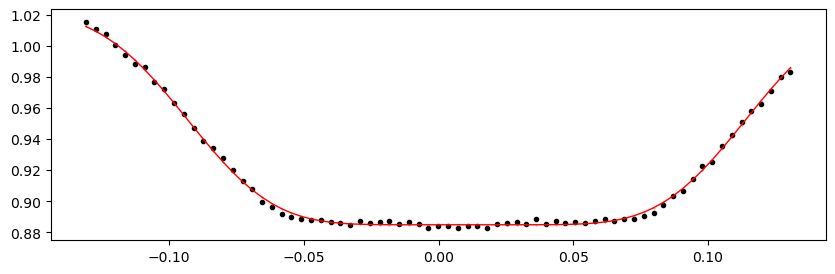

3454.3059184000003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.29it/s]


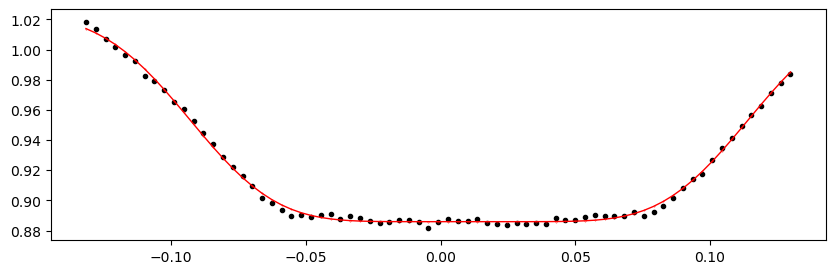

3454.68814792 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.41it/s]


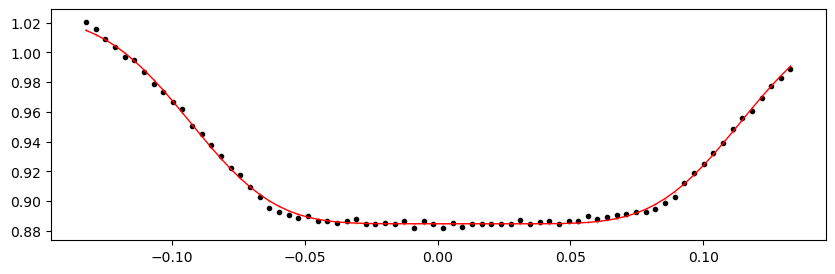

3455.07037744 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.58it/s]


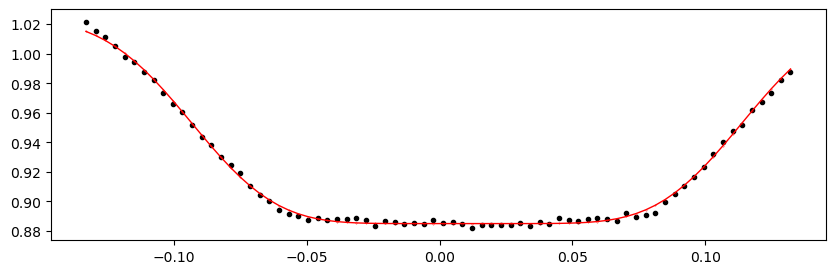

3455.45260696 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.74it/s]


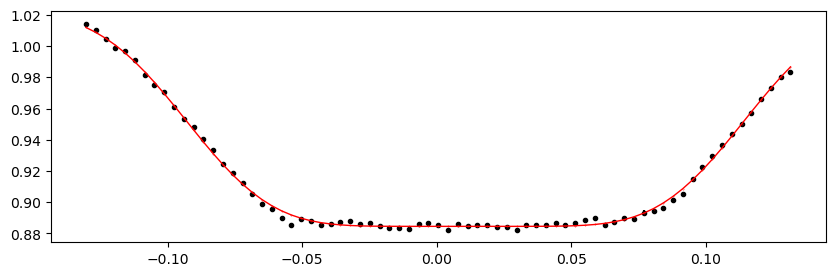

3455.83483648 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.84it/s]


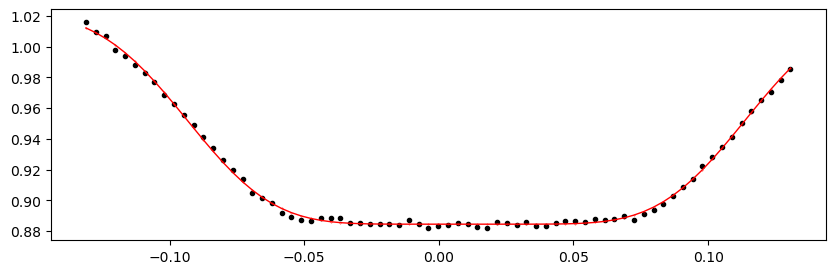

3456.217066 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.12it/s]


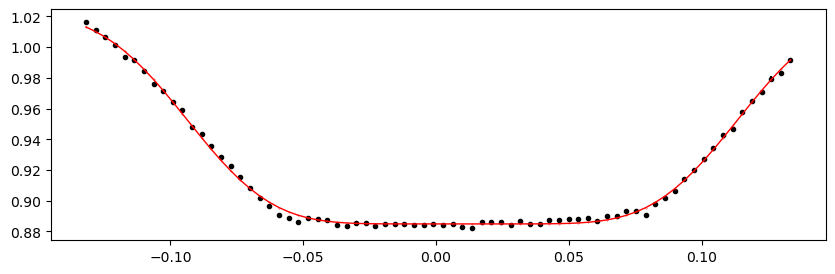

3456.59929552 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.15it/s]


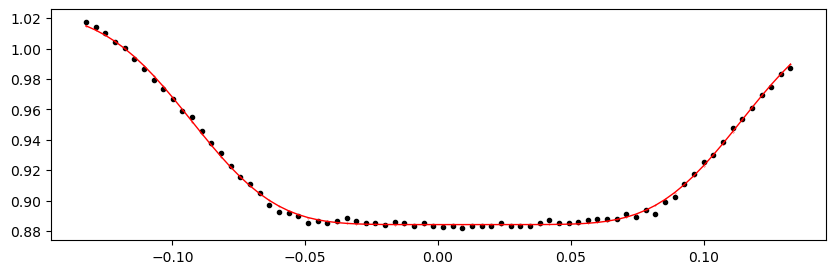

3456.9815250399997 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.29it/s]


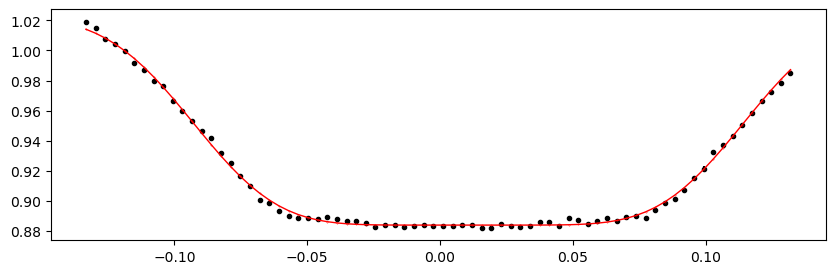

3457.36375456 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.86it/s]


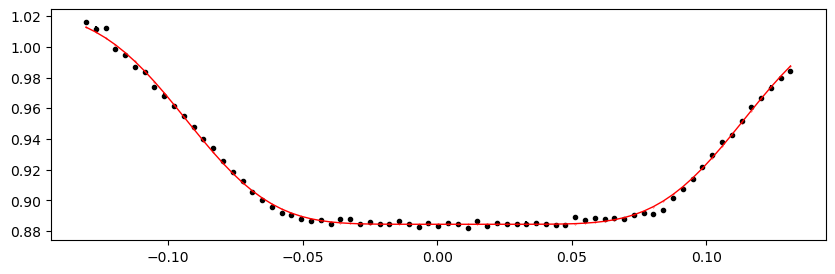

3457.74598408 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.19it/s]


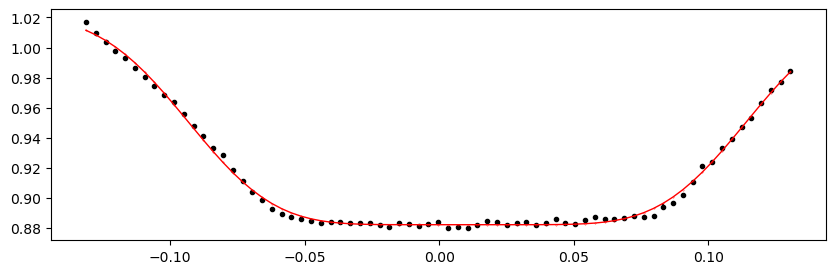

3458.1282136 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.48it/s]


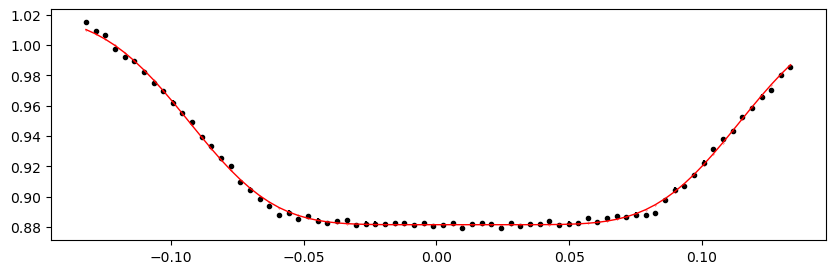

3458.5104431199998 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.54it/s]


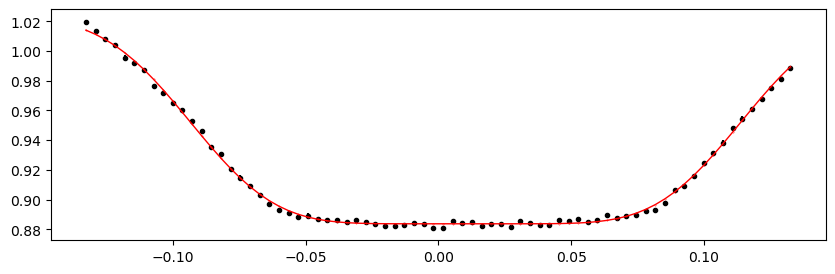

3458.89267264 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.50it/s]


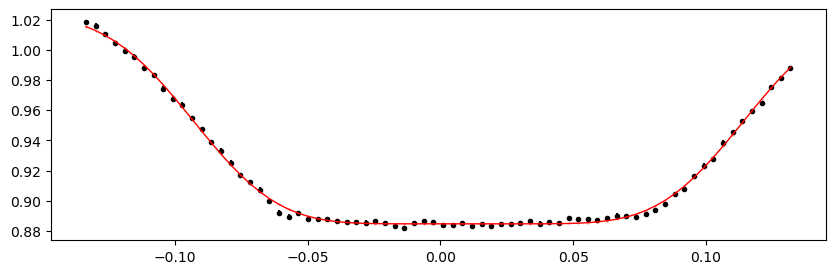

3459.65713168 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.34it/s]


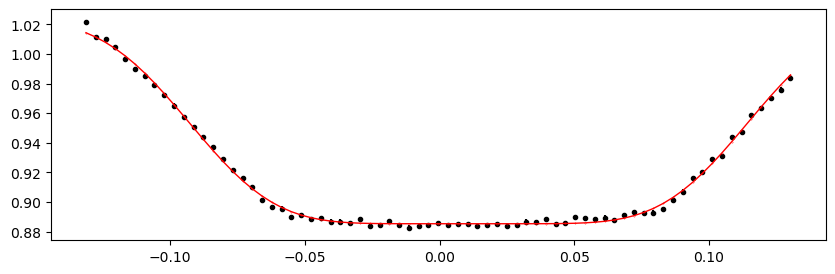

3460.0393612 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.60it/s]


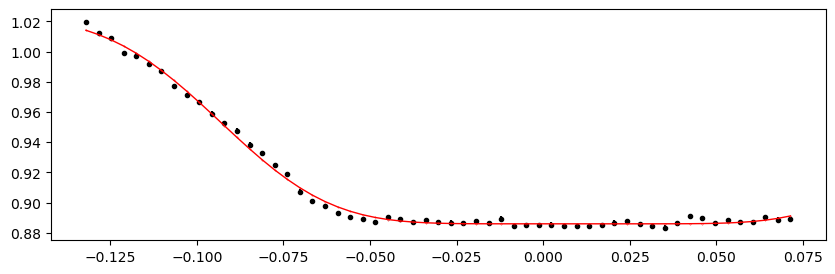

3460.42159072 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.28it/s]


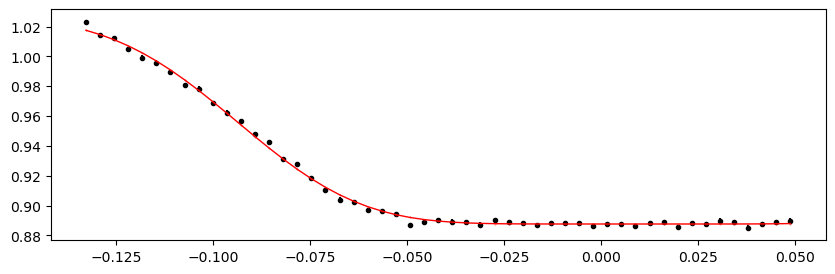

3462.3327383200003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.12it/s]


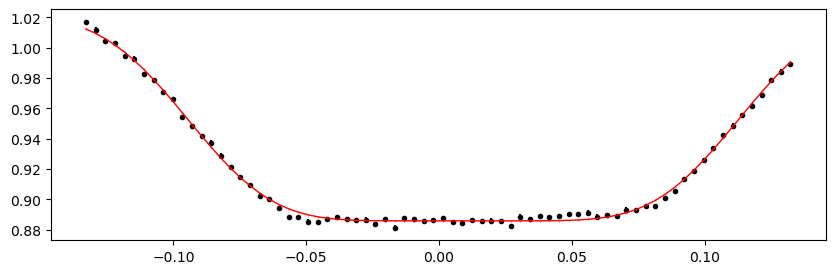

3462.71496784 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.66it/s]


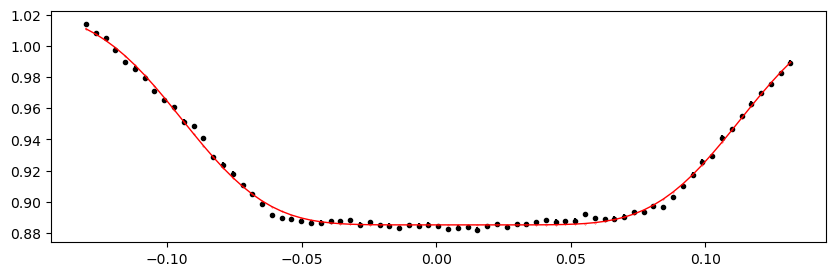

3463.09719736 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.25it/s]


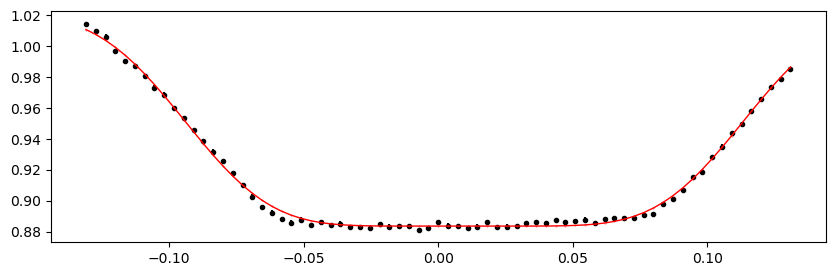

3463.47942688 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.65it/s]


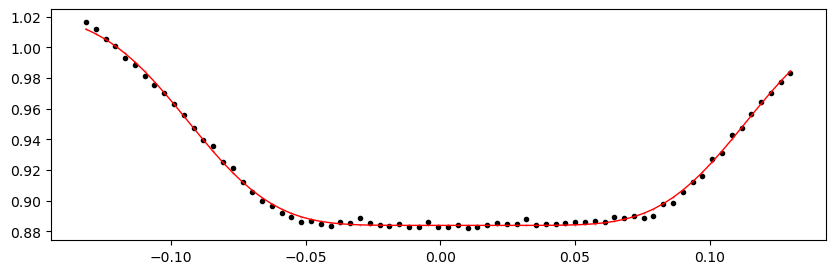

3463.8616564000004 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.94it/s]


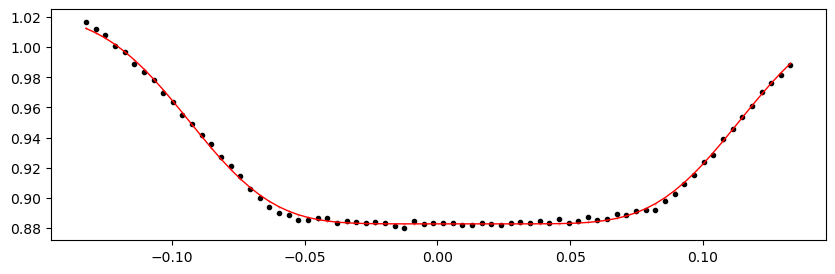

3464.24388592 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.66it/s]


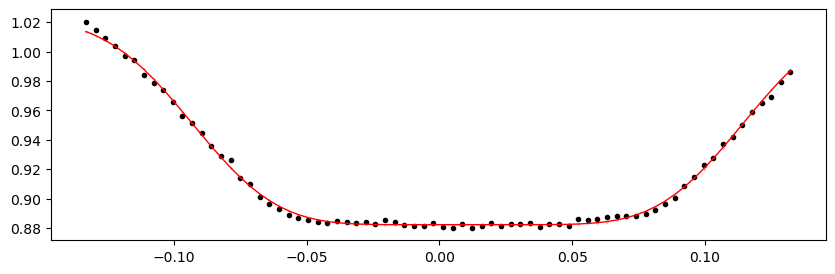

3464.62611544 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:38<00:00, 260.21it/s]


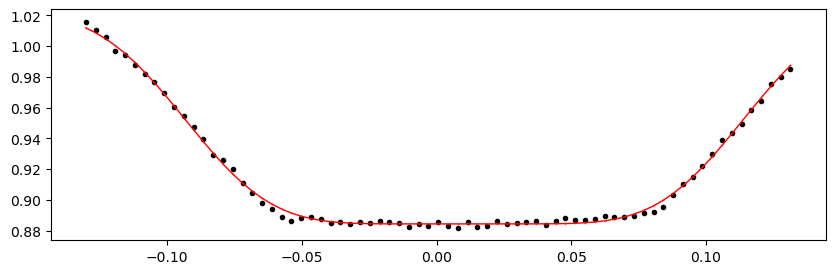

3465.0083449599997 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 291.41it/s]


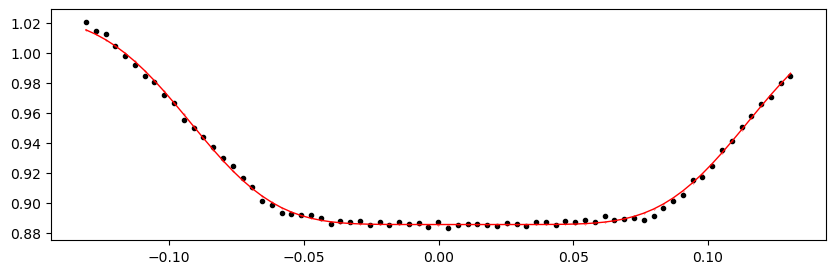

3465.39057448 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 290.87it/s]


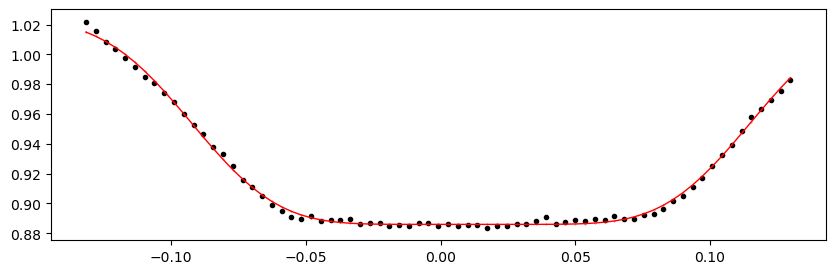

Time 3465.772804 does not have enough data points: 4
3466.15503352 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.15it/s]


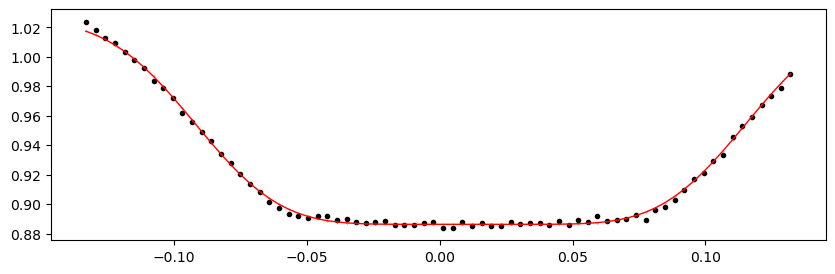

3466.5372630399997 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.00it/s]


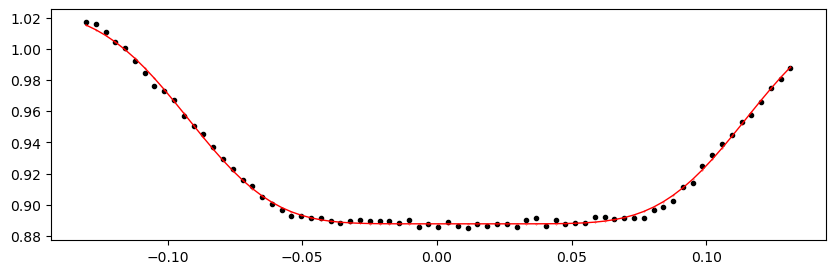

3466.91949256 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.11it/s]


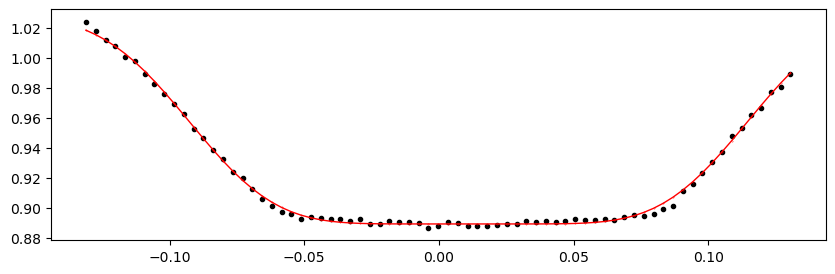

3467.30172208 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.83it/s]


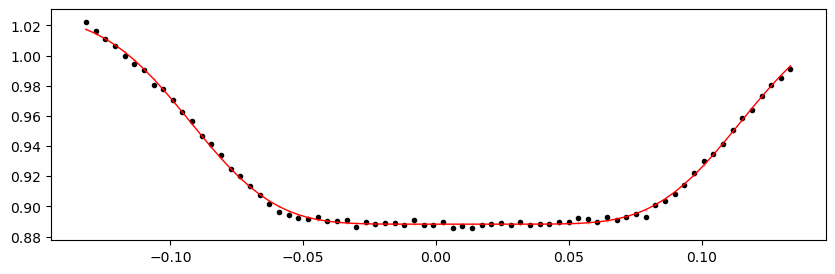

3467.6839516 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.80it/s]


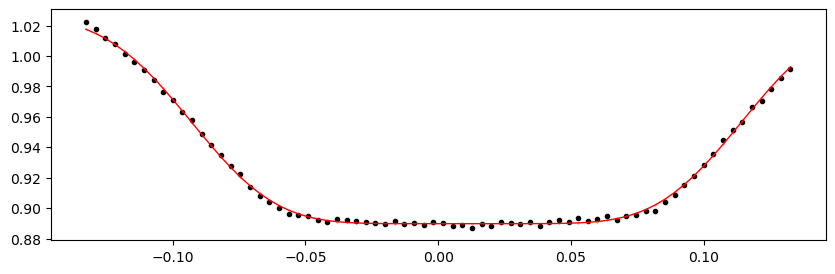

3468.06618112 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.76it/s]


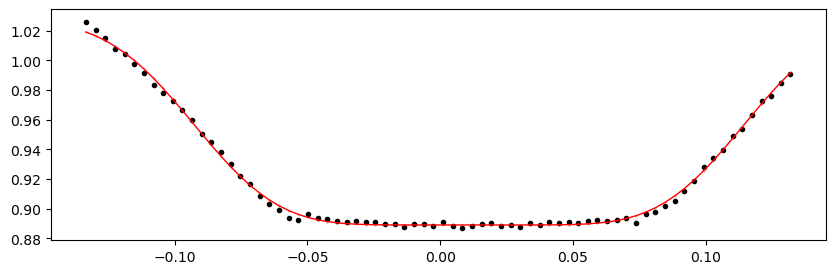

3468.44841064 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.17it/s]


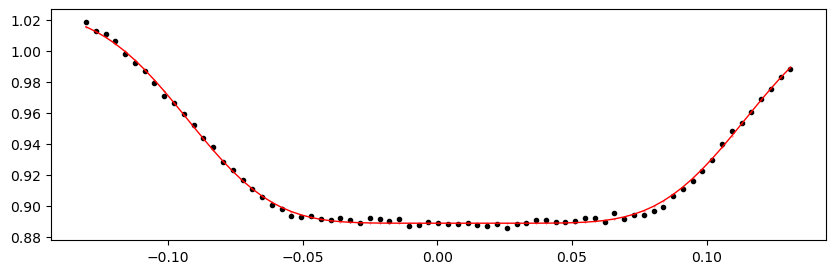

3468.8306401600003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.66it/s]


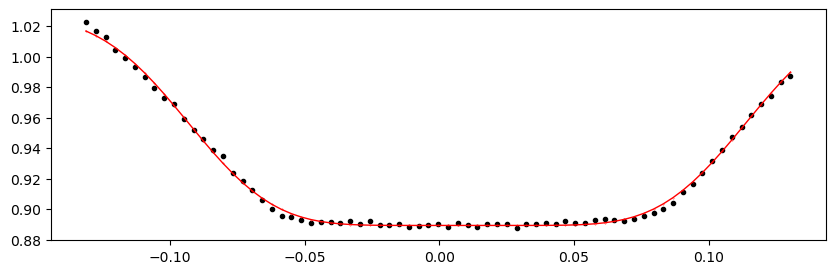

3469.21286968 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.32it/s]


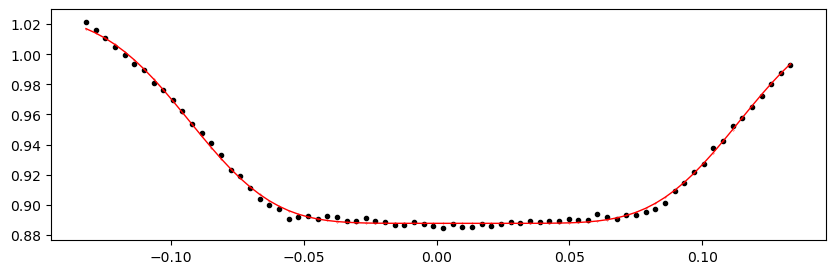

3469.5950992 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.51it/s]


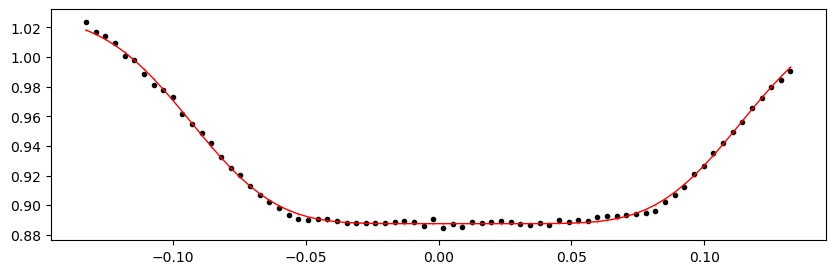

3469.97732872 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.43it/s]


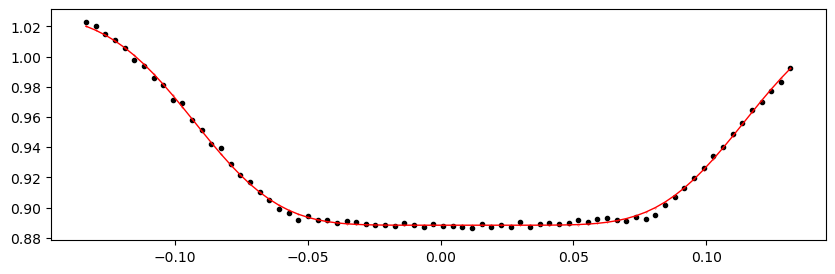

3470.3595582400003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.94it/s]


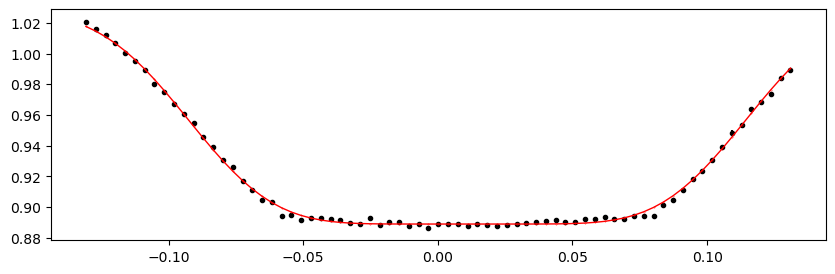

3470.74178776 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.42it/s]


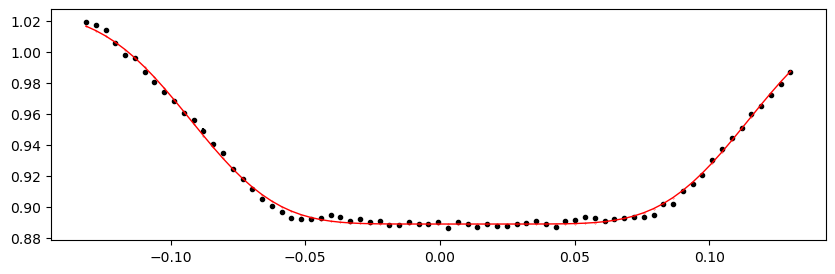

3471.12401728 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.40it/s]


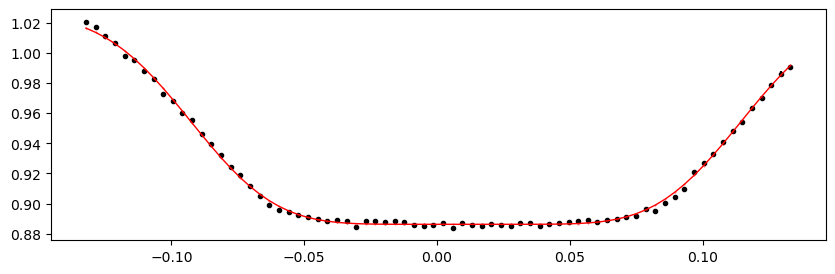

3471.5062468 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.17it/s]


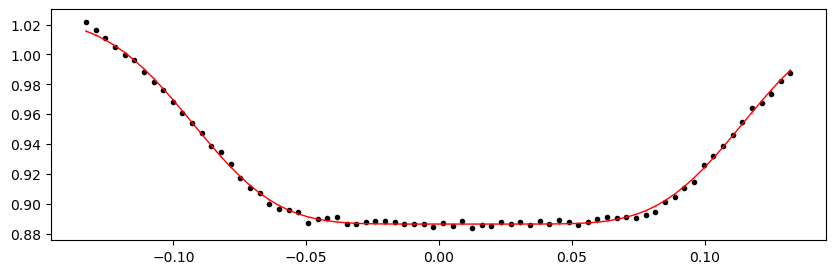

3471.8884763200003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.34it/s]


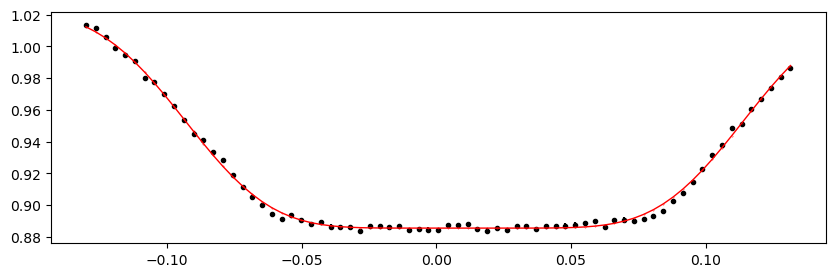

3472.27070584 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.39it/s]


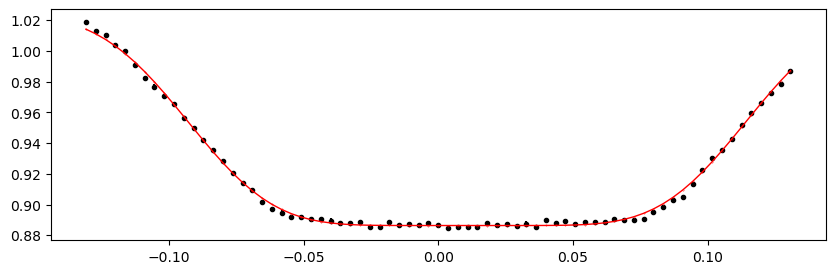

3472.65293536 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.82it/s]


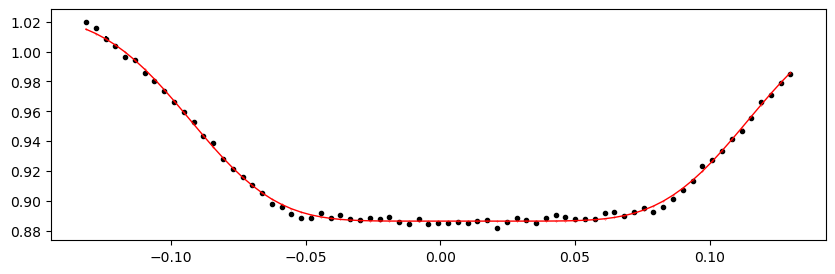

3473.03516488 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.30it/s]


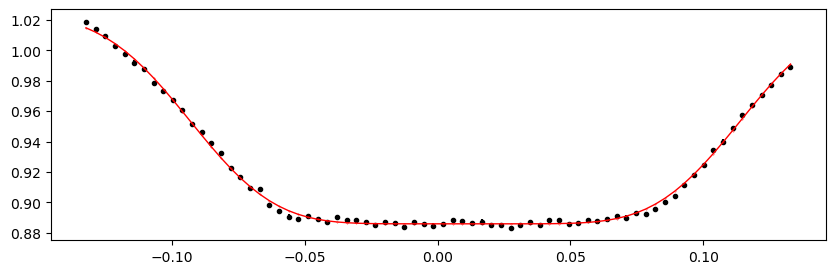

3473.4173944 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.49it/s]


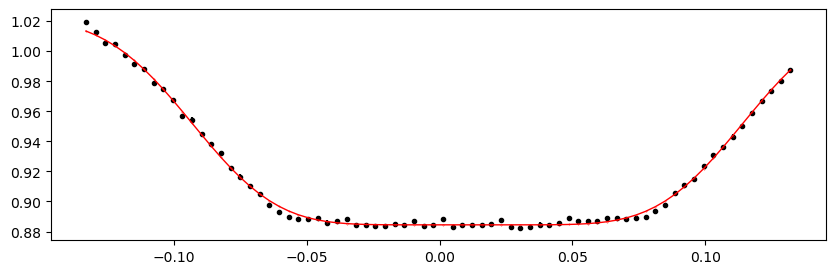

3473.79962392 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.05it/s]


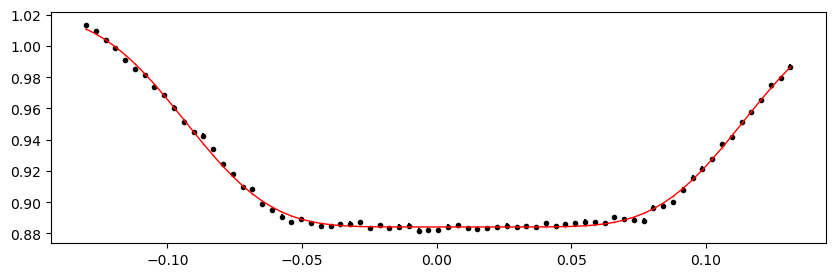

3474.18185344 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.90it/s]


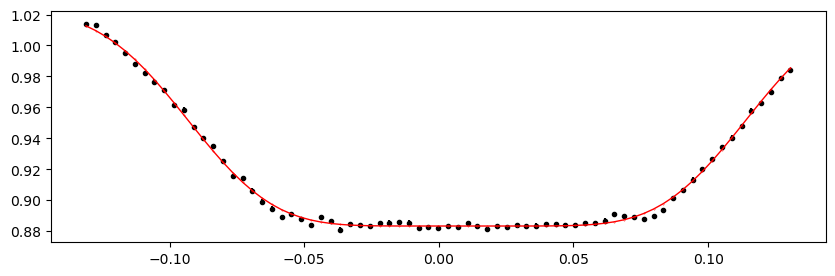

3474.5640829599997 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.32it/s]


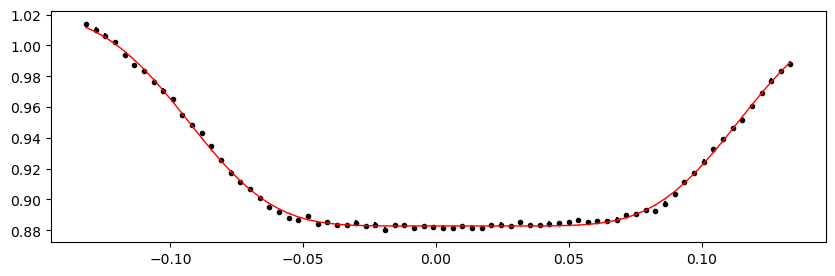

3476.0930010399998 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.14it/s]


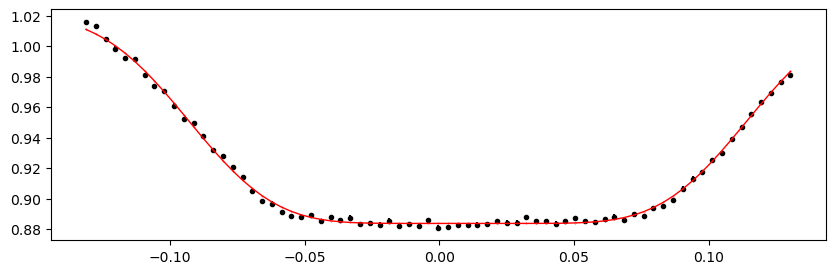

3476.47523056 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.56it/s]


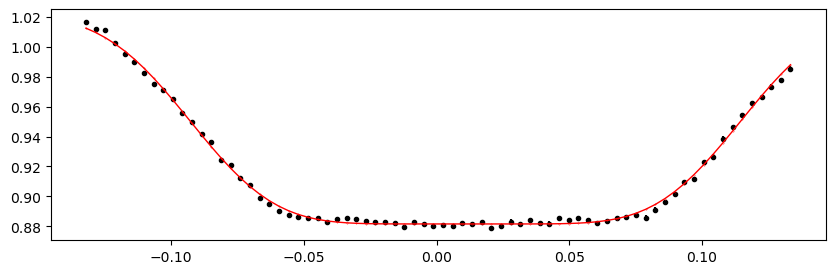

3476.8574600800002 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.76it/s]


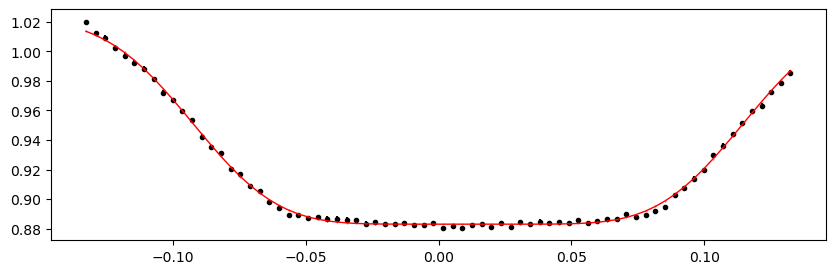

3477.2396896 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.17it/s]


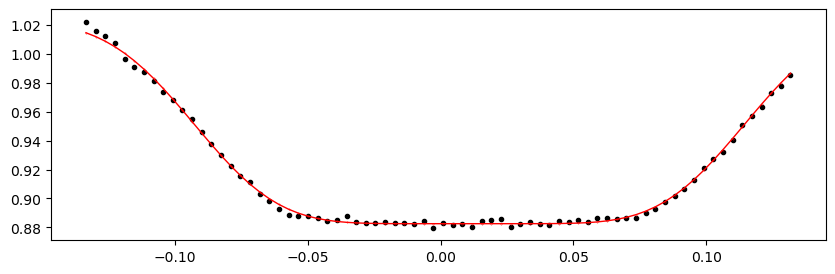

3477.62191912 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.64it/s]


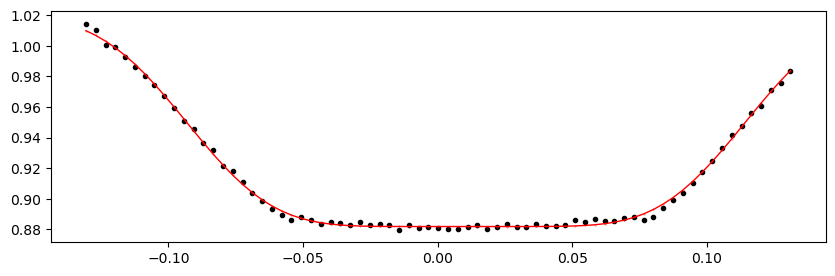

3478.00414864 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.46it/s]


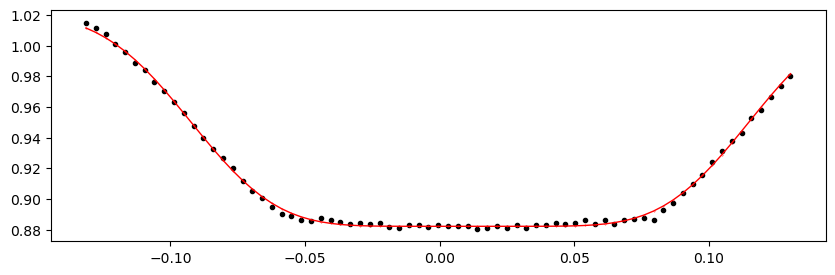

3478.3863781600003 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.13it/s]


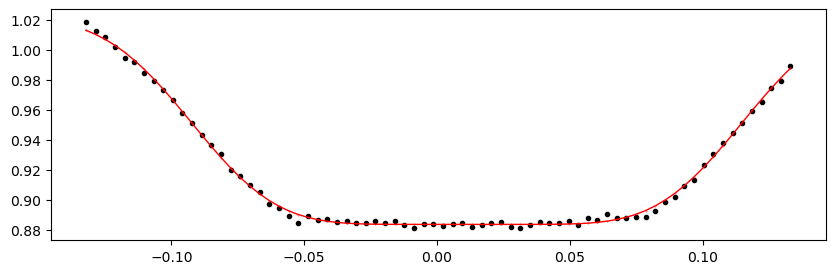

3478.76860768 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.88it/s]


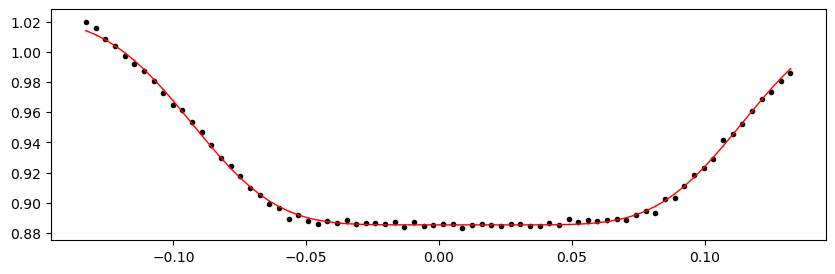

3479.1508372 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.96it/s]


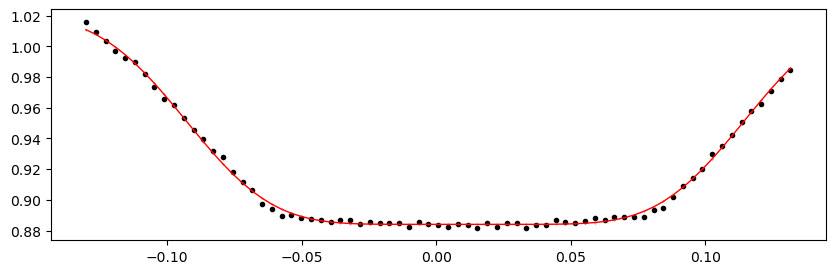

3479.53306672 1.0223868386703832 -0.1365918419658833 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.36it/s]


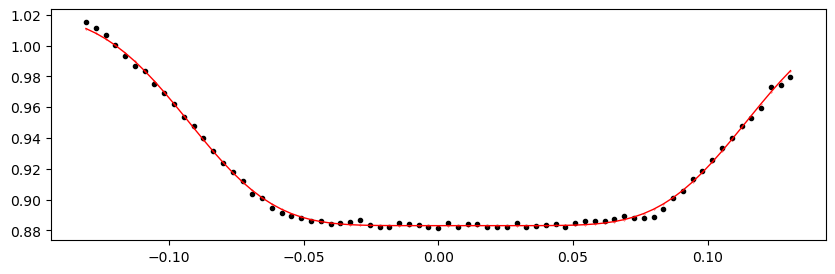

In [74]:
# ---

%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s,
                                   min_number_data=12,  # accomodate TESS-SPOC 10-min cadence data
                                  )
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")

## ETV O-C plot

Note: 1 data points in df_primary filtered out due to huge O-C error.
Note: 0 data points in in_df_secondary filtered out due to huge O-C error.


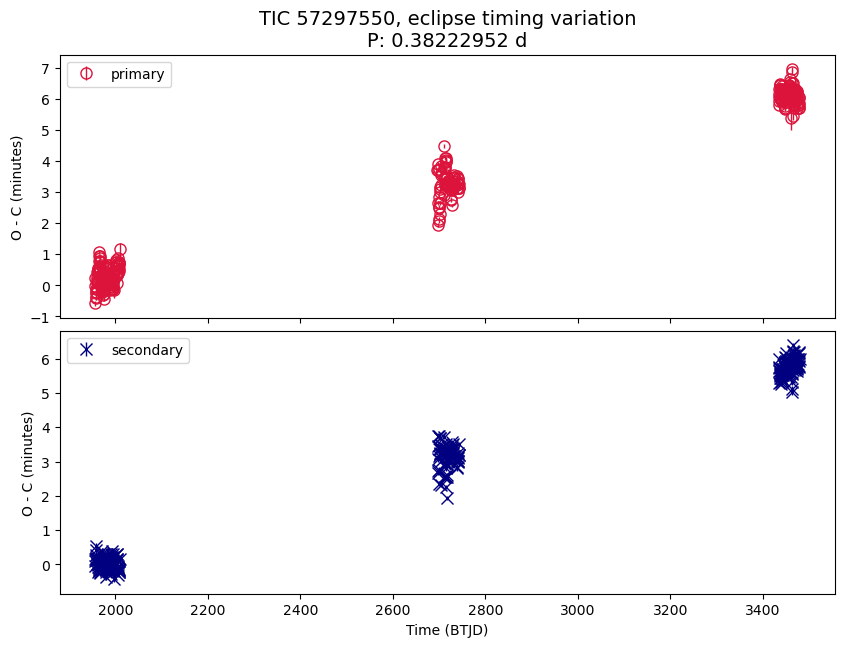

In [79]:
%matplotlib inline
# %matplotlib widget


title_suffix = "eclipse timing variation"

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary_all = in_df_primary  # in case filtering is helpful

in_df_primary = in_df_primary[in_df_primary.std_mins < 1]  # filter out outliers in error
print(f"Note: {len(in_df_primary_all) - len(in_df_primary)} data points in df_primary filtered out due to huge O-C error.")

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              lw = 1, color = 'crimson', )
# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary_all = in_df_secondary  # in case filtering is helpful

    in_df_secondary = in_df_secondary[in_df_secondary.std_mins < 1]  # filter out outliers in error
    print(f"Note: {len(in_df_secondary_all) - len(in_df_secondary)} data points in in_df_secondary filtered out due to huge O-C error.")

    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    # axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = None

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, {title_suffix}\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
# plt.ylim(-3, 8)
plt.show()

### O-C Plot, Zoom In

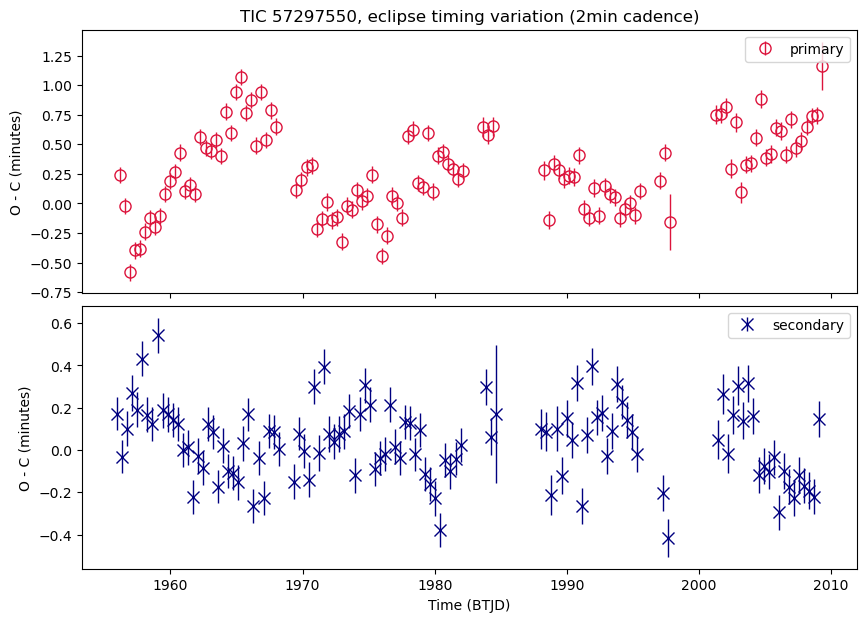

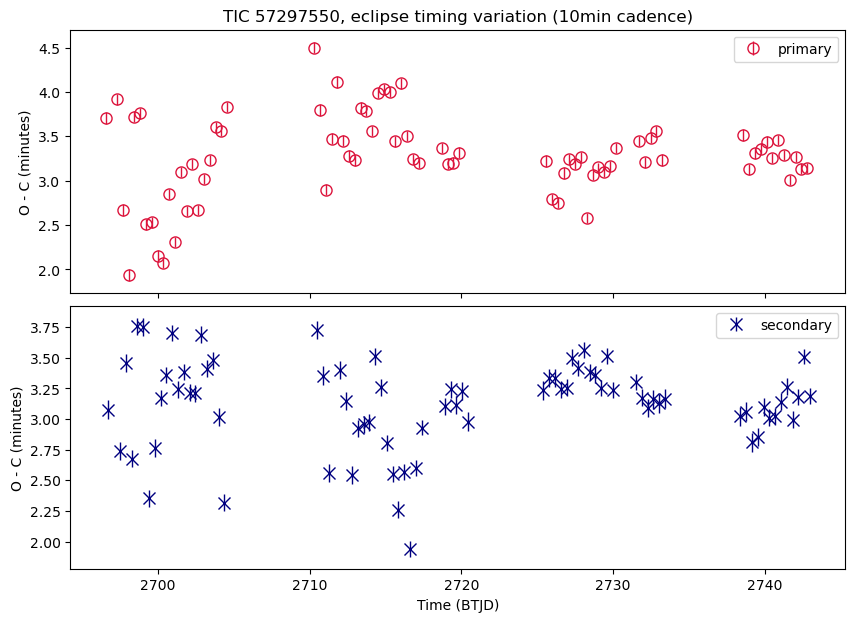

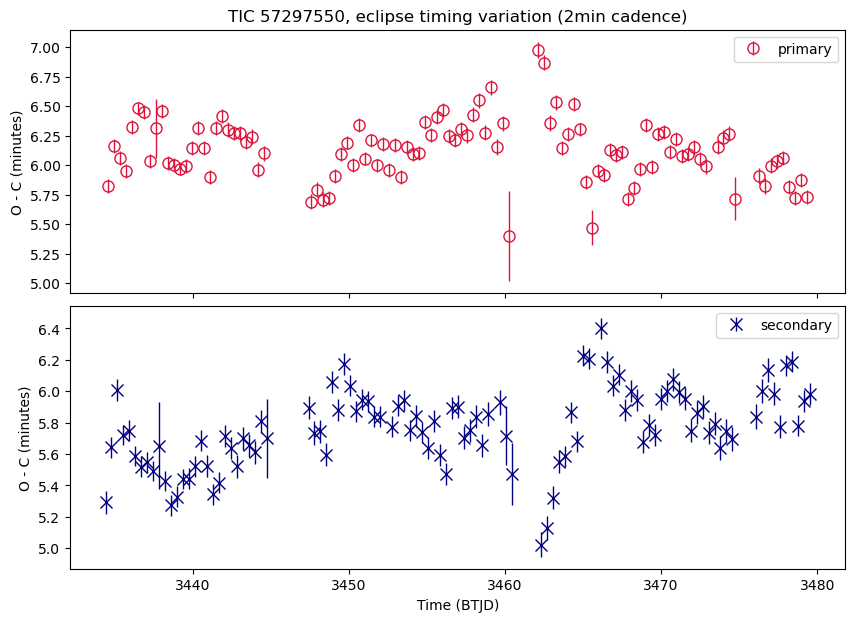

In [80]:
%matplotlib inline
# %matplotlib widget

zoom_ranges = [
    (1950, 2020),
    (2650, 2750),
    (3300, 3500),
]

def tweak_axs_list(axs_list):
    # axs_list[0][1].set_ylim(-20, 30);
    # axs_list[1][0].set_ylim(None, 0.5);
    # axs_list[1][1].set_ylim(-5.5, 2);

    ax = axs_list[0][0]
    ax.set_title(f"{ax.get_title()} (2min cadence)")
    ax = axs_list[1][0]
    ax.set_title(f"{ax.get_title()} (10min cadence)")
    ax = axs_list[2][0]
    ax.set_title(f"{ax.get_title()} (2min cadence)")
    
    pass



def plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges):
    axs_list = []
    for zoom_start, zoom_end in zoom_ranges:
        num_rows = 2 if t0_secondary is not None else 1
        figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5

        fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
        if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
            axs = [axs]

        df_zoom = in_df_primary[(in_df_primary['epoch'] > zoom_start) & (in_df_primary['epoch'] < zoom_end)]

        # axs[0].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
        #                marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
        axs[0].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

        if in_df_secondary is not None:
            df_zoom = in_df_secondary[(in_df_secondary['epoch'] > zoom_start) & (in_df_secondary['epoch'] < zoom_end)]

            # axs[1].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
            #                marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
            axs[1].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                            lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

        for ax in axs:
            ax.set_ylabel("O - C (minutes)")
            ax.legend();

        axs[-1].set_xlabel("Time (BTJD)")
        axs[0].set_title(f"TIC {ticid}, {title_suffix}", fontsize=14)

        plt.subplots_adjust(hspace=0.05)
        axs_list.append(axs)
    return axs_list


axs_list = plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges)
tweak_axs_list(axs_list);

## make a periodogram 

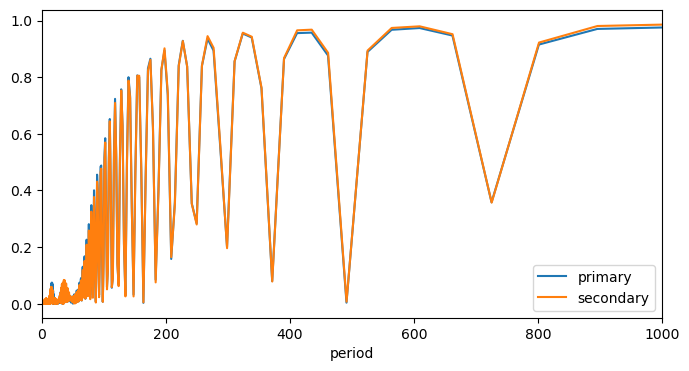

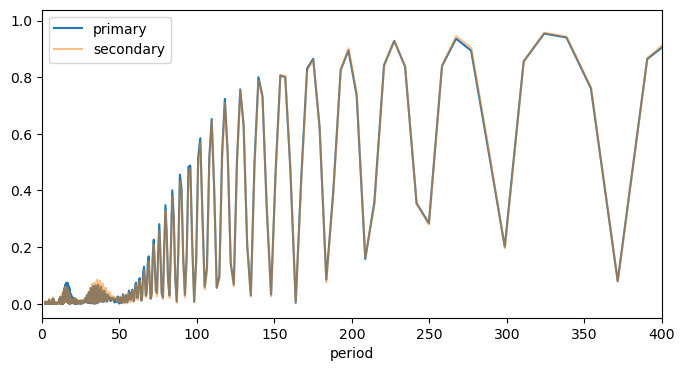

In [83]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(8, 4))

plt.plot(1/frequency, power, label = 'primary')    

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.xlim(0, 1000)
plt.show()


if True:
    fig, ax = plt.subplots(figsize=(8, 4))
    
    plt.plot(1/frequency, power, label = 'primary')    
    
    if t0_secondary is not None:
        frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
        plt.plot(1/frequency_s, power_s, label = 'secondary', alpha=0.5)    
    
    plt.xlabel("period")
    
    plt.legend()
    plt.xlim(0, 400)  # Gaia has a SB with ~292 d period 
    plt.show()

## O-C plot, folded

- for periodic trend in O-C

In [85]:
def truncate_freq_power_to_period_range(freq, power, period_min, period_max):
    f, p = freq, power
    if period_min is not None:
        f, p = f[f < 1 / period_min], p[f < 1 / period_min]
    if period_max is not None:
        f, p = f[f > 1 / period_max], p[f >  1 / period_max]
    return f, p


def plot_oc_folded(period_min=None, period_max=None, period_min_s=None, period_max_s=None, period=None, period_s=None):

    if period is None:
        _f, _p = truncate_freq_power_to_period_range(frequency, power, period_min, period_max)
        period = 1 / _f[np.argmax(_p)]
    phase_oc = etv_functions.phase_data(in_df_primary.epoch, 0, period)

    fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y * 1.1), sharex=False)
    if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
        axs = [axs]
    
    axs[0].scatter(phase_oc, in_df_primary.shift_mins, marker = 'o', s=12**2, c=in_df_primary.epoch);
    axs[0].errorbar(phase_oc, in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
                    lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'None', label="primary")
    axs[0].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period:.4f} d", fontsize=14)

    if in_df_secondary is not None:
        if period_s is None:
            _f, _p = truncate_freq_power_to_period_range(frequency_s, power_s, period_min_s, period_max_s)
            period_s= 1 / _f[np.argmax(_p)]
        phase_oc_s = etv_functions.phase_data(in_df_secondary.epoch, 0, period_s)
        axs[1].scatter(phase_oc_s, in_df_secondary.shift_mins, marker = 'o',  s=12**2, c=in_df_secondary.epoch);
        axs[1].errorbar(phase_oc_s, in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color='None', ecolor='navy', markeredgecolor = 'None', label="secondary" );
        axs[1].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period_s:.4f} d", fontsize=14)

    for ax in axs:
        ax.set_ylabel("O - C (minutes)")
        ax.set_xlabel("Phase (Normalized)")
        ax.legend();
    plt.subplots_adjust(hspace=0.4)
    return axs

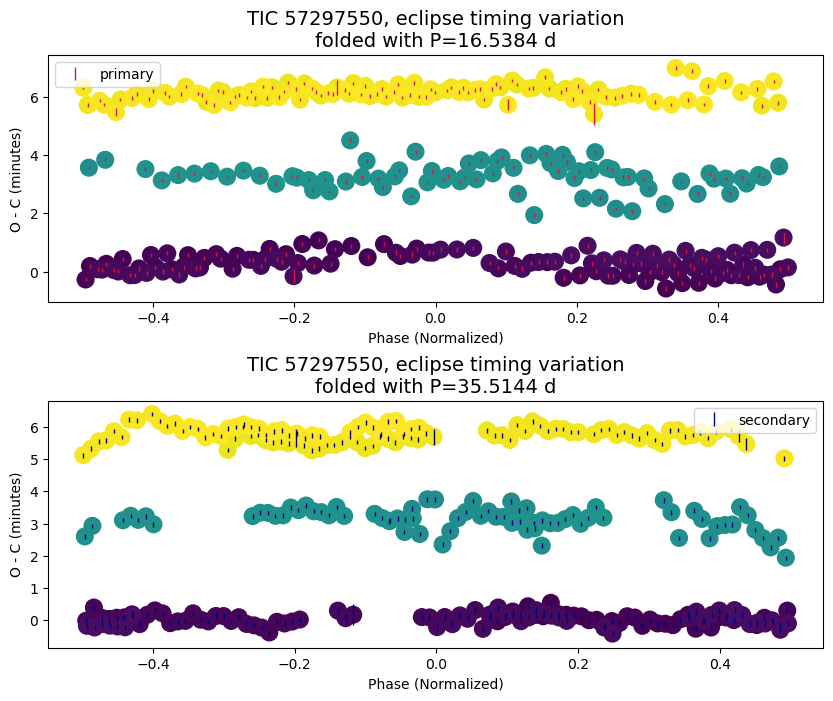

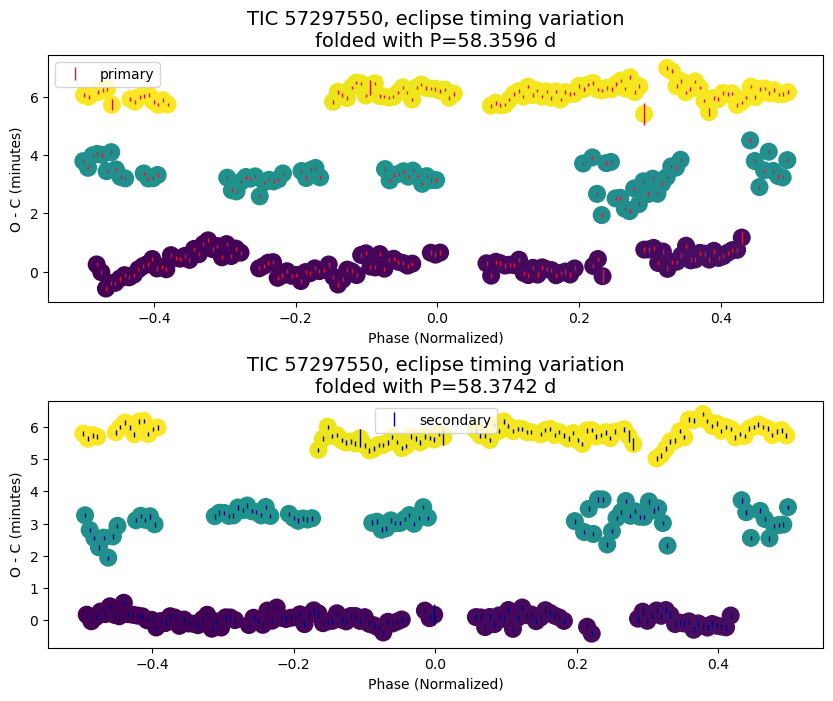

In [86]:
%matplotlib inline
# %matplotlib widget

if True:  # plot O-C periodic trend by folding with a period (from LS Periodogram by default)
    def tweak_axs(axs):
        pass

    axs = plot_oc_folded(
        period_min=None, period_max=50,
        period_min_s=None, period_max_s=50
    )
    
    axs = plot_oc_folded(
        period_min=50, period_max=60,
        period_min_s=50, period_max_s=60,
    )

    # tweak_axs(axs)

## Results Summary

In [87]:
# FILL-IN the ETV results / comments
has_etv = "Y?"
comments = "2005 paper period variation: showed the 2005 paper period is no longer accurate (too smalll as predicted in the paper). The anti-correlated primary - secondary O-C is still there.  Original note: Mightbe long-term (~800 d) change  with ampltiude <3 min. The trend of primary is opposite of the one of secondary. Mightbe a O-C period of ~21 d. 4 sectors of 2min cadence + 2 sectors of 10min cadence. [D_no_ingress]"

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,57297550
has_etv,Y?
comments,2005 paper period variation: showed the 2005 paper period is no longer accurate (too smalll as predicted in the paper). The anti-correlated primary - secondary O-C is still there. Original note: Mightbe long-term (~800 d) change with ampltiude <3 min. The trend of primary is opposite of the one of secondary. Mightbe a O-C period of ~21 d. 4 sectors of 2min cadence + 2 sectors of 10min cadence. [D_no_ingress]
period,0.38223
depth_pct_p,18.38
depth_pct_s,13.66
epoch_p,1956.157315
epoch_s,1955.9662
num_sectors,6
time_span,1523.88



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
57297550,Y?,2005 paper period variation: showed the 2005 paper period is no longer accurate (too smalll as predicted in the paper). The anti-correlated primary - secondary O-C is still there.  Original note: Mightbe long-term (~800 d) change  with ampltiude <3 min. The trend of primary is opposite of the one of secondary. Mightbe a O-C period of ~21 d. 4 sectors of 2min cadence + 2 sectors of 10min cadence. [D_no_ingress],0.38222952,18.38,13.66,1956.15731476,1955.9662,6,1523.88,1955.8,3479.68

